In [82]:
import torch 
from torch import nn,optim
from torch.autograd.variable import Variable
from torchvision import transforms,datasets

# device = 'cuda' if torch.cuda.is_available() else 'cpu'
device = 'cuda'

In [83]:
import os
import numpy as np
import errno
import torchvision.utils as vutils
from tensorboardX import SummaryWriter
from IPython import display
from matplotlib import pyplot as plt


'''
    TensorBoard Data will be stored in './runs' path
'''


class Logger:

    def __init__(self, model_name, data_name):
        self.model_name = model_name
        self.data_name = data_name

        self.comment = '{}_{}'.format(model_name, data_name)
        self.data_subdir = '{}/{}'.format(model_name, data_name)

        # TensorBoard
        self.writer = SummaryWriter(comment=self.comment)

    def log(self, d_error, g_error, epoch, n_batch, num_batches):

        # var_class = torch.autograd.variable.Variable
        if isinstance(d_error, torch.autograd.Variable):
            d_error = d_error.data.cpu().numpy()
        if isinstance(g_error, torch.autograd.Variable):
            g_error = g_error.data.cpu().numpy()

        step = Logger._step(epoch, n_batch, num_batches)
        self.writer.add_scalar(
            '{}/D_error'.format(self.comment), d_error, step)
        self.writer.add_scalar(
            '{}/G_error'.format(self.comment), g_error, step)

    def log_images(self, images, num_images, epoch, n_batch, num_batches, format='NCHW', normalize=True):
        '''
        input images are expected in format (NCHW)
        '''
        if type(images) == np.ndarray:
            images = torch.from_numpy(images)
        
        if format=='NHWC':
            images = images.transpose(1,3)
        

        step = Logger._step(epoch, n_batch, num_batches)
        img_name = '{}/images{}'.format(self.comment, '')

        # Make horizontal grid from image tensor
        horizontal_grid = vutils.make_grid(
            images, normalize=normalize, scale_each=True)
        # Make vertical grid from image tensor
        nrows = int(np.sqrt(num_images))
        grid = vutils.make_grid(
            images, nrow=nrows, normalize=True, scale_each=True)

        # Add horizontal images to tensorboard
        self.writer.add_image(img_name, horizontal_grid, step)

        # Save plots
        self.save_torch_images(horizontal_grid, grid, epoch, n_batch)

    def save_torch_images(self, horizontal_grid, grid, epoch, n_batch, plot_horizontal=True):
        out_dir = './data/images/{}'.format(self.data_subdir)
        Logger._make_dir(out_dir)

        # Plot and save horizontal
        fig = plt.figure(figsize=(16, 16))
        plt.imshow(np.moveaxis(horizontal_grid.numpy(), 0, -1))
        plt.axis('off')
        if plot_horizontal:
            display.display(plt.gcf())
        self._save_images(fig, epoch, n_batch, 'hori')
        plt.close()

        # Save squared
        fig = plt.figure()
        plt.imshow(np.moveaxis(grid.numpy(), 0, -1))
        plt.axis('off')
        self._save_images(fig, epoch, n_batch)
        plt.close()

    def _save_images(self, fig, epoch, n_batch, comment=''):
        out_dir = './data/images/{}'.format(self.data_subdir)
        Logger._make_dir(out_dir)
        fig.savefig('{}/{}_epoch_{}_batch_{}.png'.format(out_dir,
                                                         comment, epoch, n_batch))

    def display_status(self, epoch, num_epochs, n_batch, num_batches, d_error, g_error, d_pred_real, d_pred_fake):
        
        # var_class = torch.autograd.variable.Variable
        if isinstance(d_error, torch.autograd.Variable):
            d_error = d_error.data.cpu().numpy()
        if isinstance(g_error, torch.autograd.Variable):
            g_error = g_error.data.cpu().numpy()
        if isinstance(d_pred_real, torch.autograd.Variable):
            d_pred_real = d_pred_real.data
        if isinstance(d_pred_fake, torch.autograd.Variable):
            d_pred_fake = d_pred_fake.data
        
        
        print('Epoch: [{}/{}], Batch Num: [{}/{}]'.format(
            epoch,num_epochs, n_batch, num_batches)
             )
        print('Discriminator Loss: {:.4f}, Generator Loss: {:.4f}'.format(d_error, g_error))
        print('D(x): {:.4f}, D(G(z)): {:.4f}'.format(d_pred_real.mean(), d_pred_fake.mean()))

    def save_models(self, generator, discriminator, epoch):
        out_dir = './data/models/{}'.format(self.data_subdir)
        Logger._make_dir(out_dir)
        torch.save(generator.state_dict(),
                   '{}/G_epoch_{}'.format(out_dir, epoch))
        torch.save(discriminator.state_dict(),
                   '{}/D_epoch_{}'.format(out_dir, epoch))

    def close(self):
        self.writer.close()

    # Private Functionality

    @staticmethod
    def _step(epoch, n_batch, num_batches):
        return epoch * num_batches + n_batch

    @staticmethod
    def _make_dir(directory):
        try:
            os.makedirs(directory)
        except OSError as e:
            if e.errno != errno.EEXIST:
                raise

In [193]:
def mnist_dataset():
    compose = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize((0.5),(0.5)),
        ])
    outdir = './dataset'
    return datasets.MNIST(root=outdir,train=True,transform=compose,download=True)

data = mnist_dataset()


In [194]:
data_loader = torch.utils.data.DataLoader(data,batch_size=100,shuffle=True)


In [183]:
next(iter(data_loader))[0][0]

tensor([[[-0.4000, -0.4000, -0.4000, -0.4000, -0.4000, -0.4000, -0.4000,
          -0.4000, -0.4000, -0.4000, -0.4000, -0.4000, -0.4000, -0.4000,
          -0.4000, -0.4000, -0.4000, -0.4000, -0.4000, -0.4000, -0.4000,
          -0.4000, -0.4000, -0.4000, -0.4000, -0.4000, -0.4000, -0.4000],
         [-0.4000, -0.4000, -0.4000, -0.4000, -0.4000, -0.4000, -0.4000,
          -0.4000, -0.4000, -0.4000, -0.4000, -0.4000, -0.4000, -0.4000,
          -0.4000, -0.4000, -0.4000, -0.4000, -0.4000, -0.4000, -0.4000,
          -0.4000, -0.4000, -0.4000, -0.4000, -0.4000, -0.4000, -0.4000],
         [-0.4000, -0.4000, -0.4000, -0.4000, -0.4000, -0.4000, -0.4000,
          -0.4000, -0.4000, -0.4000, -0.4000, -0.4000, -0.4000, -0.4000,
          -0.4000, -0.4000, -0.4000, -0.4000, -0.4000, -0.4000, -0.4000,
          -0.4000, -0.4000, -0.4000, -0.4000, -0.4000, -0.4000, -0.4000],
         [-0.4000, -0.4000, -0.4000, -0.4000, -0.4000, -0.4000, -0.4000,
          -0.4000, -0.4000, -0.4000, -0.4000, -0

In [211]:
class Discriminator(torch.nn.Module):
    def __init__(self):
        super(Discriminator,self).__init__()
        n_feats = 784
        n_out = 1

        self.hidden1 = nn.Sequential(
            nn.Linear(n_feats,1024),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.2)
            )
        self.hidden2 = nn.Sequential(
            nn.Linear(1024,512),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.2)
        )
        self.hidden3 = nn.Sequential(
            nn.Linear(512,256),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.2)
        )
        self.out = nn.Sequential(
            nn.Linear(256,n_out),
            nn.Sigmoid()
        )

    def forward(self,x):
        x = self.hidden1(x)
        x = self.hidden2(x)
        x = self.hidden3(x)
        x = self.out(x)
        return x

disc = Discriminator()
disc.to(device)

Discriminator(
  (hidden1): Sequential(
    (0): Linear(in_features=784, out_features=1024, bias=True)
    (1): LeakyReLU(negative_slope=0.2)
    (2): Dropout(p=0.2, inplace=False)
  )
  (hidden2): Sequential(
    (0): Linear(in_features=1024, out_features=512, bias=True)
    (1): LeakyReLU(negative_slope=0.2)
    (2): Dropout(p=0.2, inplace=False)
  )
  (hidden3): Sequential(
    (0): Linear(in_features=512, out_features=256, bias=True)
    (1): LeakyReLU(negative_slope=0.2)
    (2): Dropout(p=0.2, inplace=False)
  )
  (out): Sequential(
    (0): Linear(in_features=256, out_features=1, bias=True)
    (1): Sigmoid()
  )
)

In [212]:
class Generator(torch.nn.Module):
    def __init__(self):
        super(Generator,self).__init__()
        n_feats = 100
        n_out = 784
        self.hidden1 = nn.Sequential(
            nn.Linear(n_feats,256),
            # nn.LeakyReLU(0.2),
            nn.Tanh()
        )
        self.hidden2 = nn.Sequential(
            nn.Linear(256,512),
            # nn.LeakyReLU(0.2)
            nn.Tanh()
        )
        self.hidden3 = nn.Sequential(
            nn.Linear(512,1024),
            nn.Tanh()
        )
        self.hidden4 = nn.Sequential(
            nn.Linear(1024,2048),
            # nn.LeakyReLU(0.2)
            nn.Tanh()
        )
        self.hidden5 = nn.Sequential(
            nn.Linear(2048,1024),
            nn.Tanh()
        )
        self.out = nn.Sequential(
            nn.Linear(1024,n_out),
            nn.Tanh()
        )

    def forward(self,x):
        x = self.hidden1(x)
        x = self.hidden2(x)
        x = self.hidden3(x)
        x = self.hidden4(x)
        x = self.hidden5(x)
        x = self.out(x)
        return x

gen = Generator()
gen.to(device)

Generator(
  (hidden1): Sequential(
    (0): Linear(in_features=100, out_features=256, bias=True)
    (1): Tanh()
  )
  (hidden2): Sequential(
    (0): Linear(in_features=256, out_features=512, bias=True)
    (1): Tanh()
  )
  (hidden3): Sequential(
    (0): Linear(in_features=512, out_features=1024, bias=True)
    (1): Tanh()
  )
  (hidden4): Sequential(
    (0): Linear(in_features=1024, out_features=2048, bias=True)
    (1): Tanh()
  )
  (hidden5): Sequential(
    (0): Linear(in_features=2048, out_features=1024, bias=True)
    (1): Tanh()
  )
  (out): Sequential(
    (0): Linear(in_features=1024, out_features=784, bias=True)
    (1): Tanh()
  )
)

In [213]:
def img_to_vecs(imgs):
    return imgs.view(imgs.size(0),784)
def vec_to_imgs(vecs):
    return vecs.view(vecs.size(0),1,28,28)

def noise(size):
    n = Variable(torch.randn(size,100))
    return n



In [214]:
d_optim = optim.Adam(disc.parameters(),lr = 0.0001)
g_optim = optim.Adam(gen.parameters(),lr = 0.0001)
loss = nn.BCELoss()

In [215]:
def ones_target(size):
    data = Variable(torch.ones(size,1))
    return data
def zeros_target(size):
    data = Variable(torch.zeros(size,1))
    return data


In [216]:
def train_disc(optimizer,real_data,fake_data):
    N = real_data.size(0)
    optimizer.zero_grad()
    real_pred = disc(real_data.to(device))
    error_real = loss(real_pred,ones_target(N).to(device))
    # error_real.backward()

    fake_pred = disc(fake_data)
    error_fake = loss(fake_pred,zeros_target(N).to(device))
    error = error_real + error_fake
    error.backward()

    optimizer.step()

    return error,real_pred,fake_pred

def train_gen(optimizer,fake_data):
    N = fake_data.size(0)
    optimizer.zero_grad()

    fake_pred = disc(fake_data)
    error = loss(fake_pred,ones_target(N).to(device))
    error.backward()
    optimizer.step()
    return error


    

In [217]:
num_test_samples = 16
test_noise = noise(num_test_samples)

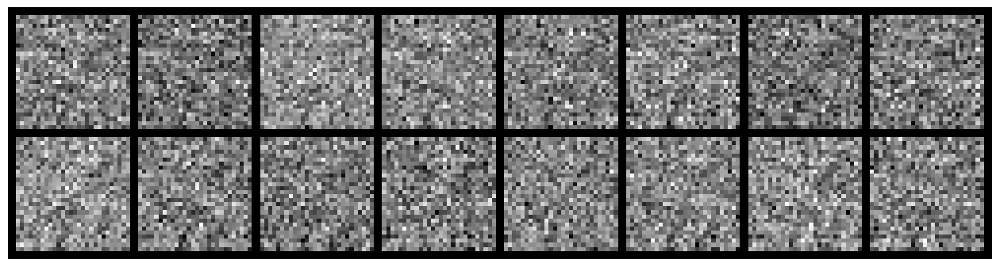

Epoch: [0/200], Batch Num: [0/600]
Discriminator Loss: 1.3908, Generator Loss: 0.7191
D(x): 0.4857, D(G(z)): 0.4875


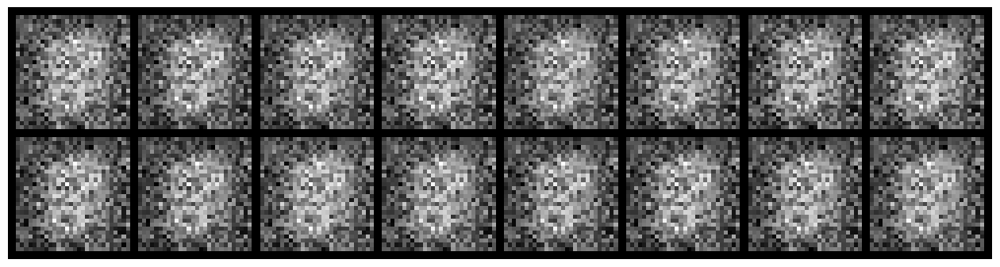

Epoch: [0/200], Batch Num: [200/600]
Discriminator Loss: 0.3022, Generator Loss: 2.3277
D(x): 0.9226, D(G(z)): 0.1760


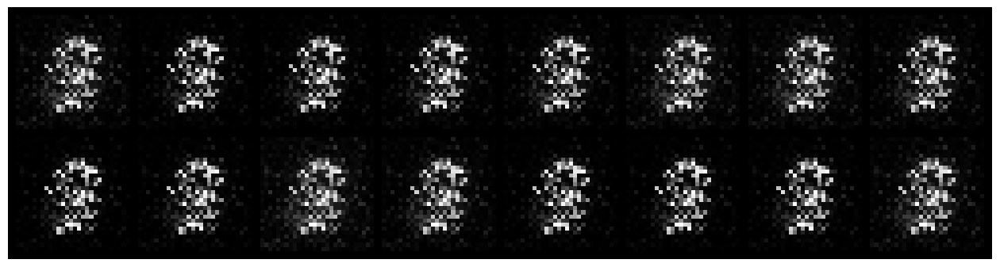

Epoch: [0/200], Batch Num: [400/600]
Discriminator Loss: 0.8272, Generator Loss: 2.3169
D(x): 0.7636, D(G(z)): 0.2899


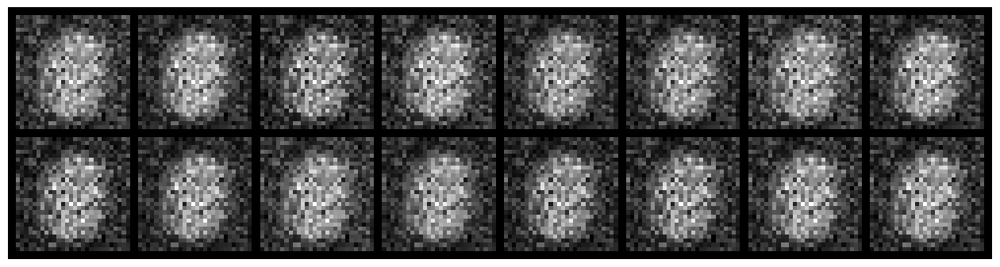

Epoch: [1/200], Batch Num: [0/600]
Discriminator Loss: 1.5235, Generator Loss: 0.4349
D(x): 0.6821, D(G(z)): 0.6652


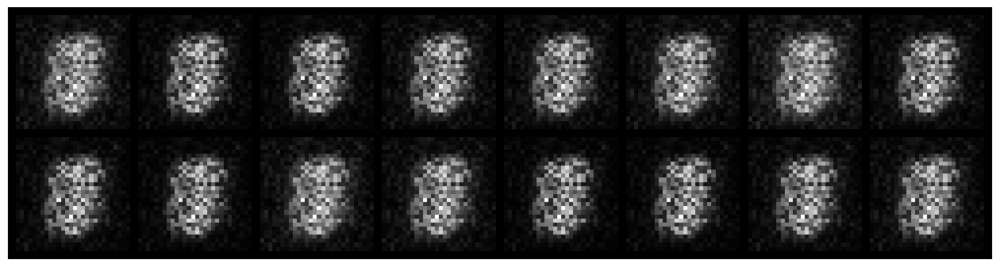

Epoch: [1/200], Batch Num: [200/600]
Discriminator Loss: 0.5874, Generator Loss: 1.9403
D(x): 0.7565, D(G(z)): 0.2278


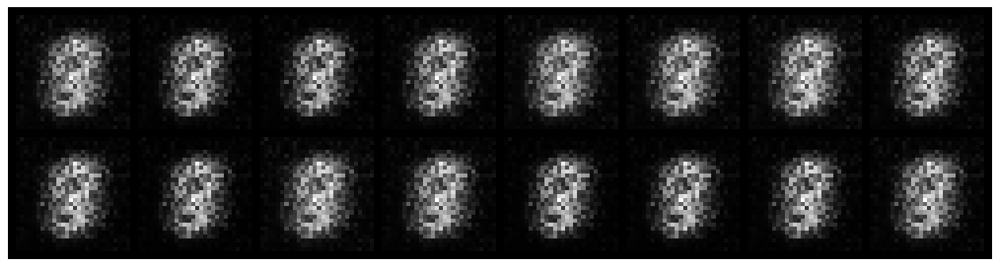

Epoch: [1/200], Batch Num: [400/600]
Discriminator Loss: 0.9223, Generator Loss: 1.6337
D(x): 0.7275, D(G(z)): 0.3754


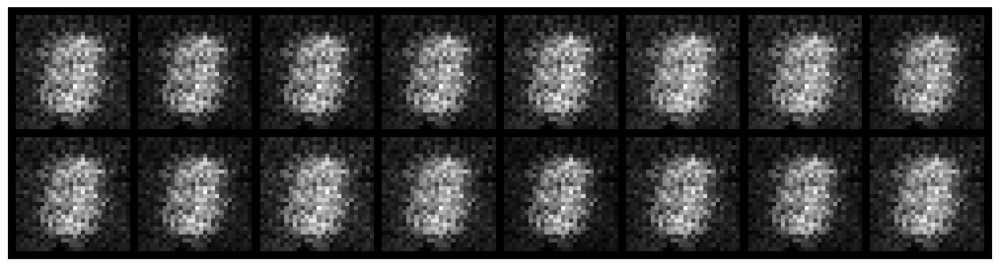

Epoch: [2/200], Batch Num: [0/600]
Discriminator Loss: 0.4308, Generator Loss: 2.1405
D(x): 0.8106, D(G(z)): 0.1867


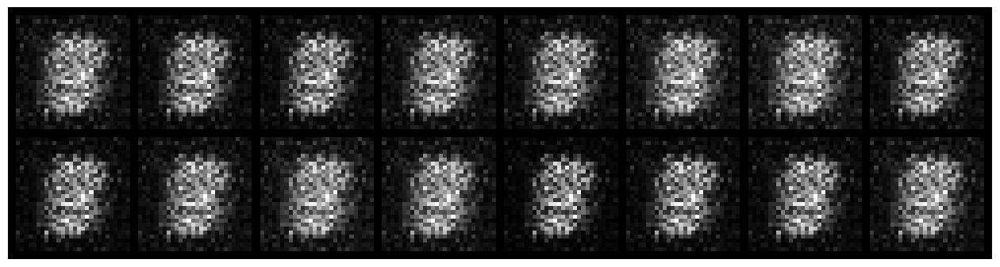

Epoch: [2/200], Batch Num: [200/600]
Discriminator Loss: 0.2189, Generator Loss: 3.0786
D(x): 0.9130, D(G(z)): 0.0966


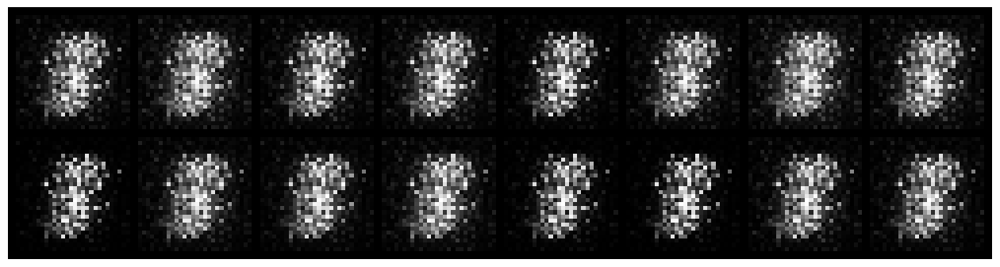

Epoch: [2/200], Batch Num: [400/600]
Discriminator Loss: 0.4518, Generator Loss: 2.5034
D(x): 0.8560, D(G(z)): 0.1907


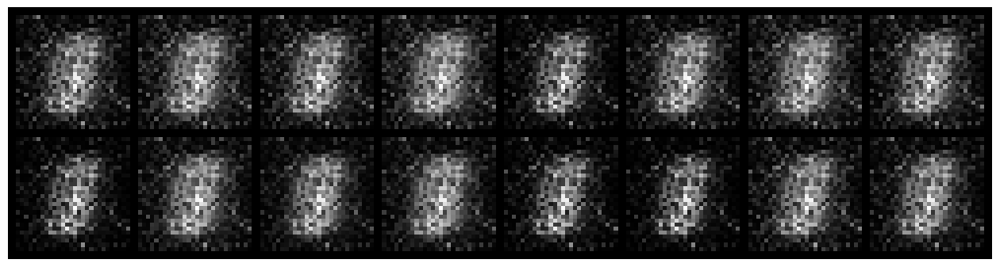

Epoch: [3/200], Batch Num: [0/600]
Discriminator Loss: 0.7952, Generator Loss: 2.0724
D(x): 0.7246, D(G(z)): 0.2097


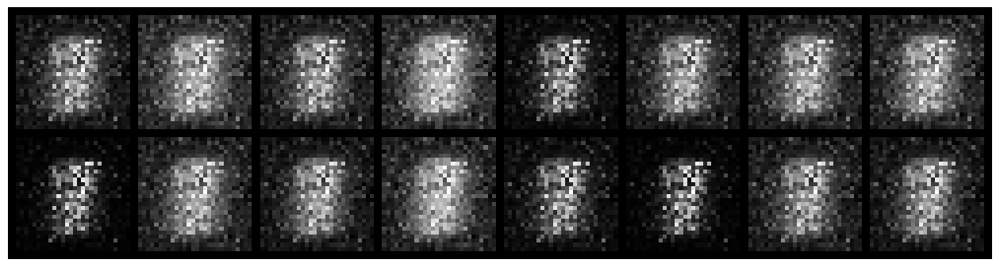

Epoch: [3/200], Batch Num: [200/600]
Discriminator Loss: 0.2263, Generator Loss: 3.6228
D(x): 0.9172, D(G(z)): 0.0588


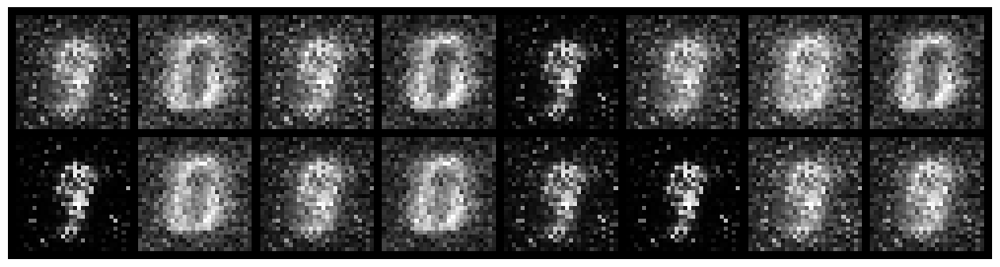

Epoch: [3/200], Batch Num: [400/600]
Discriminator Loss: 0.4690, Generator Loss: 3.1100
D(x): 0.8620, D(G(z)): 0.1361


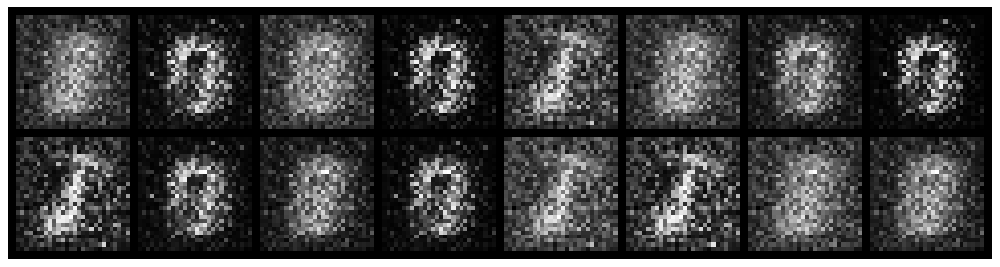

Epoch: [4/200], Batch Num: [0/600]
Discriminator Loss: 0.1305, Generator Loss: 5.7036
D(x): 0.9516, D(G(z)): 0.0530


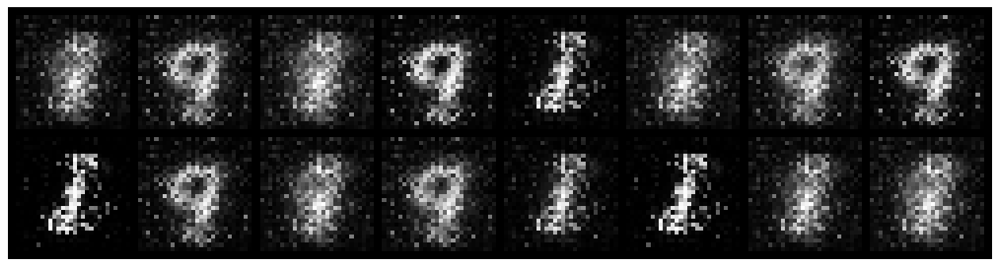

Epoch: [4/200], Batch Num: [200/600]
Discriminator Loss: 0.1961, Generator Loss: 5.3535
D(x): 0.9456, D(G(z)): 0.0874


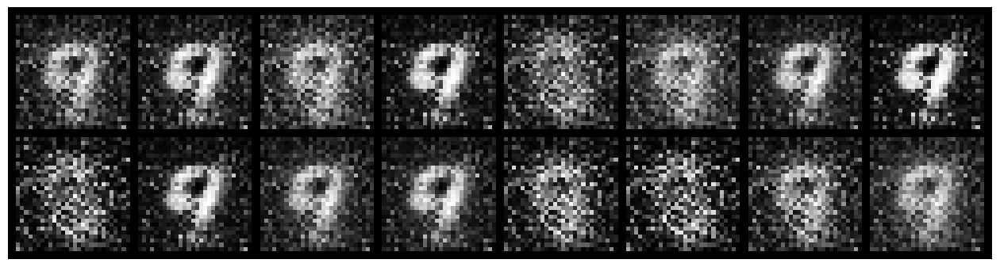

Epoch: [4/200], Batch Num: [400/600]
Discriminator Loss: 0.2418, Generator Loss: 5.7677
D(x): 0.9195, D(G(z)): 0.0359


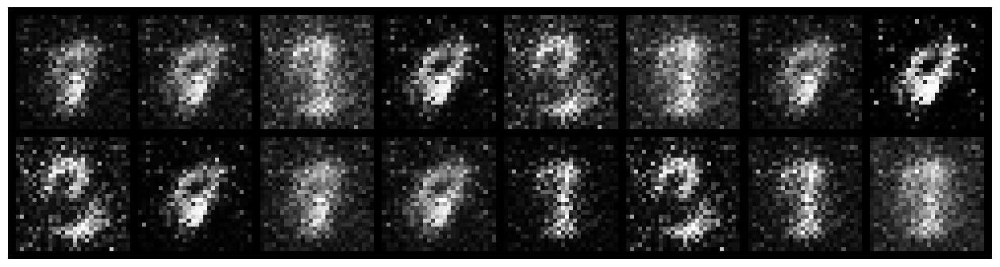

Epoch: [5/200], Batch Num: [0/600]
Discriminator Loss: 0.2029, Generator Loss: 4.5654
D(x): 0.9173, D(G(z)): 0.0268


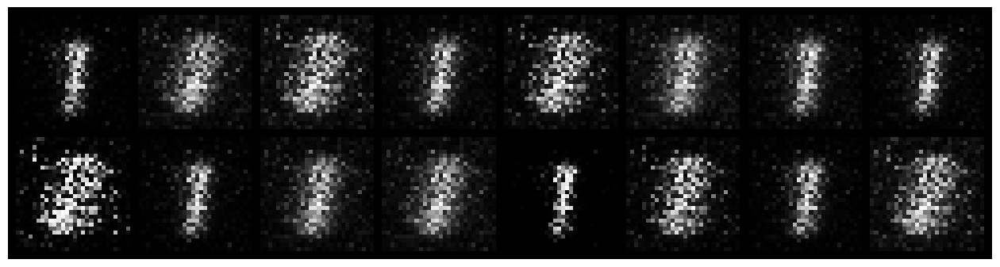

Epoch: [5/200], Batch Num: [200/600]
Discriminator Loss: 0.1904, Generator Loss: 4.6558
D(x): 0.9278, D(G(z)): 0.0466


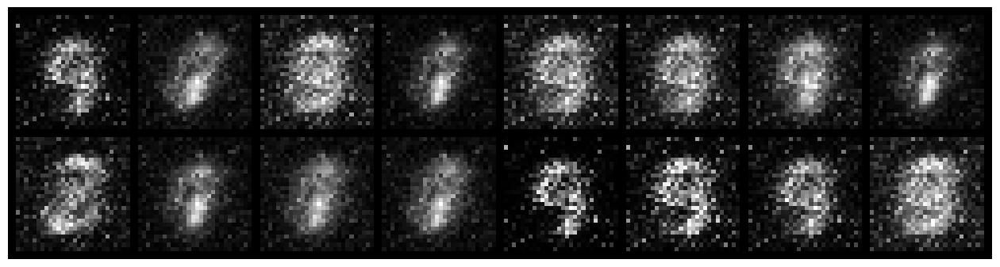

Epoch: [5/200], Batch Num: [400/600]
Discriminator Loss: 0.2323, Generator Loss: 4.2055
D(x): 0.9300, D(G(z)): 0.0916


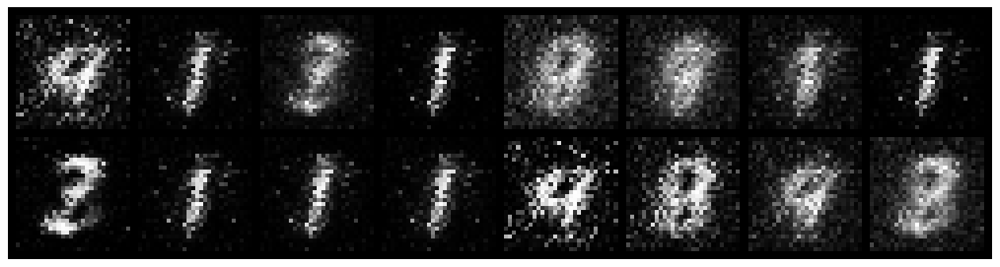

Epoch: [6/200], Batch Num: [0/600]
Discriminator Loss: 0.4875, Generator Loss: 4.5630
D(x): 0.8193, D(G(z)): 0.0289


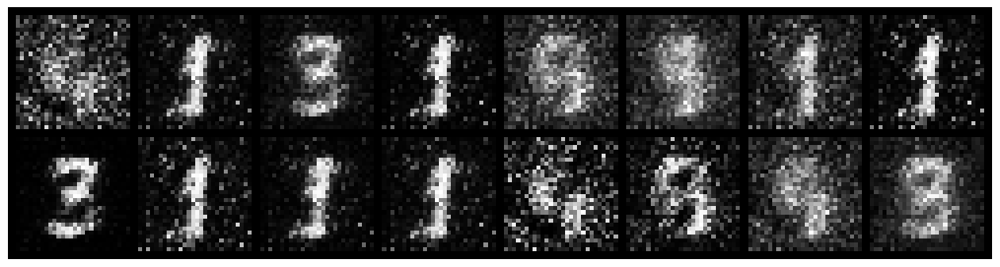

Epoch: [6/200], Batch Num: [200/600]
Discriminator Loss: 0.2262, Generator Loss: 4.4616
D(x): 0.9090, D(G(z)): 0.0328


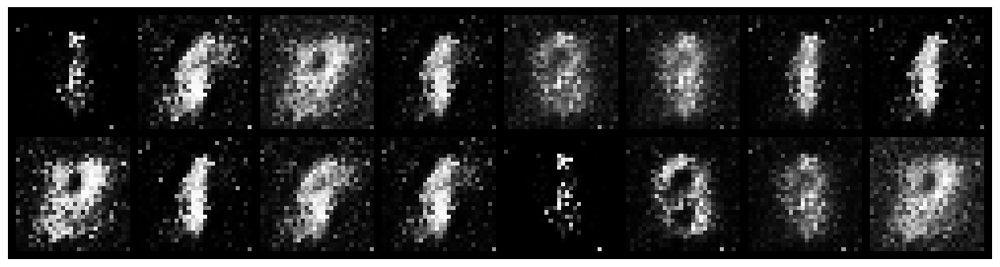

Epoch: [6/200], Batch Num: [400/600]
Discriminator Loss: 0.1160, Generator Loss: 5.2287
D(x): 0.9624, D(G(z)): 0.0420


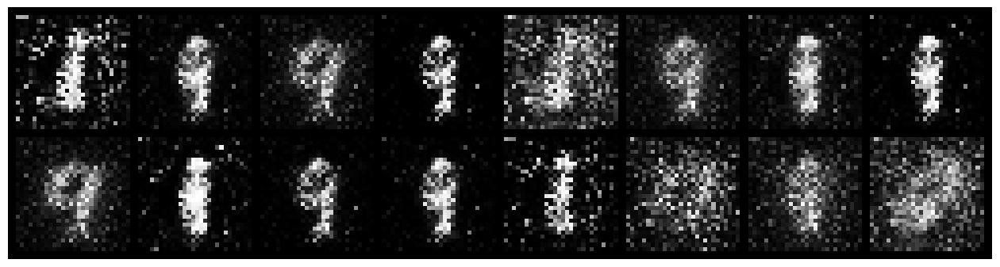

Epoch: [7/200], Batch Num: [0/600]
Discriminator Loss: 0.1584, Generator Loss: 7.2513
D(x): 0.9402, D(G(z)): 0.0310


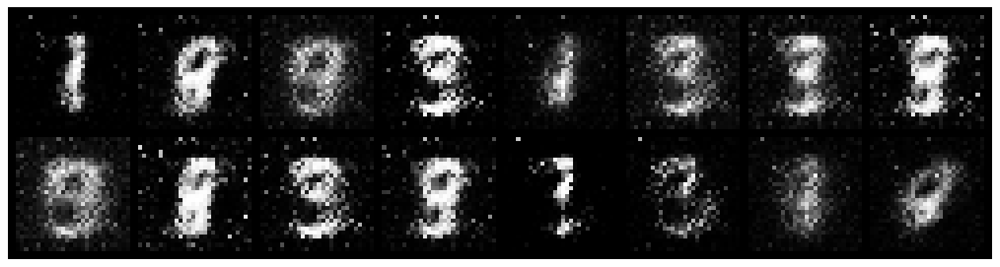

Epoch: [7/200], Batch Num: [200/600]
Discriminator Loss: 0.1666, Generator Loss: 4.5459
D(x): 0.9598, D(G(z)): 0.0880


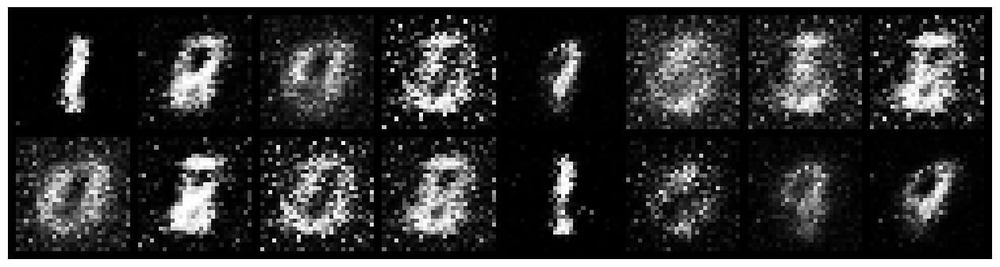

Epoch: [7/200], Batch Num: [400/600]
Discriminator Loss: 0.2576, Generator Loss: 4.4901
D(x): 0.9571, D(G(z)): 0.1263


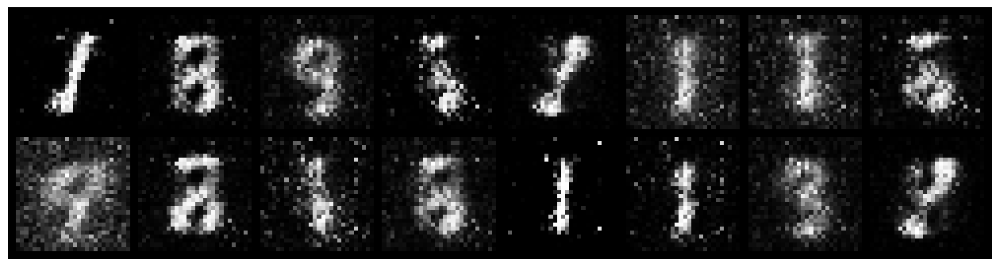

Epoch: [8/200], Batch Num: [0/600]
Discriminator Loss: 0.3295, Generator Loss: 3.7351
D(x): 0.8927, D(G(z)): 0.0864


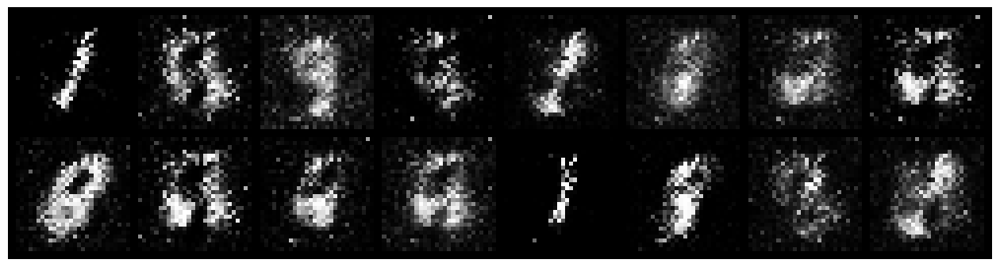

Epoch: [8/200], Batch Num: [200/600]
Discriminator Loss: 0.2893, Generator Loss: 4.7825
D(x): 0.9073, D(G(z)): 0.0346


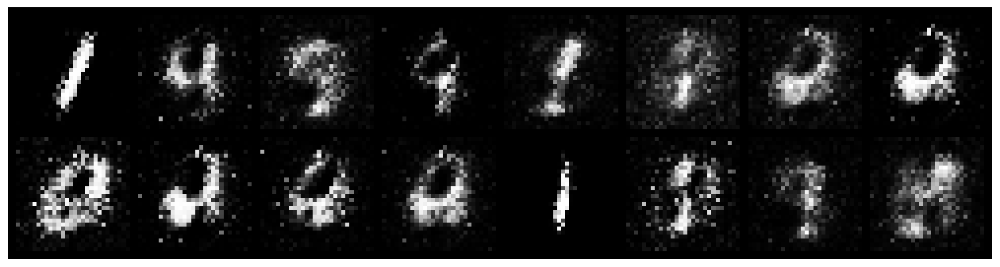

Epoch: [8/200], Batch Num: [400/600]
Discriminator Loss: 0.1298, Generator Loss: 4.1338
D(x): 0.9463, D(G(z)): 0.0357


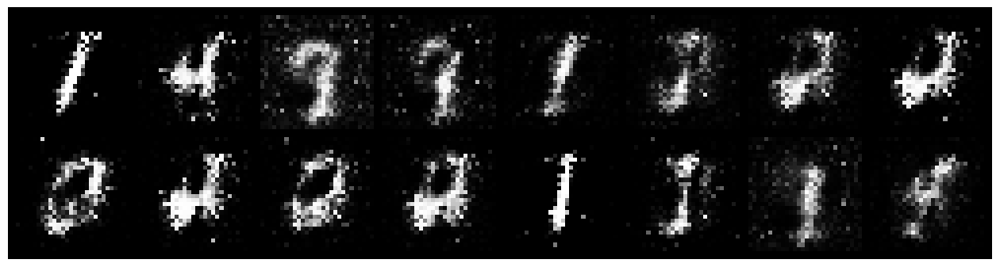

Epoch: [9/200], Batch Num: [0/600]
Discriminator Loss: 0.2632, Generator Loss: 4.7946
D(x): 0.9400, D(G(z)): 0.1035


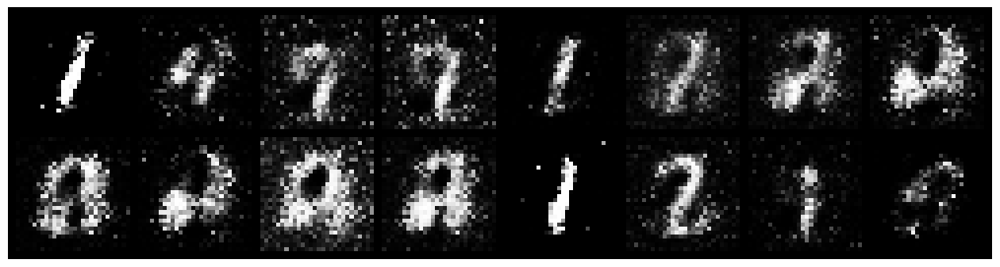

Epoch: [9/200], Batch Num: [200/600]
Discriminator Loss: 0.2908, Generator Loss: 4.0202
D(x): 0.9149, D(G(z)): 0.1104


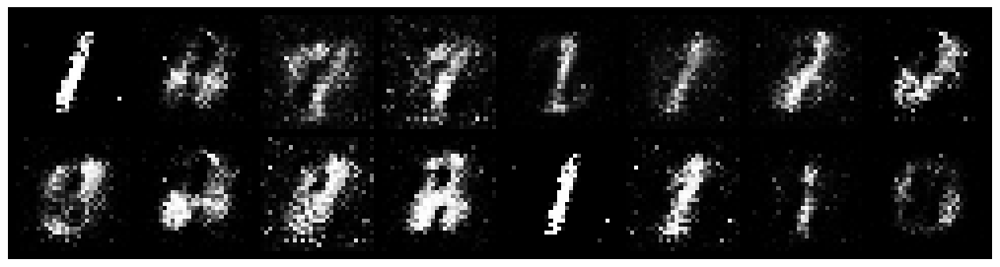

Epoch: [9/200], Batch Num: [400/600]
Discriminator Loss: 0.4167, Generator Loss: 3.6664
D(x): 0.8929, D(G(z)): 0.0907


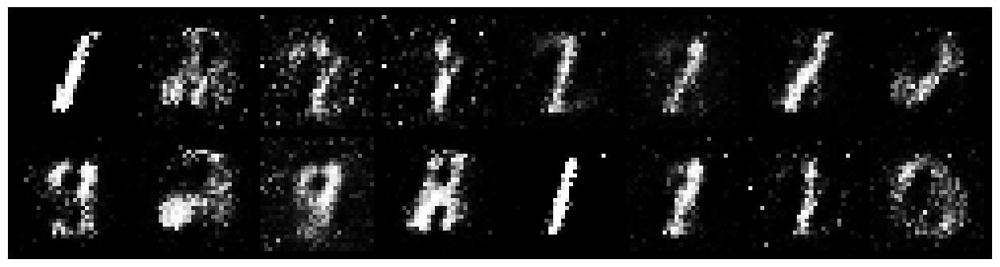

Epoch: [10/200], Batch Num: [0/600]
Discriminator Loss: 0.2847, Generator Loss: 4.0984
D(x): 0.9132, D(G(z)): 0.0484


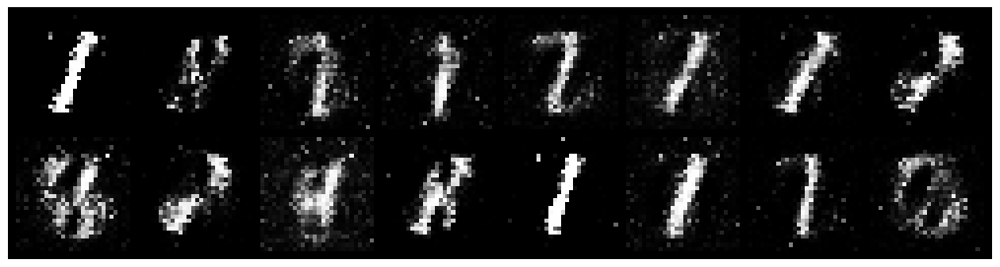

Epoch: [10/200], Batch Num: [200/600]
Discriminator Loss: 0.2491, Generator Loss: 3.6179
D(x): 0.9144, D(G(z)): 0.0844


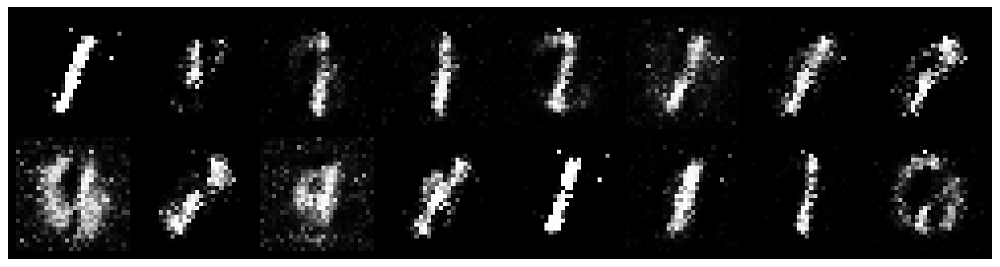

Epoch: [10/200], Batch Num: [400/600]
Discriminator Loss: 0.3083, Generator Loss: 3.3651
D(x): 0.8916, D(G(z)): 0.0747


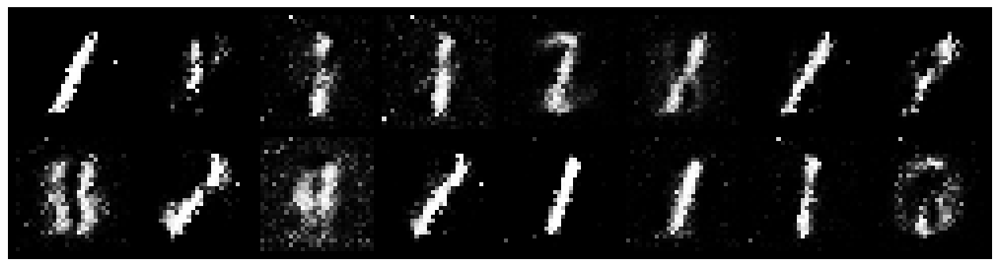

Epoch: [11/200], Batch Num: [0/600]
Discriminator Loss: 0.2435, Generator Loss: 3.2620
D(x): 0.9324, D(G(z)): 0.0882


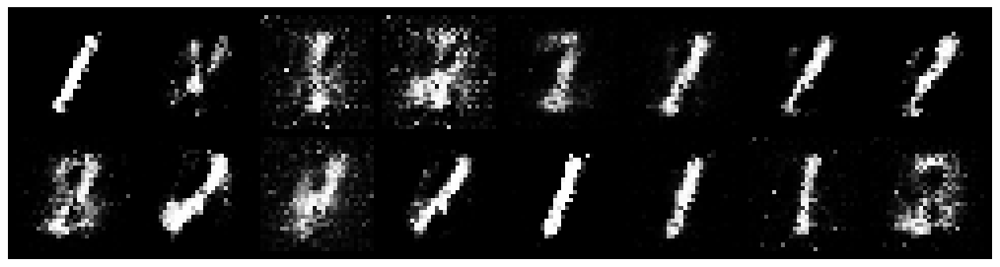

Epoch: [11/200], Batch Num: [200/600]
Discriminator Loss: 0.3237, Generator Loss: 2.6483
D(x): 0.9036, D(G(z)): 0.1194


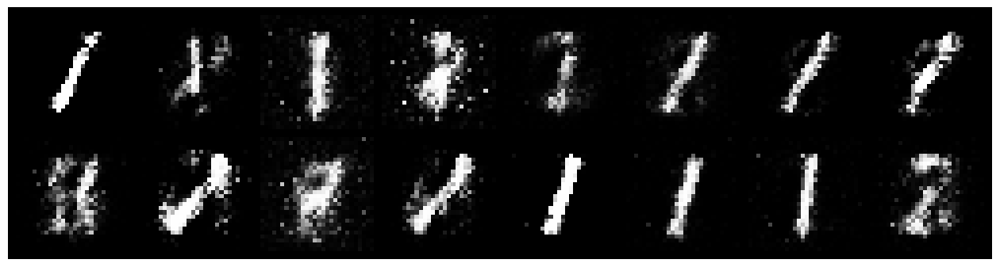

Epoch: [11/200], Batch Num: [400/600]
Discriminator Loss: 0.5075, Generator Loss: 3.4906
D(x): 0.8466, D(G(z)): 0.0801


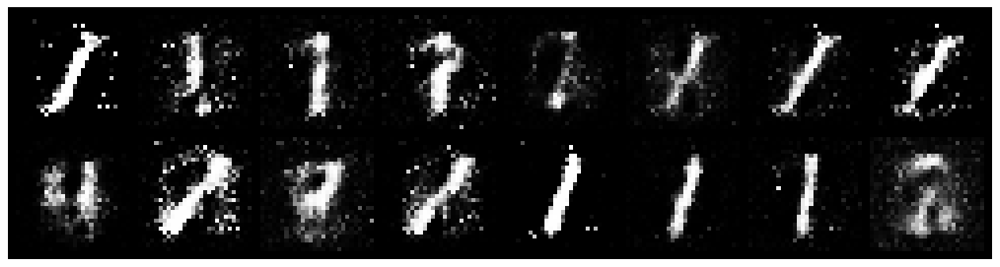

Epoch: [12/200], Batch Num: [0/600]
Discriminator Loss: 0.2195, Generator Loss: 3.7708
D(x): 0.9212, D(G(z)): 0.0584


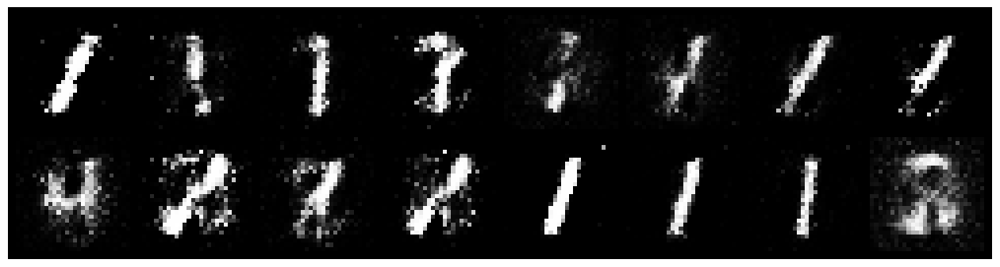

Epoch: [12/200], Batch Num: [200/600]
Discriminator Loss: 0.2955, Generator Loss: 3.3997
D(x): 0.8936, D(G(z)): 0.0625


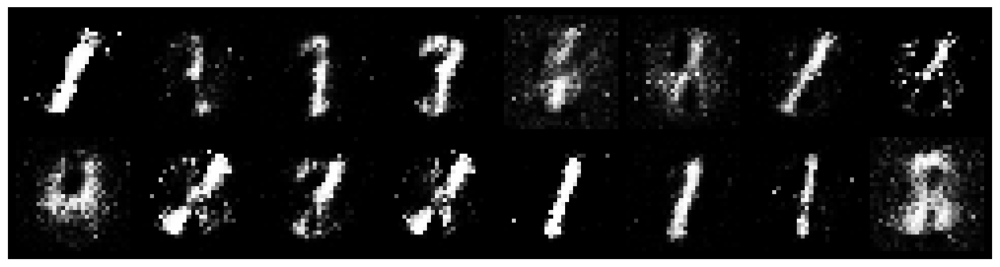

Epoch: [12/200], Batch Num: [400/600]
Discriminator Loss: 0.3657, Generator Loss: 3.0990
D(x): 0.9222, D(G(z)): 0.1482


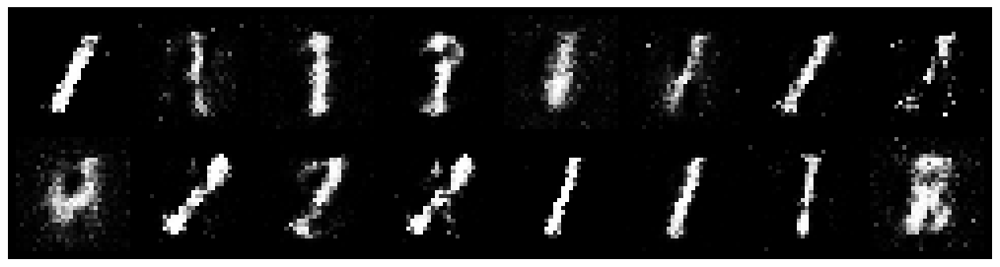

Epoch: [13/200], Batch Num: [0/600]
Discriminator Loss: 0.4587, Generator Loss: 2.9190
D(x): 0.8880, D(G(z)): 0.1574


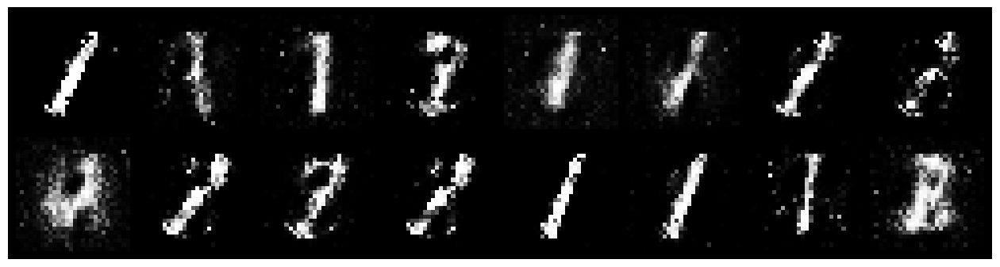

Epoch: [13/200], Batch Num: [200/600]
Discriminator Loss: 0.3555, Generator Loss: 3.7658
D(x): 0.9177, D(G(z)): 0.1223


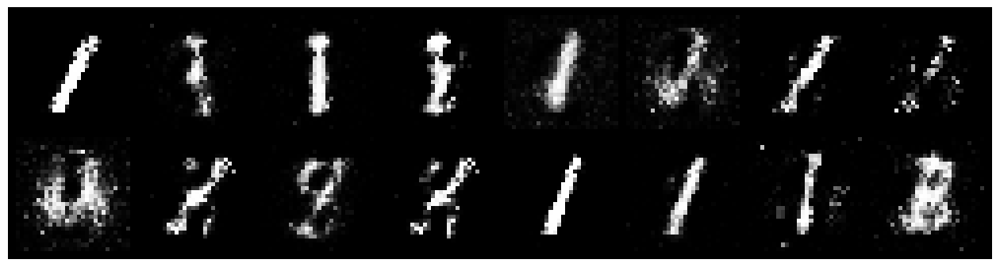

Epoch: [13/200], Batch Num: [400/600]
Discriminator Loss: 0.4151, Generator Loss: 3.2786
D(x): 0.8567, D(G(z)): 0.0714


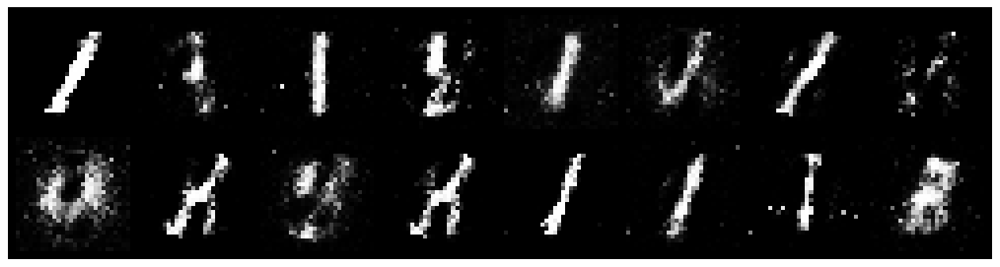

Epoch: [14/200], Batch Num: [0/600]
Discriminator Loss: 0.4676, Generator Loss: 2.6029
D(x): 0.8805, D(G(z)): 0.1781


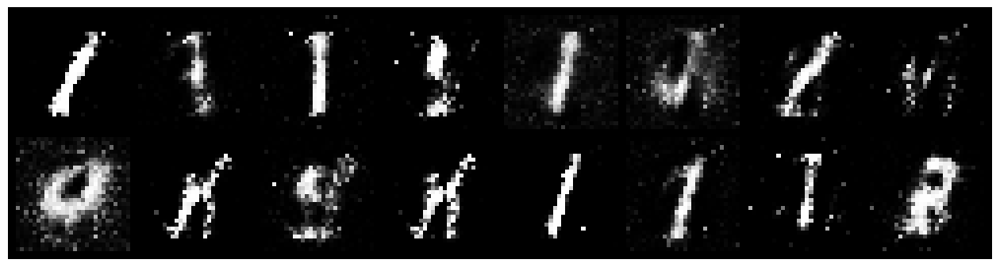

Epoch: [14/200], Batch Num: [200/600]
Discriminator Loss: 0.2929, Generator Loss: 2.7160
D(x): 0.9375, D(G(z)): 0.1562


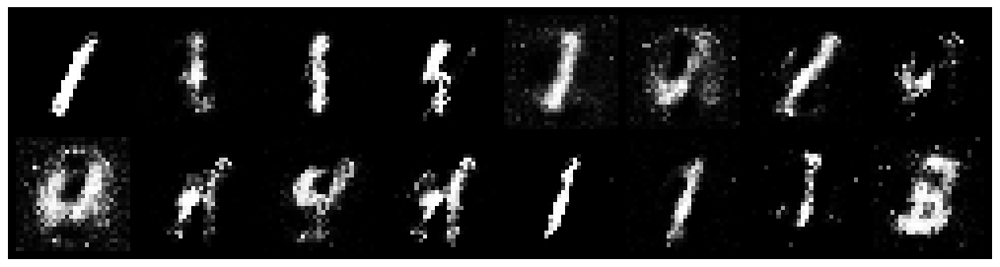

Epoch: [14/200], Batch Num: [400/600]
Discriminator Loss: 0.4031, Generator Loss: 4.2905
D(x): 0.9200, D(G(z)): 0.1641


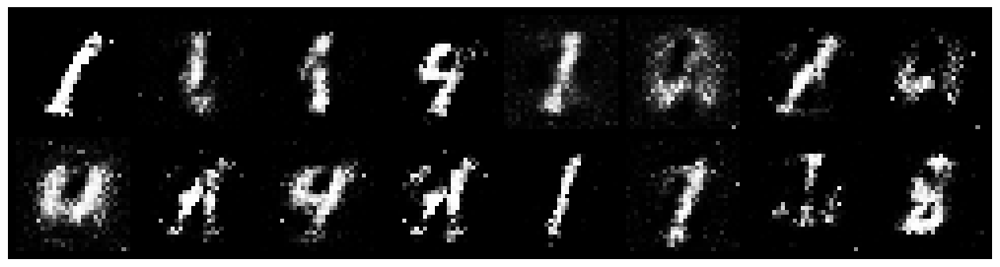

Epoch: [15/200], Batch Num: [0/600]
Discriminator Loss: 0.3240, Generator Loss: 3.5184
D(x): 0.9213, D(G(z)): 0.1456


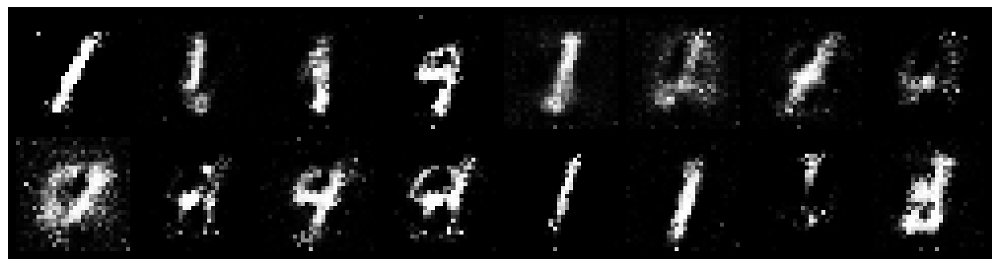

Epoch: [15/200], Batch Num: [200/600]
Discriminator Loss: 0.4391, Generator Loss: 2.7632
D(x): 0.8774, D(G(z)): 0.1491


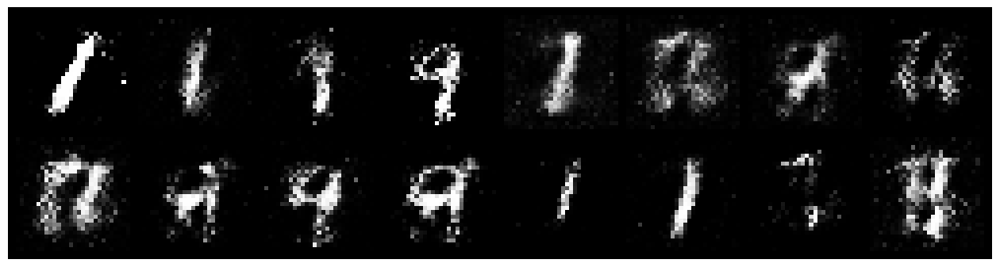

Epoch: [15/200], Batch Num: [400/600]
Discriminator Loss: 0.4773, Generator Loss: 3.0772
D(x): 0.8234, D(G(z)): 0.0963


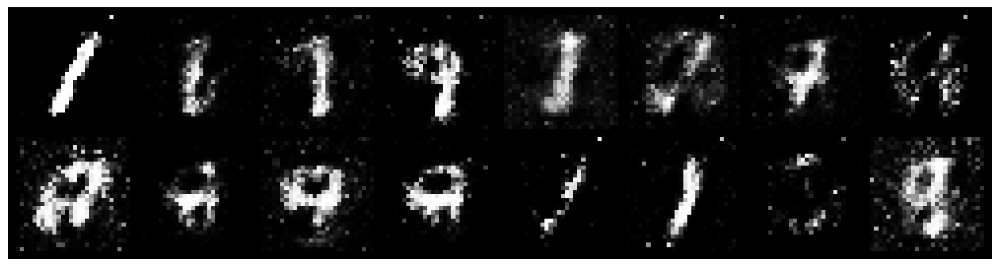

Epoch: [16/200], Batch Num: [0/600]
Discriminator Loss: 0.4121, Generator Loss: 3.0775
D(x): 0.8980, D(G(z)): 0.1404


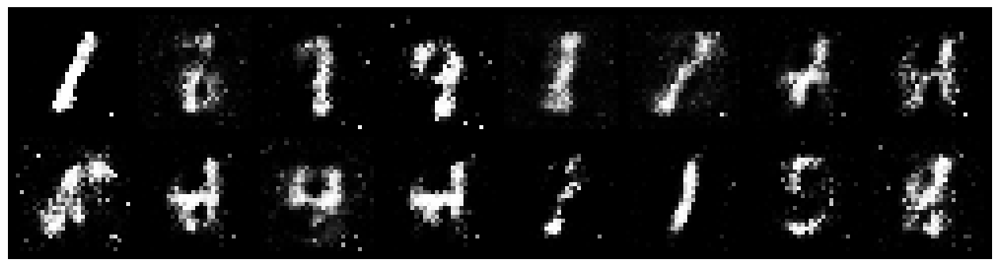

Epoch: [16/200], Batch Num: [200/600]
Discriminator Loss: 0.4060, Generator Loss: 2.3731
D(x): 0.8507, D(G(z)): 0.1237


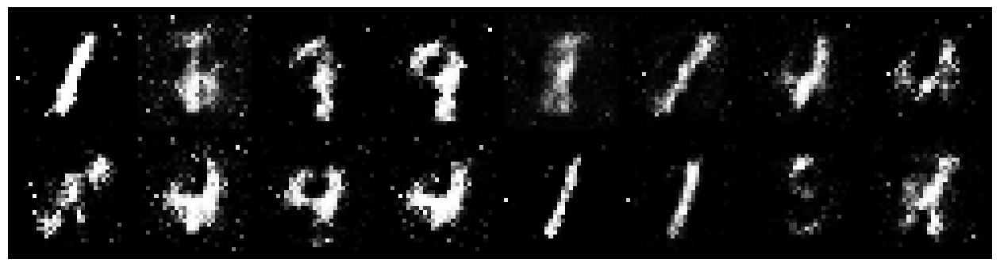

Epoch: [16/200], Batch Num: [400/600]
Discriminator Loss: 0.3669, Generator Loss: 2.8757
D(x): 0.8649, D(G(z)): 0.1085


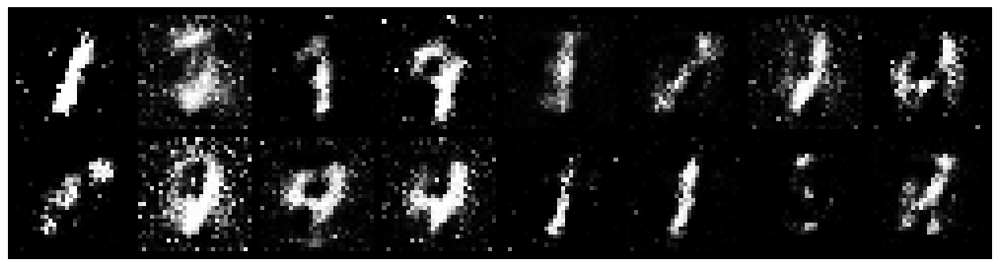

Epoch: [17/200], Batch Num: [0/600]
Discriminator Loss: 0.6912, Generator Loss: 2.4126
D(x): 0.7862, D(G(z)): 0.1496


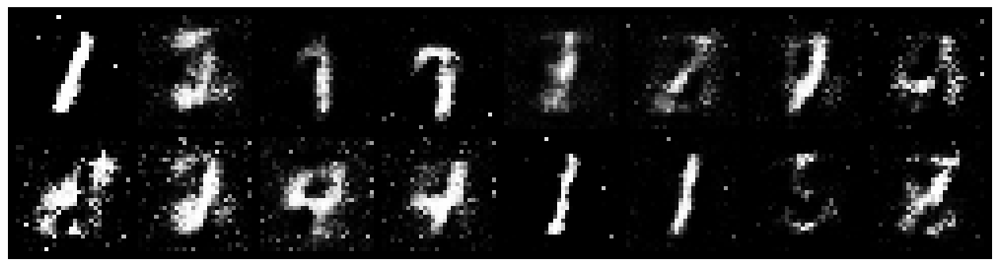

Epoch: [17/200], Batch Num: [200/600]
Discriminator Loss: 0.5577, Generator Loss: 3.0636
D(x): 0.8598, D(G(z)): 0.2078


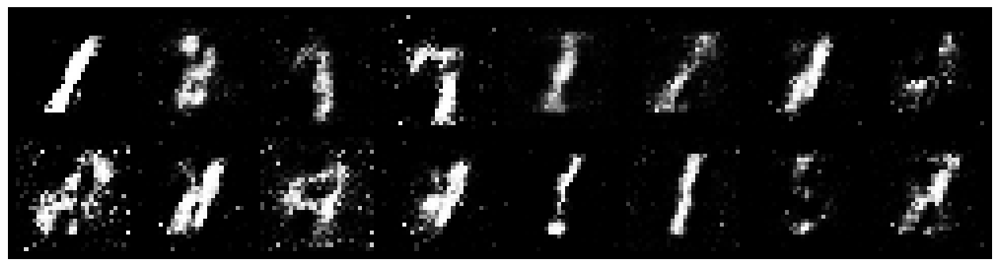

Epoch: [17/200], Batch Num: [400/600]
Discriminator Loss: 0.4120, Generator Loss: 2.7006
D(x): 0.8837, D(G(z)): 0.1656


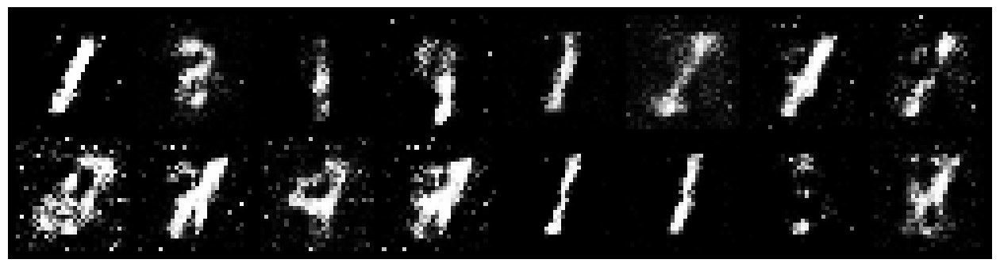

Epoch: [18/200], Batch Num: [0/600]
Discriminator Loss: 0.2276, Generator Loss: 3.2108
D(x): 0.9145, D(G(z)): 0.0763


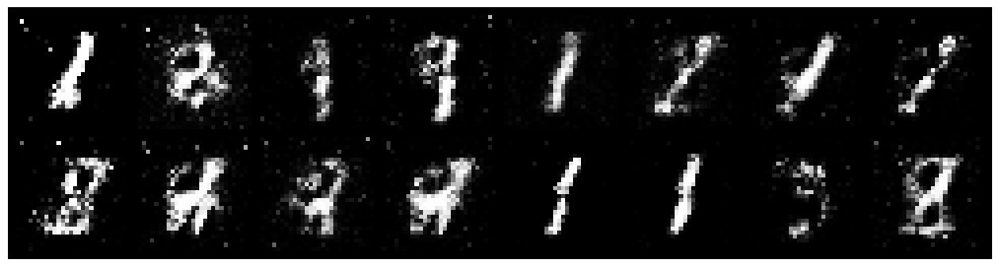

Epoch: [18/200], Batch Num: [200/600]
Discriminator Loss: 0.5604, Generator Loss: 2.7634
D(x): 0.8632, D(G(z)): 0.2051


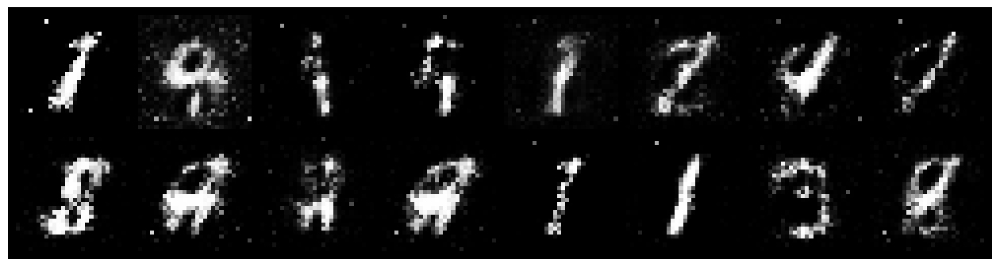

Epoch: [18/200], Batch Num: [400/600]
Discriminator Loss: 0.7199, Generator Loss: 2.0440
D(x): 0.8524, D(G(z)): 0.2775


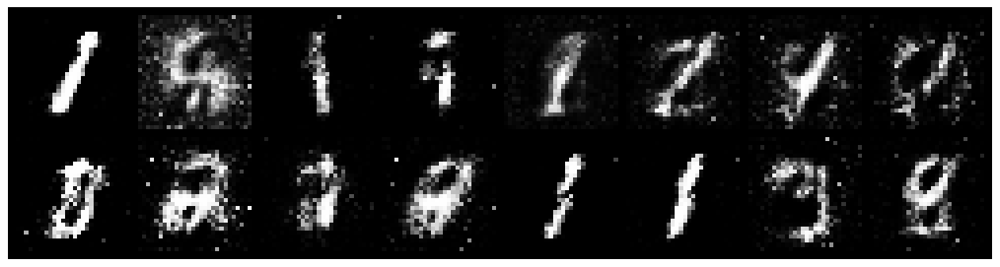

Epoch: [19/200], Batch Num: [0/600]
Discriminator Loss: 0.6856, Generator Loss: 2.2096
D(x): 0.7761, D(G(z)): 0.1799


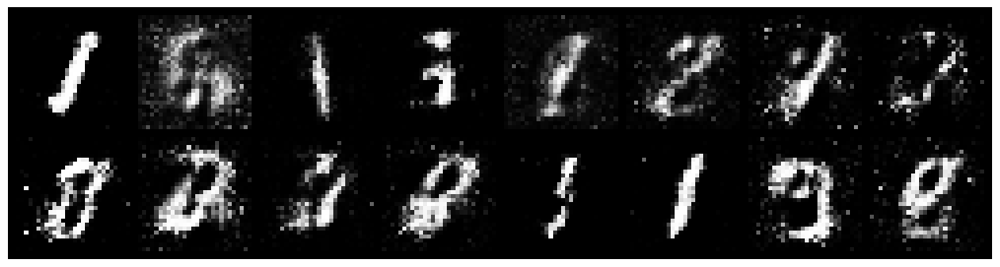

Epoch: [19/200], Batch Num: [200/600]
Discriminator Loss: 0.9589, Generator Loss: 2.4032
D(x): 0.6550, D(G(z)): 0.1671


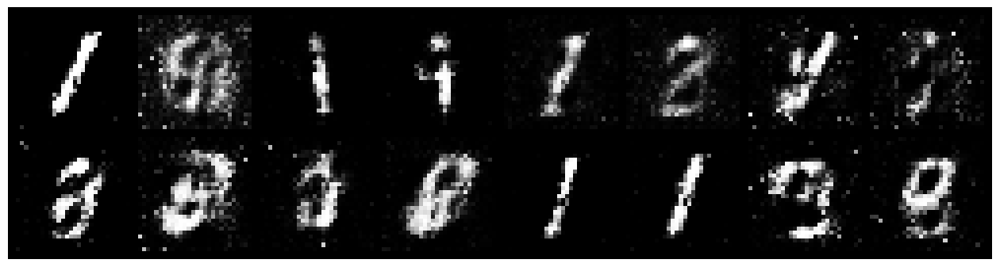

Epoch: [19/200], Batch Num: [400/600]
Discriminator Loss: 0.4729, Generator Loss: 3.1002
D(x): 0.8493, D(G(z)): 0.1315


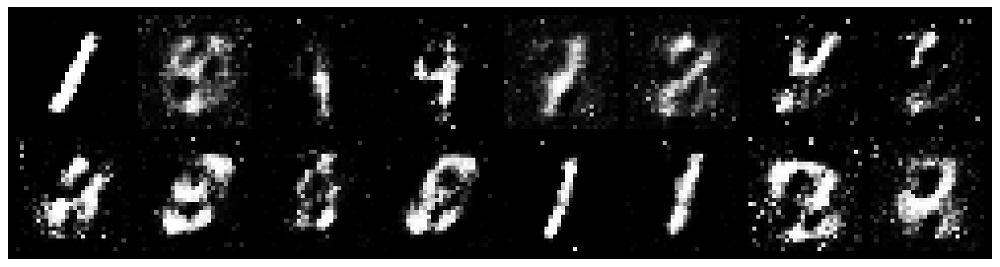

Epoch: [20/200], Batch Num: [0/600]
Discriminator Loss: 0.7277, Generator Loss: 2.0283
D(x): 0.7830, D(G(z)): 0.2251


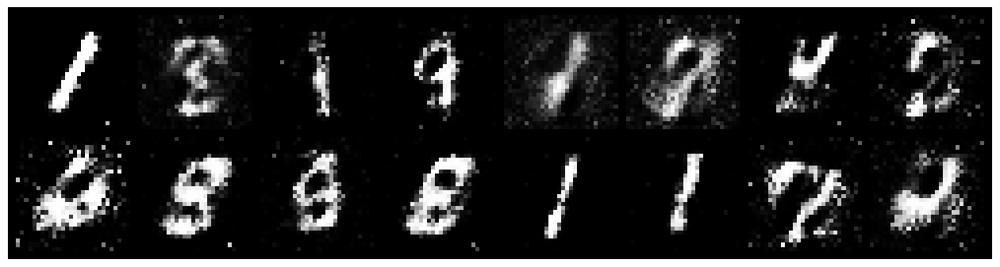

Epoch: [20/200], Batch Num: [200/600]
Discriminator Loss: 0.7437, Generator Loss: 1.8879
D(x): 0.7915, D(G(z)): 0.2489


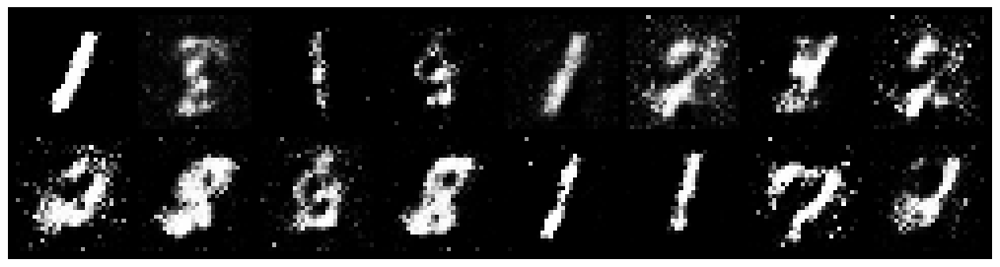

Epoch: [20/200], Batch Num: [400/600]
Discriminator Loss: 0.6268, Generator Loss: 2.3553
D(x): 0.8388, D(G(z)): 0.2358


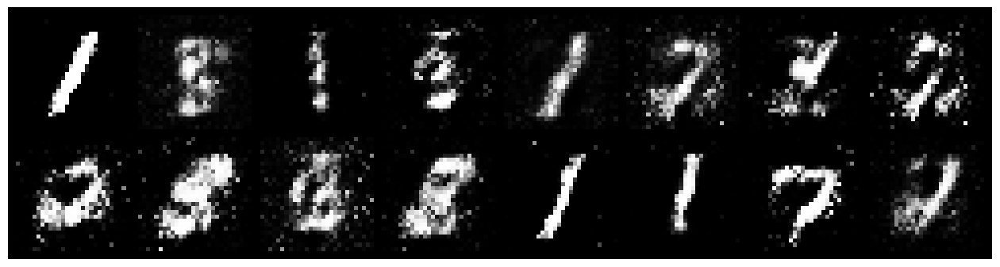

Epoch: [21/200], Batch Num: [0/600]
Discriminator Loss: 0.6953, Generator Loss: 2.2923
D(x): 0.7916, D(G(z)): 0.2032


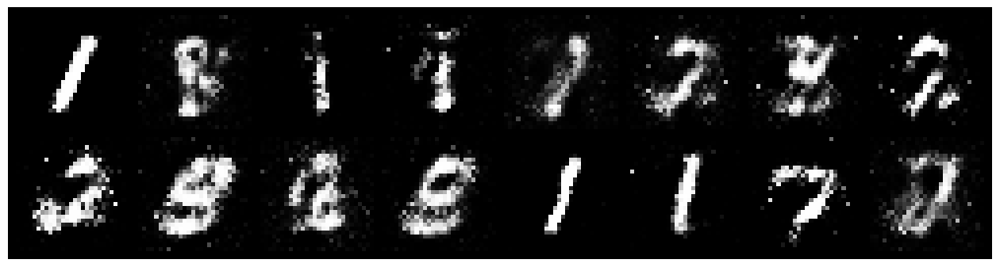

Epoch: [21/200], Batch Num: [200/600]
Discriminator Loss: 0.6743, Generator Loss: 2.1433
D(x): 0.8608, D(G(z)): 0.2865


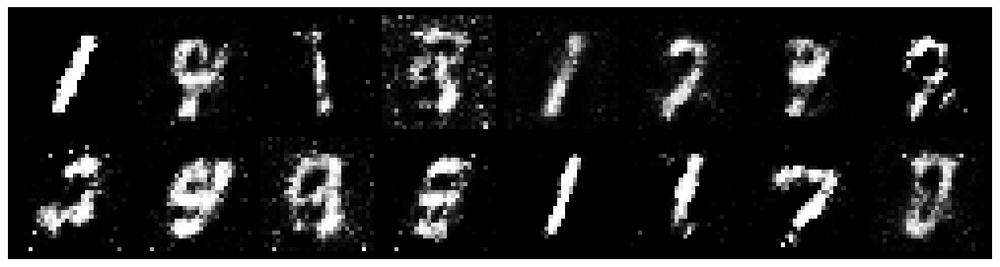

Epoch: [21/200], Batch Num: [400/600]
Discriminator Loss: 0.7202, Generator Loss: 2.7821
D(x): 0.7219, D(G(z)): 0.1045


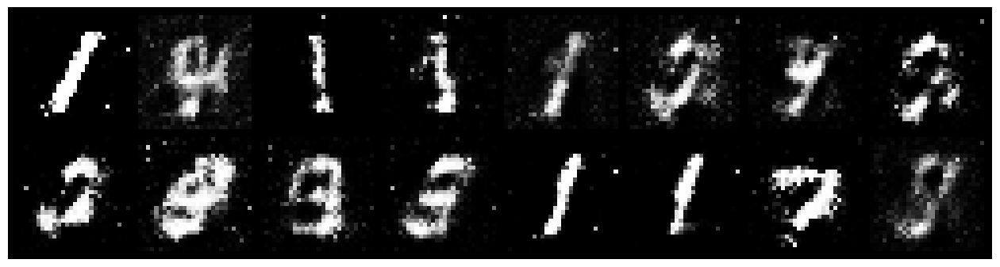

Epoch: [22/200], Batch Num: [0/600]
Discriminator Loss: 0.6434, Generator Loss: 2.4252
D(x): 0.7707, D(G(z)): 0.1499


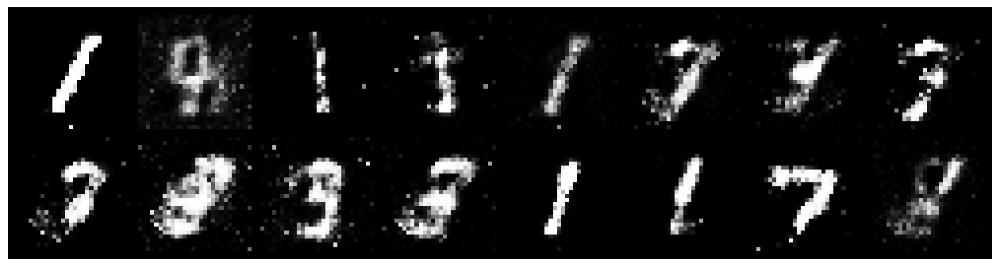

Epoch: [22/200], Batch Num: [200/600]
Discriminator Loss: 0.7413, Generator Loss: 1.9448
D(x): 0.7372, D(G(z)): 0.1923


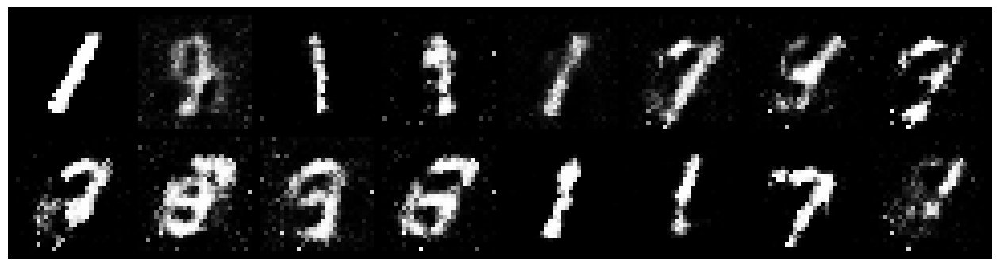

Epoch: [22/200], Batch Num: [400/600]
Discriminator Loss: 0.5774, Generator Loss: 2.1210
D(x): 0.8319, D(G(z)): 0.2078


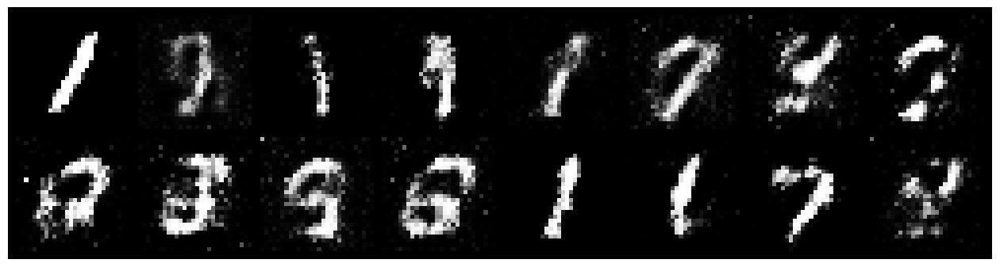

Epoch: [23/200], Batch Num: [0/600]
Discriminator Loss: 0.6398, Generator Loss: 2.0796
D(x): 0.8034, D(G(z)): 0.2013


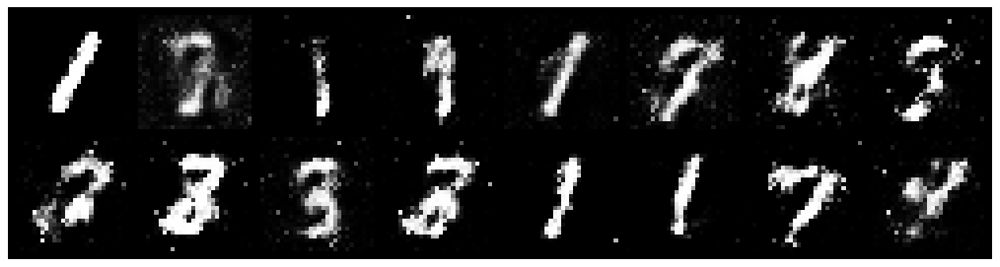

Epoch: [23/200], Batch Num: [200/600]
Discriminator Loss: 0.6908, Generator Loss: 2.1363
D(x): 0.8148, D(G(z)): 0.2176


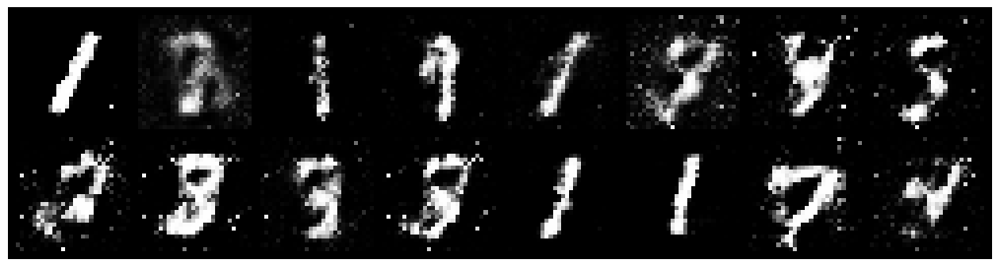

Epoch: [23/200], Batch Num: [400/600]
Discriminator Loss: 0.7029, Generator Loss: 1.9922
D(x): 0.8098, D(G(z)): 0.2388


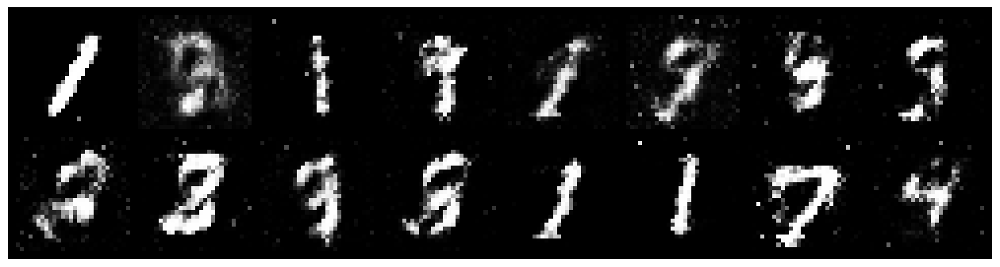

Epoch: [24/200], Batch Num: [0/600]
Discriminator Loss: 0.5781, Generator Loss: 2.8224
D(x): 0.8311, D(G(z)): 0.1633


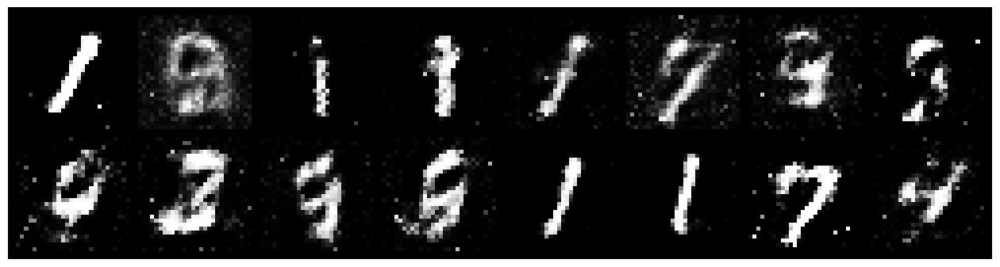

Epoch: [24/200], Batch Num: [200/600]
Discriminator Loss: 0.5145, Generator Loss: 2.6890
D(x): 0.8527, D(G(z)): 0.2101


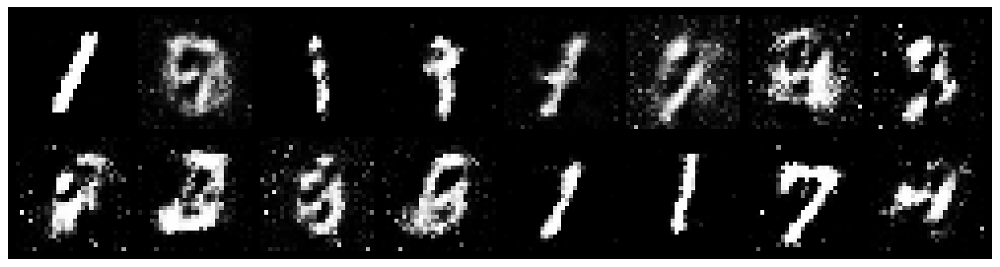

Epoch: [24/200], Batch Num: [400/600]
Discriminator Loss: 0.6638, Generator Loss: 1.9077
D(x): 0.8121, D(G(z)): 0.2399


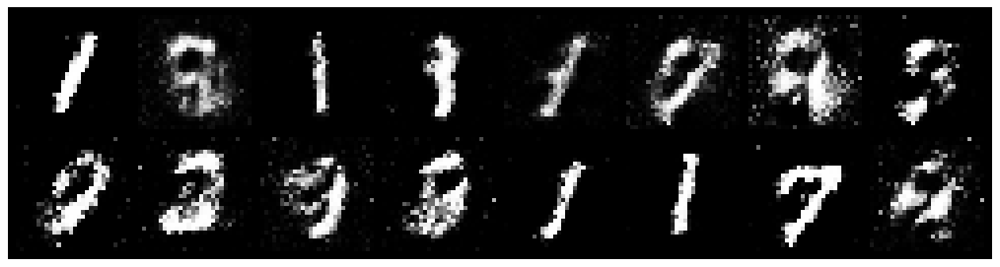

Epoch: [25/200], Batch Num: [0/600]
Discriminator Loss: 0.4958, Generator Loss: 2.2358
D(x): 0.8335, D(G(z)): 0.1512


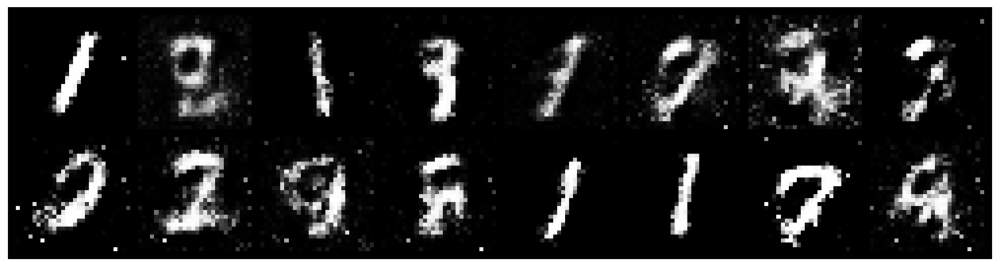

Epoch: [25/200], Batch Num: [200/600]
Discriminator Loss: 0.6812, Generator Loss: 2.0941
D(x): 0.7924, D(G(z)): 0.2078


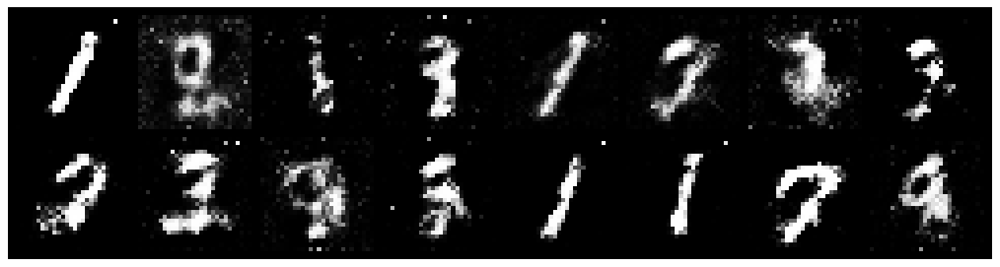

Epoch: [25/200], Batch Num: [400/600]
Discriminator Loss: 0.6406, Generator Loss: 2.2203
D(x): 0.7937, D(G(z)): 0.1776


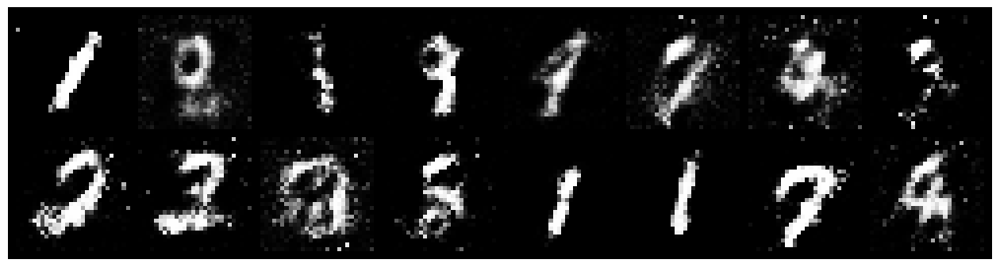

Epoch: [26/200], Batch Num: [0/600]
Discriminator Loss: 1.0140, Generator Loss: 1.9982
D(x): 0.6775, D(G(z)): 0.2354


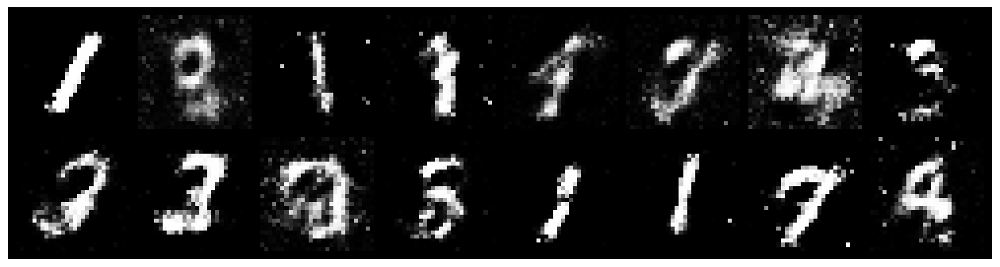

Epoch: [26/200], Batch Num: [200/600]
Discriminator Loss: 0.8013, Generator Loss: 1.8969
D(x): 0.6931, D(G(z)): 0.1461


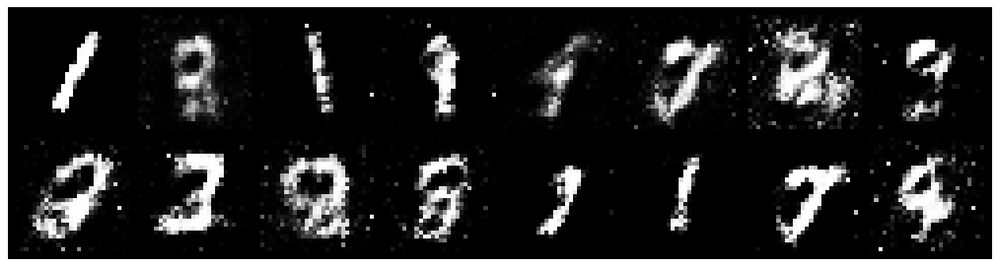

Epoch: [26/200], Batch Num: [400/600]
Discriminator Loss: 0.5064, Generator Loss: 2.2174
D(x): 0.8665, D(G(z)): 0.2263


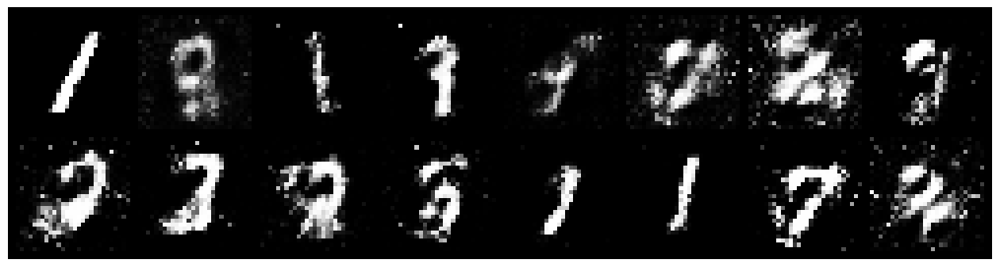

Epoch: [27/200], Batch Num: [0/600]
Discriminator Loss: 0.6033, Generator Loss: 1.9124
D(x): 0.8043, D(G(z)): 0.2216


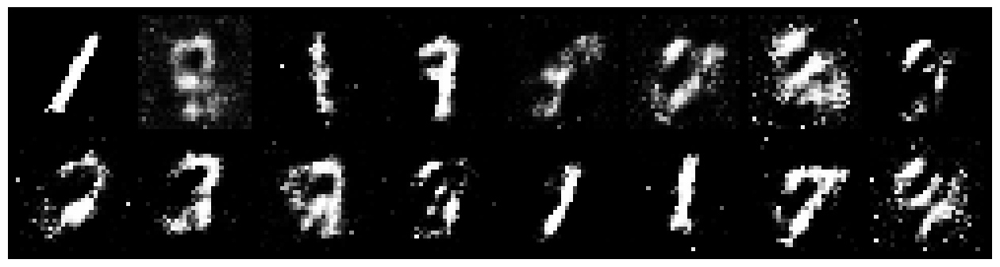

Epoch: [27/200], Batch Num: [200/600]
Discriminator Loss: 0.5583, Generator Loss: 1.9434
D(x): 0.8318, D(G(z)): 0.2066


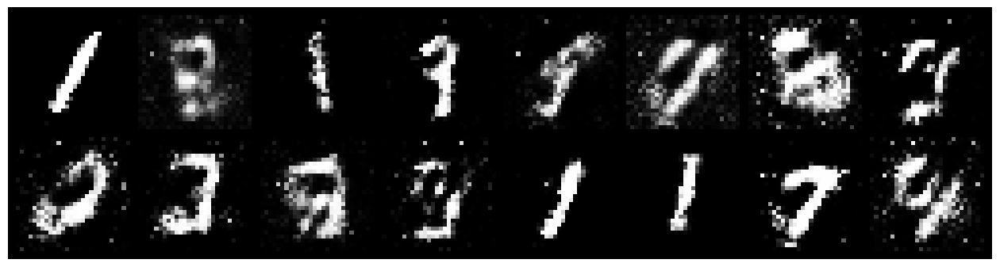

Epoch: [27/200], Batch Num: [400/600]
Discriminator Loss: 1.0461, Generator Loss: 2.4107
D(x): 0.6200, D(G(z)): 0.1765


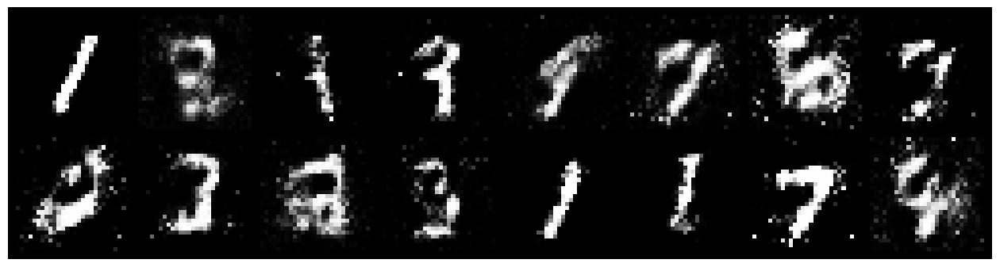

Epoch: [28/200], Batch Num: [0/600]
Discriminator Loss: 0.5359, Generator Loss: 1.8139
D(x): 0.8505, D(G(z)): 0.2299


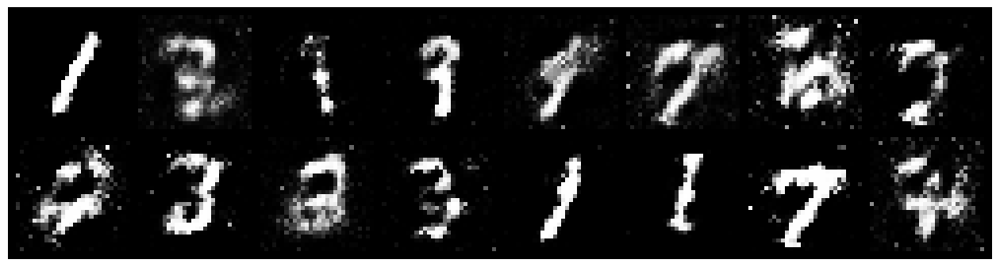

Epoch: [28/200], Batch Num: [200/600]
Discriminator Loss: 0.9270, Generator Loss: 1.7637
D(x): 0.7413, D(G(z)): 0.2824


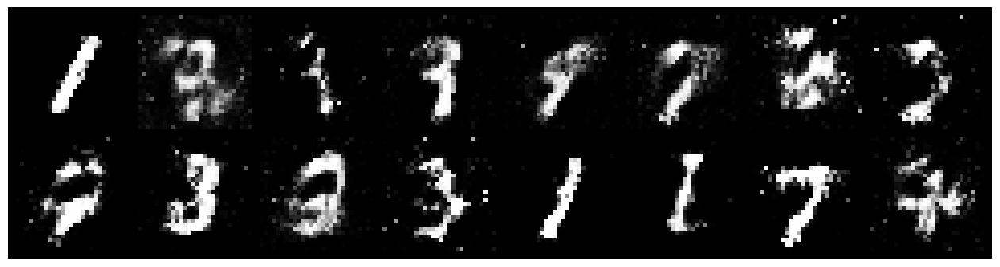

Epoch: [28/200], Batch Num: [400/600]
Discriminator Loss: 0.5982, Generator Loss: 1.8300
D(x): 0.7972, D(G(z)): 0.2130


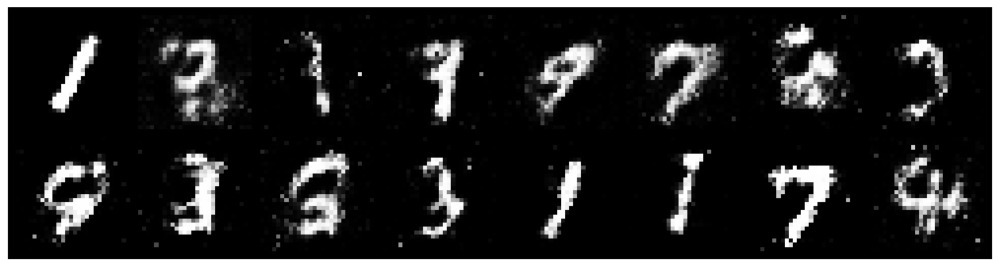

Epoch: [29/200], Batch Num: [0/600]
Discriminator Loss: 0.7425, Generator Loss: 1.8620
D(x): 0.8179, D(G(z)): 0.2812


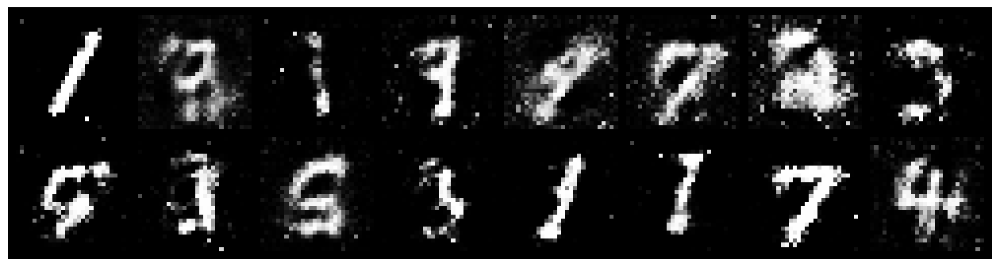

Epoch: [29/200], Batch Num: [200/600]
Discriminator Loss: 0.7484, Generator Loss: 2.1488
D(x): 0.7418, D(G(z)): 0.2226


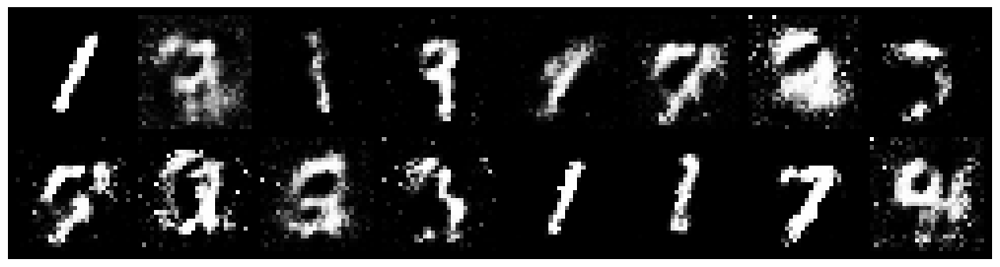

Epoch: [29/200], Batch Num: [400/600]
Discriminator Loss: 0.9298, Generator Loss: 1.3943
D(x): 0.7174, D(G(z)): 0.2679


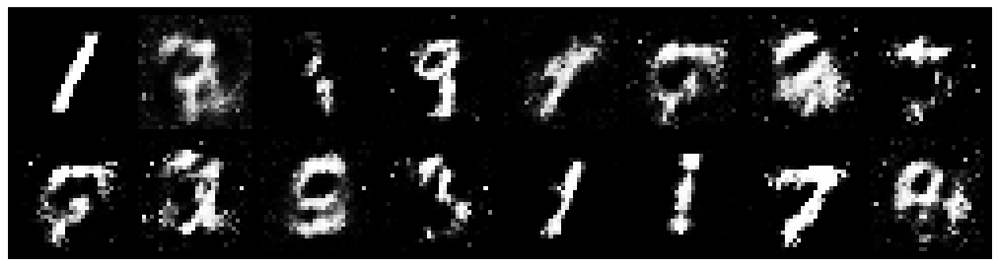

Epoch: [30/200], Batch Num: [0/600]
Discriminator Loss: 0.8086, Generator Loss: 1.8347
D(x): 0.6821, D(G(z)): 0.2010


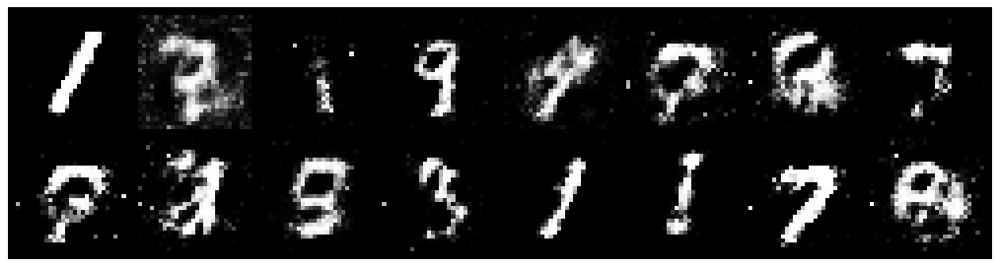

Epoch: [30/200], Batch Num: [200/600]
Discriminator Loss: 0.6666, Generator Loss: 2.2017
D(x): 0.7536, D(G(z)): 0.1898


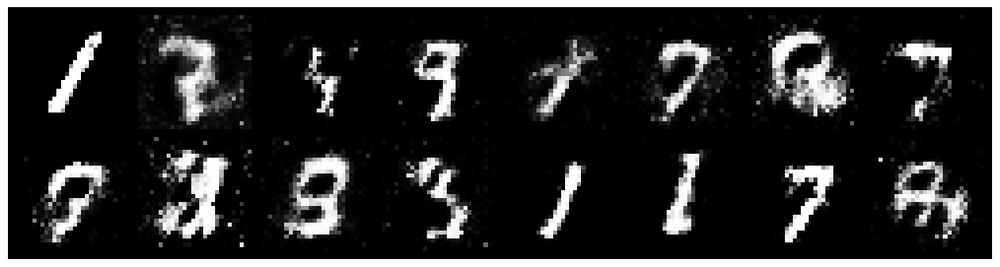

Epoch: [30/200], Batch Num: [400/600]
Discriminator Loss: 0.8608, Generator Loss: 2.2173
D(x): 0.7119, D(G(z)): 0.2208


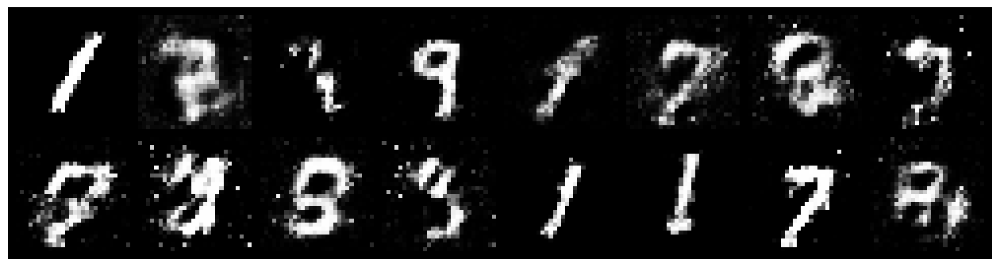

Epoch: [31/200], Batch Num: [0/600]
Discriminator Loss: 0.8135, Generator Loss: 1.8844
D(x): 0.8093, D(G(z)): 0.3201


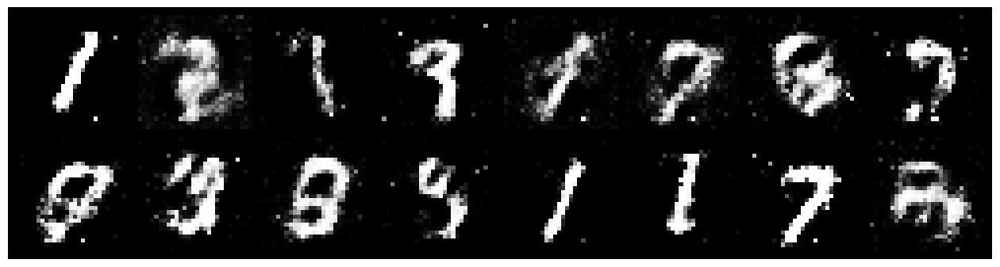

Epoch: [31/200], Batch Num: [200/600]
Discriminator Loss: 0.8180, Generator Loss: 2.0714
D(x): 0.7248, D(G(z)): 0.1964


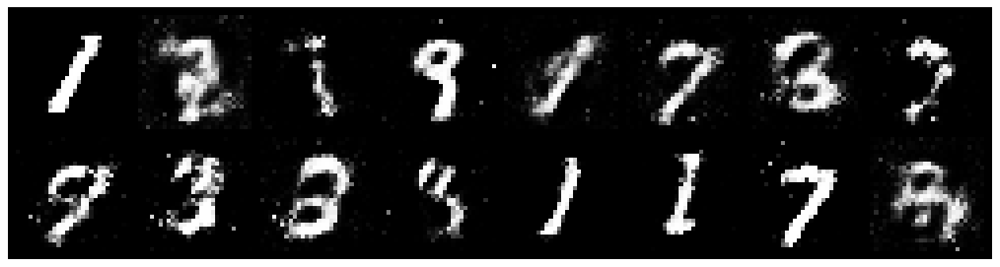

Epoch: [31/200], Batch Num: [400/600]
Discriminator Loss: 0.7682, Generator Loss: 1.5098
D(x): 0.7681, D(G(z)): 0.2925


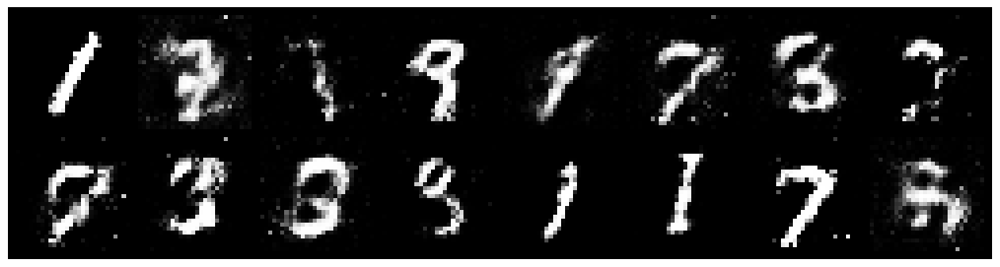

Epoch: [32/200], Batch Num: [0/600]
Discriminator Loss: 0.8988, Generator Loss: 1.7392
D(x): 0.7639, D(G(z)): 0.3224


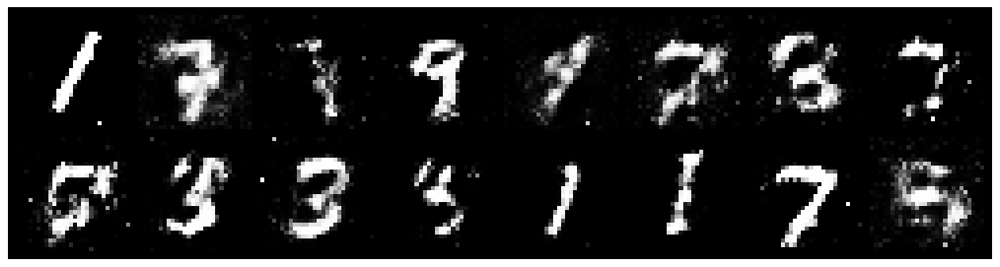

Epoch: [32/200], Batch Num: [200/600]
Discriminator Loss: 0.9769, Generator Loss: 1.3351
D(x): 0.7404, D(G(z)): 0.3844


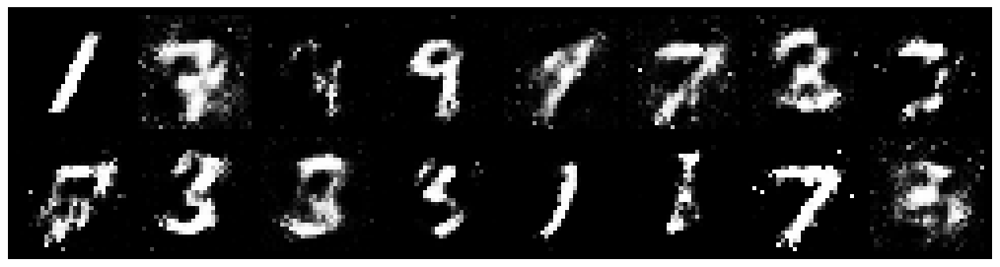

Epoch: [32/200], Batch Num: [400/600]
Discriminator Loss: 0.9871, Generator Loss: 1.3451
D(x): 0.7169, D(G(z)): 0.3351


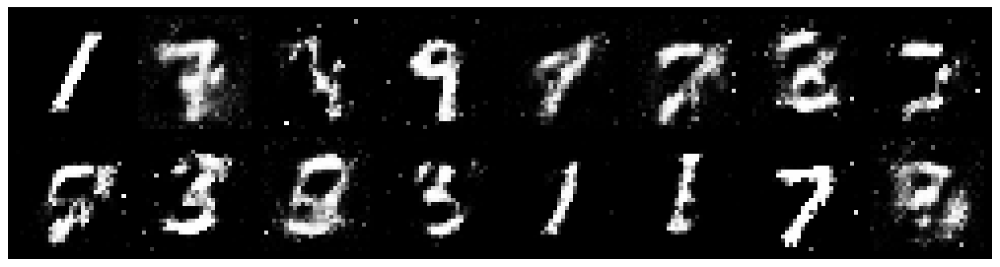

Epoch: [33/200], Batch Num: [0/600]
Discriminator Loss: 0.7961, Generator Loss: 1.8238
D(x): 0.7979, D(G(z)): 0.3043


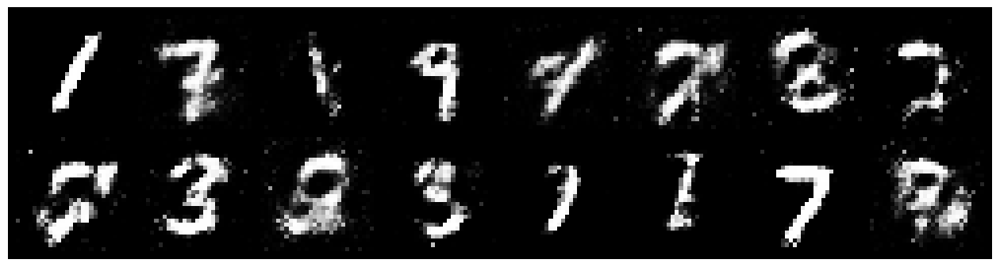

Epoch: [33/200], Batch Num: [200/600]
Discriminator Loss: 0.8249, Generator Loss: 1.4245
D(x): 0.7362, D(G(z)): 0.2552


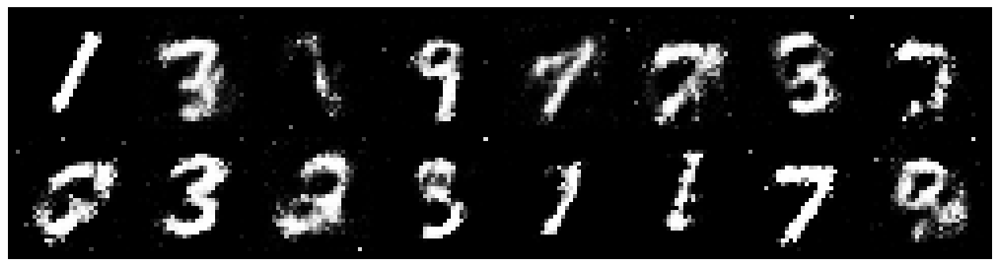

Epoch: [33/200], Batch Num: [400/600]
Discriminator Loss: 0.6941, Generator Loss: 1.5197
D(x): 0.7939, D(G(z)): 0.2619


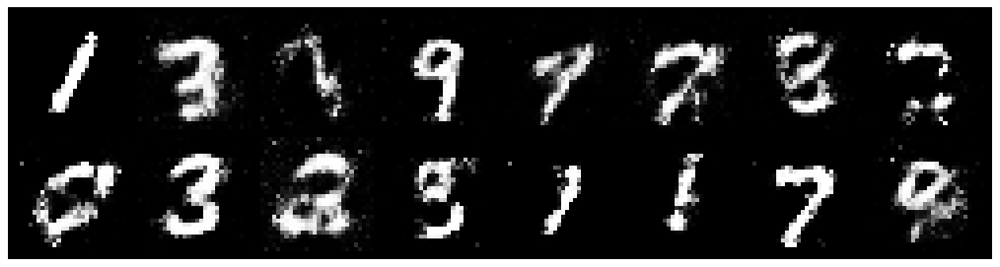

Epoch: [34/200], Batch Num: [0/600]
Discriminator Loss: 0.8066, Generator Loss: 1.7569
D(x): 0.7546, D(G(z)): 0.2922


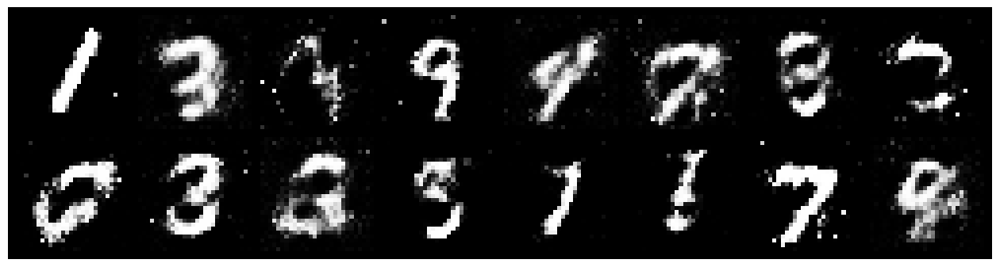

Epoch: [34/200], Batch Num: [200/600]
Discriminator Loss: 0.6599, Generator Loss: 1.6333
D(x): 0.7726, D(G(z)): 0.2511


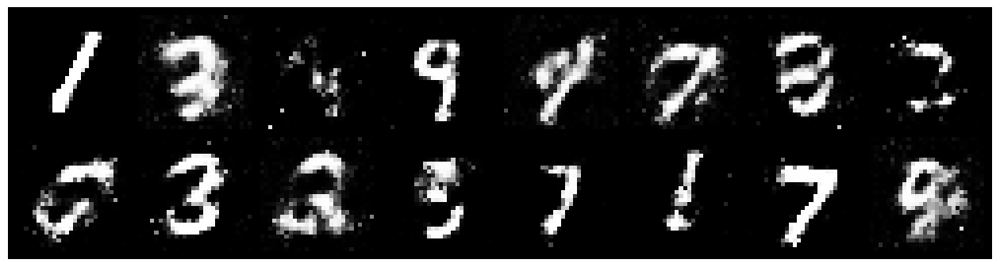

Epoch: [34/200], Batch Num: [400/600]
Discriminator Loss: 0.9266, Generator Loss: 1.8483
D(x): 0.6252, D(G(z)): 0.1983


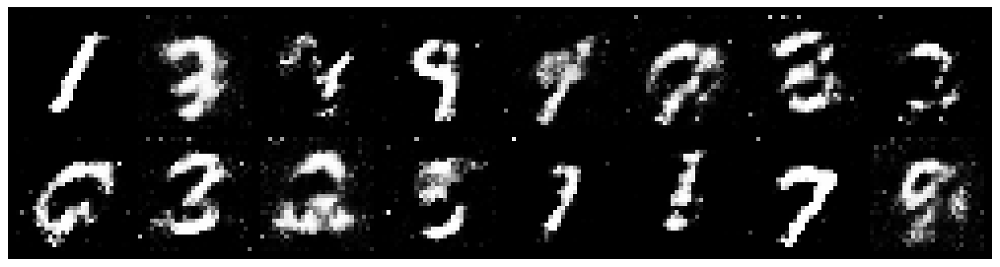

Epoch: [35/200], Batch Num: [0/600]
Discriminator Loss: 0.8376, Generator Loss: 1.8713
D(x): 0.7661, D(G(z)): 0.2598


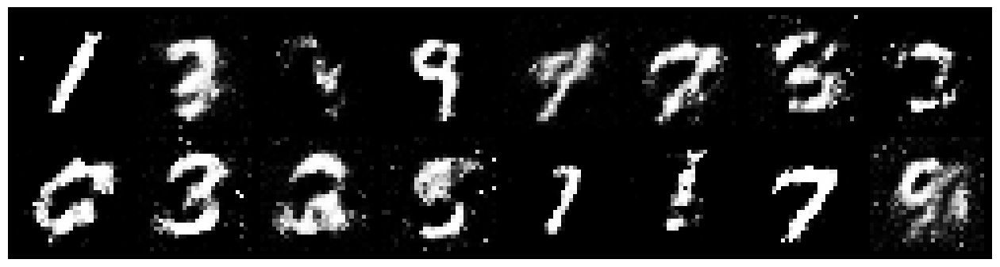

Epoch: [35/200], Batch Num: [200/600]
Discriminator Loss: 0.6835, Generator Loss: 2.1010
D(x): 0.7319, D(G(z)): 0.1886


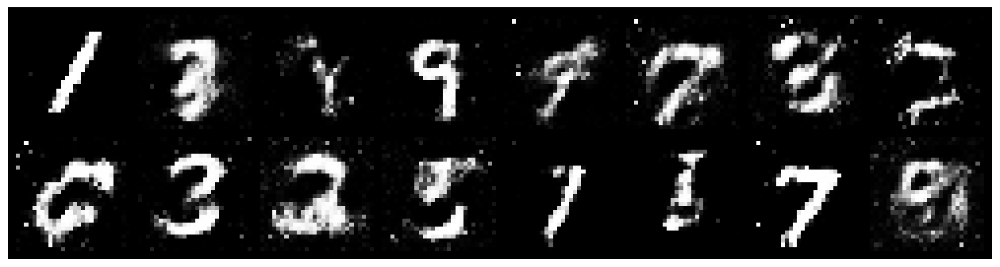

Epoch: [35/200], Batch Num: [400/600]
Discriminator Loss: 0.9827, Generator Loss: 1.7044
D(x): 0.7158, D(G(z)): 0.3121


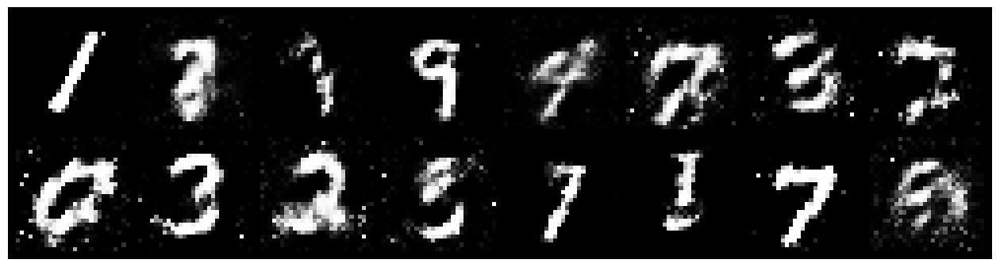

Epoch: [36/200], Batch Num: [0/600]
Discriminator Loss: 0.6977, Generator Loss: 1.9186
D(x): 0.7533, D(G(z)): 0.2327


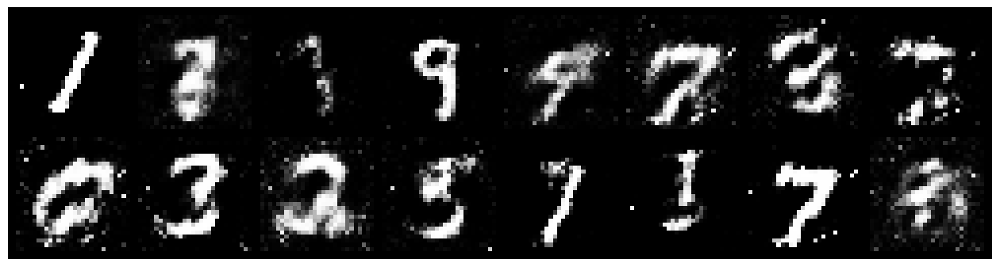

Epoch: [36/200], Batch Num: [200/600]
Discriminator Loss: 0.8219, Generator Loss: 1.4992
D(x): 0.7578, D(G(z)): 0.3090


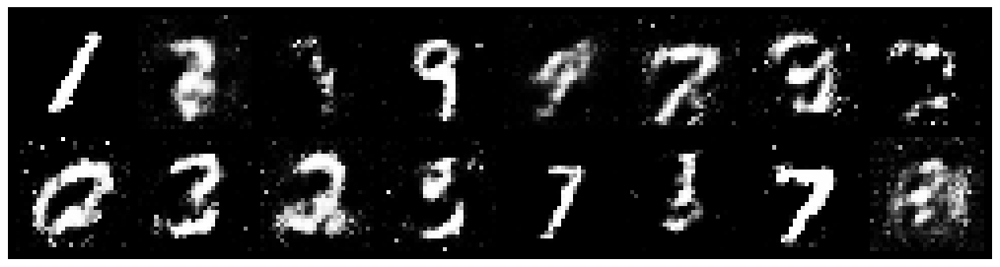

Epoch: [36/200], Batch Num: [400/600]
Discriminator Loss: 0.7690, Generator Loss: 1.6169
D(x): 0.7742, D(G(z)): 0.2789


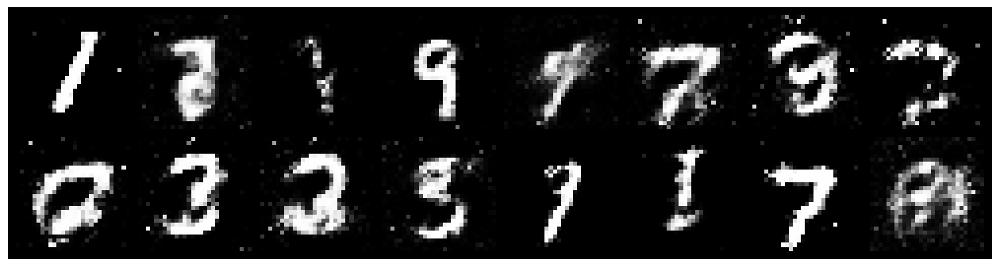

Epoch: [37/200], Batch Num: [0/600]
Discriminator Loss: 0.7903, Generator Loss: 2.0419
D(x): 0.6887, D(G(z)): 0.2007


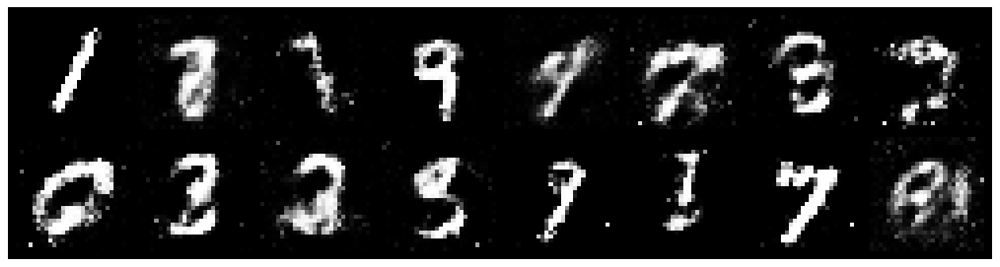

Epoch: [37/200], Batch Num: [200/600]
Discriminator Loss: 0.7063, Generator Loss: 2.4960
D(x): 0.7268, D(G(z)): 0.1731


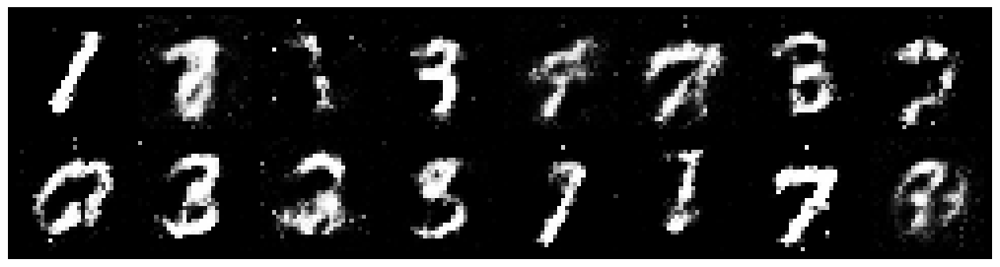

Epoch: [37/200], Batch Num: [400/600]
Discriminator Loss: 0.9691, Generator Loss: 1.4080
D(x): 0.7244, D(G(z)): 0.3231


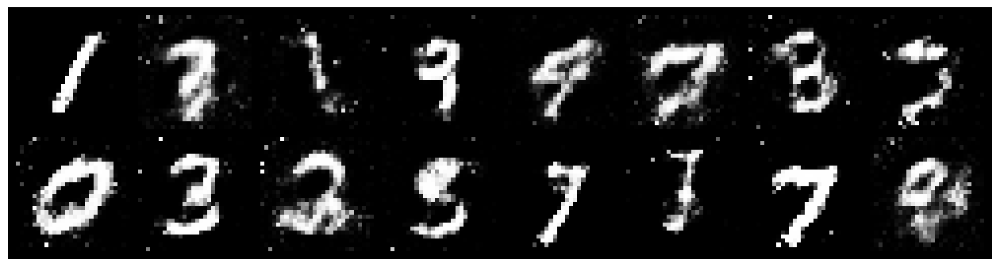

Epoch: [38/200], Batch Num: [0/600]
Discriminator Loss: 0.7688, Generator Loss: 1.7278
D(x): 0.7927, D(G(z)): 0.3260


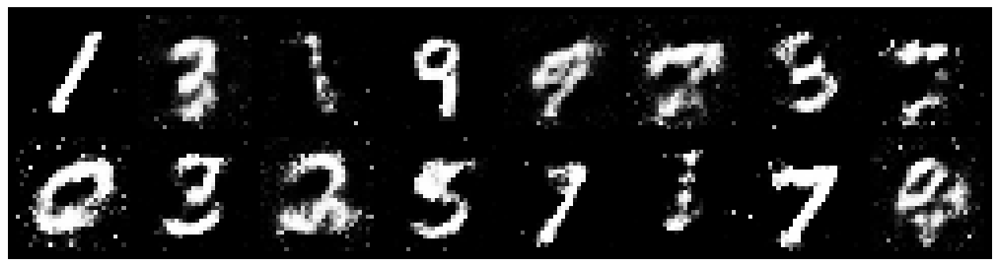

Epoch: [38/200], Batch Num: [200/600]
Discriminator Loss: 0.7324, Generator Loss: 2.0542
D(x): 0.7494, D(G(z)): 0.2294


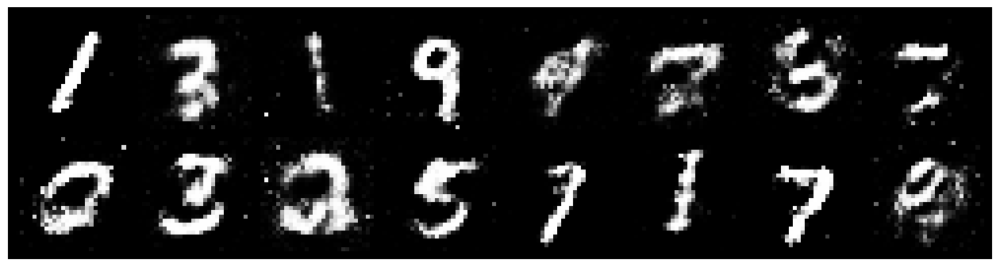

Epoch: [38/200], Batch Num: [400/600]
Discriminator Loss: 0.8282, Generator Loss: 1.9891
D(x): 0.6932, D(G(z)): 0.2030


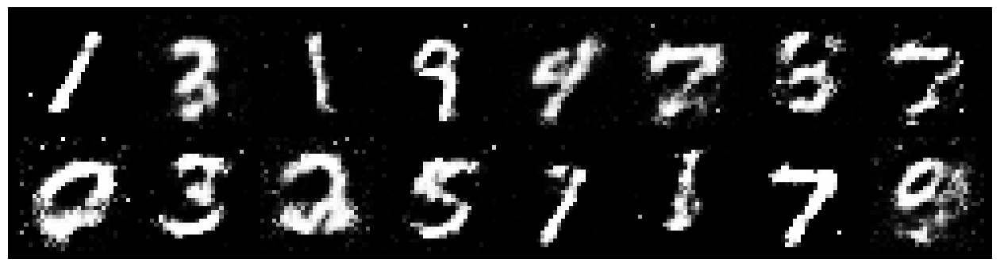

Epoch: [39/200], Batch Num: [0/600]
Discriminator Loss: 0.9692, Generator Loss: 1.4299
D(x): 0.7032, D(G(z)): 0.3266


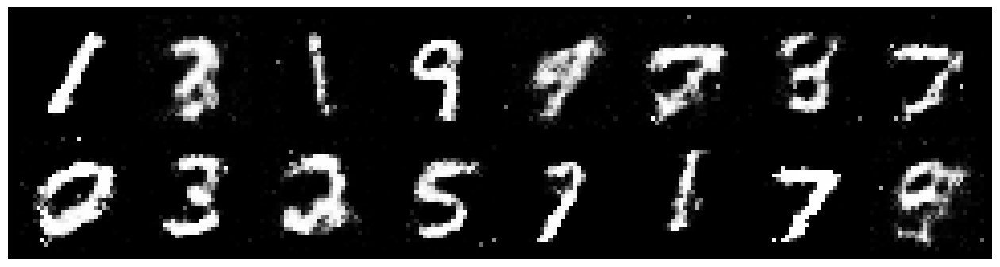

Epoch: [39/200], Batch Num: [200/600]
Discriminator Loss: 0.8577, Generator Loss: 2.2098
D(x): 0.6726, D(G(z)): 0.2130


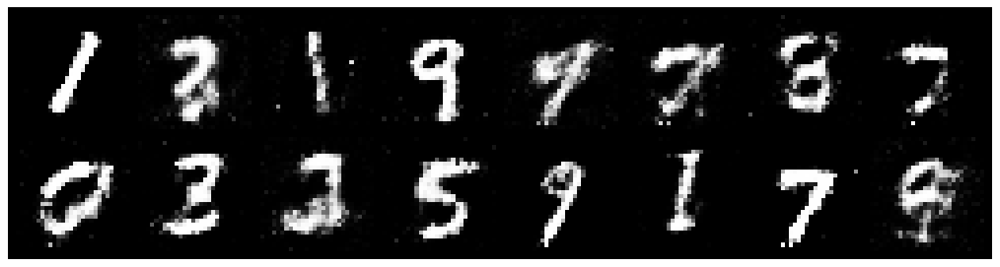

Epoch: [39/200], Batch Num: [400/600]
Discriminator Loss: 0.7619, Generator Loss: 1.6398
D(x): 0.7282, D(G(z)): 0.2499


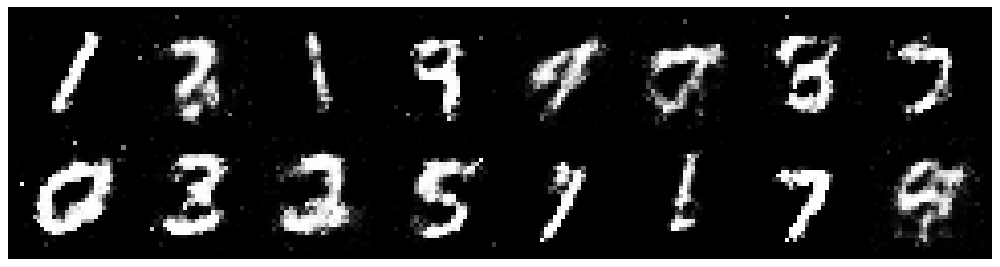

Epoch: [40/200], Batch Num: [0/600]
Discriminator Loss: 0.9400, Generator Loss: 1.4291
D(x): 0.6784, D(G(z)): 0.2768


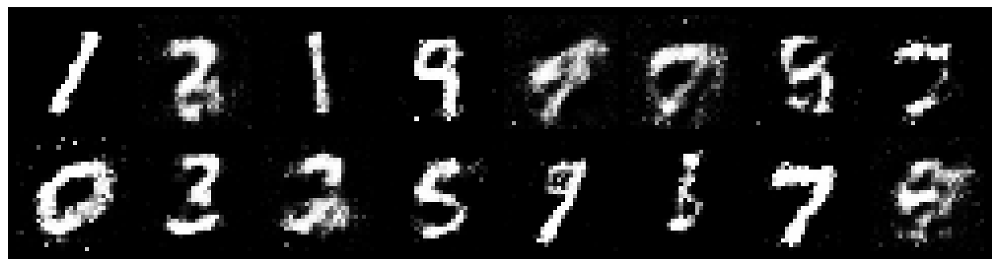

Epoch: [40/200], Batch Num: [200/600]
Discriminator Loss: 0.8486, Generator Loss: 1.8120
D(x): 0.7234, D(G(z)): 0.3035


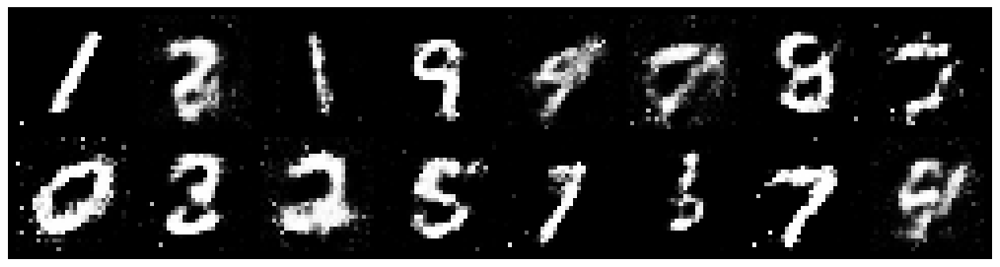

Epoch: [40/200], Batch Num: [400/600]
Discriminator Loss: 0.8301, Generator Loss: 1.4533
D(x): 0.7571, D(G(z)): 0.3362


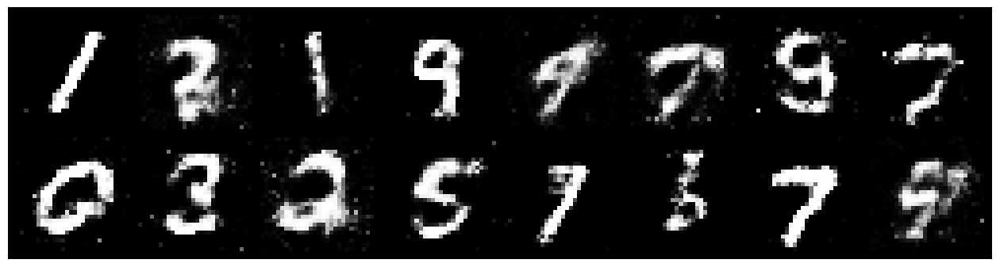

Epoch: [41/200], Batch Num: [0/600]
Discriminator Loss: 0.9100, Generator Loss: 1.5666
D(x): 0.7702, D(G(z)): 0.3667


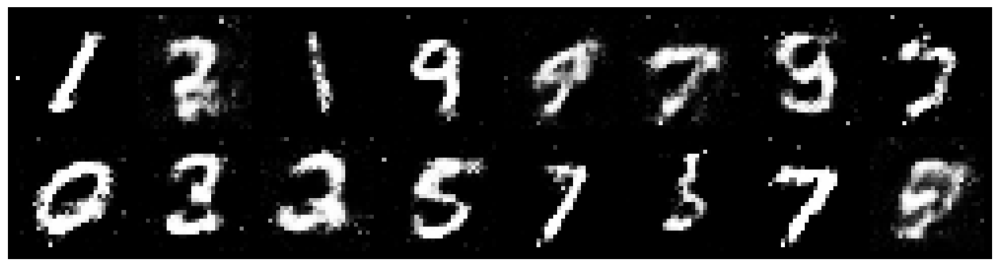

Epoch: [41/200], Batch Num: [200/600]
Discriminator Loss: 0.7476, Generator Loss: 1.5825
D(x): 0.7518, D(G(z)): 0.2803


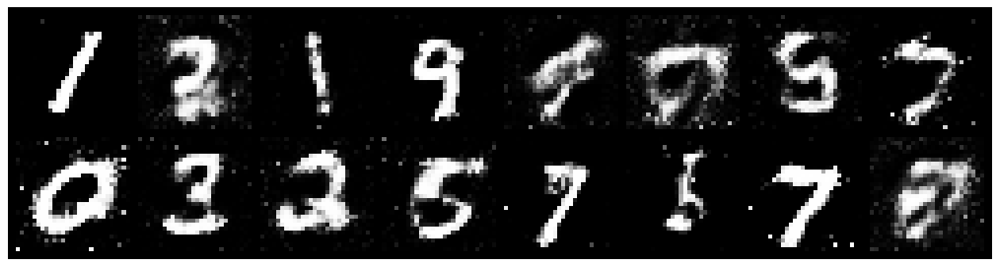

Epoch: [41/200], Batch Num: [400/600]
Discriminator Loss: 0.9904, Generator Loss: 1.3305
D(x): 0.6510, D(G(z)): 0.3095


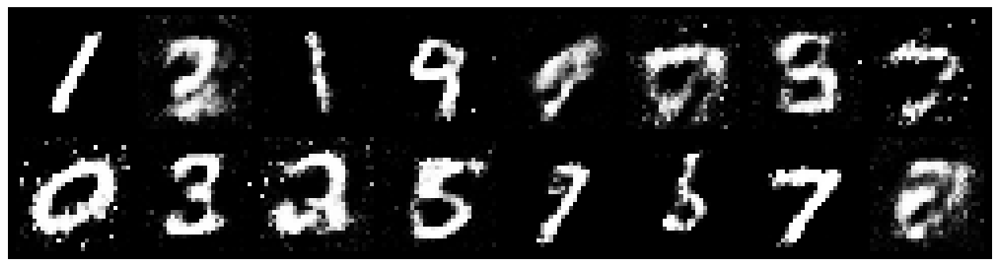

Epoch: [42/200], Batch Num: [0/600]
Discriminator Loss: 0.9458, Generator Loss: 1.6498
D(x): 0.6702, D(G(z)): 0.2680


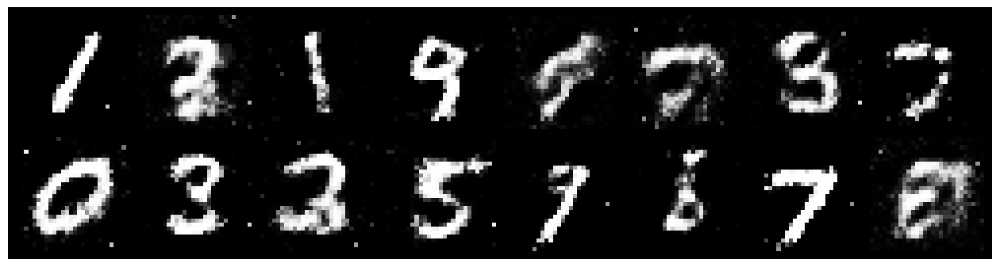

Epoch: [42/200], Batch Num: [200/600]
Discriminator Loss: 0.9741, Generator Loss: 1.4404
D(x): 0.6988, D(G(z)): 0.3018


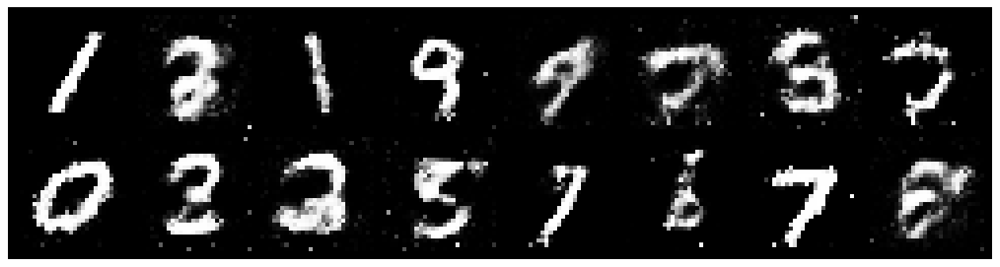

Epoch: [42/200], Batch Num: [400/600]
Discriminator Loss: 0.7189, Generator Loss: 1.8142
D(x): 0.7557, D(G(z)): 0.2375


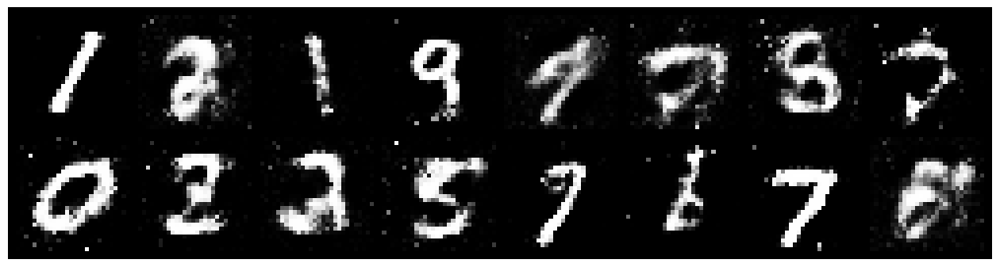

Epoch: [43/200], Batch Num: [0/600]
Discriminator Loss: 0.9884, Generator Loss: 1.3171
D(x): 0.6839, D(G(z)): 0.3323


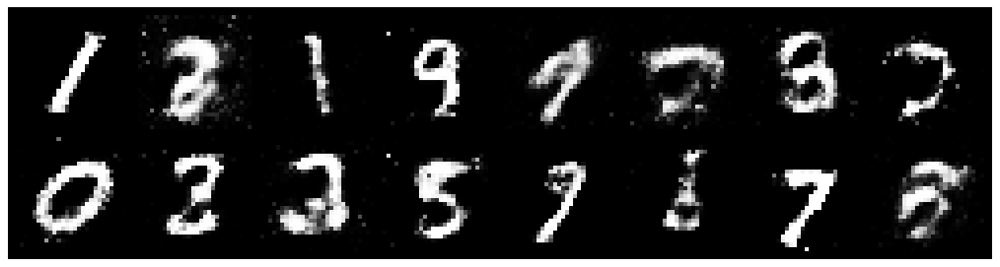

Epoch: [43/200], Batch Num: [200/600]
Discriminator Loss: 0.8996, Generator Loss: 1.1966
D(x): 0.7233, D(G(z)): 0.3365


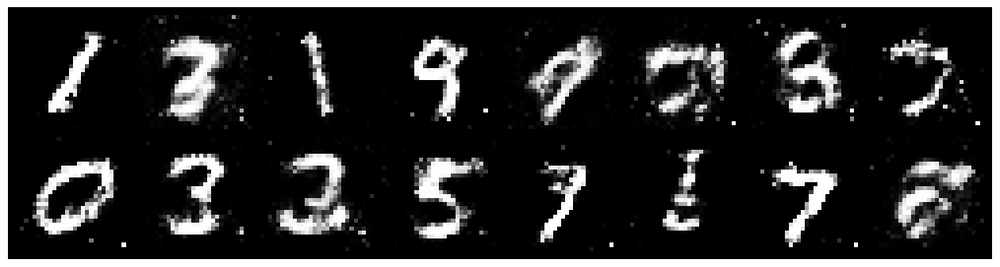

Epoch: [43/200], Batch Num: [400/600]
Discriminator Loss: 1.0538, Generator Loss: 1.3701
D(x): 0.7124, D(G(z)): 0.3844


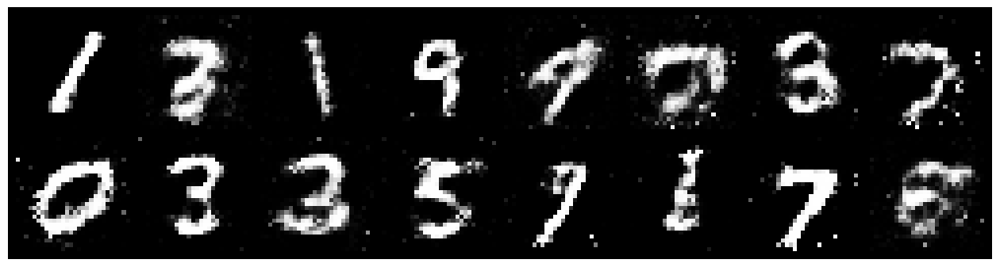

Epoch: [44/200], Batch Num: [0/600]
Discriminator Loss: 0.7956, Generator Loss: 1.6060
D(x): 0.6685, D(G(z)): 0.2312


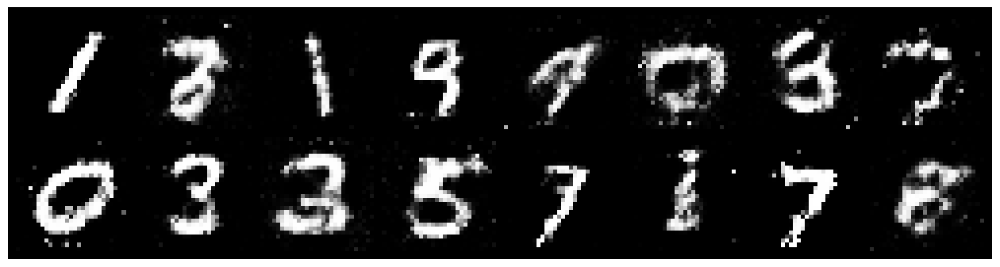

Epoch: [44/200], Batch Num: [200/600]
Discriminator Loss: 1.1302, Generator Loss: 1.5260
D(x): 0.7081, D(G(z)): 0.4185


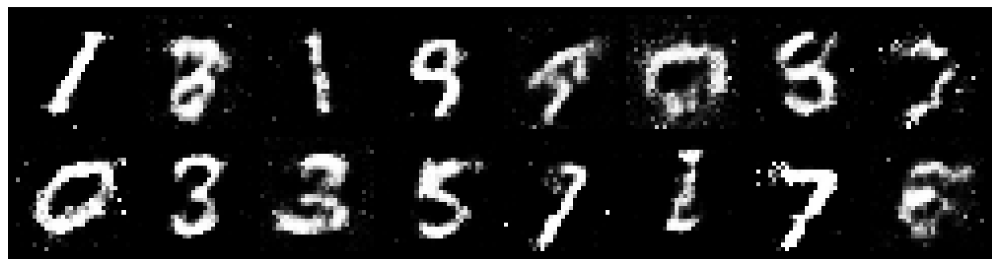

Epoch: [44/200], Batch Num: [400/600]
Discriminator Loss: 0.8280, Generator Loss: 1.8151
D(x): 0.7251, D(G(z)): 0.2839


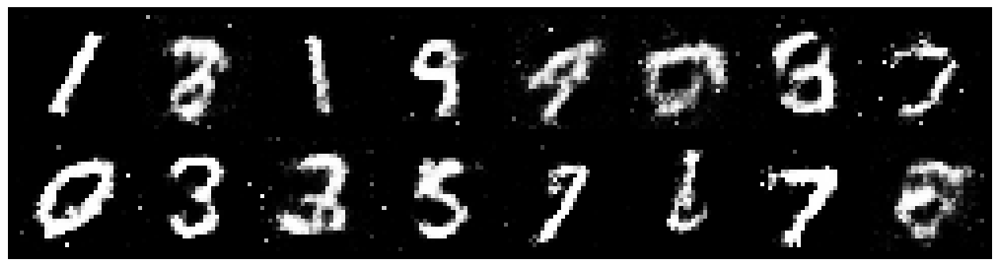

Epoch: [45/200], Batch Num: [0/600]
Discriminator Loss: 0.8698, Generator Loss: 1.6442
D(x): 0.6558, D(G(z)): 0.2138


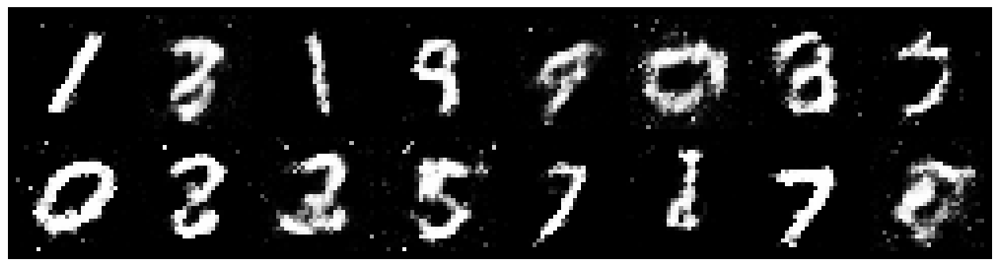

Epoch: [45/200], Batch Num: [200/600]
Discriminator Loss: 0.9809, Generator Loss: 1.4993
D(x): 0.7082, D(G(z)): 0.3424


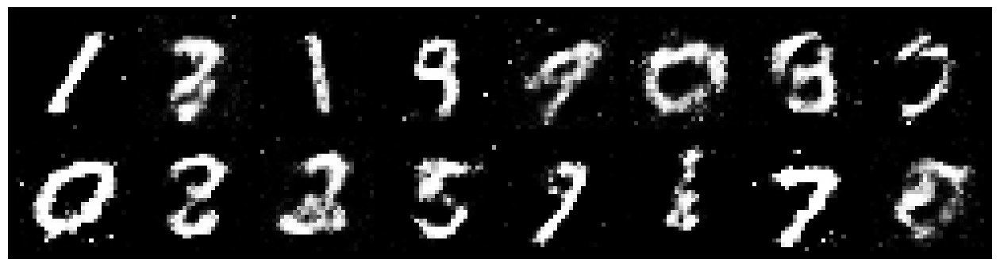

Epoch: [45/200], Batch Num: [400/600]
Discriminator Loss: 0.9563, Generator Loss: 1.6706
D(x): 0.6656, D(G(z)): 0.2924


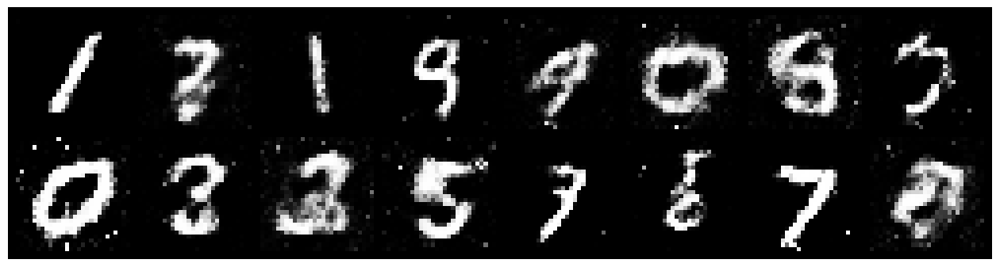

Epoch: [46/200], Batch Num: [0/600]
Discriminator Loss: 1.0868, Generator Loss: 1.3448
D(x): 0.6791, D(G(z)): 0.3689


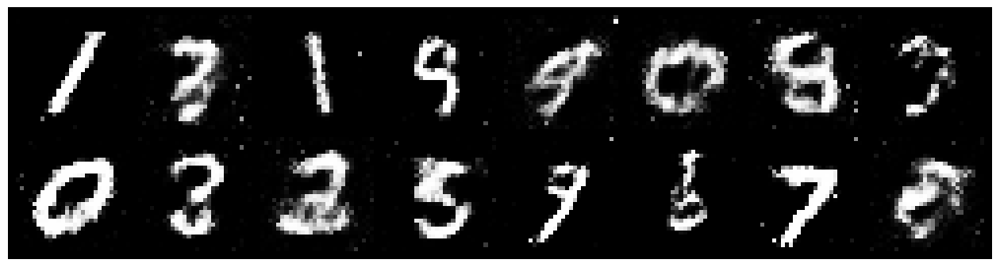

Epoch: [46/200], Batch Num: [200/600]
Discriminator Loss: 0.8961, Generator Loss: 1.4703
D(x): 0.6803, D(G(z)): 0.2809


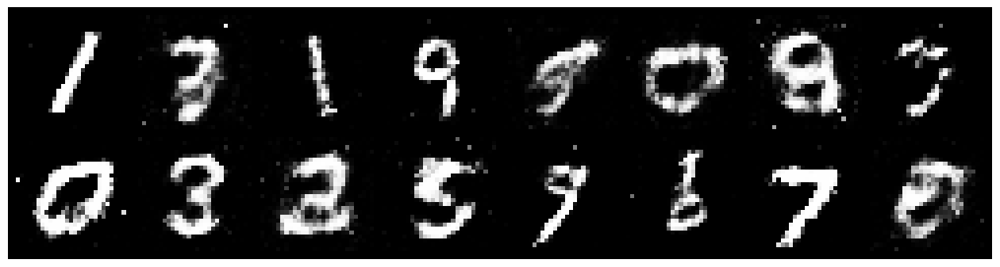

Epoch: [46/200], Batch Num: [400/600]
Discriminator Loss: 1.0252, Generator Loss: 1.1989
D(x): 0.6781, D(G(z)): 0.3422


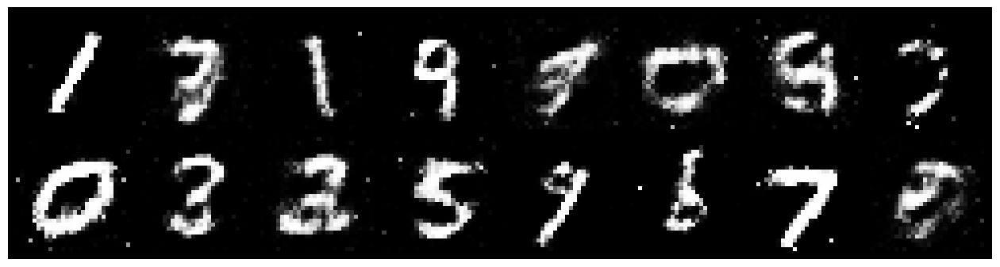

Epoch: [47/200], Batch Num: [0/600]
Discriminator Loss: 0.8881, Generator Loss: 1.7658
D(x): 0.6632, D(G(z)): 0.2456


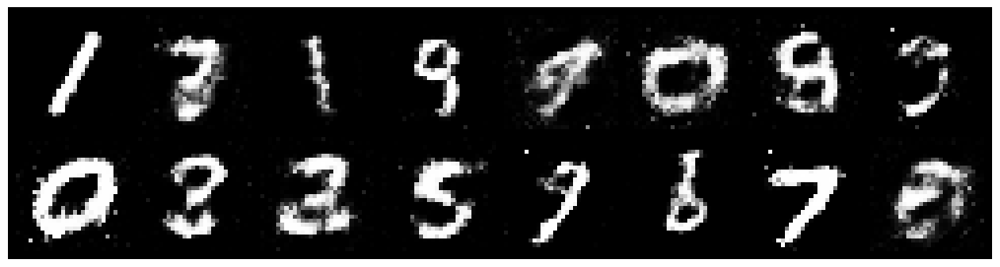

Epoch: [47/200], Batch Num: [200/600]
Discriminator Loss: 1.0699, Generator Loss: 1.3551
D(x): 0.6444, D(G(z)): 0.3483


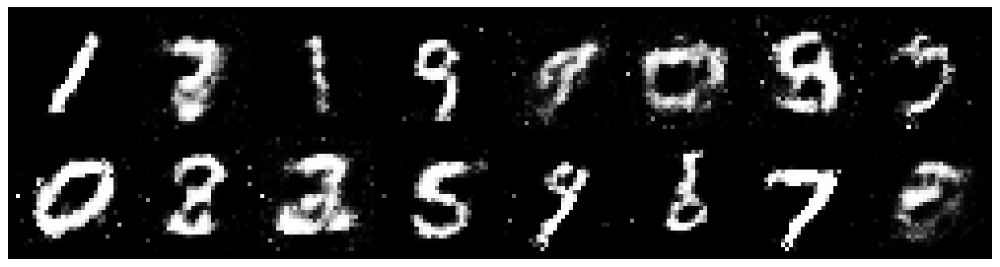

Epoch: [47/200], Batch Num: [400/600]
Discriminator Loss: 1.1753, Generator Loss: 1.2122
D(x): 0.5710, D(G(z)): 0.3194


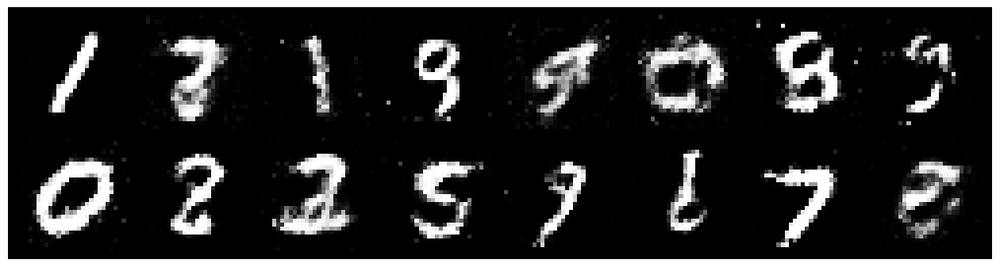

Epoch: [48/200], Batch Num: [0/600]
Discriminator Loss: 1.0392, Generator Loss: 1.3143
D(x): 0.6805, D(G(z)): 0.3670


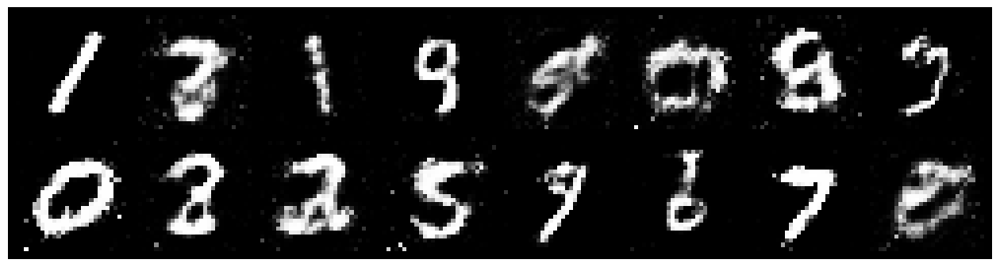

Epoch: [48/200], Batch Num: [200/600]
Discriminator Loss: 1.0029, Generator Loss: 1.2633
D(x): 0.6724, D(G(z)): 0.3504


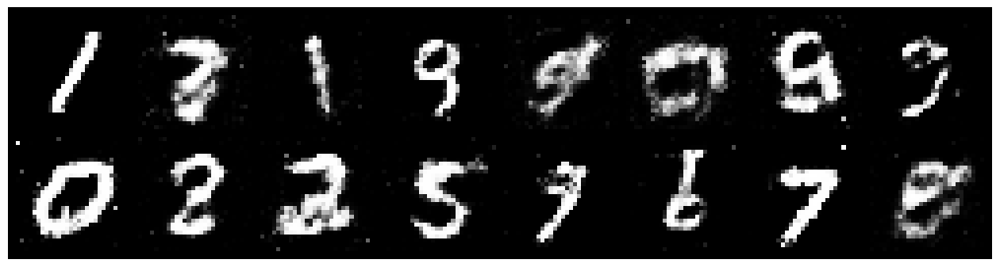

Epoch: [48/200], Batch Num: [400/600]
Discriminator Loss: 1.0018, Generator Loss: 1.3238
D(x): 0.6404, D(G(z)): 0.3336


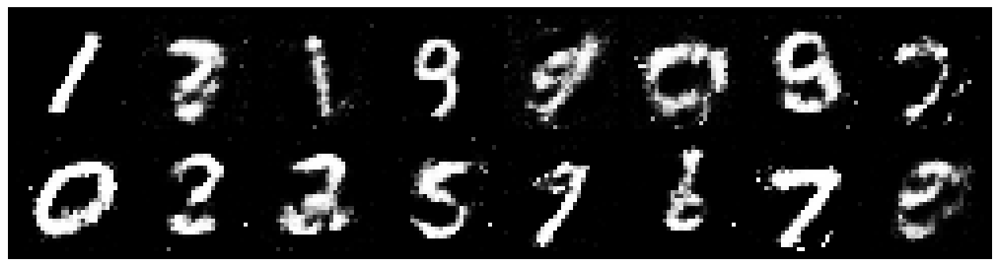

Epoch: [49/200], Batch Num: [0/600]
Discriminator Loss: 0.9082, Generator Loss: 1.9923
D(x): 0.6629, D(G(z)): 0.2328


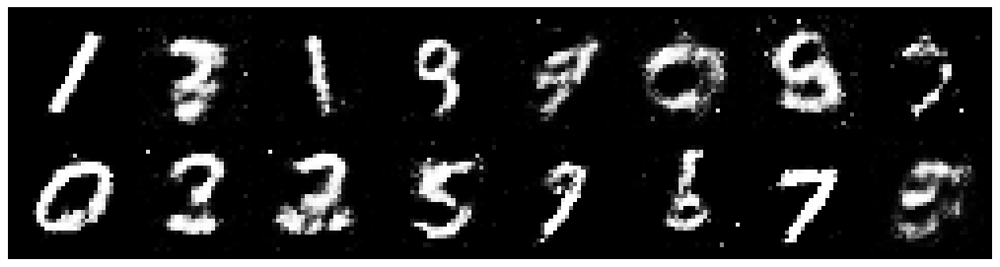

Epoch: [49/200], Batch Num: [200/600]
Discriminator Loss: 0.7678, Generator Loss: 1.5816
D(x): 0.7930, D(G(z)): 0.3173


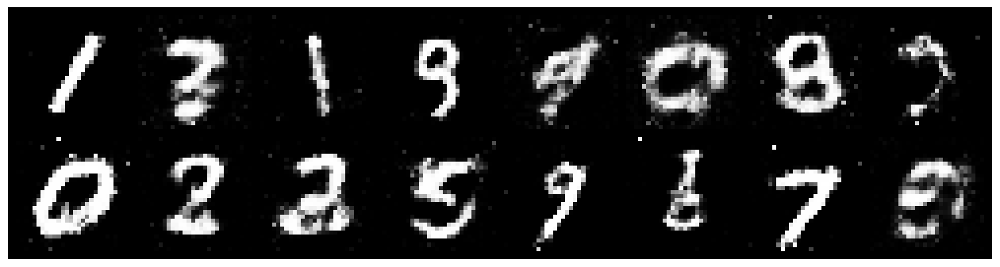

Epoch: [49/200], Batch Num: [400/600]
Discriminator Loss: 0.9046, Generator Loss: 1.6401
D(x): 0.6722, D(G(z)): 0.2650


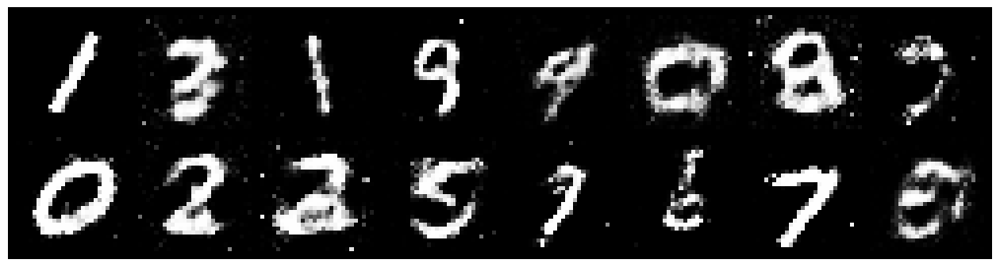

Epoch: [50/200], Batch Num: [0/600]
Discriminator Loss: 0.8239, Generator Loss: 1.3478
D(x): 0.7181, D(G(z)): 0.2878


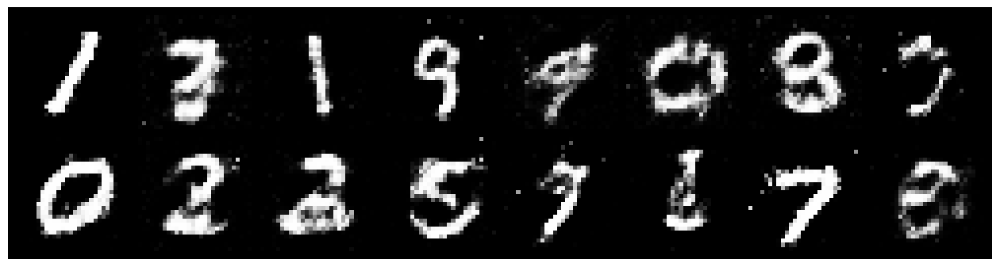

Epoch: [50/200], Batch Num: [200/600]
Discriminator Loss: 0.9166, Generator Loss: 1.4090
D(x): 0.6157, D(G(z)): 0.2404


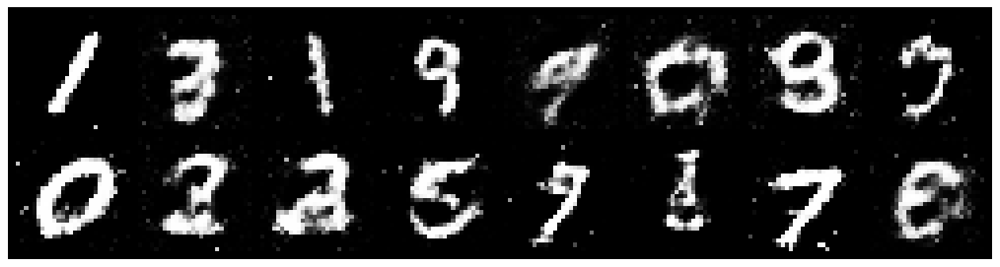

Epoch: [50/200], Batch Num: [400/600]
Discriminator Loss: 0.9138, Generator Loss: 1.4625
D(x): 0.6876, D(G(z)): 0.3237


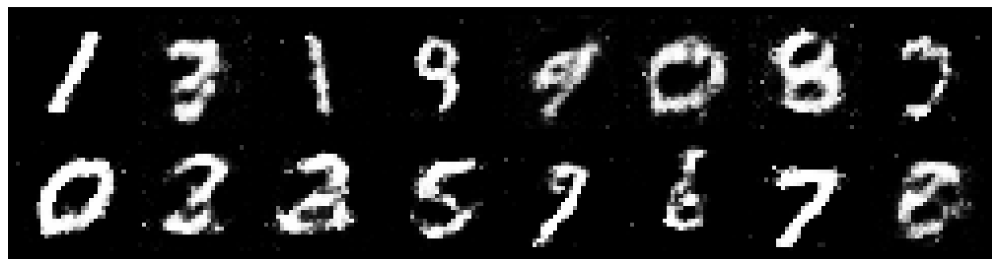

Epoch: [51/200], Batch Num: [0/600]
Discriminator Loss: 1.0484, Generator Loss: 1.2591
D(x): 0.6786, D(G(z)): 0.3682


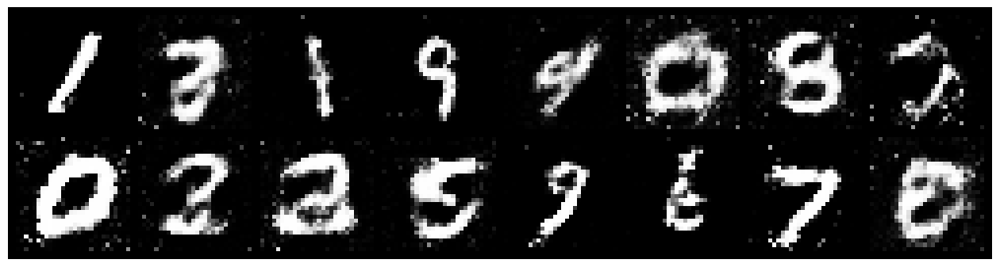

Epoch: [51/200], Batch Num: [200/600]
Discriminator Loss: 0.8564, Generator Loss: 1.4530
D(x): 0.7151, D(G(z)): 0.2959


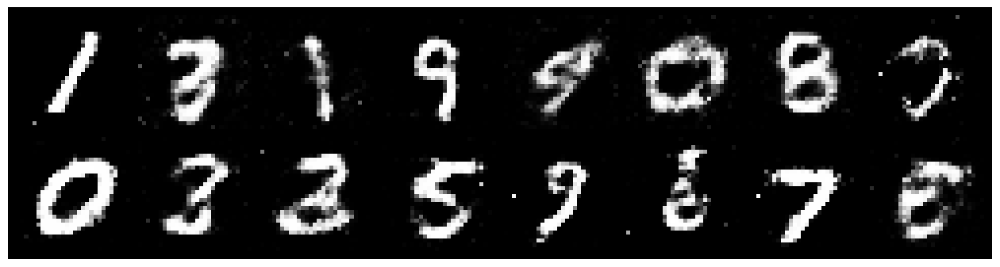

Epoch: [51/200], Batch Num: [400/600]
Discriminator Loss: 1.0582, Generator Loss: 1.4093
D(x): 0.6298, D(G(z)): 0.3271


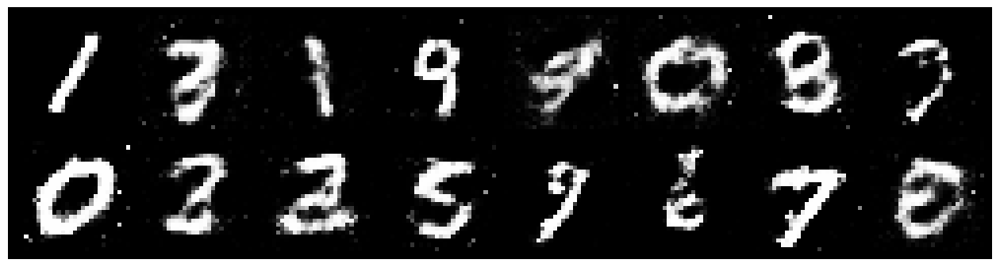

Epoch: [52/200], Batch Num: [0/600]
Discriminator Loss: 1.0802, Generator Loss: 1.1860
D(x): 0.6692, D(G(z)): 0.3887


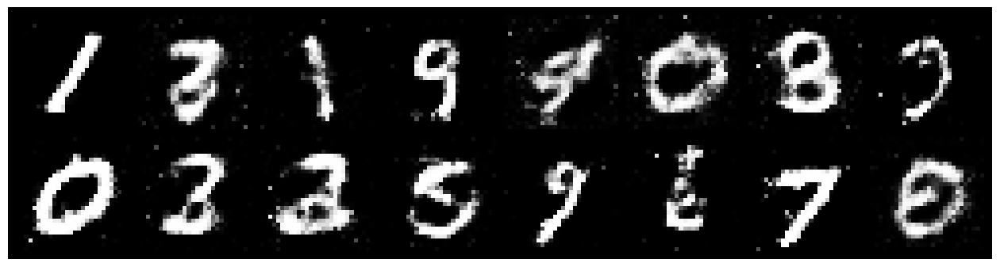

Epoch: [52/200], Batch Num: [200/600]
Discriminator Loss: 1.0703, Generator Loss: 1.6291
D(x): 0.5995, D(G(z)): 0.2947


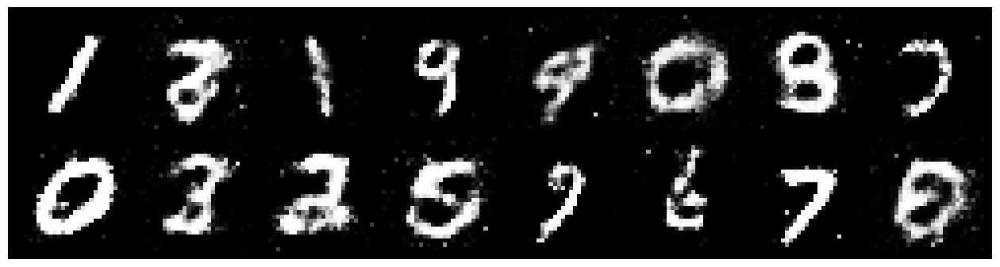

Epoch: [52/200], Batch Num: [400/600]
Discriminator Loss: 0.8768, Generator Loss: 1.2736
D(x): 0.7011, D(G(z)): 0.3011


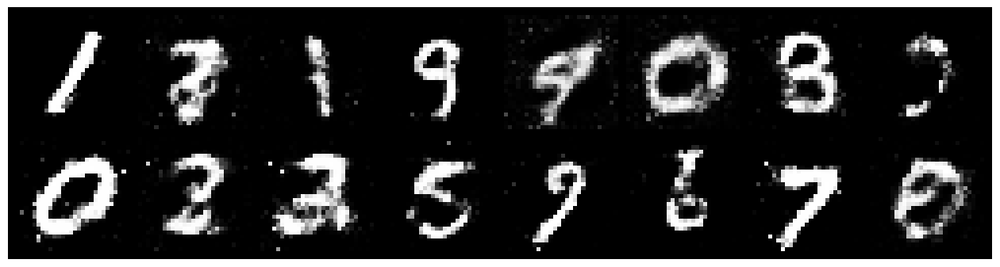

Epoch: [53/200], Batch Num: [0/600]
Discriminator Loss: 1.0745, Generator Loss: 1.2653
D(x): 0.5907, D(G(z)): 0.3125


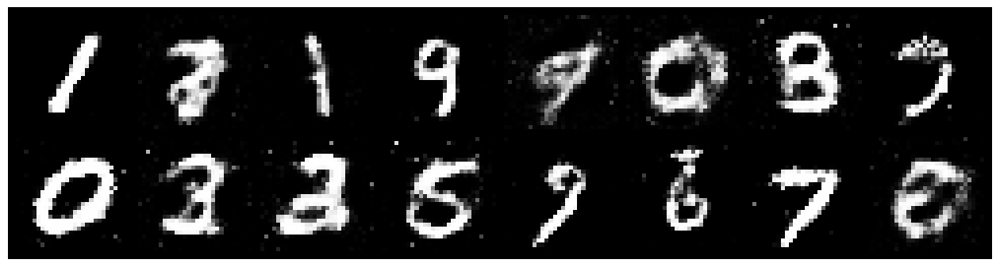

Epoch: [53/200], Batch Num: [200/600]
Discriminator Loss: 0.8817, Generator Loss: 1.3560
D(x): 0.7022, D(G(z)): 0.3193


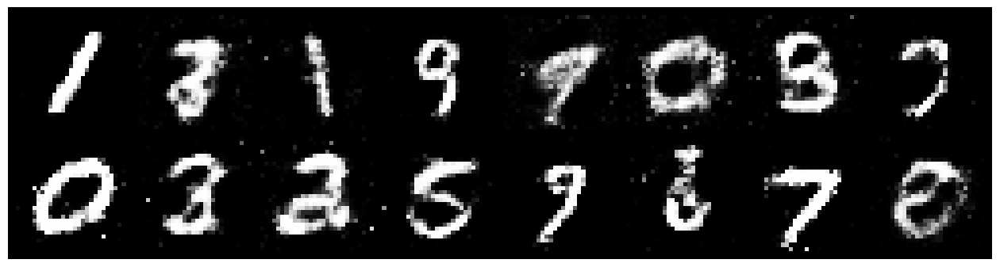

Epoch: [53/200], Batch Num: [400/600]
Discriminator Loss: 0.9527, Generator Loss: 1.4405
D(x): 0.6163, D(G(z)): 0.2783


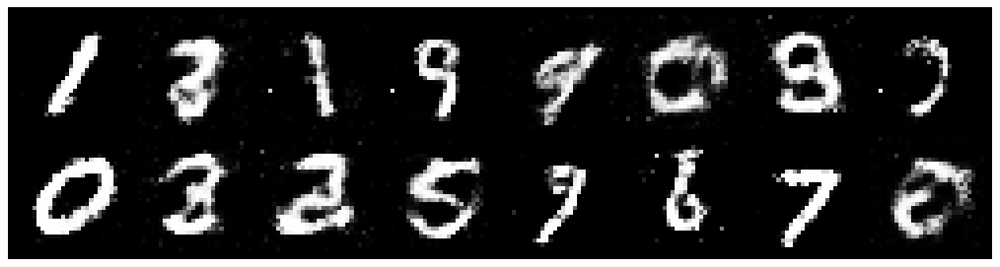

Epoch: [54/200], Batch Num: [0/600]
Discriminator Loss: 1.0404, Generator Loss: 1.2304
D(x): 0.6259, D(G(z)): 0.3351


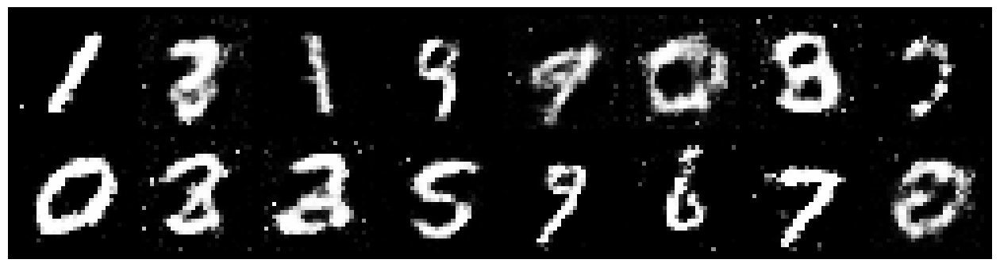

Epoch: [54/200], Batch Num: [200/600]
Discriminator Loss: 1.1312, Generator Loss: 1.3755
D(x): 0.6249, D(G(z)): 0.3332


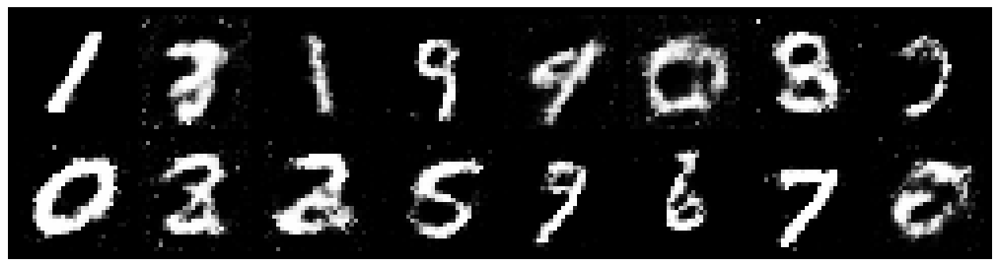

Epoch: [54/200], Batch Num: [400/600]
Discriminator Loss: 1.1333, Generator Loss: 0.9783
D(x): 0.6689, D(G(z)): 0.4296


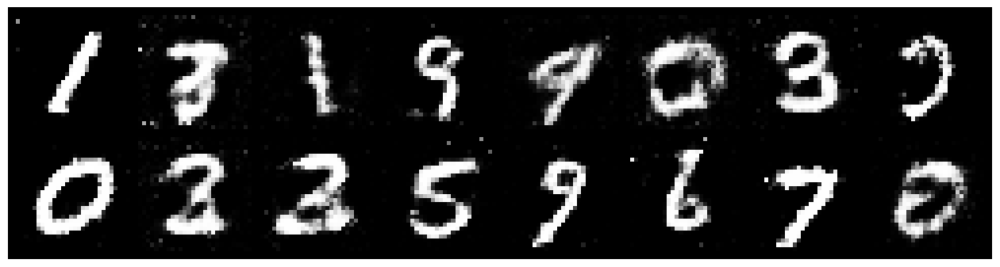

Epoch: [55/200], Batch Num: [0/600]
Discriminator Loss: 1.1452, Generator Loss: 1.1403
D(x): 0.6052, D(G(z)): 0.3519


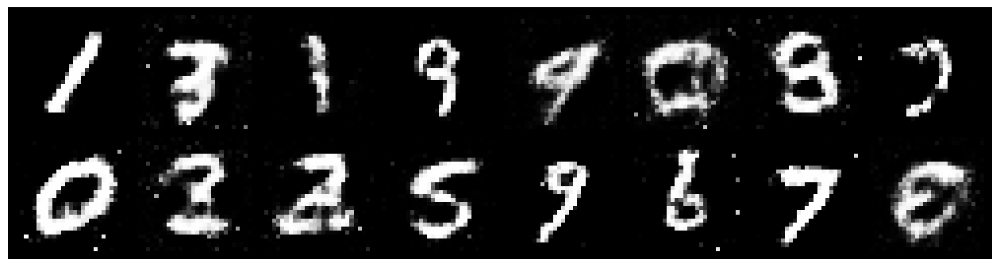

Epoch: [55/200], Batch Num: [200/600]
Discriminator Loss: 0.8846, Generator Loss: 1.2564
D(x): 0.7195, D(G(z)): 0.3467


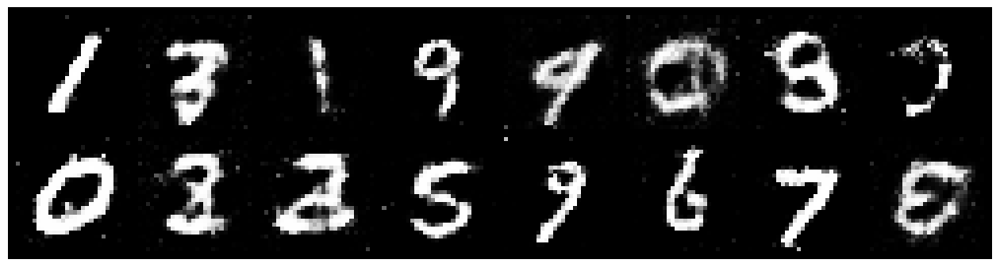

Epoch: [55/200], Batch Num: [400/600]
Discriminator Loss: 1.0671, Generator Loss: 1.2971
D(x): 0.6124, D(G(z)): 0.3266


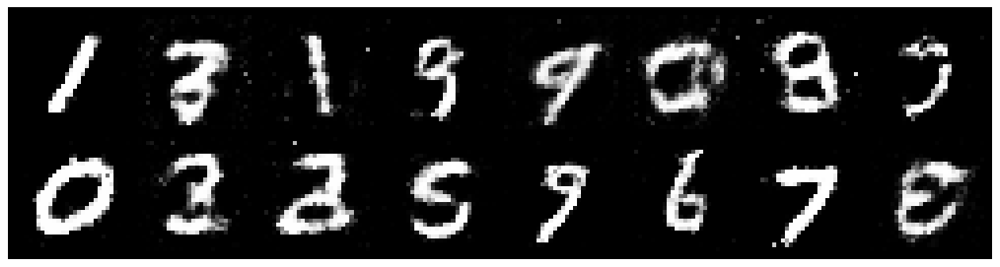

Epoch: [56/200], Batch Num: [0/600]
Discriminator Loss: 0.9734, Generator Loss: 1.3893
D(x): 0.6941, D(G(z)): 0.3581


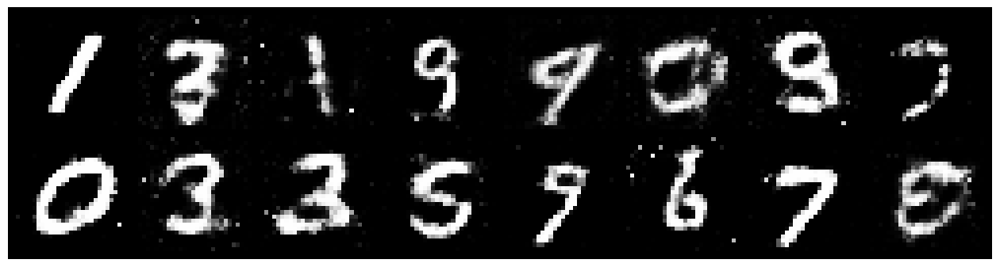

Epoch: [56/200], Batch Num: [200/600]
Discriminator Loss: 0.9808, Generator Loss: 1.4164
D(x): 0.6673, D(G(z)): 0.3295


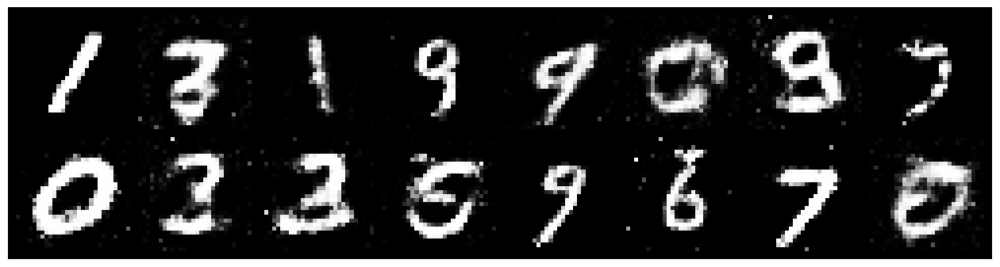

Epoch: [56/200], Batch Num: [400/600]
Discriminator Loss: 1.0237, Generator Loss: 1.2936
D(x): 0.6185, D(G(z)): 0.3364


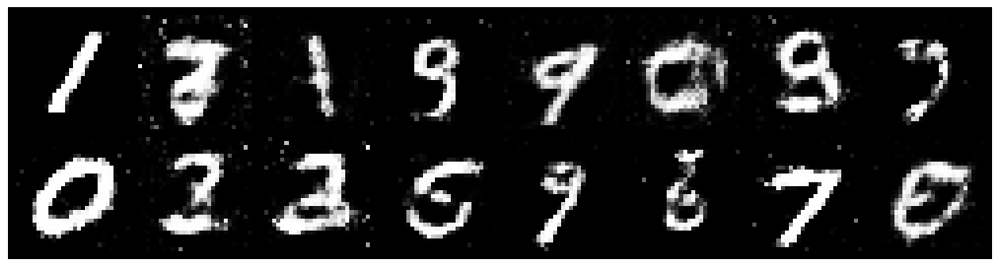

Epoch: [57/200], Batch Num: [0/600]
Discriminator Loss: 1.0655, Generator Loss: 1.3851
D(x): 0.6571, D(G(z)): 0.3695


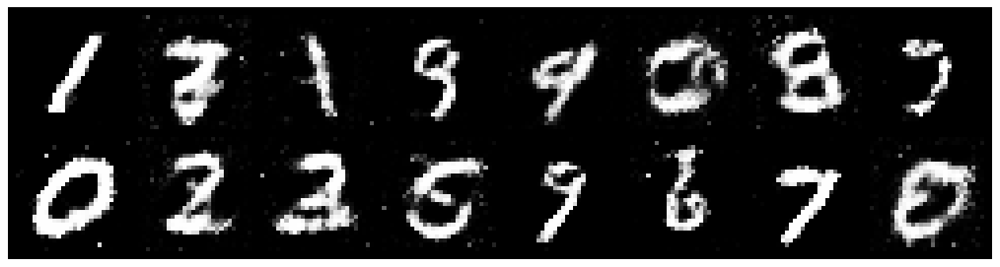

Epoch: [57/200], Batch Num: [200/600]
Discriminator Loss: 1.1400, Generator Loss: 1.2019
D(x): 0.6566, D(G(z)): 0.3974


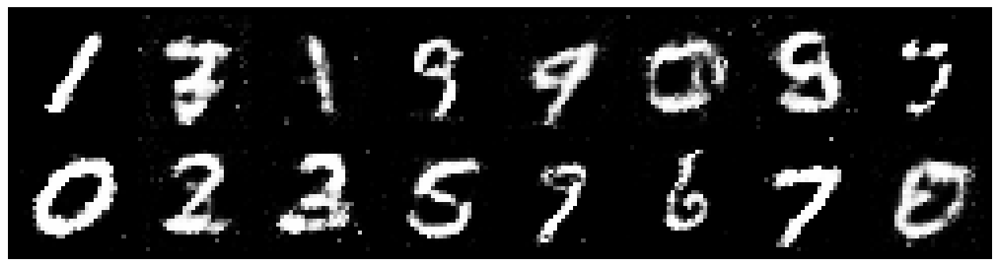

Epoch: [57/200], Batch Num: [400/600]
Discriminator Loss: 0.9960, Generator Loss: 1.4543
D(x): 0.6734, D(G(z)): 0.3569


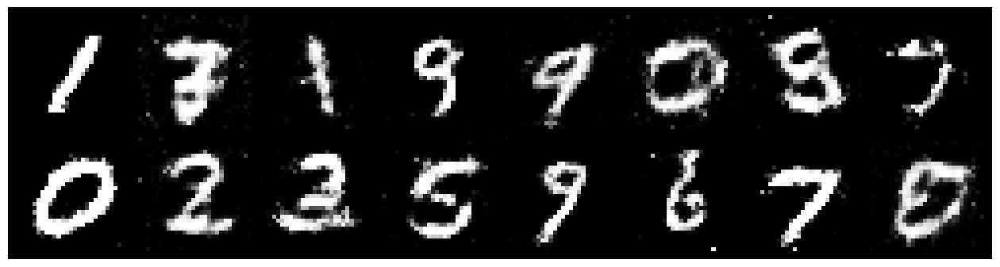

Epoch: [58/200], Batch Num: [0/600]
Discriminator Loss: 1.0167, Generator Loss: 1.2619
D(x): 0.6295, D(G(z)): 0.3413


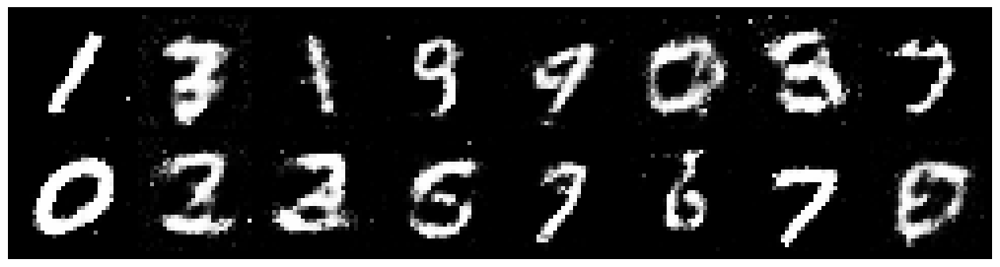

Epoch: [58/200], Batch Num: [200/600]
Discriminator Loss: 0.9093, Generator Loss: 1.3472
D(x): 0.6432, D(G(z)): 0.2820


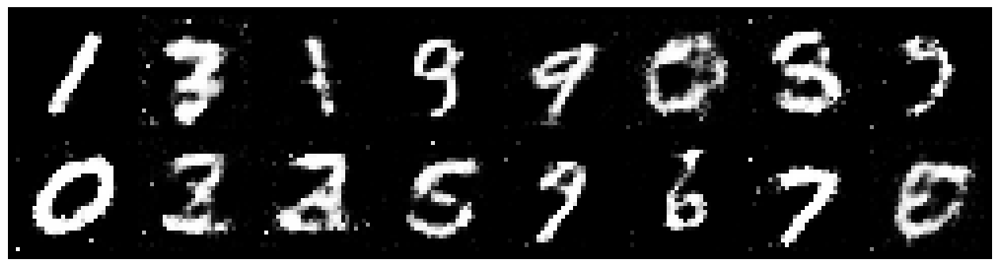

Epoch: [58/200], Batch Num: [400/600]
Discriminator Loss: 0.9149, Generator Loss: 1.4845
D(x): 0.6847, D(G(z)): 0.2914


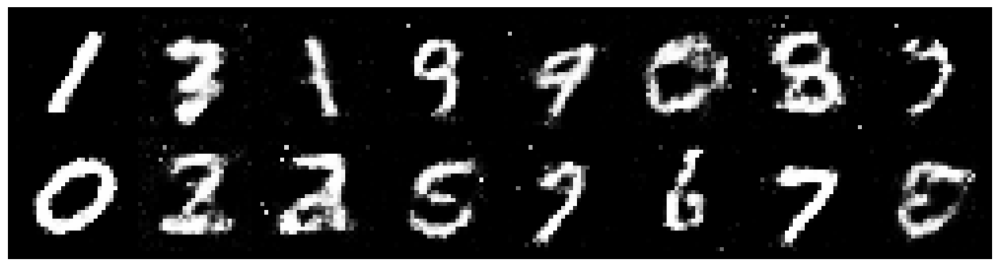

Epoch: [59/200], Batch Num: [0/600]
Discriminator Loss: 1.1992, Generator Loss: 1.2961
D(x): 0.5791, D(G(z)): 0.3664


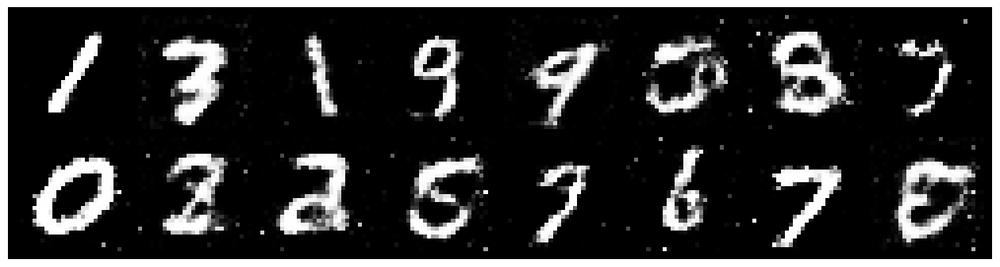

Epoch: [59/200], Batch Num: [200/600]
Discriminator Loss: 1.2070, Generator Loss: 1.3114
D(x): 0.5656, D(G(z)): 0.3517


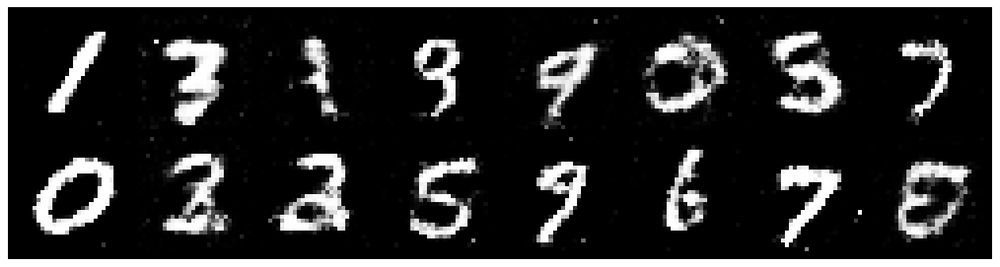

Epoch: [59/200], Batch Num: [400/600]
Discriminator Loss: 1.0164, Generator Loss: 1.2006
D(x): 0.6686, D(G(z)): 0.3738


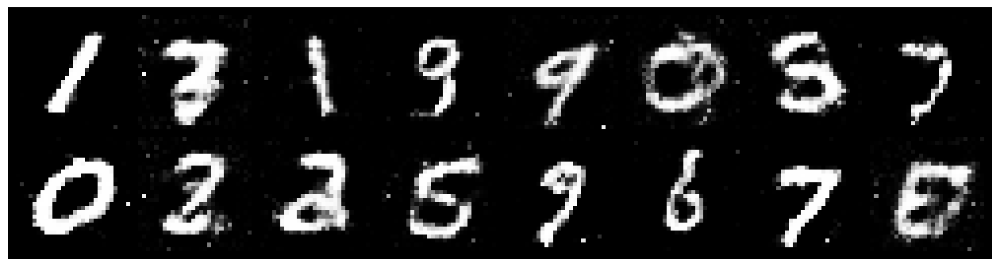

Epoch: [60/200], Batch Num: [0/600]
Discriminator Loss: 1.2127, Generator Loss: 1.1961
D(x): 0.6283, D(G(z)): 0.4319


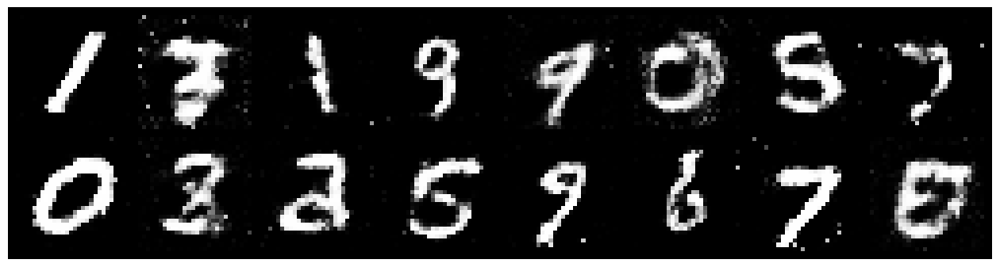

Epoch: [60/200], Batch Num: [200/600]
Discriminator Loss: 1.1343, Generator Loss: 1.0406
D(x): 0.5952, D(G(z)): 0.3585


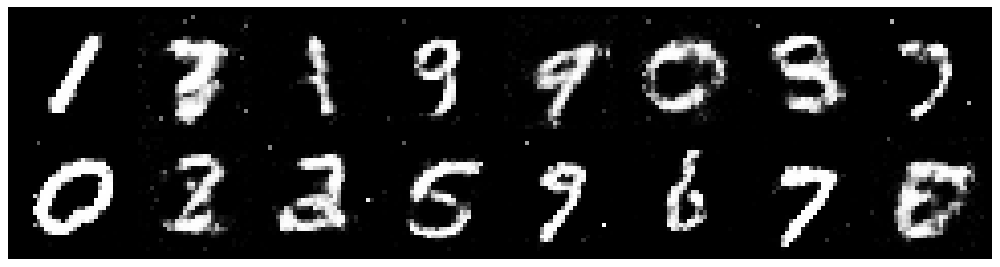

Epoch: [60/200], Batch Num: [400/600]
Discriminator Loss: 1.0200, Generator Loss: 1.3050
D(x): 0.6727, D(G(z)): 0.3635


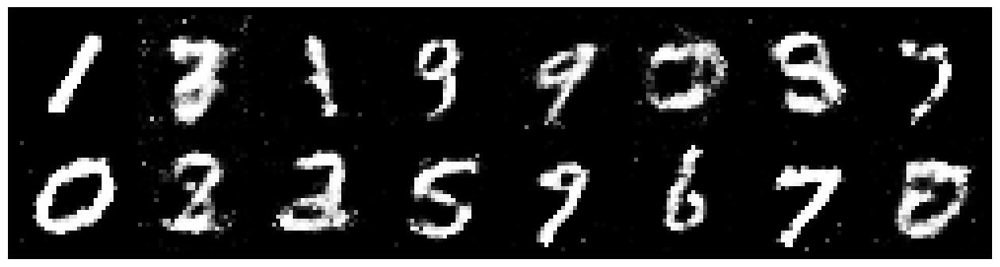

Epoch: [61/200], Batch Num: [0/600]
Discriminator Loss: 1.0425, Generator Loss: 1.1062
D(x): 0.6849, D(G(z)): 0.3920


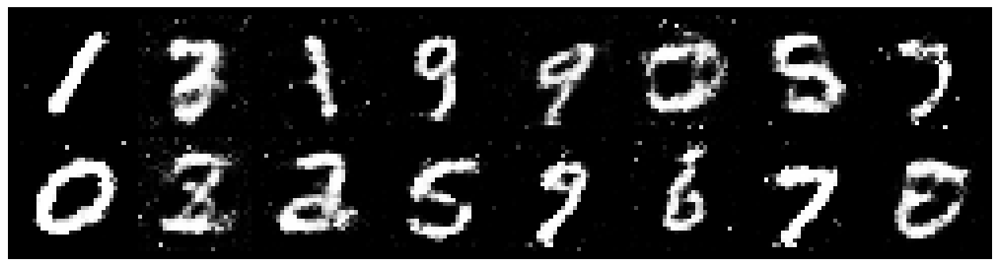

Epoch: [61/200], Batch Num: [200/600]
Discriminator Loss: 1.0091, Generator Loss: 1.4478
D(x): 0.6249, D(G(z)): 0.3211


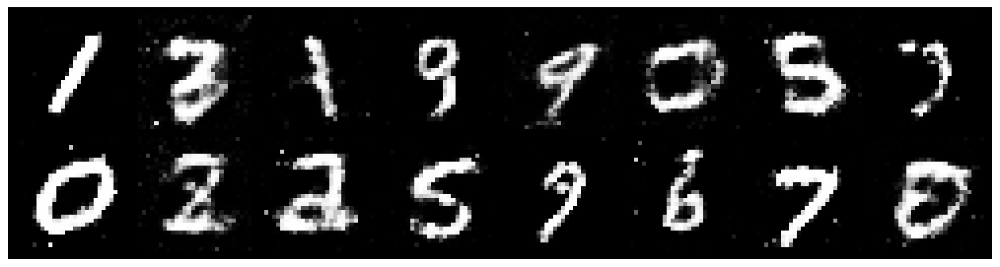

Epoch: [61/200], Batch Num: [400/600]
Discriminator Loss: 1.2379, Generator Loss: 0.9874
D(x): 0.6509, D(G(z)): 0.4561


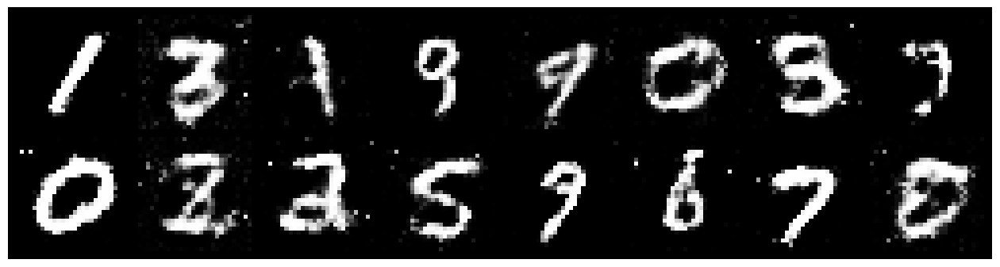

Epoch: [62/200], Batch Num: [0/600]
Discriminator Loss: 1.0893, Generator Loss: 1.3113
D(x): 0.6497, D(G(z)): 0.3286


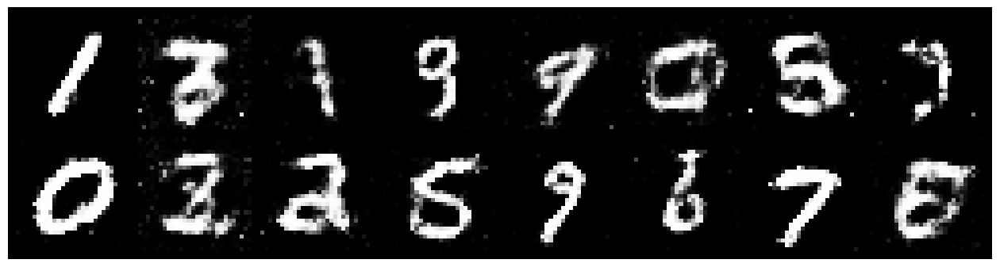

Epoch: [62/200], Batch Num: [200/600]
Discriminator Loss: 1.0618, Generator Loss: 1.1568
D(x): 0.5993, D(G(z)): 0.3245


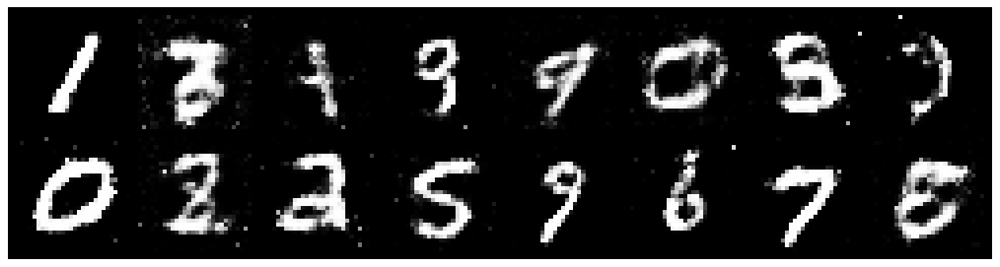

Epoch: [62/200], Batch Num: [400/600]
Discriminator Loss: 1.1494, Generator Loss: 1.2379
D(x): 0.6590, D(G(z)): 0.4261


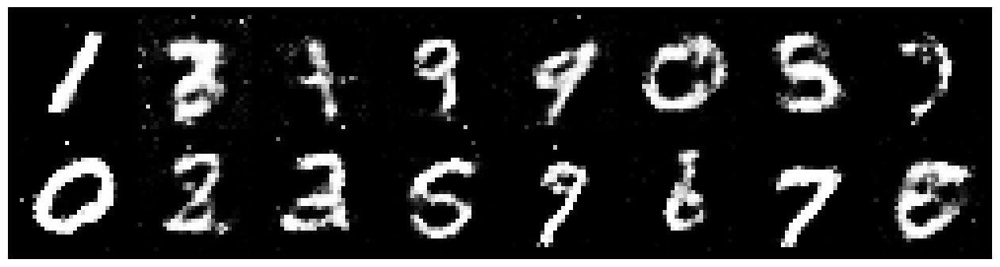

Epoch: [63/200], Batch Num: [0/600]
Discriminator Loss: 1.0287, Generator Loss: 1.4297
D(x): 0.6593, D(G(z)): 0.3512


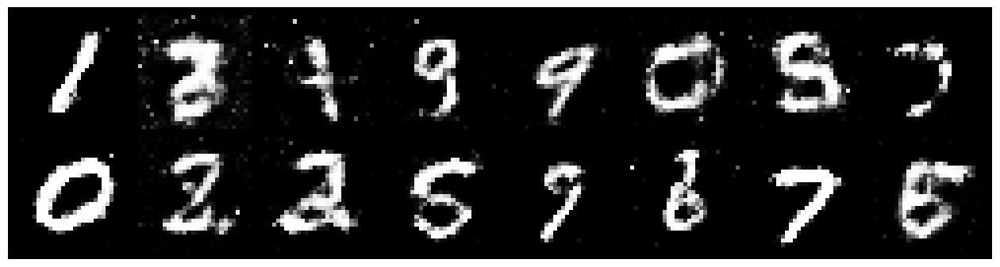

Epoch: [63/200], Batch Num: [200/600]
Discriminator Loss: 1.0059, Generator Loss: 1.4238
D(x): 0.6711, D(G(z)): 0.3541


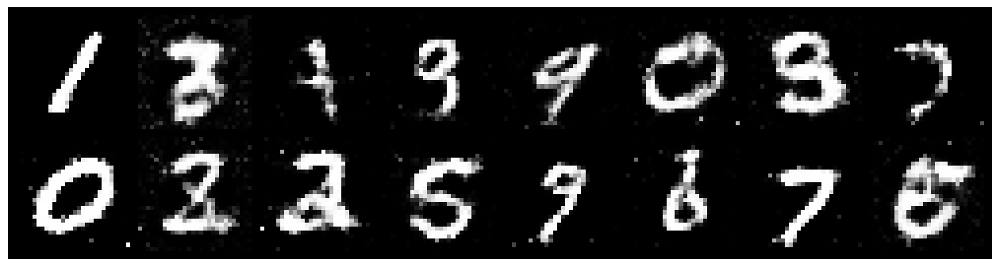

Epoch: [63/200], Batch Num: [400/600]
Discriminator Loss: 1.1805, Generator Loss: 0.9295
D(x): 0.6263, D(G(z)): 0.4321


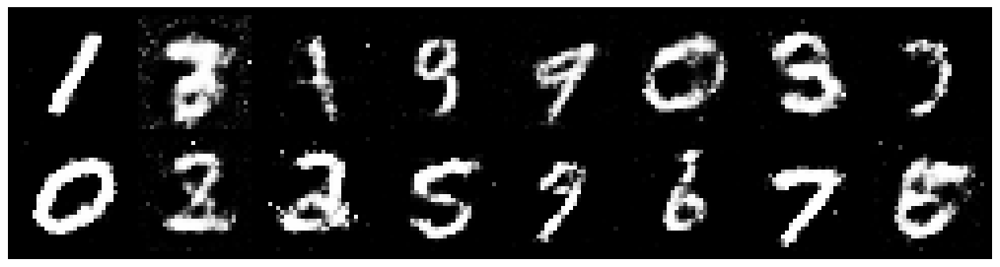

Epoch: [64/200], Batch Num: [0/600]
Discriminator Loss: 0.9535, Generator Loss: 1.3252
D(x): 0.6722, D(G(z)): 0.3420


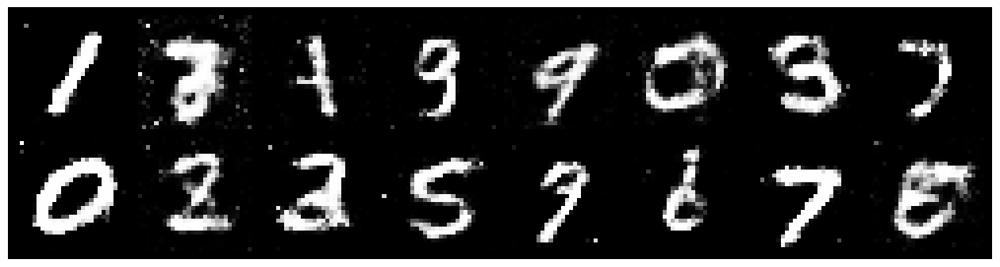

Epoch: [64/200], Batch Num: [200/600]
Discriminator Loss: 1.0449, Generator Loss: 1.1244
D(x): 0.5851, D(G(z)): 0.3201


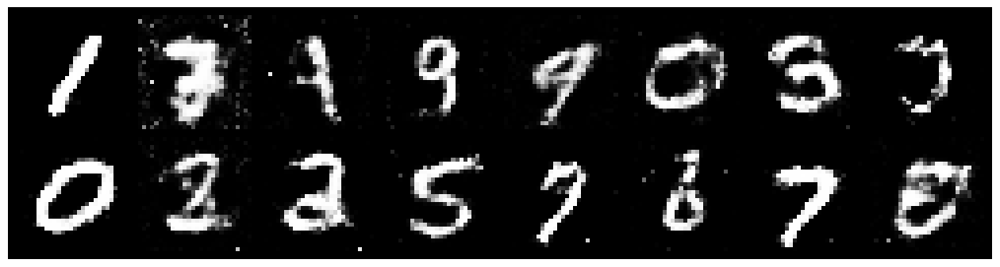

Epoch: [64/200], Batch Num: [400/600]
Discriminator Loss: 1.0546, Generator Loss: 1.1953
D(x): 0.6234, D(G(z)): 0.3261


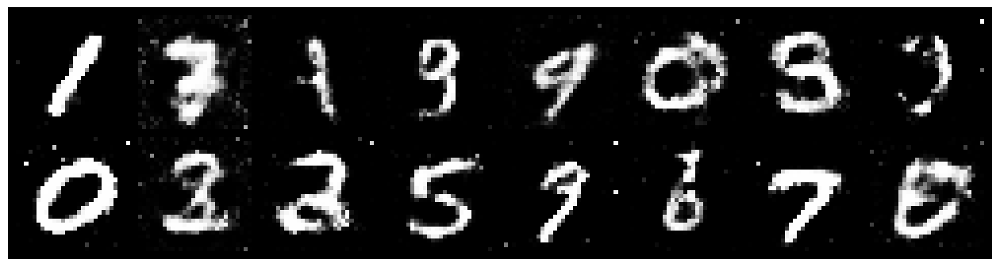

Epoch: [65/200], Batch Num: [0/600]
Discriminator Loss: 1.0766, Generator Loss: 0.9933
D(x): 0.6514, D(G(z)): 0.3914


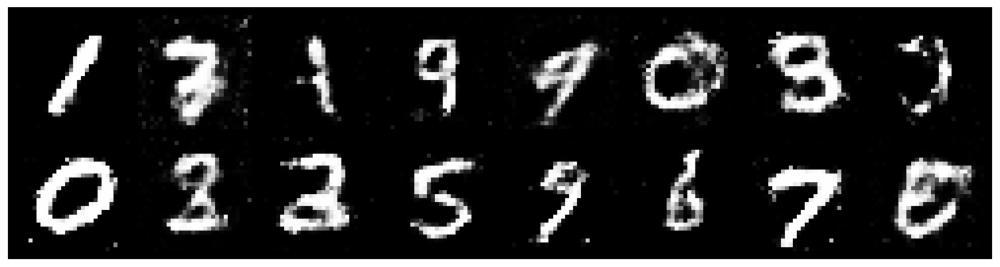

Epoch: [65/200], Batch Num: [200/600]
Discriminator Loss: 1.1680, Generator Loss: 1.0495
D(x): 0.6215, D(G(z)): 0.4179


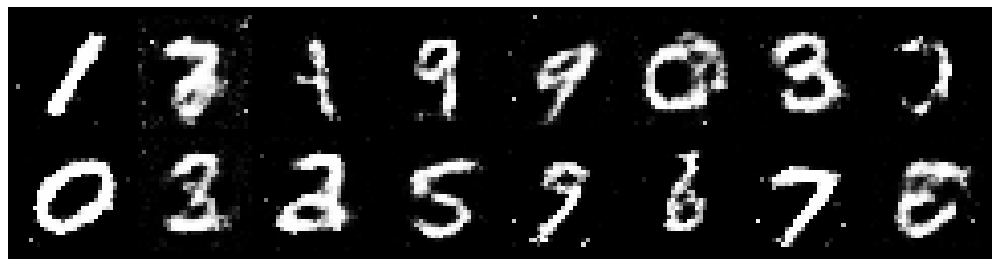

Epoch: [65/200], Batch Num: [400/600]
Discriminator Loss: 1.0231, Generator Loss: 1.1864
D(x): 0.6773, D(G(z)): 0.3814


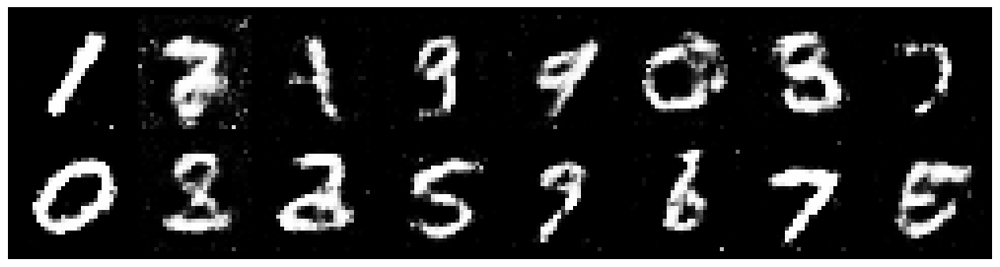

Epoch: [66/200], Batch Num: [0/600]
Discriminator Loss: 1.2664, Generator Loss: 0.8981
D(x): 0.5702, D(G(z)): 0.4082


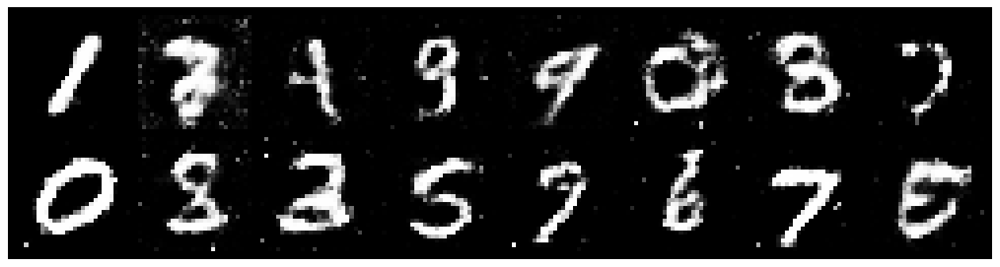

Epoch: [66/200], Batch Num: [200/600]
Discriminator Loss: 1.0550, Generator Loss: 1.5344
D(x): 0.6562, D(G(z)): 0.3412


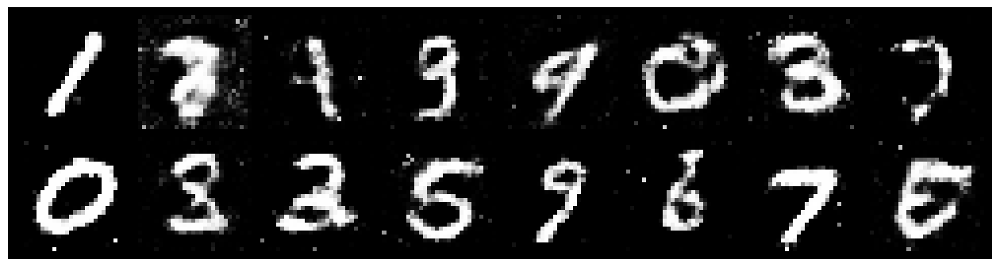

Epoch: [66/200], Batch Num: [400/600]
Discriminator Loss: 1.2342, Generator Loss: 1.3218
D(x): 0.6152, D(G(z)): 0.4147


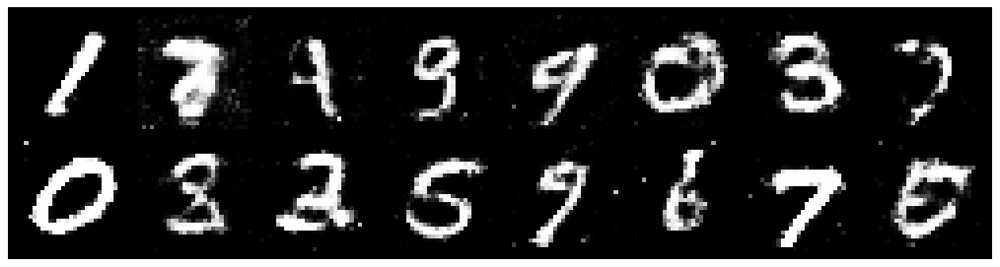

Epoch: [67/200], Batch Num: [0/600]
Discriminator Loss: 1.0911, Generator Loss: 1.3861
D(x): 0.6107, D(G(z)): 0.3337


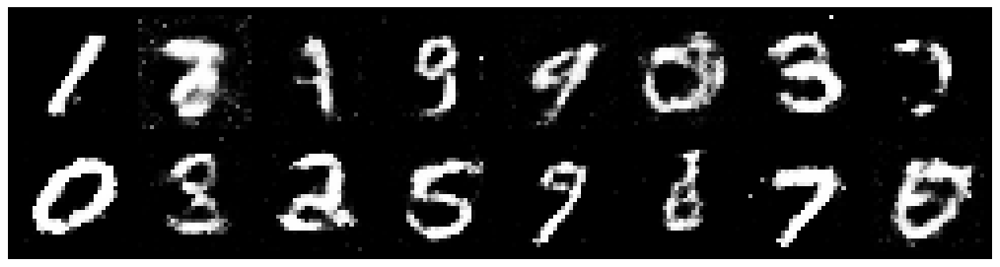

Epoch: [67/200], Batch Num: [200/600]
Discriminator Loss: 1.2908, Generator Loss: 0.9372
D(x): 0.5694, D(G(z)): 0.4361


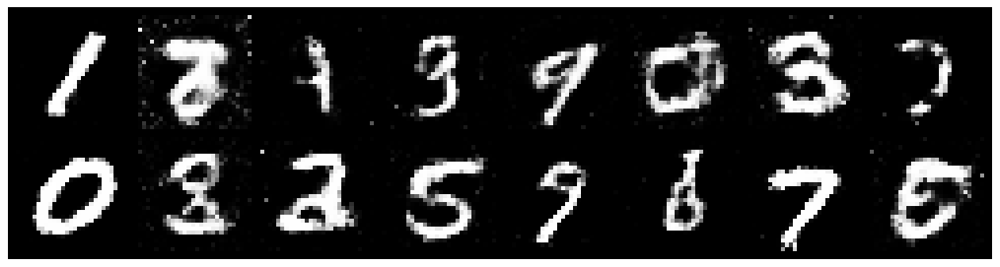

Epoch: [67/200], Batch Num: [400/600]
Discriminator Loss: 1.1573, Generator Loss: 1.1323
D(x): 0.6525, D(G(z)): 0.4343


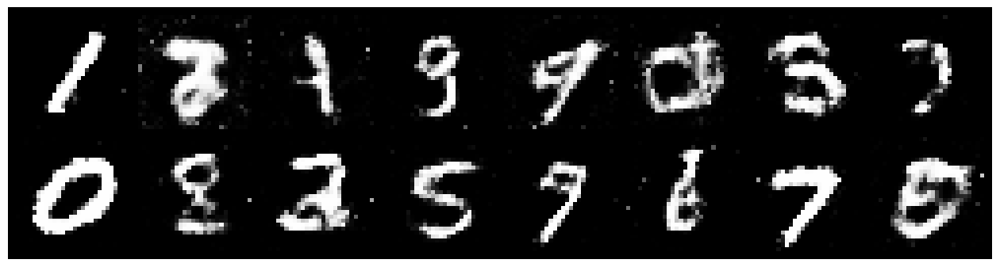

Epoch: [68/200], Batch Num: [0/600]
Discriminator Loss: 1.1357, Generator Loss: 1.2787
D(x): 0.6121, D(G(z)): 0.3510


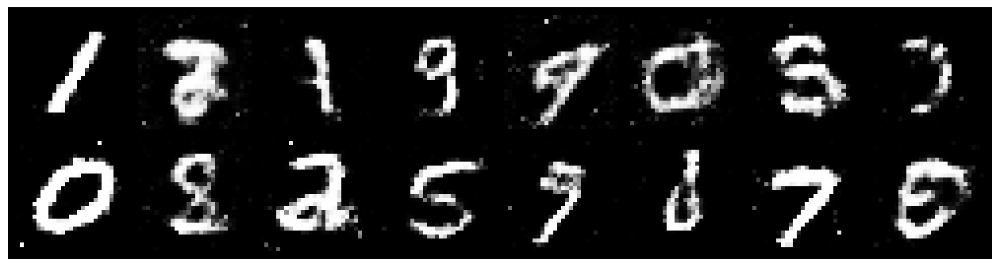

Epoch: [68/200], Batch Num: [200/600]
Discriminator Loss: 1.0491, Generator Loss: 1.1932
D(x): 0.6152, D(G(z)): 0.3600


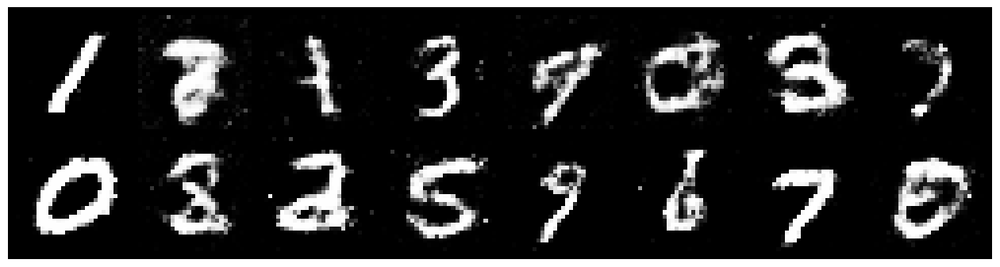

Epoch: [68/200], Batch Num: [400/600]
Discriminator Loss: 1.1226, Generator Loss: 1.0449
D(x): 0.6317, D(G(z)): 0.4012


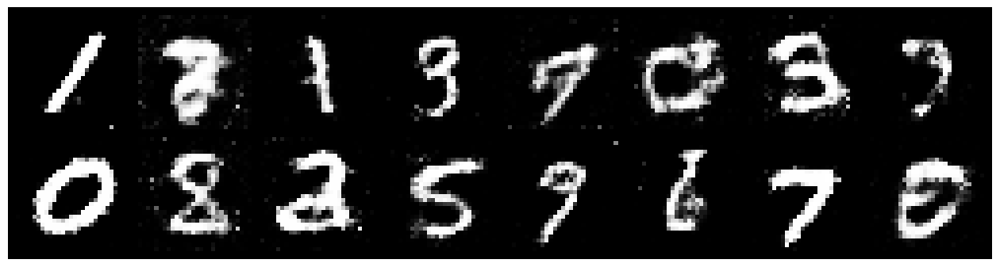

Epoch: [69/200], Batch Num: [0/600]
Discriminator Loss: 1.1782, Generator Loss: 1.1634
D(x): 0.5898, D(G(z)): 0.3627


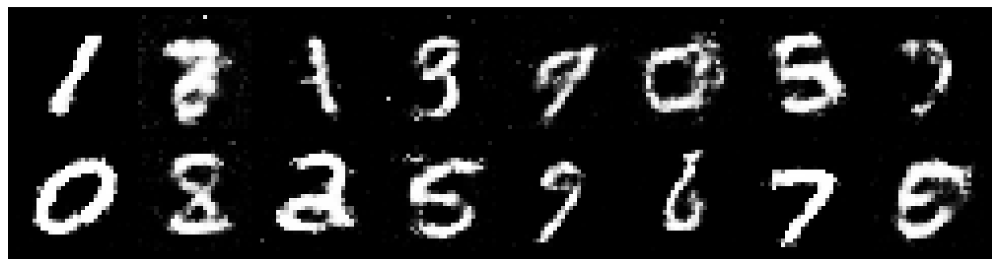

Epoch: [69/200], Batch Num: [200/600]
Discriminator Loss: 1.2858, Generator Loss: 0.9659
D(x): 0.6071, D(G(z)): 0.4401


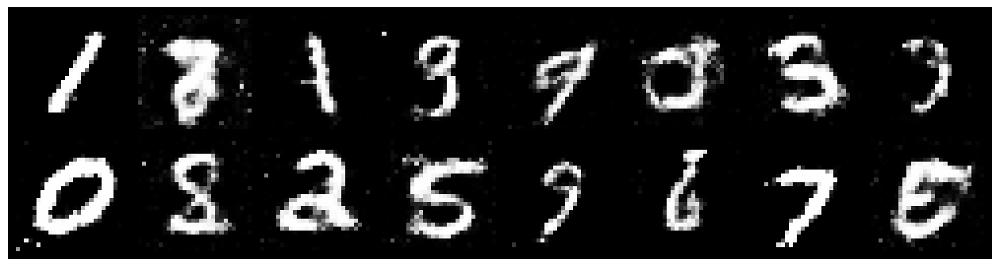

Epoch: [69/200], Batch Num: [400/600]
Discriminator Loss: 1.1421, Generator Loss: 1.2279
D(x): 0.5829, D(G(z)): 0.3564


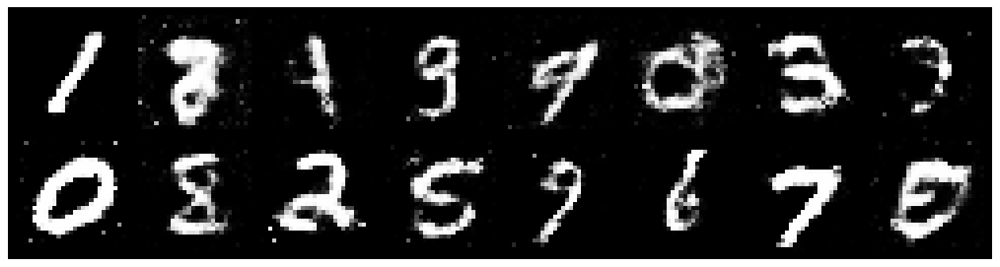

Epoch: [70/200], Batch Num: [0/600]
Discriminator Loss: 1.0757, Generator Loss: 1.2391
D(x): 0.6482, D(G(z)): 0.3919


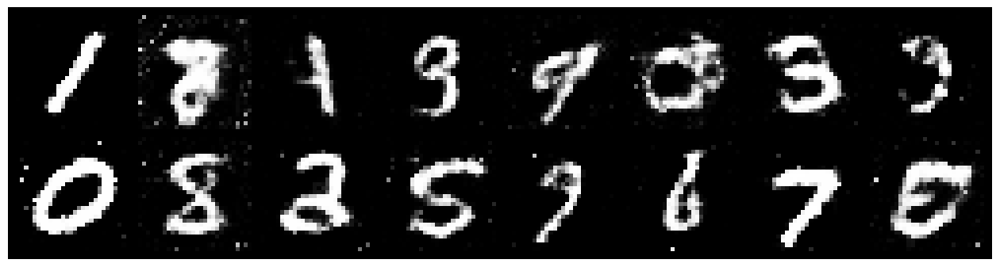

Epoch: [70/200], Batch Num: [200/600]
Discriminator Loss: 1.0996, Generator Loss: 1.2276
D(x): 0.6211, D(G(z)): 0.3936


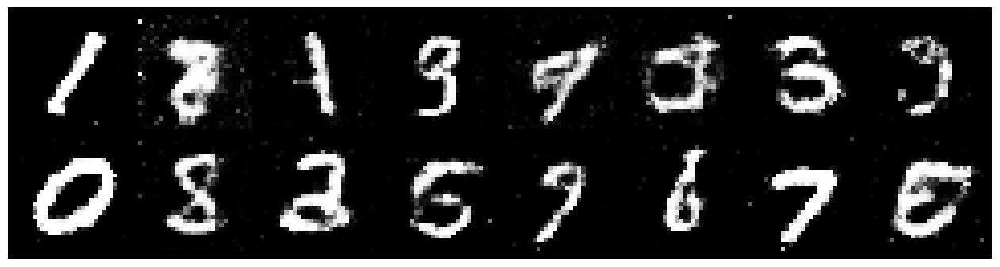

Epoch: [70/200], Batch Num: [400/600]
Discriminator Loss: 1.0595, Generator Loss: 1.1352
D(x): 0.6454, D(G(z)): 0.3932


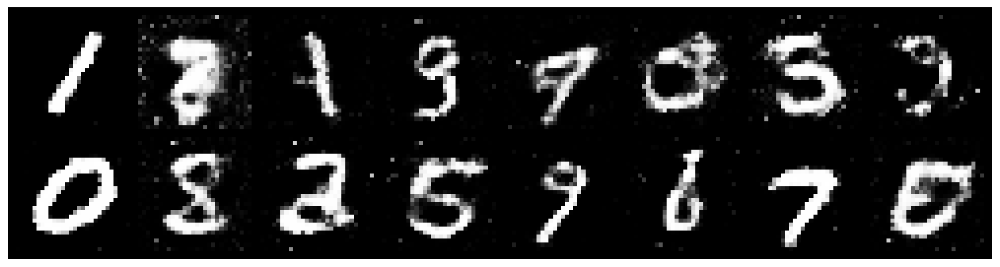

Epoch: [71/200], Batch Num: [0/600]
Discriminator Loss: 1.2223, Generator Loss: 1.0323
D(x): 0.5935, D(G(z)): 0.4322


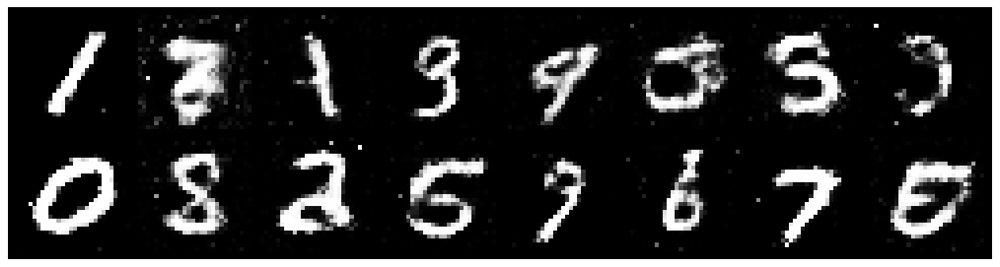

Epoch: [71/200], Batch Num: [200/600]
Discriminator Loss: 1.1587, Generator Loss: 1.1268
D(x): 0.6511, D(G(z)): 0.4412


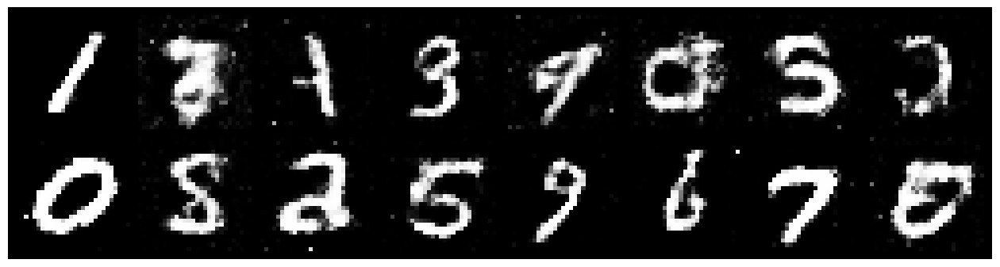

Epoch: [71/200], Batch Num: [400/600]
Discriminator Loss: 1.0044, Generator Loss: 1.1404
D(x): 0.6908, D(G(z)): 0.3813


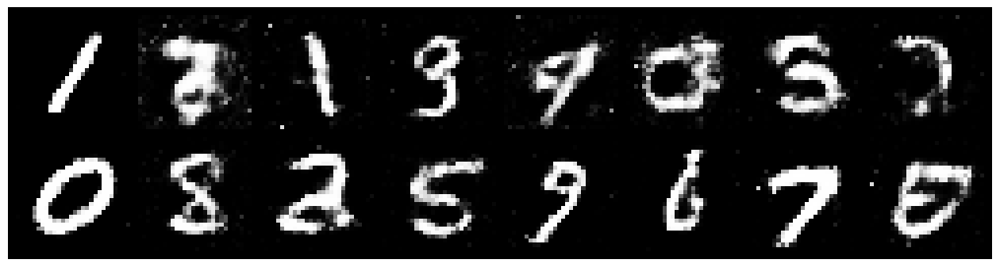

Epoch: [72/200], Batch Num: [0/600]
Discriminator Loss: 1.2097, Generator Loss: 0.9035
D(x): 0.6435, D(G(z)): 0.4538


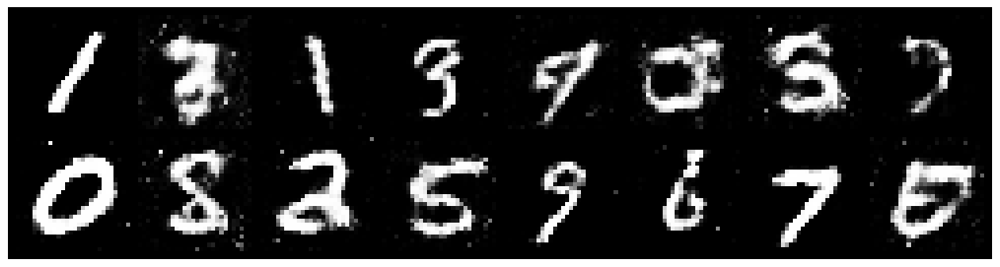

Epoch: [72/200], Batch Num: [200/600]
Discriminator Loss: 1.2054, Generator Loss: 0.9789
D(x): 0.6492, D(G(z)): 0.4651


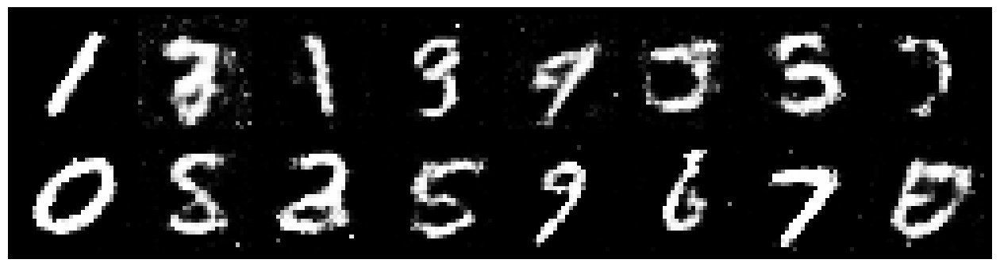

Epoch: [72/200], Batch Num: [400/600]
Discriminator Loss: 1.3428, Generator Loss: 0.9741
D(x): 0.5847, D(G(z)): 0.4537


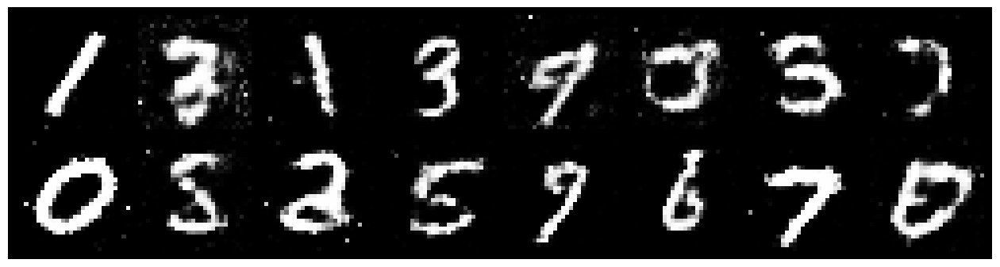

Epoch: [73/200], Batch Num: [0/600]
Discriminator Loss: 1.2322, Generator Loss: 1.2875
D(x): 0.5450, D(G(z)): 0.3628


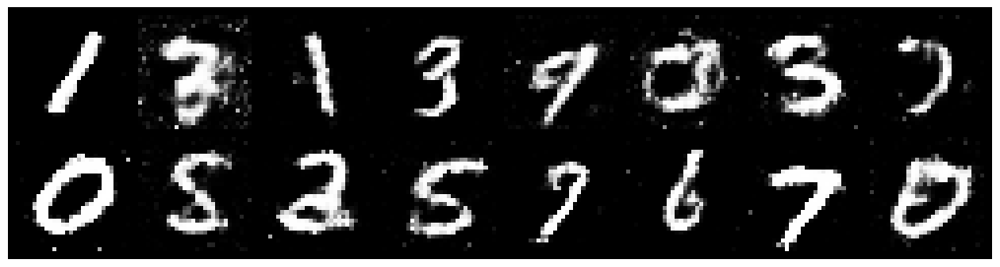

Epoch: [73/200], Batch Num: [200/600]
Discriminator Loss: 1.1143, Generator Loss: 1.1126
D(x): 0.6176, D(G(z)): 0.3694


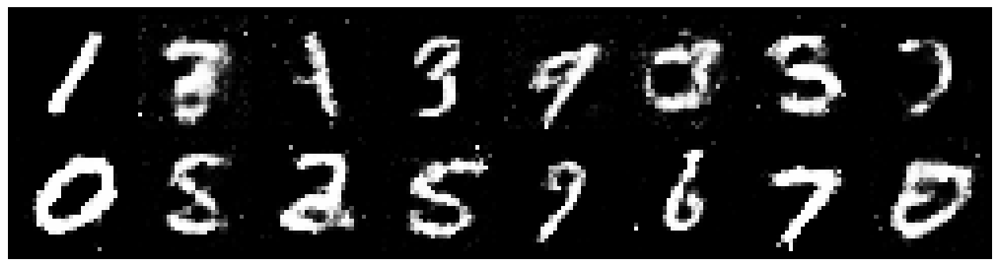

Epoch: [73/200], Batch Num: [400/600]
Discriminator Loss: 1.0943, Generator Loss: 1.5284
D(x): 0.5812, D(G(z)): 0.3204


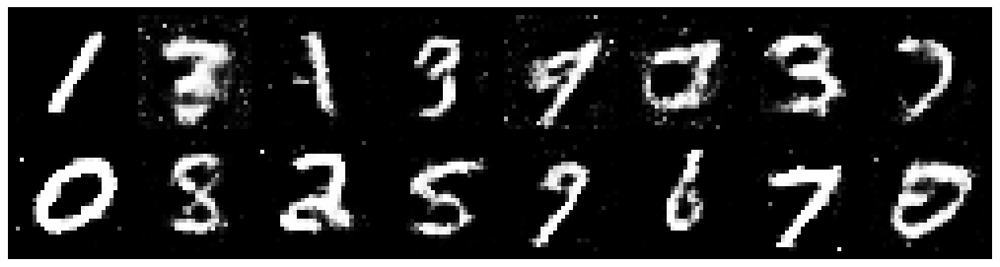

Epoch: [74/200], Batch Num: [0/600]
Discriminator Loss: 1.1573, Generator Loss: 1.0242
D(x): 0.6229, D(G(z)): 0.4170


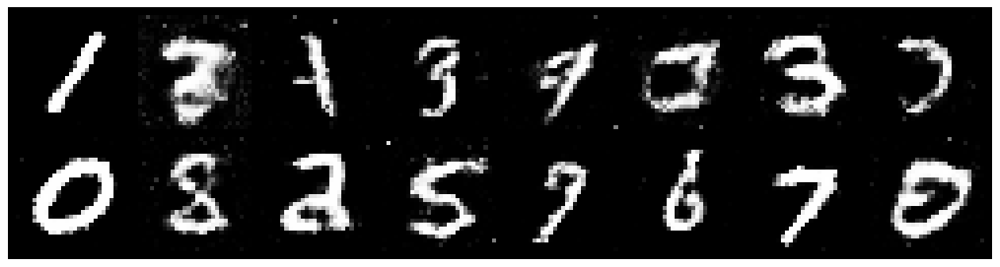

Epoch: [74/200], Batch Num: [200/600]
Discriminator Loss: 1.0405, Generator Loss: 1.0568
D(x): 0.6327, D(G(z)): 0.3361


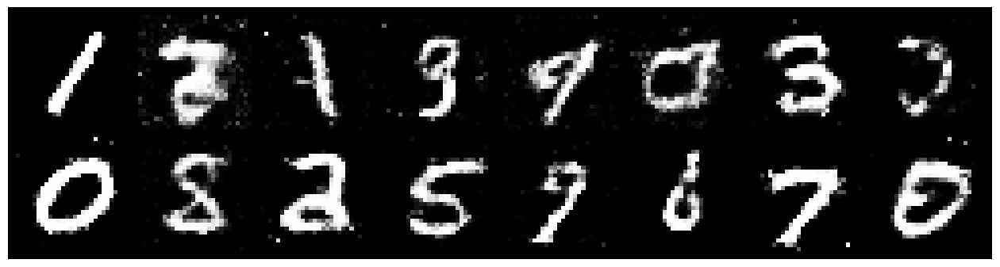

Epoch: [74/200], Batch Num: [400/600]
Discriminator Loss: 1.1860, Generator Loss: 1.2967
D(x): 0.5875, D(G(z)): 0.3852


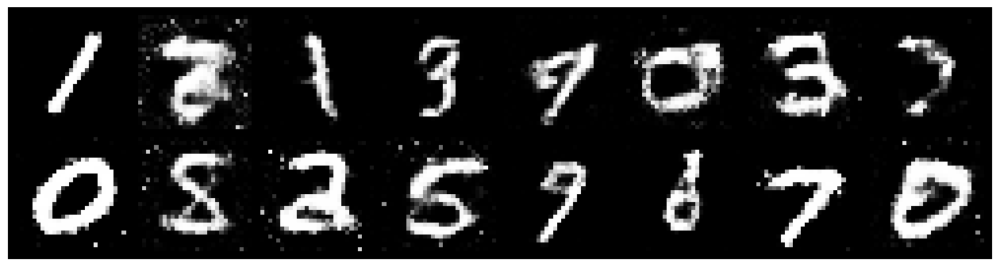

Epoch: [75/200], Batch Num: [0/600]
Discriminator Loss: 1.1978, Generator Loss: 1.2842
D(x): 0.6240, D(G(z)): 0.3972


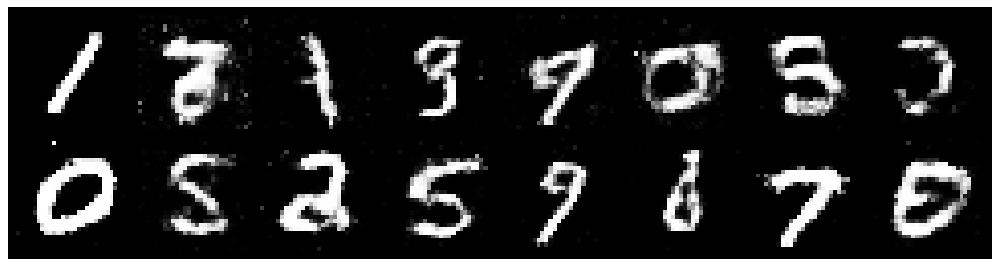

Epoch: [75/200], Batch Num: [200/600]
Discriminator Loss: 1.1497, Generator Loss: 1.0699
D(x): 0.5849, D(G(z)): 0.3588


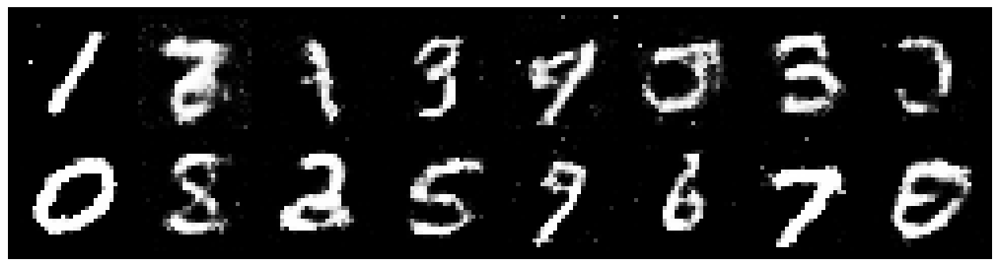

Epoch: [75/200], Batch Num: [400/600]
Discriminator Loss: 1.2316, Generator Loss: 0.9282
D(x): 0.5650, D(G(z)): 0.4040


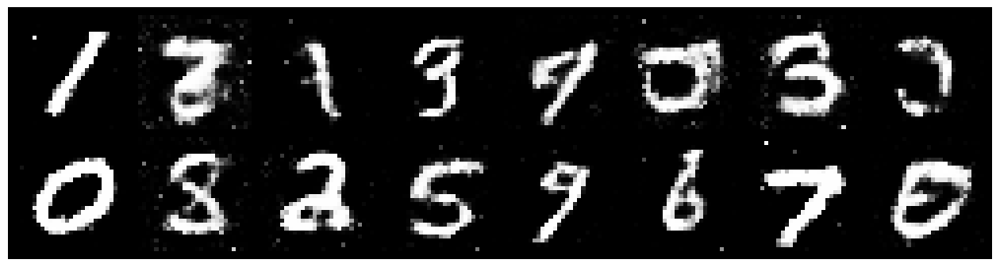

Epoch: [76/200], Batch Num: [0/600]
Discriminator Loss: 1.1738, Generator Loss: 1.1987
D(x): 0.5986, D(G(z)): 0.3619


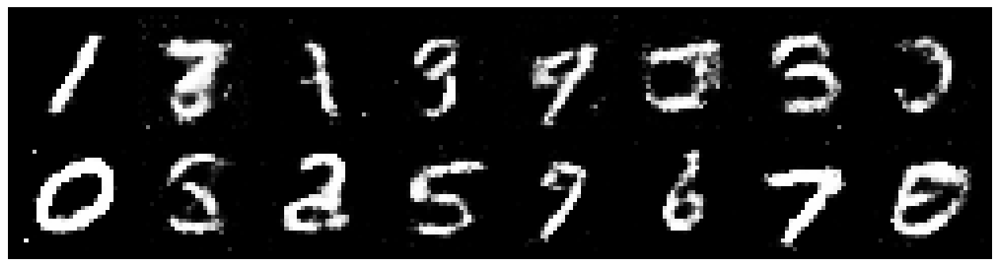

Epoch: [76/200], Batch Num: [200/600]
Discriminator Loss: 1.0910, Generator Loss: 1.2772
D(x): 0.6212, D(G(z)): 0.3810


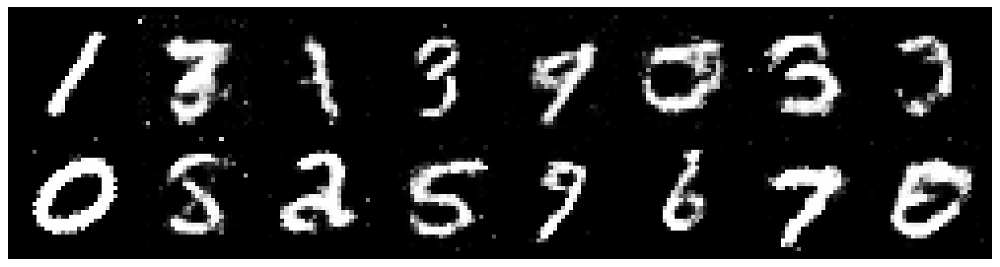

Epoch: [76/200], Batch Num: [400/600]
Discriminator Loss: 1.1496, Generator Loss: 1.1402
D(x): 0.6256, D(G(z)): 0.3911


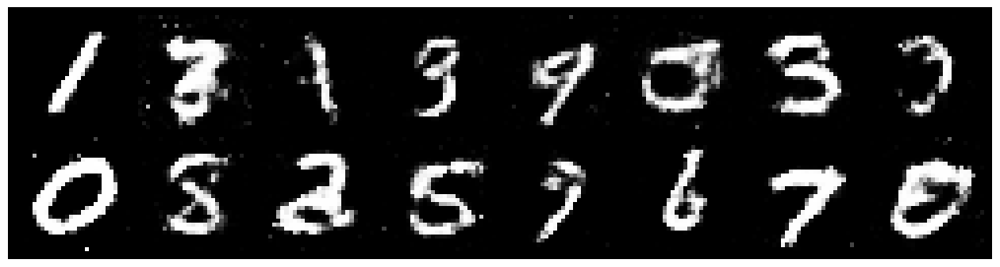

Epoch: [77/200], Batch Num: [0/600]
Discriminator Loss: 1.0351, Generator Loss: 1.3329
D(x): 0.6525, D(G(z)): 0.3641


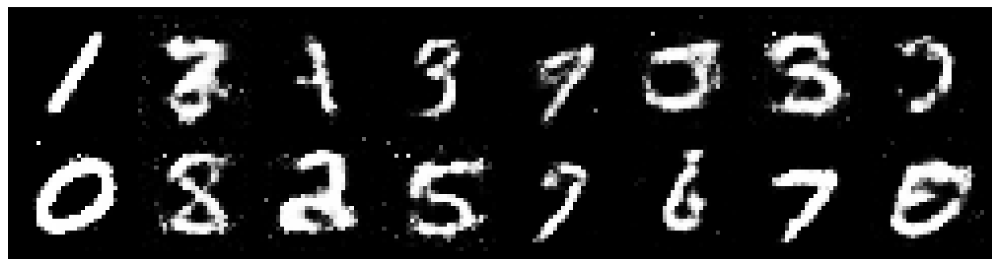

Epoch: [77/200], Batch Num: [200/600]
Discriminator Loss: 1.0725, Generator Loss: 1.1085
D(x): 0.6428, D(G(z)): 0.3672


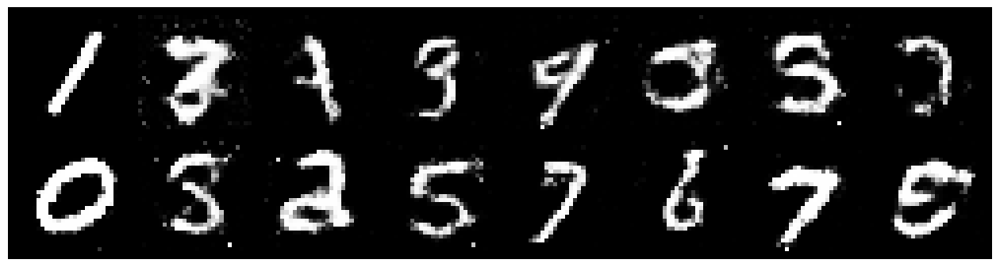

Epoch: [77/200], Batch Num: [400/600]
Discriminator Loss: 1.1842, Generator Loss: 1.2473
D(x): 0.6281, D(G(z)): 0.4096


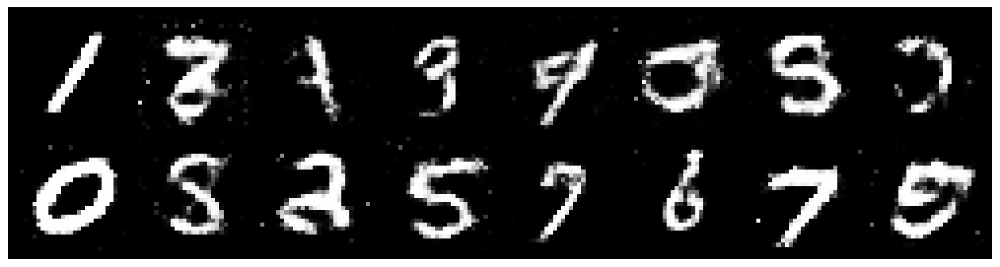

Epoch: [78/200], Batch Num: [0/600]
Discriminator Loss: 1.0763, Generator Loss: 1.1223
D(x): 0.6441, D(G(z)): 0.3768


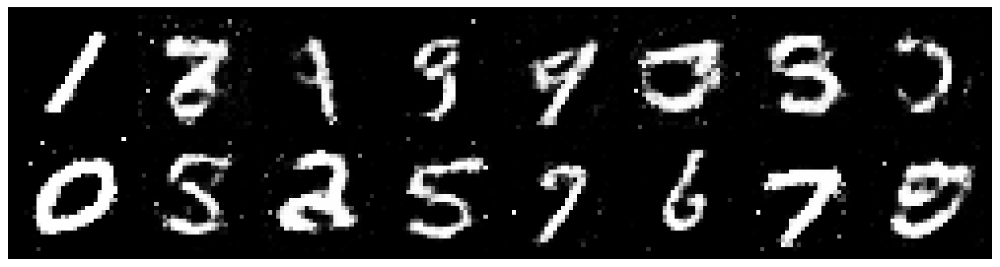

Epoch: [78/200], Batch Num: [200/600]
Discriminator Loss: 1.1356, Generator Loss: 0.9544
D(x): 0.6116, D(G(z)): 0.3965


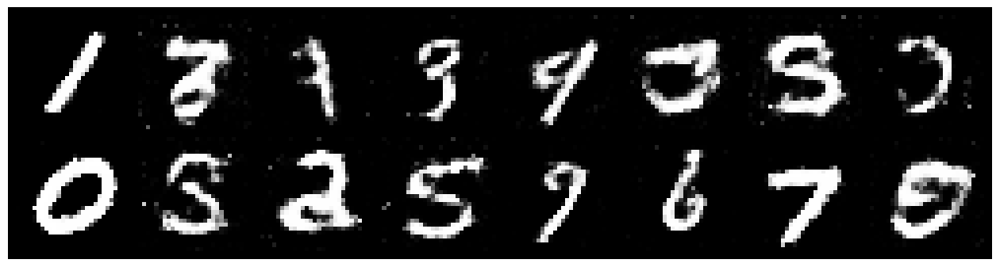

Epoch: [78/200], Batch Num: [400/600]
Discriminator Loss: 1.0944, Generator Loss: 1.1716
D(x): 0.6237, D(G(z)): 0.3829


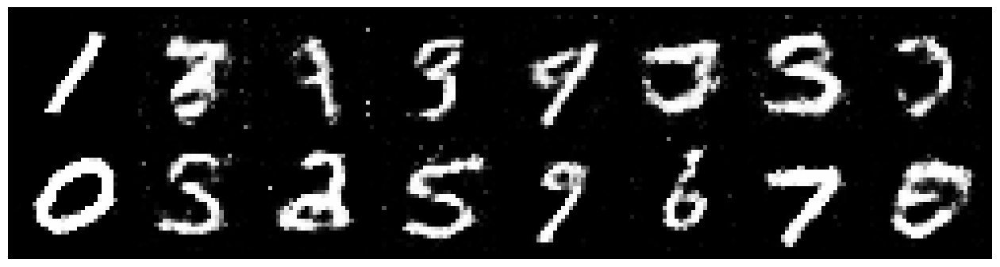

Epoch: [79/200], Batch Num: [0/600]
Discriminator Loss: 1.1533, Generator Loss: 1.2777
D(x): 0.5500, D(G(z)): 0.3379


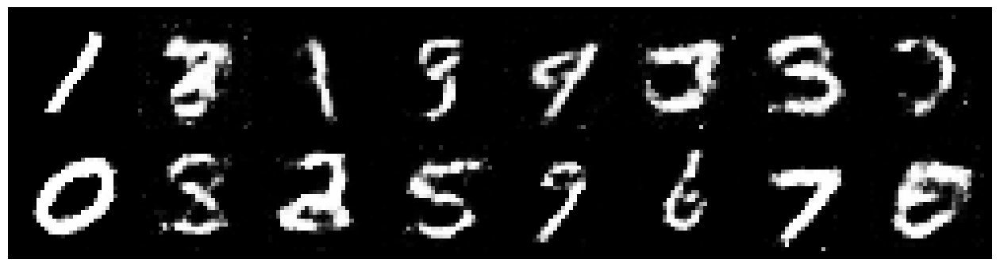

Epoch: [79/200], Batch Num: [200/600]
Discriminator Loss: 1.1767, Generator Loss: 1.2003
D(x): 0.6270, D(G(z)): 0.4024


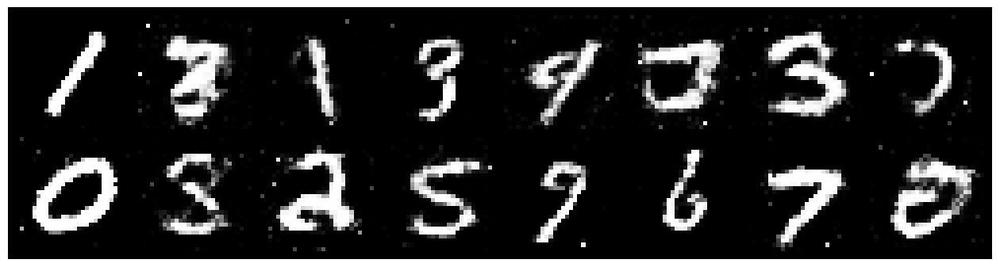

Epoch: [79/200], Batch Num: [400/600]
Discriminator Loss: 1.1271, Generator Loss: 1.1702
D(x): 0.5638, D(G(z)): 0.3487


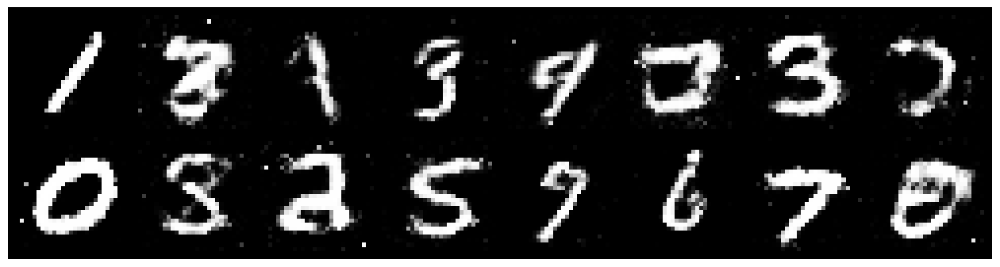

Epoch: [80/200], Batch Num: [0/600]
Discriminator Loss: 1.2063, Generator Loss: 1.0152
D(x): 0.6103, D(G(z)): 0.4281


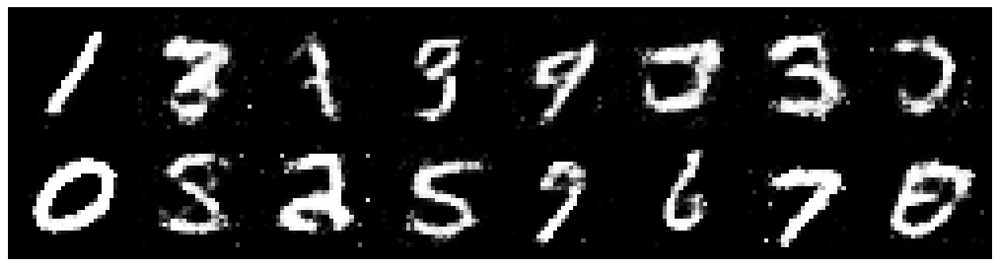

Epoch: [80/200], Batch Num: [200/600]
Discriminator Loss: 1.1472, Generator Loss: 1.1161
D(x): 0.5709, D(G(z)): 0.3696


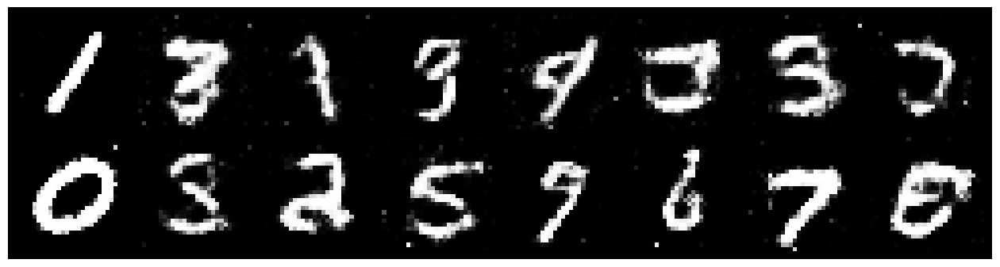

Epoch: [80/200], Batch Num: [400/600]
Discriminator Loss: 1.2665, Generator Loss: 1.0146
D(x): 0.6014, D(G(z)): 0.4516


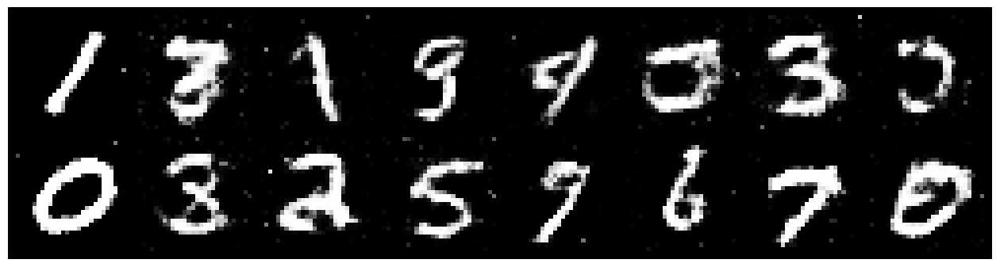

Epoch: [81/200], Batch Num: [0/600]
Discriminator Loss: 1.0906, Generator Loss: 1.1219
D(x): 0.5984, D(G(z)): 0.3443


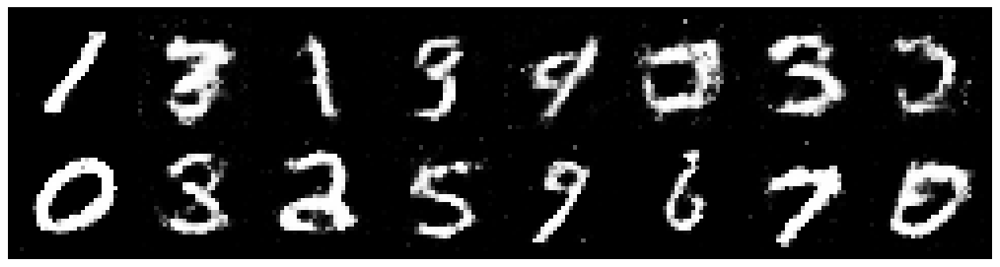

Epoch: [81/200], Batch Num: [200/600]
Discriminator Loss: 1.1793, Generator Loss: 1.1176
D(x): 0.6095, D(G(z)): 0.3925


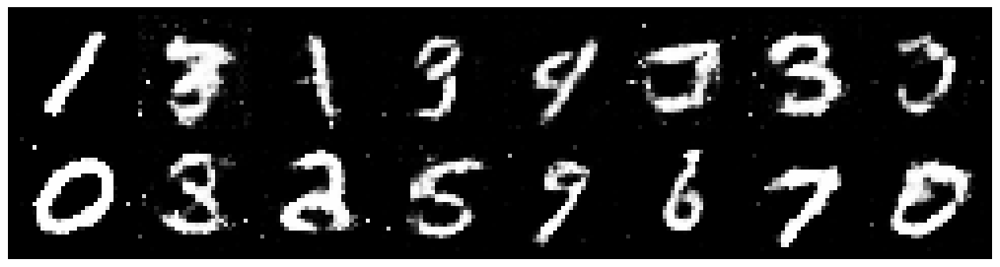

Epoch: [81/200], Batch Num: [400/600]
Discriminator Loss: 1.1682, Generator Loss: 1.0140
D(x): 0.5817, D(G(z)): 0.3856


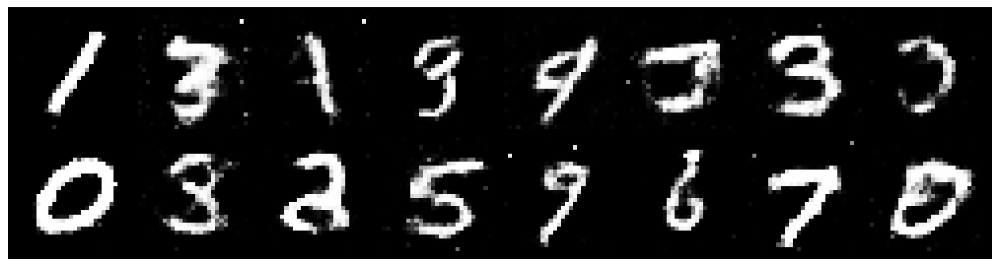

Epoch: [82/200], Batch Num: [0/600]
Discriminator Loss: 1.0848, Generator Loss: 1.1363
D(x): 0.5927, D(G(z)): 0.3690


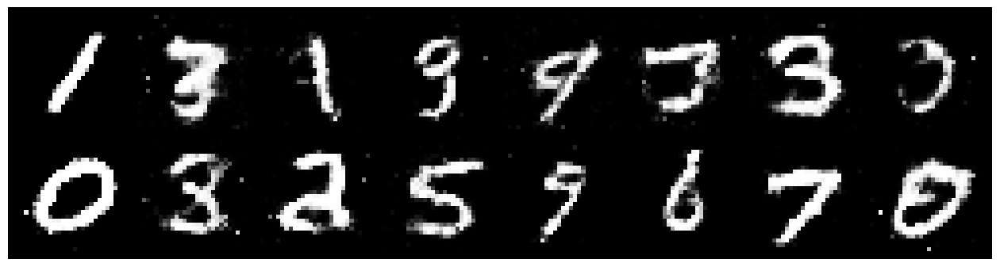

Epoch: [82/200], Batch Num: [200/600]
Discriminator Loss: 1.1210, Generator Loss: 1.0182
D(x): 0.5985, D(G(z)): 0.3952


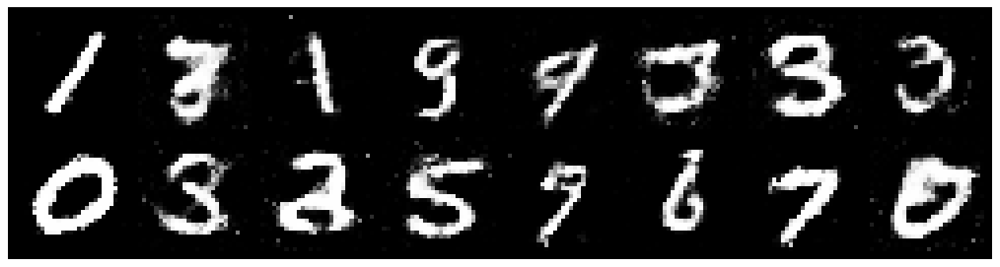

Epoch: [82/200], Batch Num: [400/600]
Discriminator Loss: 1.2659, Generator Loss: 1.0411
D(x): 0.6112, D(G(z)): 0.4525


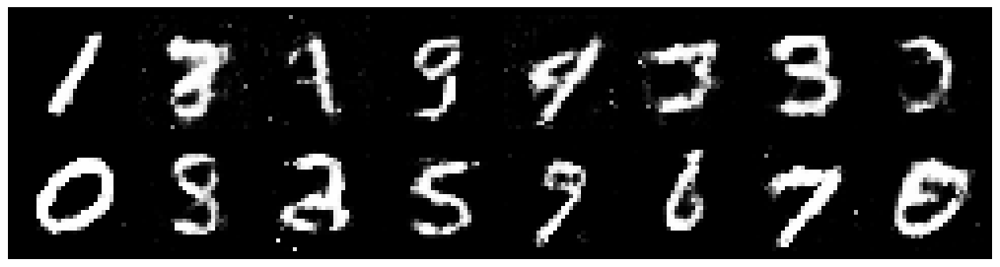

Epoch: [83/200], Batch Num: [0/600]
Discriminator Loss: 1.1814, Generator Loss: 1.0791
D(x): 0.5799, D(G(z)): 0.3937


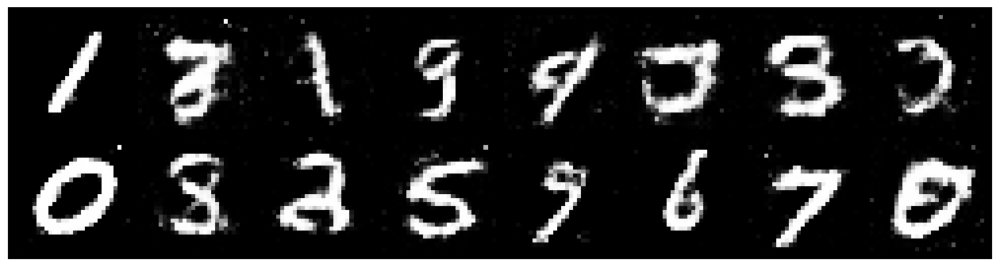

Epoch: [83/200], Batch Num: [200/600]
Discriminator Loss: 1.1000, Generator Loss: 1.1274
D(x): 0.6005, D(G(z)): 0.3529


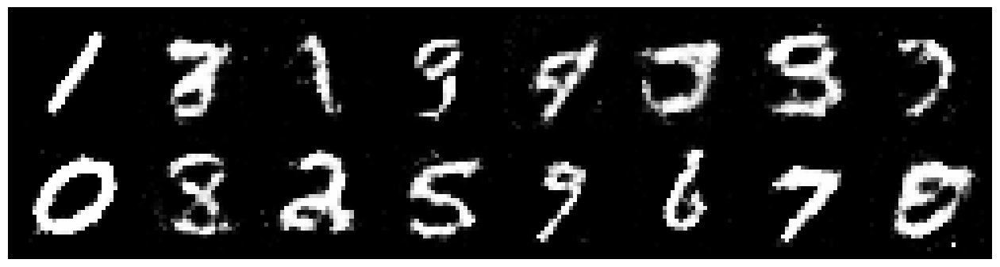

Epoch: [83/200], Batch Num: [400/600]
Discriminator Loss: 1.1976, Generator Loss: 0.8743
D(x): 0.6047, D(G(z)): 0.4396


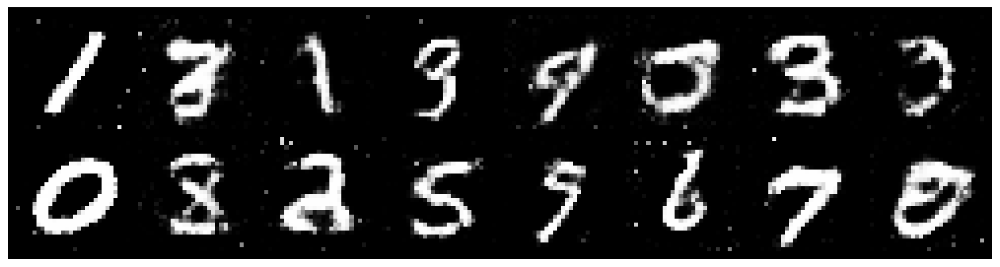

Epoch: [84/200], Batch Num: [0/600]
Discriminator Loss: 1.1492, Generator Loss: 1.2275
D(x): 0.6086, D(G(z)): 0.4225


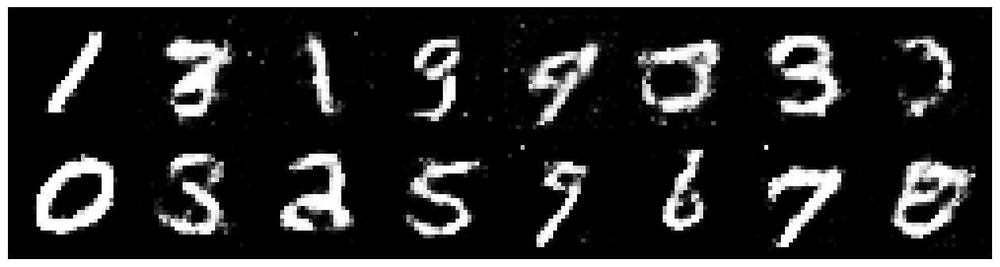

Epoch: [84/200], Batch Num: [200/600]
Discriminator Loss: 1.1085, Generator Loss: 1.1258
D(x): 0.6189, D(G(z)): 0.4079


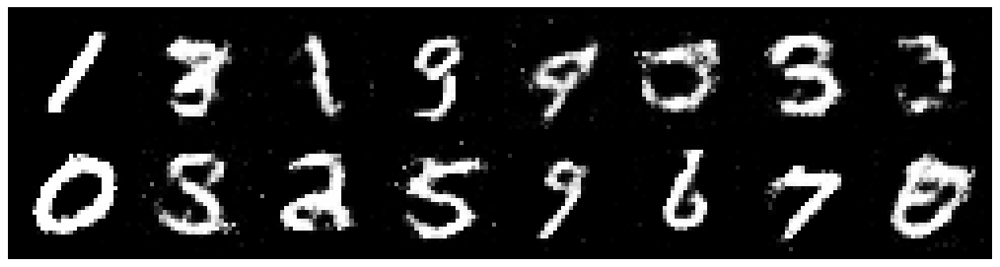

Epoch: [84/200], Batch Num: [400/600]
Discriminator Loss: 1.1926, Generator Loss: 1.0386
D(x): 0.6209, D(G(z)): 0.4428


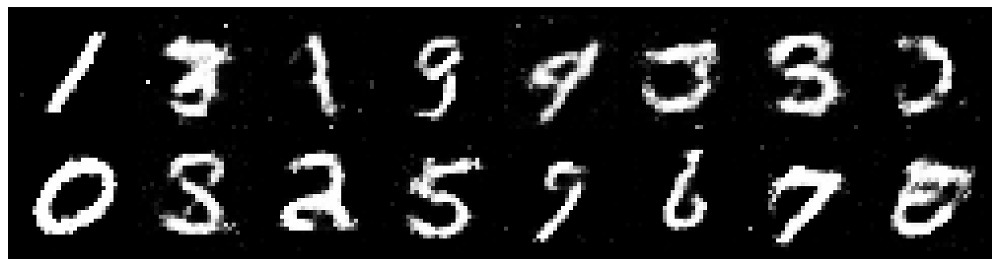

Epoch: [85/200], Batch Num: [0/600]
Discriminator Loss: 1.2247, Generator Loss: 1.0964
D(x): 0.5653, D(G(z)): 0.4030


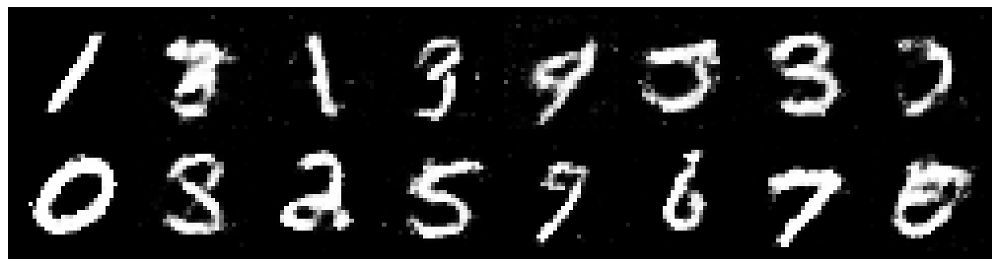

Epoch: [85/200], Batch Num: [200/600]
Discriminator Loss: 1.0492, Generator Loss: 1.1929
D(x): 0.6124, D(G(z)): 0.3392


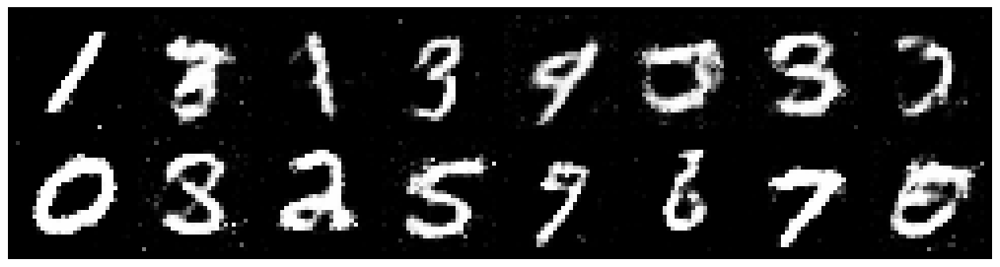

Epoch: [85/200], Batch Num: [400/600]
Discriminator Loss: 1.1698, Generator Loss: 0.8740
D(x): 0.6121, D(G(z)): 0.4196


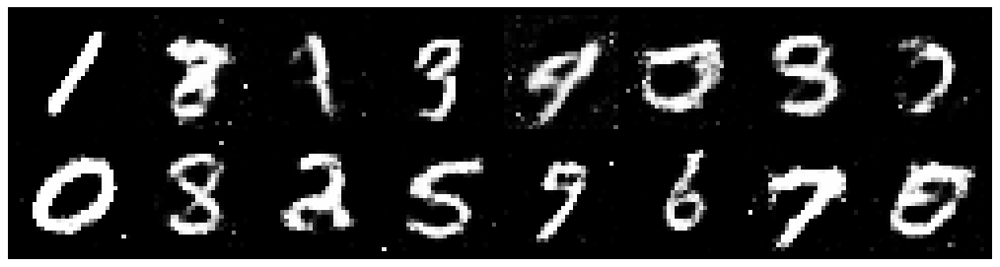

Epoch: [86/200], Batch Num: [0/600]
Discriminator Loss: 1.2073, Generator Loss: 1.2036
D(x): 0.5574, D(G(z)): 0.3886


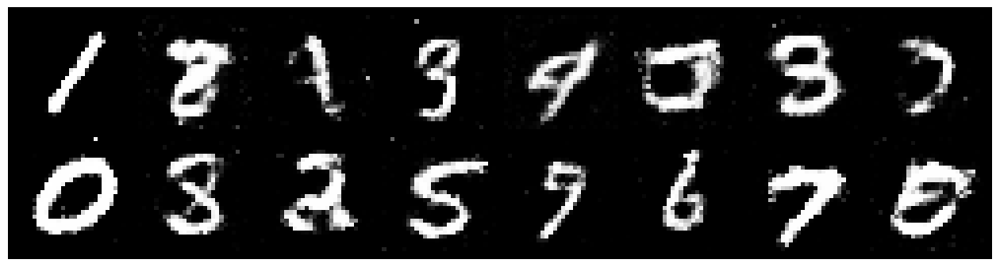

Epoch: [86/200], Batch Num: [200/600]
Discriminator Loss: 1.0683, Generator Loss: 1.0219
D(x): 0.6539, D(G(z)): 0.4041


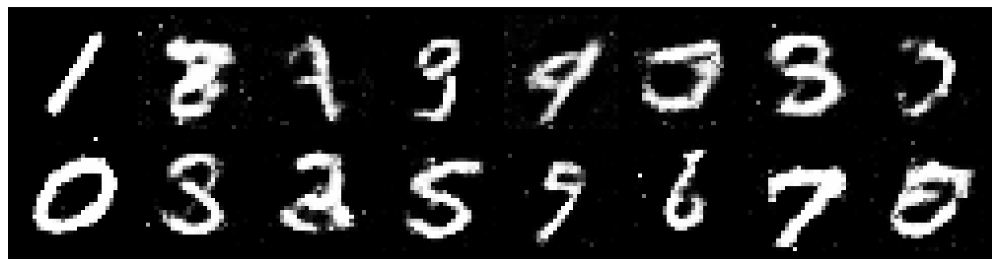

Epoch: [86/200], Batch Num: [400/600]
Discriminator Loss: 1.1496, Generator Loss: 1.0808
D(x): 0.6135, D(G(z)): 0.3957


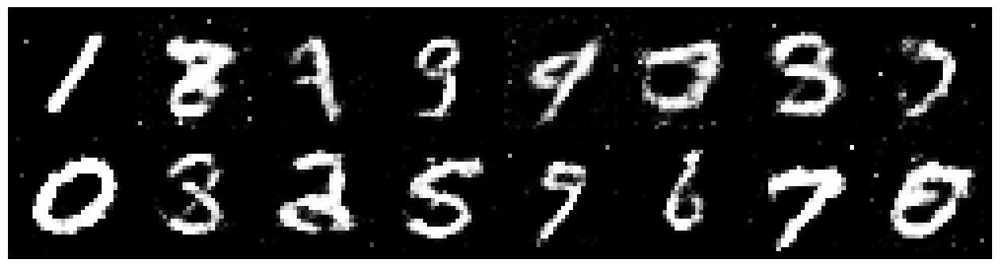

Epoch: [87/200], Batch Num: [0/600]
Discriminator Loss: 1.1220, Generator Loss: 1.0701
D(x): 0.6172, D(G(z)): 0.3993


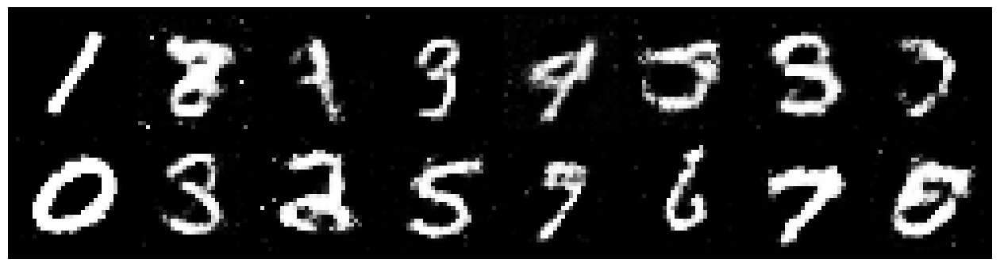

Epoch: [87/200], Batch Num: [200/600]
Discriminator Loss: 1.1956, Generator Loss: 0.8893
D(x): 0.6099, D(G(z)): 0.4298


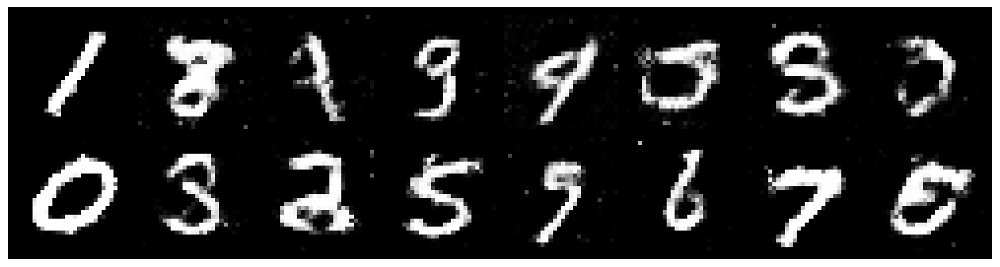

Epoch: [87/200], Batch Num: [400/600]
Discriminator Loss: 1.1915, Generator Loss: 0.9800
D(x): 0.5917, D(G(z)): 0.3946


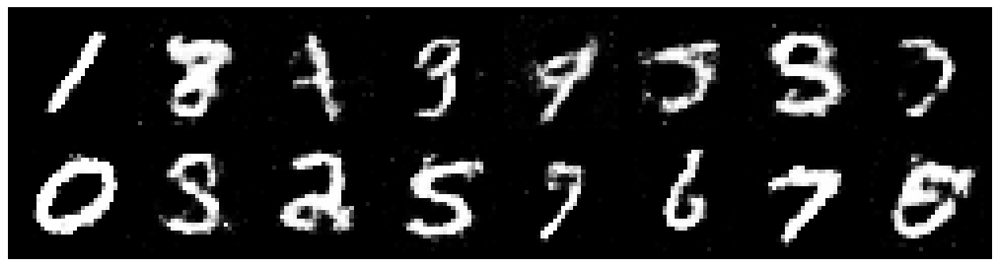

Epoch: [88/200], Batch Num: [0/600]
Discriminator Loss: 1.2290, Generator Loss: 1.0119
D(x): 0.5729, D(G(z)): 0.4121


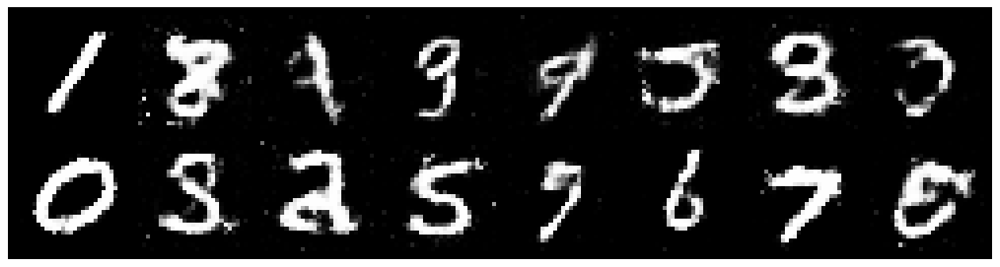

Epoch: [88/200], Batch Num: [200/600]
Discriminator Loss: 1.0977, Generator Loss: 1.1227
D(x): 0.5584, D(G(z)): 0.3373


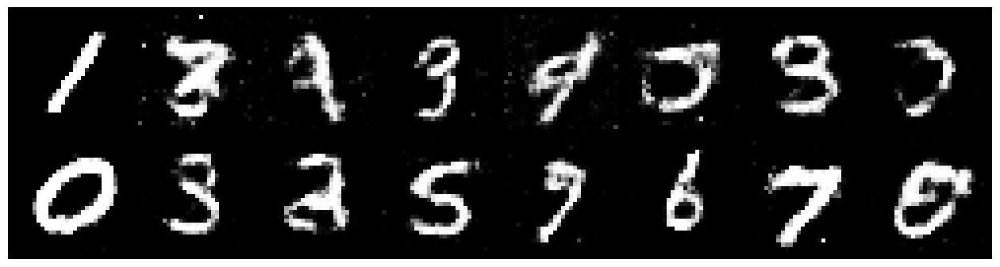

Epoch: [88/200], Batch Num: [400/600]
Discriminator Loss: 1.0895, Generator Loss: 0.9557
D(x): 0.6484, D(G(z)): 0.4186


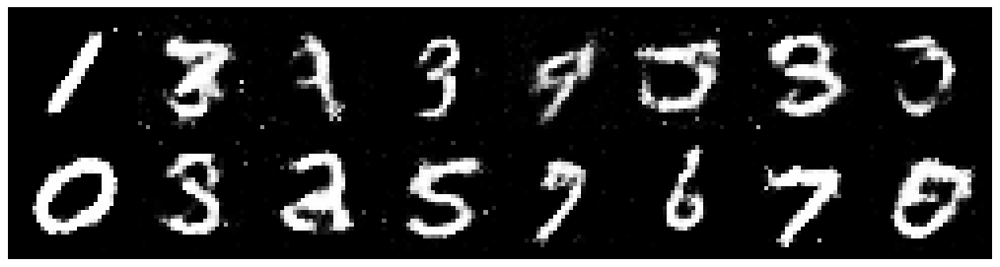

Epoch: [89/200], Batch Num: [0/600]
Discriminator Loss: 1.1370, Generator Loss: 1.0658
D(x): 0.6379, D(G(z)): 0.4020


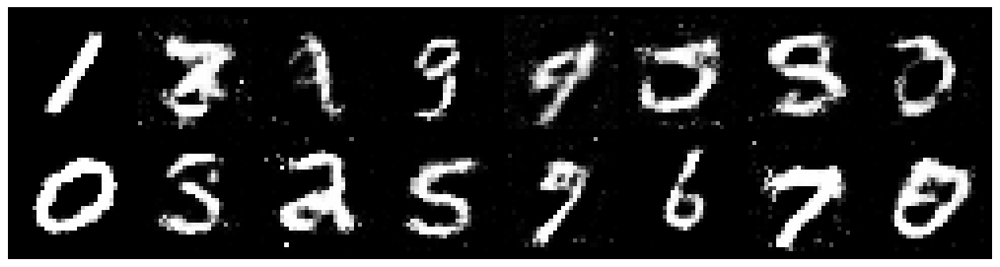

Epoch: [89/200], Batch Num: [200/600]
Discriminator Loss: 1.2985, Generator Loss: 1.0612
D(x): 0.5510, D(G(z)): 0.4132


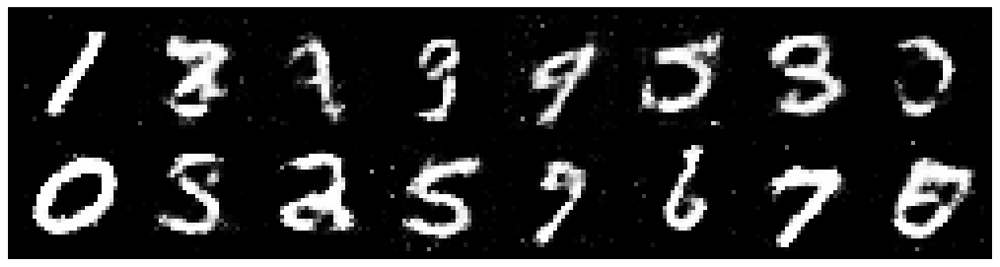

Epoch: [89/200], Batch Num: [400/600]
Discriminator Loss: 1.1393, Generator Loss: 0.9628
D(x): 0.6536, D(G(z)): 0.4230


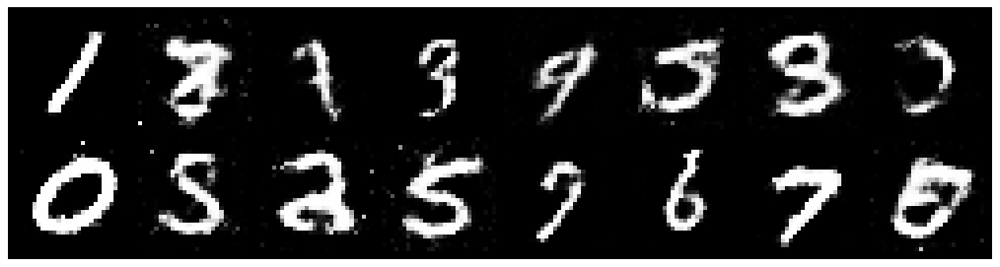

Epoch: [90/200], Batch Num: [0/600]
Discriminator Loss: 1.1090, Generator Loss: 1.0701
D(x): 0.6628, D(G(z)): 0.4073


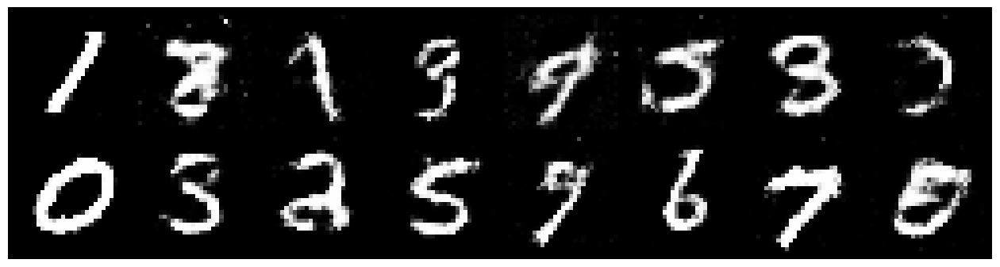

Epoch: [90/200], Batch Num: [200/600]
Discriminator Loss: 1.2023, Generator Loss: 0.9483
D(x): 0.6377, D(G(z)): 0.4663


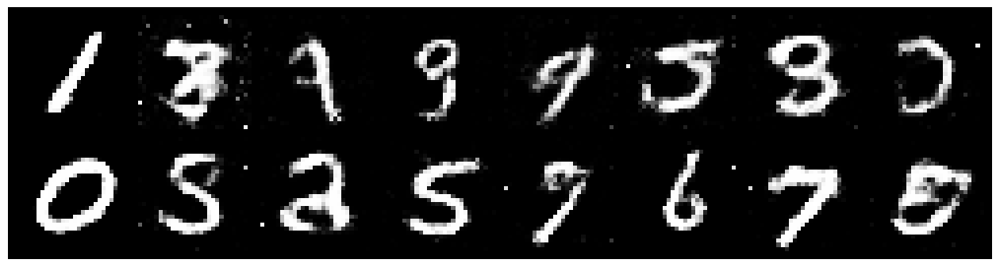

Epoch: [90/200], Batch Num: [400/600]
Discriminator Loss: 1.3004, Generator Loss: 1.0121
D(x): 0.5932, D(G(z)): 0.4666


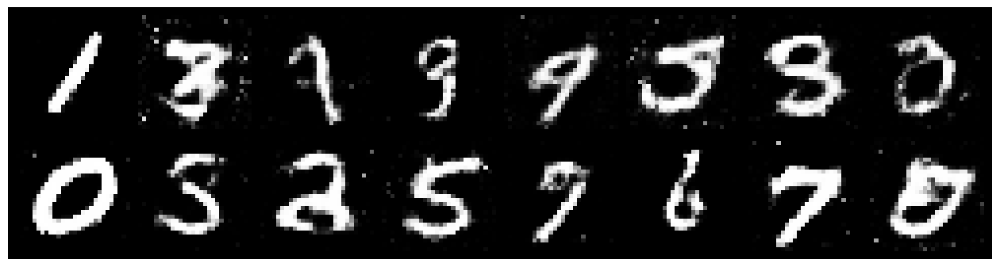

Epoch: [91/200], Batch Num: [0/600]
Discriminator Loss: 1.1016, Generator Loss: 1.2241
D(x): 0.6352, D(G(z)): 0.4098


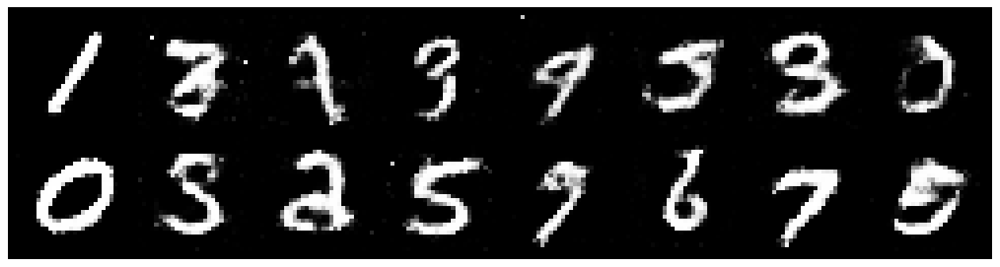

Epoch: [91/200], Batch Num: [200/600]
Discriminator Loss: 1.1878, Generator Loss: 1.1674
D(x): 0.5821, D(G(z)): 0.3820


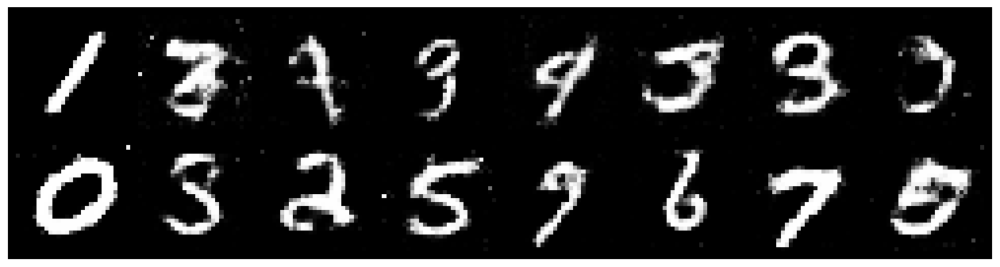

Epoch: [91/200], Batch Num: [400/600]
Discriminator Loss: 1.0768, Generator Loss: 1.2096
D(x): 0.5694, D(G(z)): 0.3238


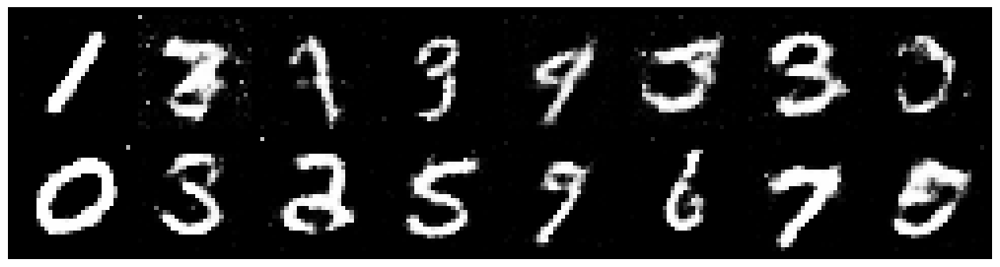

Epoch: [92/200], Batch Num: [0/600]
Discriminator Loss: 1.2908, Generator Loss: 0.9116
D(x): 0.5480, D(G(z)): 0.3893


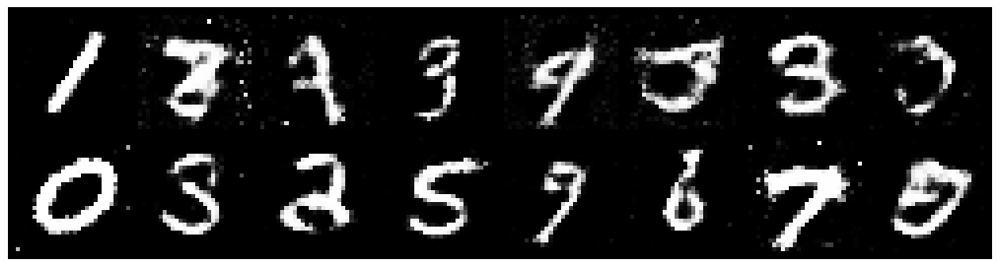

Epoch: [92/200], Batch Num: [200/600]
Discriminator Loss: 1.1686, Generator Loss: 0.9388
D(x): 0.6005, D(G(z)): 0.4007


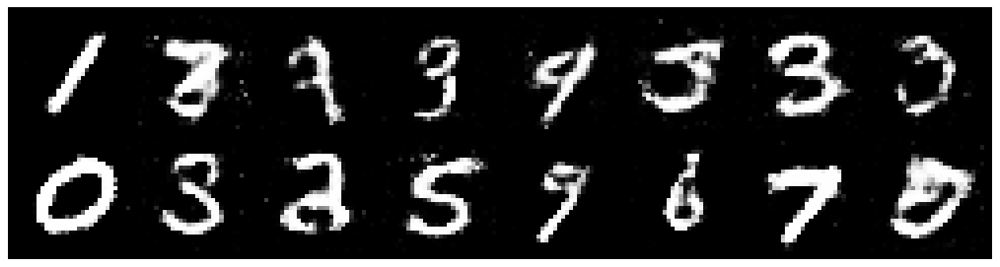

Epoch: [92/200], Batch Num: [400/600]
Discriminator Loss: 1.0776, Generator Loss: 1.2641
D(x): 0.6084, D(G(z)): 0.3553


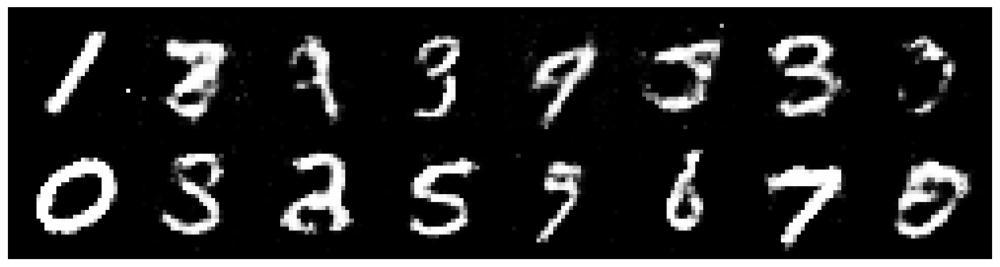

Epoch: [93/200], Batch Num: [0/600]
Discriminator Loss: 1.0893, Generator Loss: 1.1823
D(x): 0.6014, D(G(z)): 0.3660


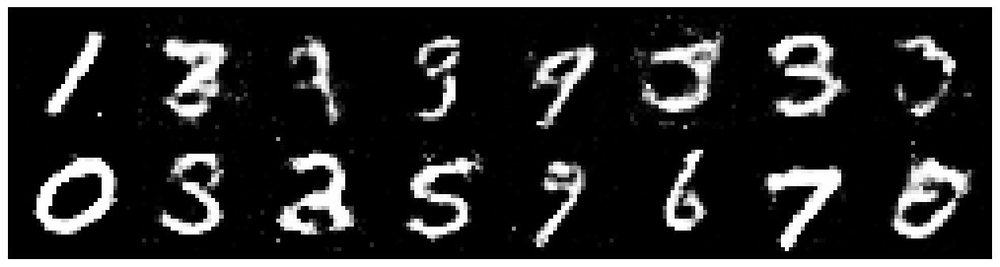

Epoch: [93/200], Batch Num: [200/600]
Discriminator Loss: 1.2340, Generator Loss: 1.1655
D(x): 0.5970, D(G(z)): 0.4203


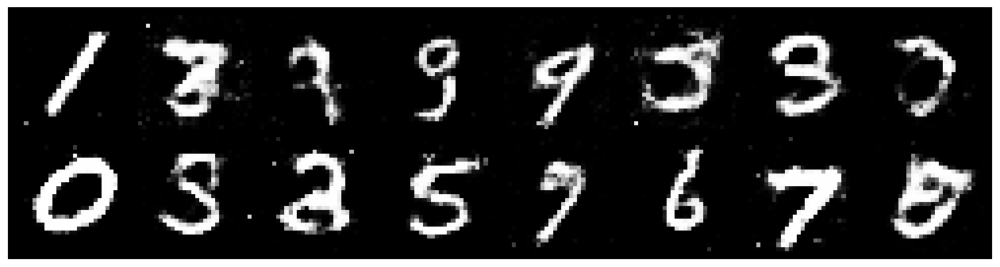

Epoch: [93/200], Batch Num: [400/600]
Discriminator Loss: 1.2115, Generator Loss: 1.0268
D(x): 0.5698, D(G(z)): 0.4149


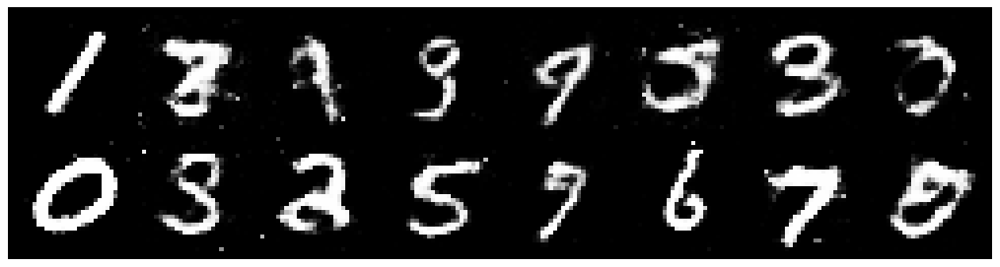

Epoch: [94/200], Batch Num: [0/600]
Discriminator Loss: 1.3306, Generator Loss: 1.0584
D(x): 0.5680, D(G(z)): 0.4227


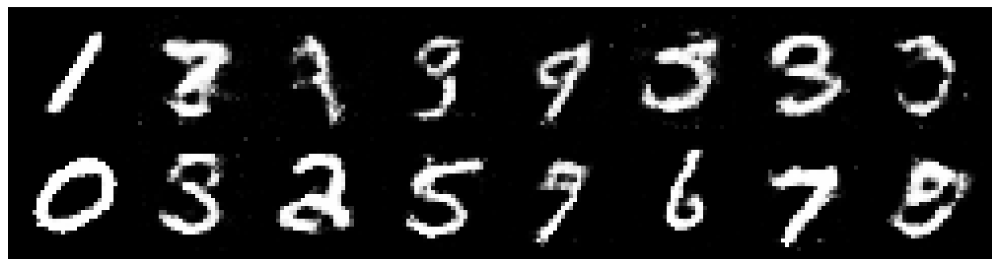

Epoch: [94/200], Batch Num: [200/600]
Discriminator Loss: 1.0775, Generator Loss: 1.1220
D(x): 0.5981, D(G(z)): 0.3537


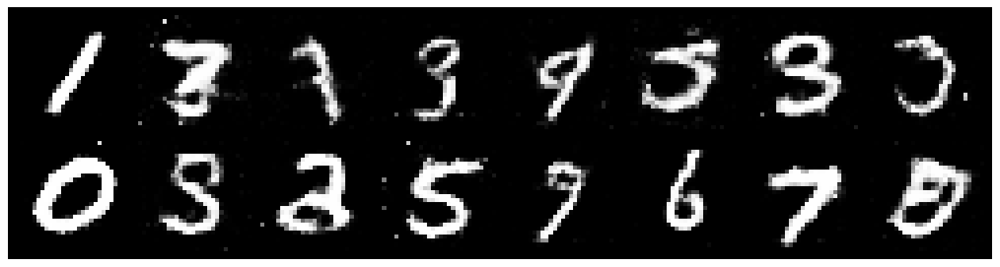

Epoch: [94/200], Batch Num: [400/600]
Discriminator Loss: 1.1731, Generator Loss: 1.0491
D(x): 0.5821, D(G(z)): 0.3983


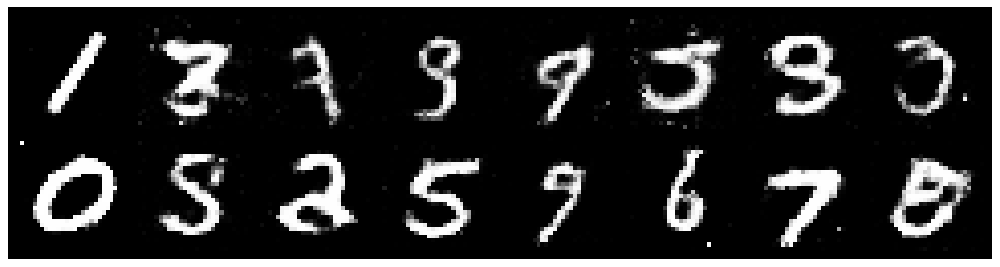

Epoch: [95/200], Batch Num: [0/600]
Discriminator Loss: 1.2346, Generator Loss: 1.0121
D(x): 0.5907, D(G(z)): 0.4266


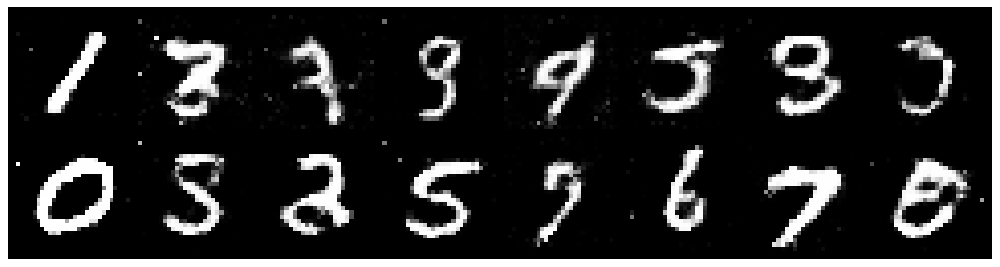

Epoch: [95/200], Batch Num: [200/600]
Discriminator Loss: 1.2787, Generator Loss: 0.9257
D(x): 0.5985, D(G(z)): 0.4731


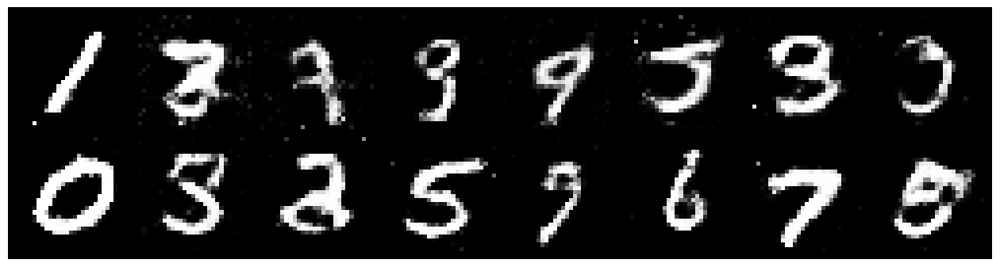

Epoch: [95/200], Batch Num: [400/600]
Discriminator Loss: 1.2494, Generator Loss: 0.9114
D(x): 0.5735, D(G(z)): 0.4331


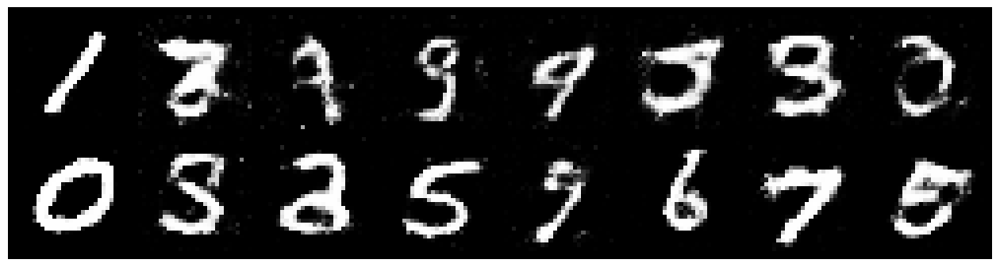

Epoch: [96/200], Batch Num: [0/600]
Discriminator Loss: 1.2238, Generator Loss: 0.9499
D(x): 0.5915, D(G(z)): 0.4305


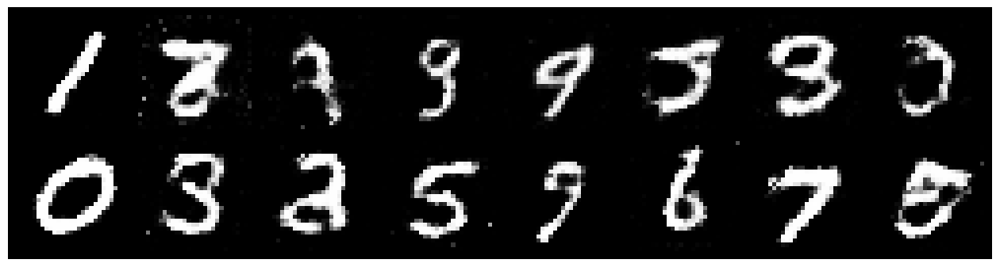

Epoch: [96/200], Batch Num: [200/600]
Discriminator Loss: 1.2113, Generator Loss: 0.8589
D(x): 0.5852, D(G(z)): 0.4224


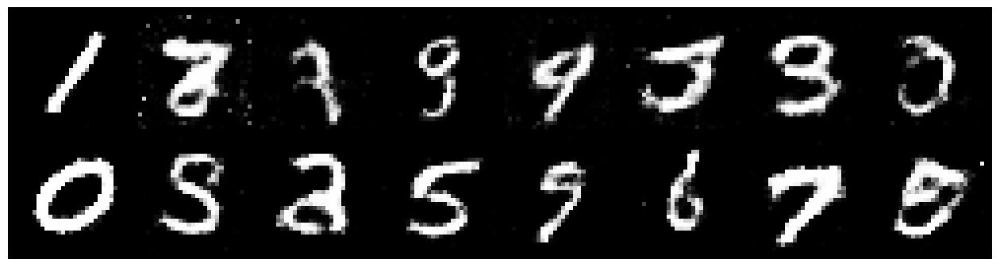

Epoch: [96/200], Batch Num: [400/600]
Discriminator Loss: 1.1859, Generator Loss: 1.1592
D(x): 0.5589, D(G(z)): 0.3605


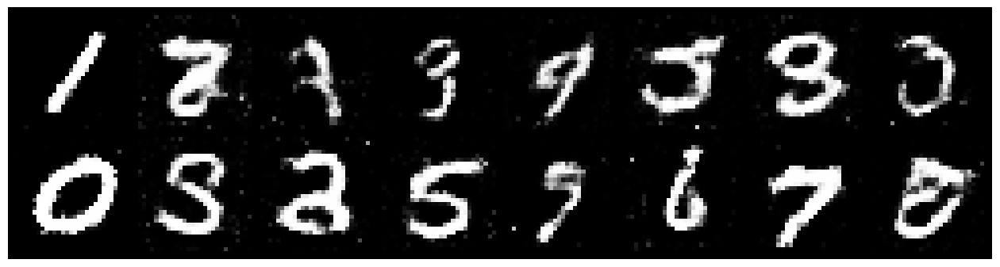

Epoch: [97/200], Batch Num: [0/600]
Discriminator Loss: 1.2440, Generator Loss: 0.9126
D(x): 0.5949, D(G(z)): 0.4645


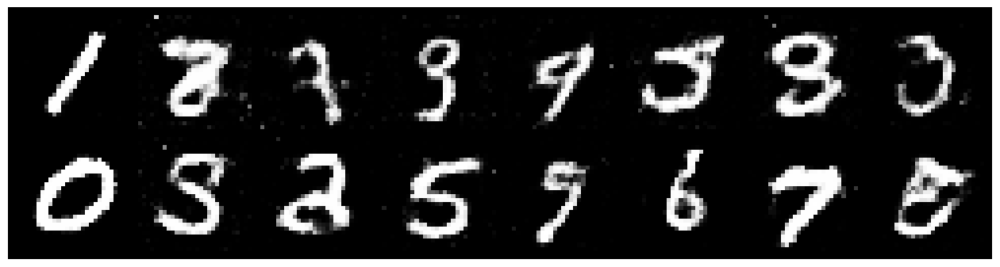

Epoch: [97/200], Batch Num: [200/600]
Discriminator Loss: 1.1307, Generator Loss: 1.0465
D(x): 0.6294, D(G(z)): 0.3928


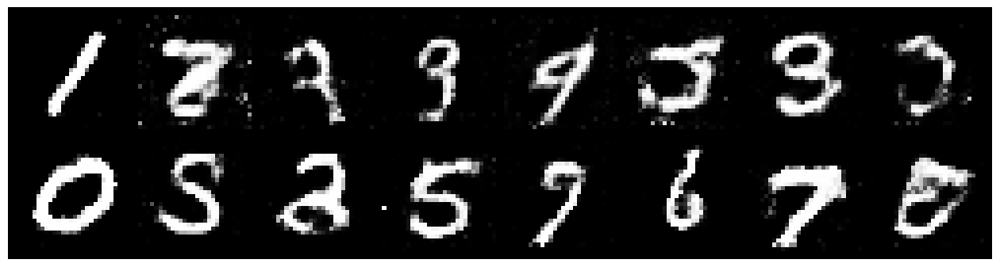

Epoch: [97/200], Batch Num: [400/600]
Discriminator Loss: 1.1054, Generator Loss: 1.2140
D(x): 0.5896, D(G(z)): 0.3641


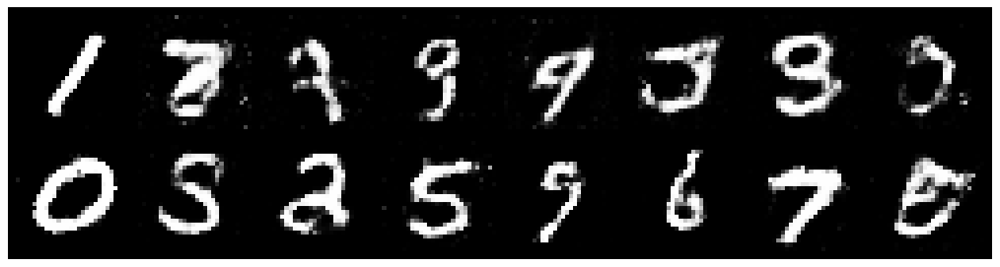

Epoch: [98/200], Batch Num: [0/600]
Discriminator Loss: 1.1790, Generator Loss: 1.0396
D(x): 0.6143, D(G(z)): 0.4462


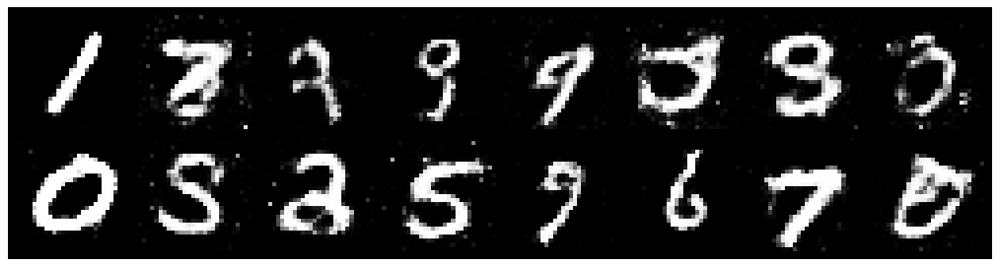

Epoch: [98/200], Batch Num: [200/600]
Discriminator Loss: 1.2227, Generator Loss: 0.9692
D(x): 0.5845, D(G(z)): 0.4340


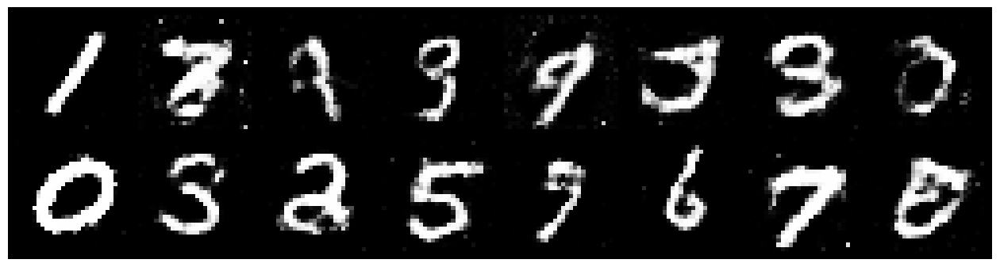

Epoch: [98/200], Batch Num: [400/600]
Discriminator Loss: 1.2260, Generator Loss: 1.0266
D(x): 0.5790, D(G(z)): 0.4225


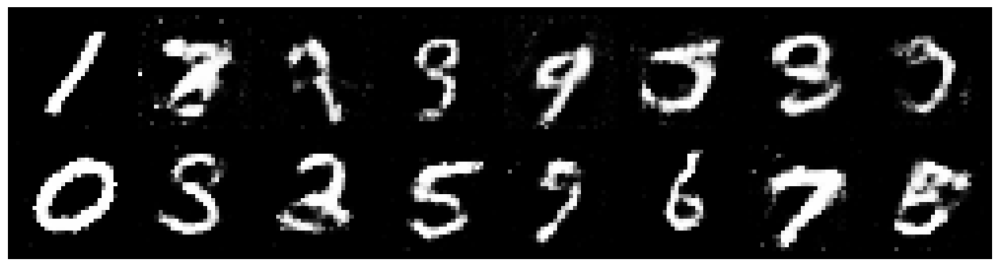

Epoch: [99/200], Batch Num: [0/600]
Discriminator Loss: 1.1496, Generator Loss: 0.8749
D(x): 0.6049, D(G(z)): 0.4186


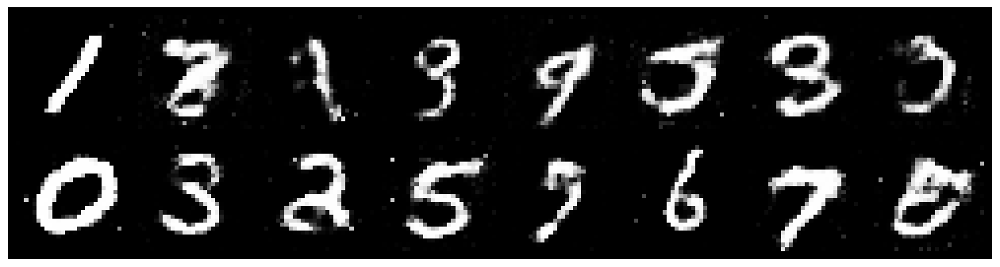

Epoch: [99/200], Batch Num: [200/600]
Discriminator Loss: 1.1065, Generator Loss: 0.8644
D(x): 0.6437, D(G(z)): 0.4178


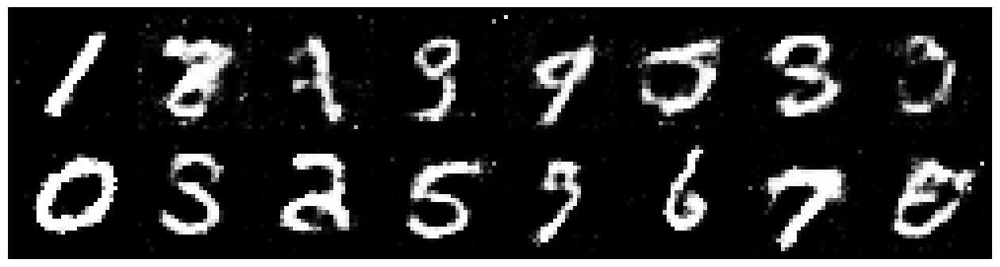

Epoch: [99/200], Batch Num: [400/600]
Discriminator Loss: 1.2124, Generator Loss: 0.9955
D(x): 0.5797, D(G(z)): 0.4187


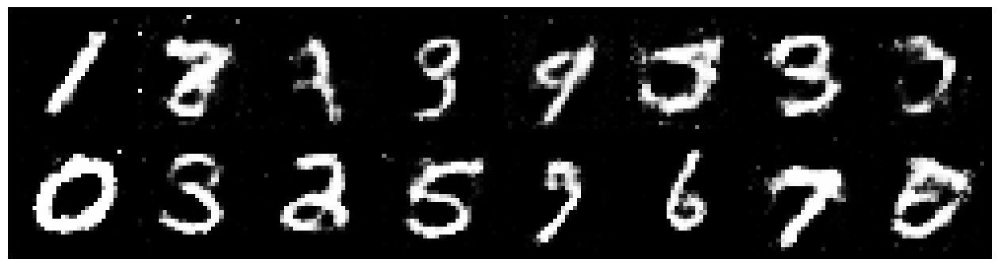

Epoch: [100/200], Batch Num: [0/600]
Discriminator Loss: 1.1592, Generator Loss: 0.9027
D(x): 0.6026, D(G(z)): 0.4224


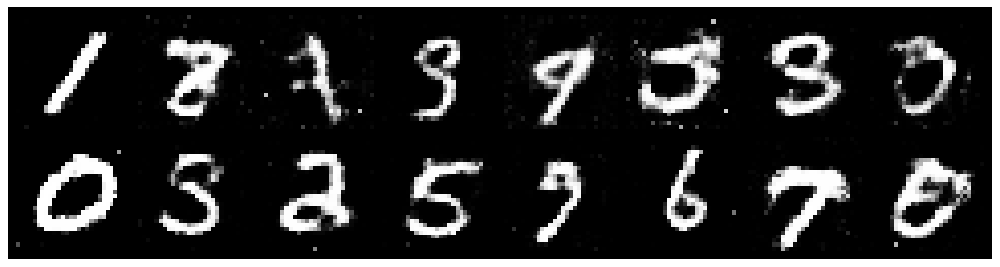

Epoch: [100/200], Batch Num: [200/600]
Discriminator Loss: 1.2360, Generator Loss: 0.8558
D(x): 0.5829, D(G(z)): 0.4044


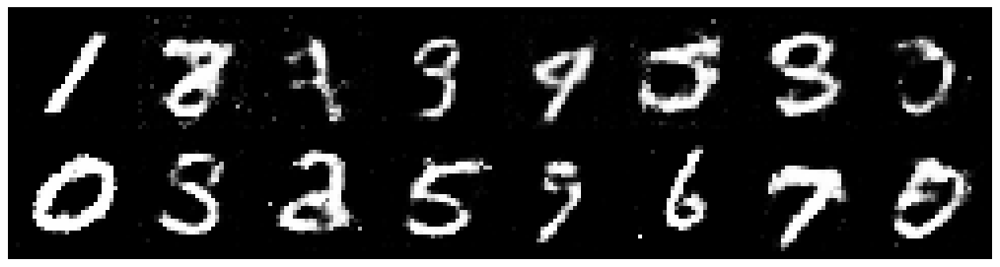

Epoch: [100/200], Batch Num: [400/600]
Discriminator Loss: 1.1245, Generator Loss: 1.0007
D(x): 0.6002, D(G(z)): 0.3837


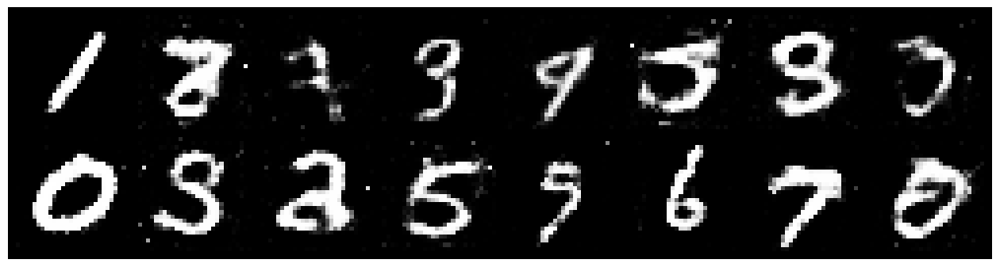

Epoch: [101/200], Batch Num: [0/600]
Discriminator Loss: 1.2246, Generator Loss: 0.9294
D(x): 0.6159, D(G(z)): 0.4539


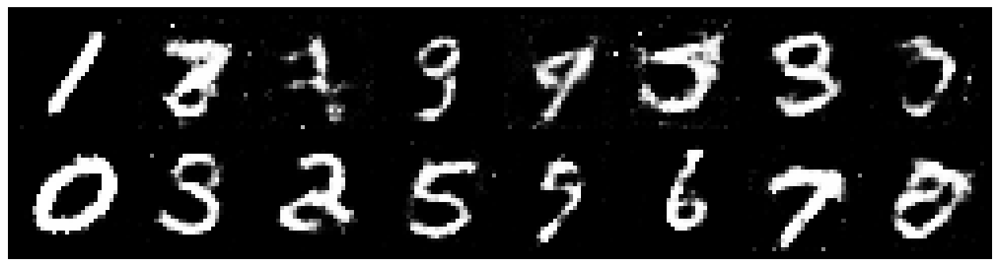

Epoch: [101/200], Batch Num: [200/600]
Discriminator Loss: 1.3127, Generator Loss: 0.9712
D(x): 0.5793, D(G(z)): 0.4522


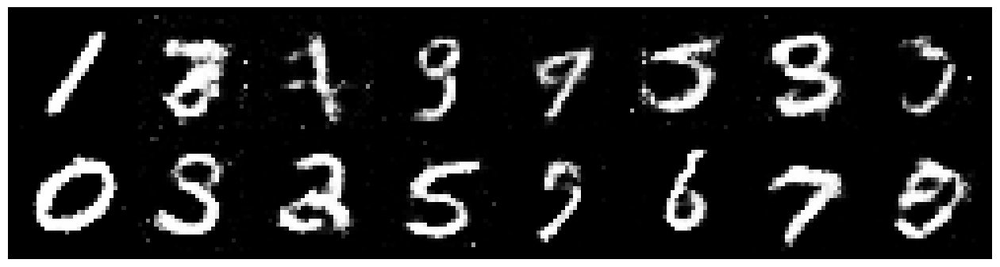

Epoch: [101/200], Batch Num: [400/600]
Discriminator Loss: 1.1843, Generator Loss: 1.0534
D(x): 0.6024, D(G(z)): 0.4225


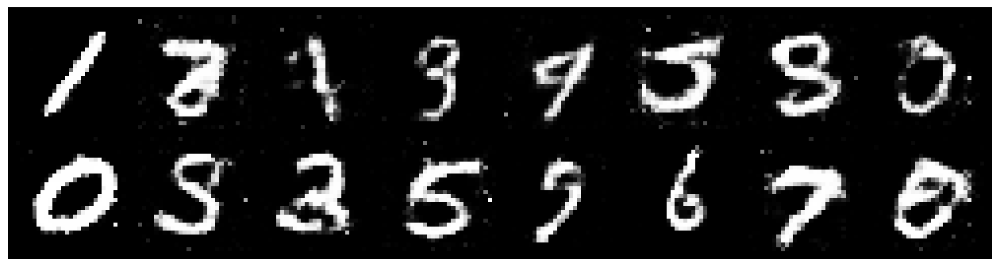

Epoch: [102/200], Batch Num: [0/600]
Discriminator Loss: 1.1323, Generator Loss: 1.0642
D(x): 0.5744, D(G(z)): 0.3614


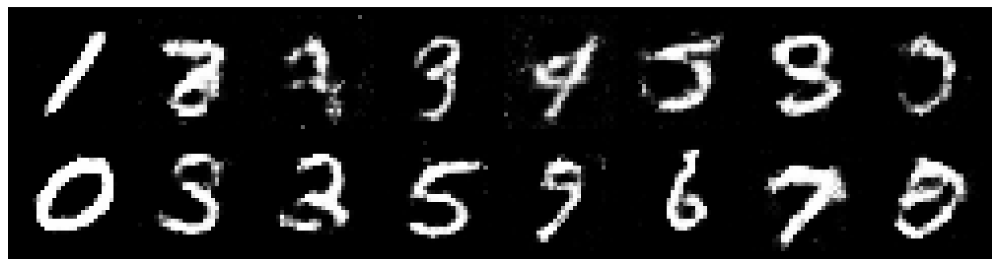

Epoch: [102/200], Batch Num: [200/600]
Discriminator Loss: 1.1291, Generator Loss: 1.0727
D(x): 0.6175, D(G(z)): 0.4164


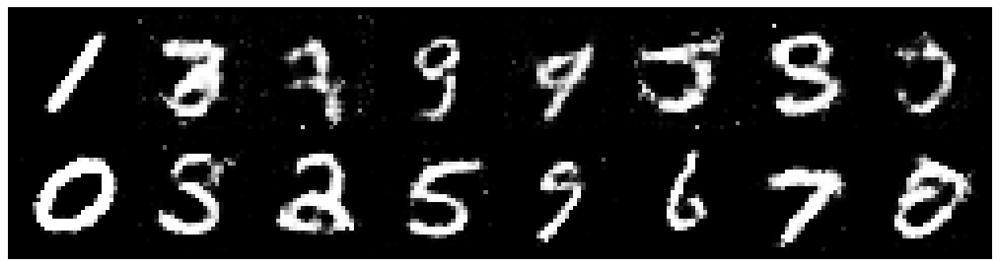

Epoch: [102/200], Batch Num: [400/600]
Discriminator Loss: 1.2707, Generator Loss: 1.0196
D(x): 0.5946, D(G(z)): 0.4474


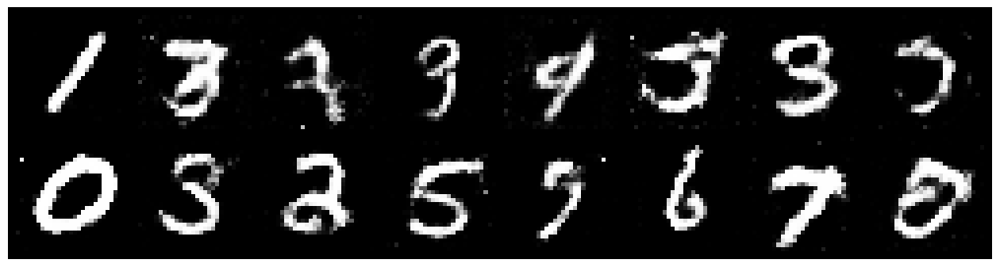

Epoch: [103/200], Batch Num: [0/600]
Discriminator Loss: 1.1790, Generator Loss: 1.1008
D(x): 0.5478, D(G(z)): 0.3657


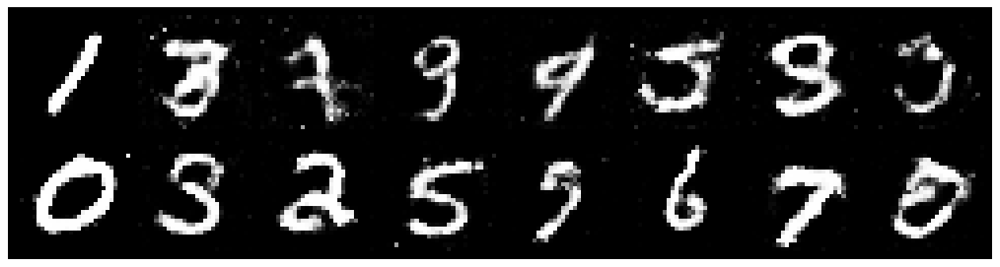

Epoch: [103/200], Batch Num: [200/600]
Discriminator Loss: 1.1624, Generator Loss: 1.1112
D(x): 0.5849, D(G(z)): 0.4034


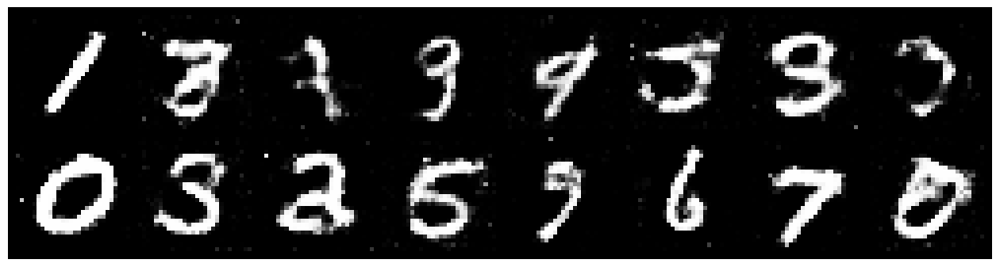

Epoch: [103/200], Batch Num: [400/600]
Discriminator Loss: 1.1992, Generator Loss: 1.1097
D(x): 0.6237, D(G(z)): 0.4372


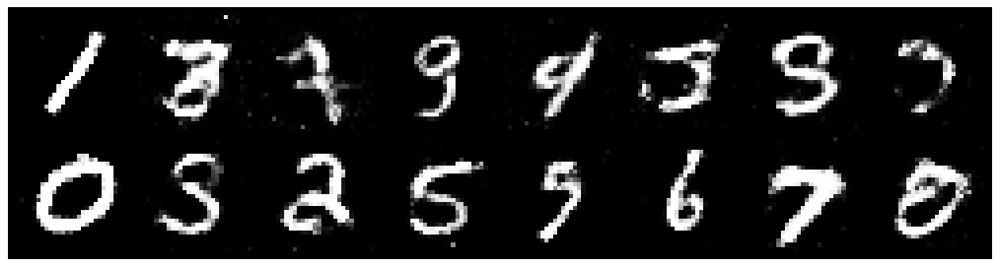

Epoch: [104/200], Batch Num: [0/600]
Discriminator Loss: 1.0820, Generator Loss: 0.9168
D(x): 0.6337, D(G(z)): 0.4151


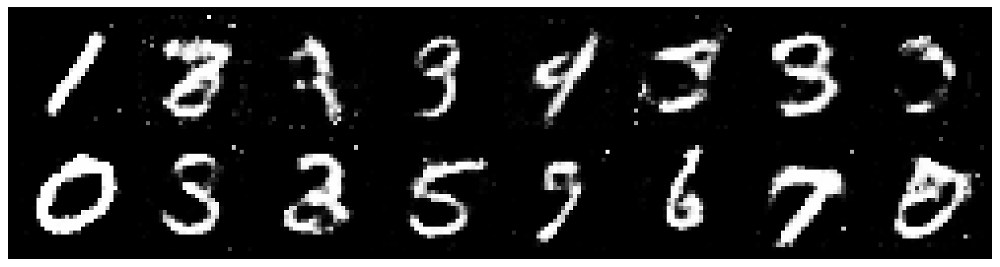

Epoch: [104/200], Batch Num: [200/600]
Discriminator Loss: 1.2794, Generator Loss: 1.0408
D(x): 0.5813, D(G(z)): 0.4303


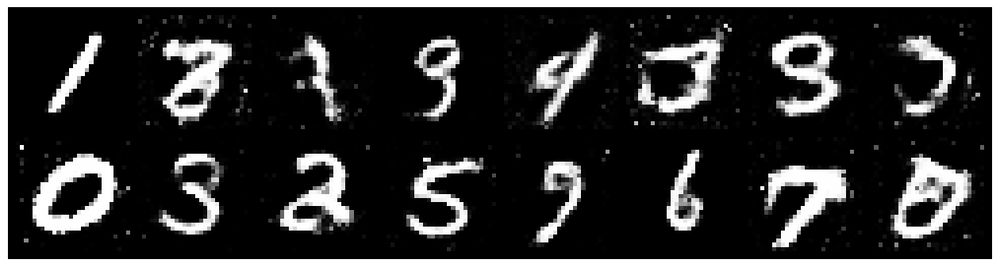

Epoch: [104/200], Batch Num: [400/600]
Discriminator Loss: 1.3253, Generator Loss: 1.0134
D(x): 0.5300, D(G(z)): 0.4228


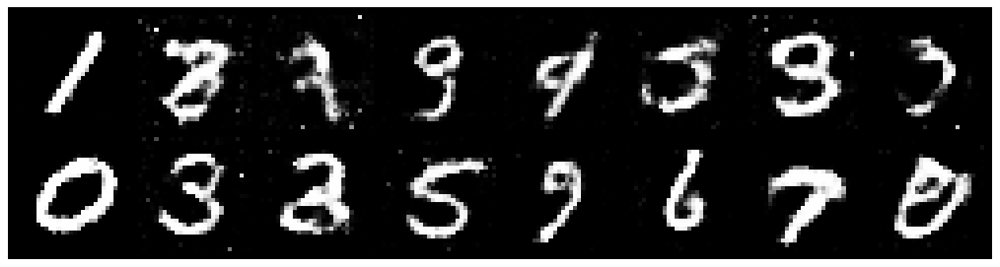

Epoch: [105/200], Batch Num: [0/600]
Discriminator Loss: 1.2297, Generator Loss: 1.0128
D(x): 0.5616, D(G(z)): 0.3984


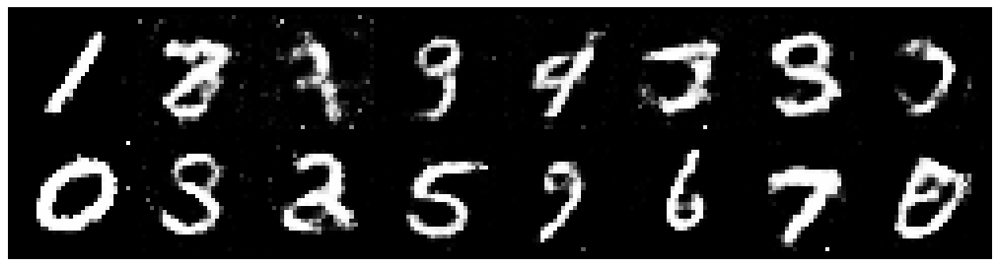

Epoch: [105/200], Batch Num: [200/600]
Discriminator Loss: 1.1348, Generator Loss: 1.0824
D(x): 0.5924, D(G(z)): 0.3834


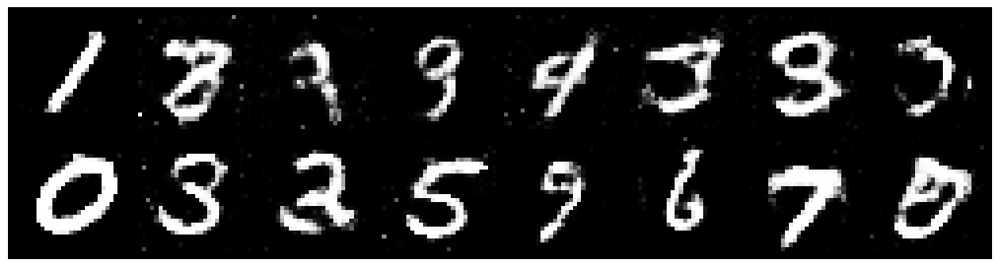

Epoch: [105/200], Batch Num: [400/600]
Discriminator Loss: 1.0636, Generator Loss: 1.0459
D(x): 0.6203, D(G(z)): 0.3710


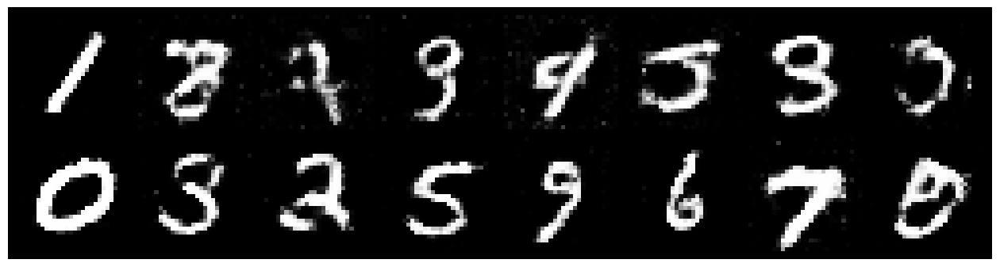

Epoch: [106/200], Batch Num: [0/600]
Discriminator Loss: 1.2479, Generator Loss: 0.9942
D(x): 0.5920, D(G(z)): 0.4375


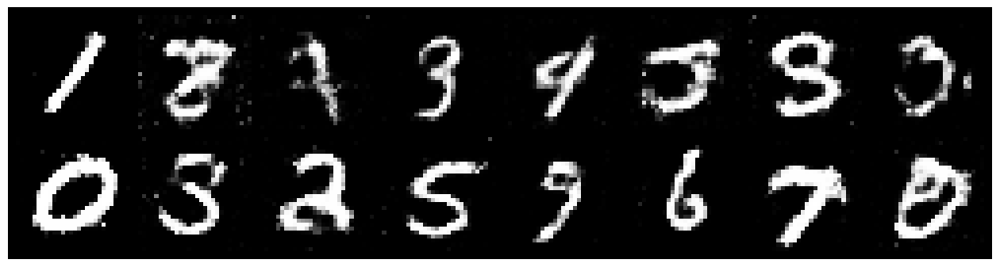

Epoch: [106/200], Batch Num: [200/600]
Discriminator Loss: 1.1918, Generator Loss: 0.9320
D(x): 0.6187, D(G(z)): 0.4463


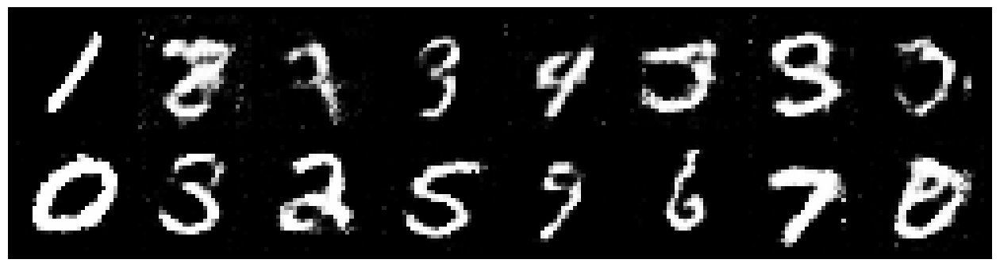

Epoch: [106/200], Batch Num: [400/600]
Discriminator Loss: 1.2307, Generator Loss: 0.9802
D(x): 0.5699, D(G(z)): 0.4196


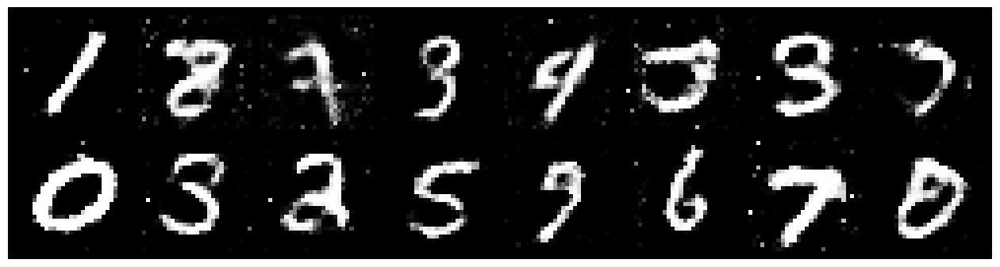

Epoch: [107/200], Batch Num: [0/600]
Discriminator Loss: 1.2251, Generator Loss: 1.0100
D(x): 0.5402, D(G(z)): 0.3961


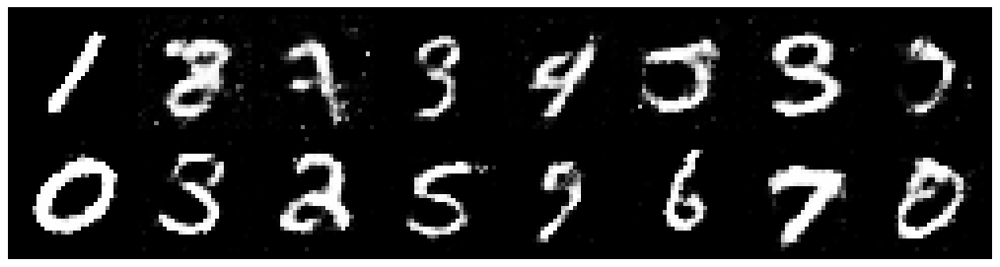

Epoch: [107/200], Batch Num: [200/600]
Discriminator Loss: 1.1459, Generator Loss: 1.0760
D(x): 0.5929, D(G(z)): 0.4005


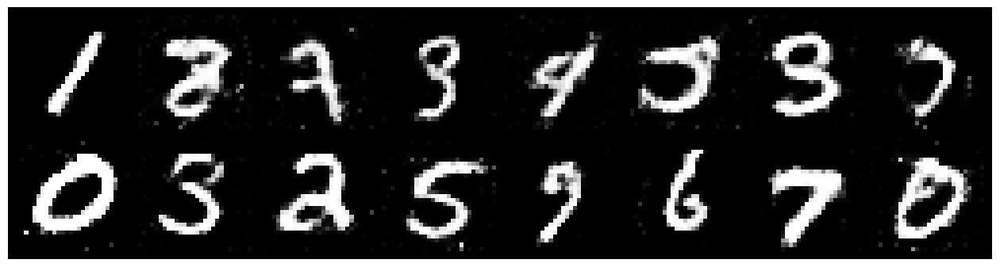

Epoch: [107/200], Batch Num: [400/600]
Discriminator Loss: 1.2850, Generator Loss: 0.8134
D(x): 0.5576, D(G(z)): 0.4441


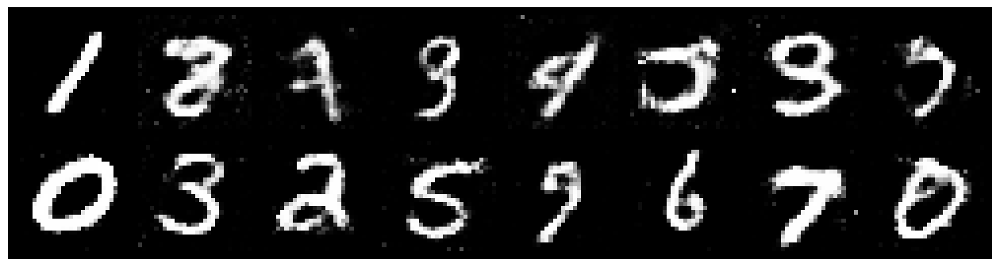

Epoch: [108/200], Batch Num: [0/600]
Discriminator Loss: 1.1887, Generator Loss: 1.2246
D(x): 0.5399, D(G(z)): 0.3614


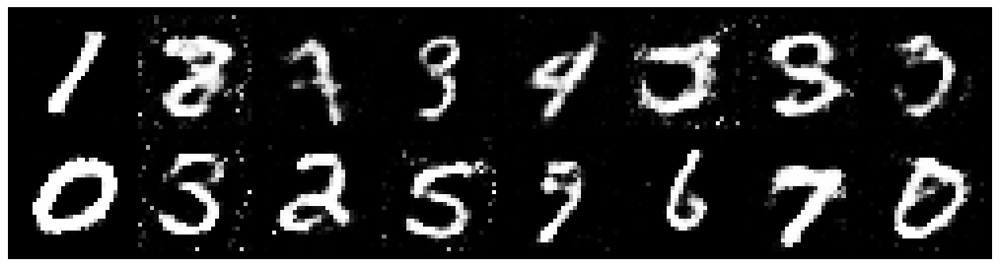

Epoch: [108/200], Batch Num: [200/600]
Discriminator Loss: 1.2288, Generator Loss: 0.9144
D(x): 0.6072, D(G(z)): 0.4420


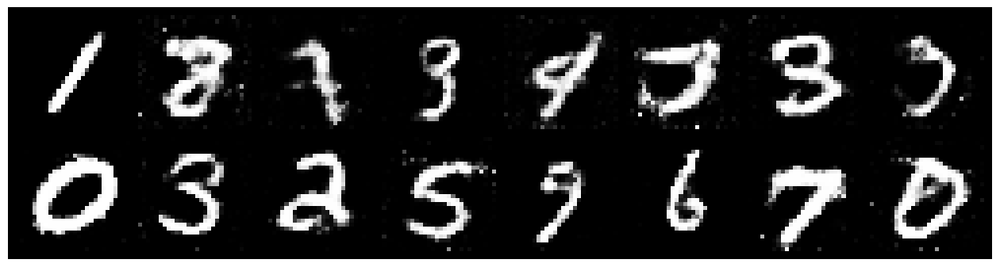

Epoch: [108/200], Batch Num: [400/600]
Discriminator Loss: 1.1631, Generator Loss: 1.1300
D(x): 0.5361, D(G(z)): 0.3479


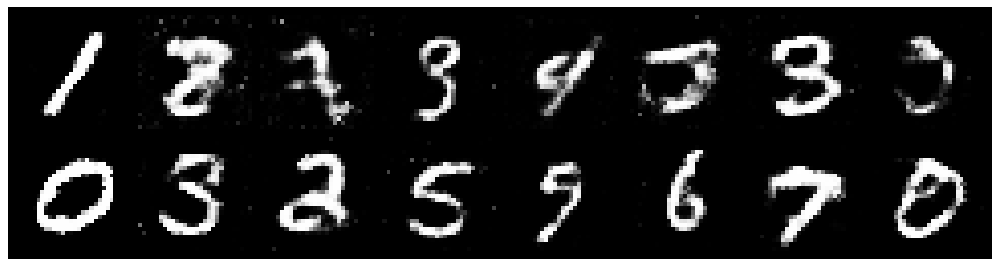

Epoch: [109/200], Batch Num: [0/600]
Discriminator Loss: 1.1800, Generator Loss: 0.9780
D(x): 0.5969, D(G(z)): 0.4332


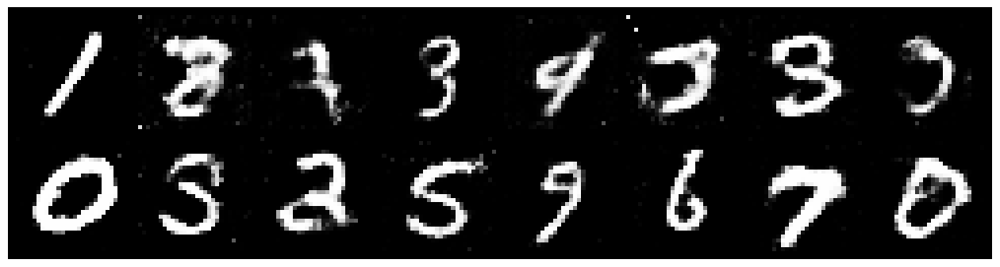

Epoch: [109/200], Batch Num: [200/600]
Discriminator Loss: 1.1617, Generator Loss: 1.1261
D(x): 0.5709, D(G(z)): 0.3818


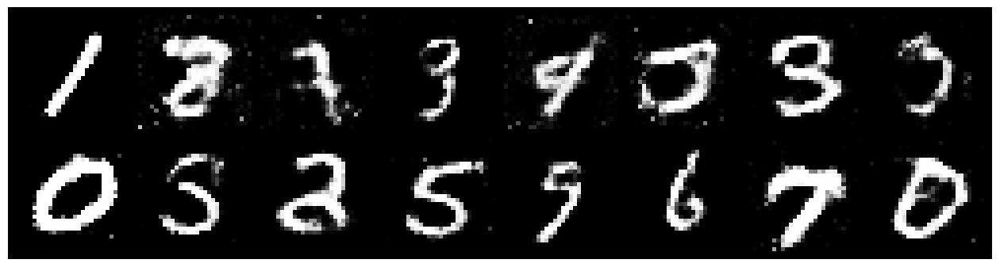

Epoch: [109/200], Batch Num: [400/600]
Discriminator Loss: 1.1462, Generator Loss: 1.0083
D(x): 0.6164, D(G(z)): 0.4286


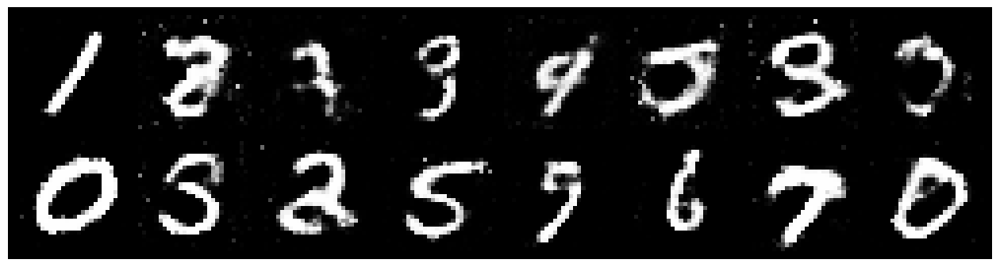

Epoch: [110/200], Batch Num: [0/600]
Discriminator Loss: 1.1923, Generator Loss: 1.0146
D(x): 0.5472, D(G(z)): 0.3640


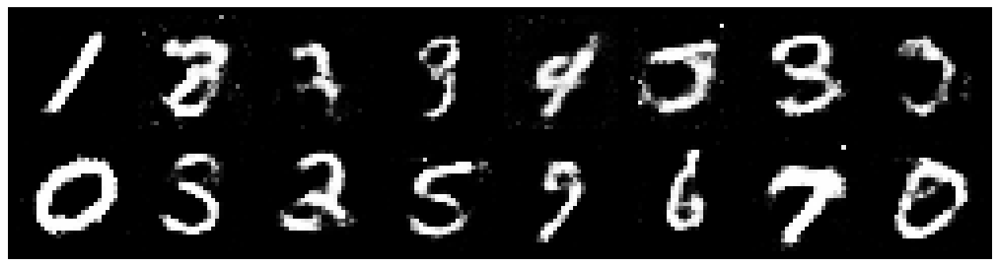

Epoch: [110/200], Batch Num: [200/600]
Discriminator Loss: 1.1287, Generator Loss: 0.9327
D(x): 0.5960, D(G(z)): 0.3938


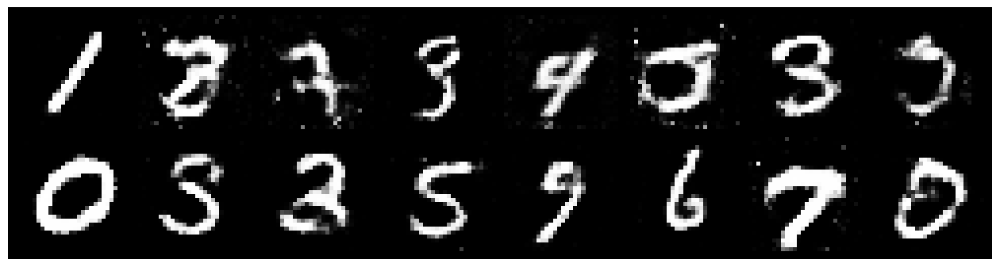

Epoch: [110/200], Batch Num: [400/600]
Discriminator Loss: 1.2901, Generator Loss: 0.9246
D(x): 0.5808, D(G(z)): 0.4392


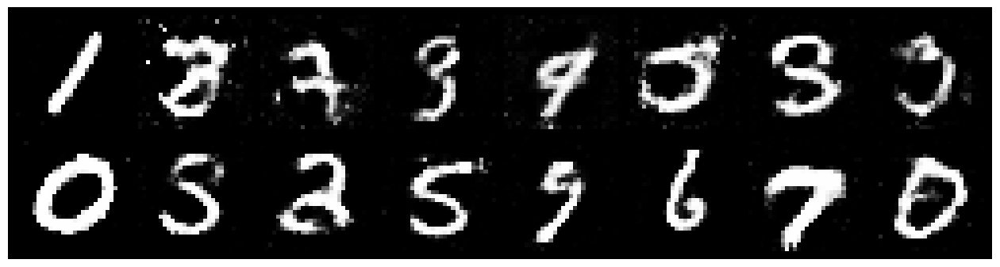

Epoch: [111/200], Batch Num: [0/600]
Discriminator Loss: 1.1642, Generator Loss: 1.0258
D(x): 0.6321, D(G(z)): 0.4484


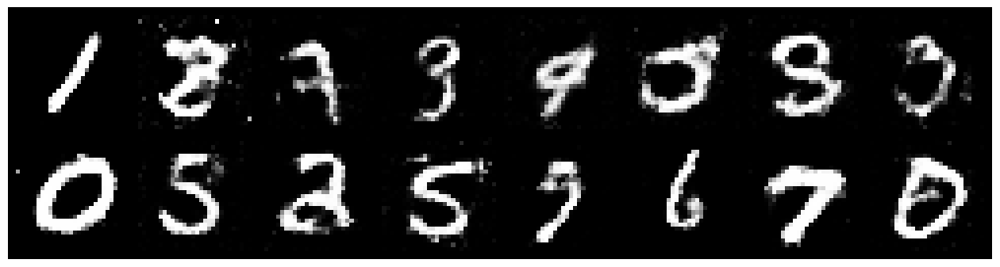

Epoch: [111/200], Batch Num: [200/600]
Discriminator Loss: 1.2335, Generator Loss: 1.0632
D(x): 0.5529, D(G(z)): 0.4137


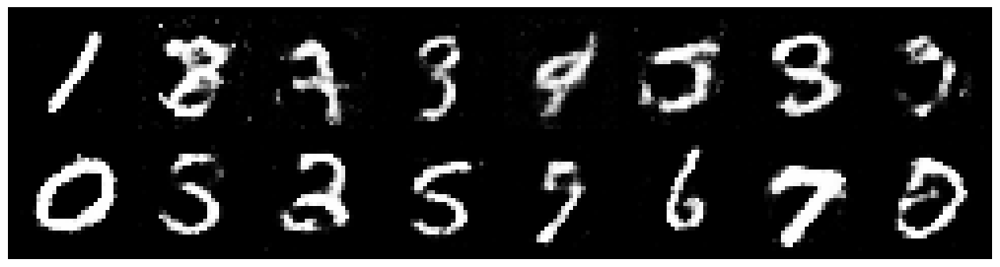

Epoch: [111/200], Batch Num: [400/600]
Discriminator Loss: 1.2692, Generator Loss: 0.8780
D(x): 0.6072, D(G(z)): 0.4807


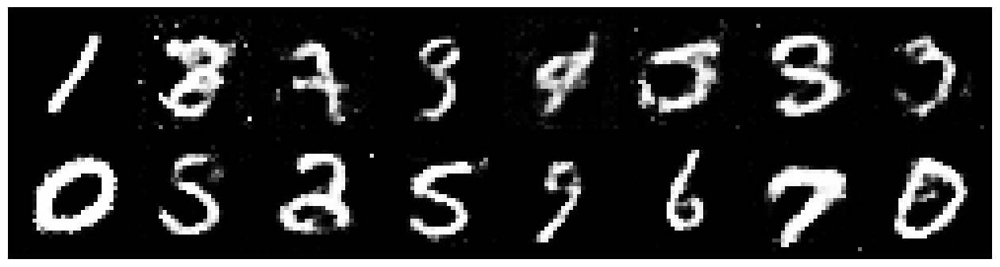

Epoch: [112/200], Batch Num: [0/600]
Discriminator Loss: 1.1995, Generator Loss: 0.9256
D(x): 0.6179, D(G(z)): 0.4369


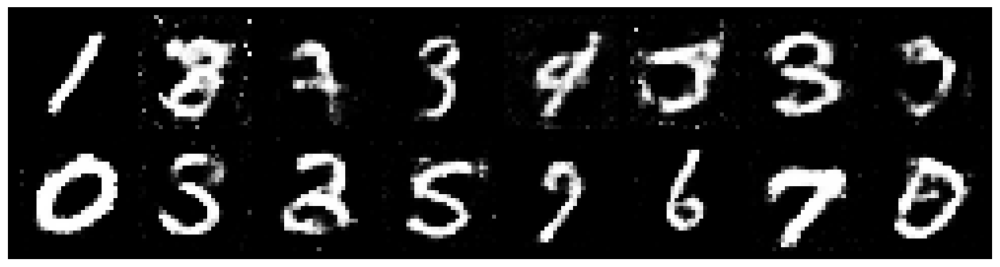

Epoch: [112/200], Batch Num: [200/600]
Discriminator Loss: 1.2049, Generator Loss: 1.0402
D(x): 0.5962, D(G(z)): 0.4237


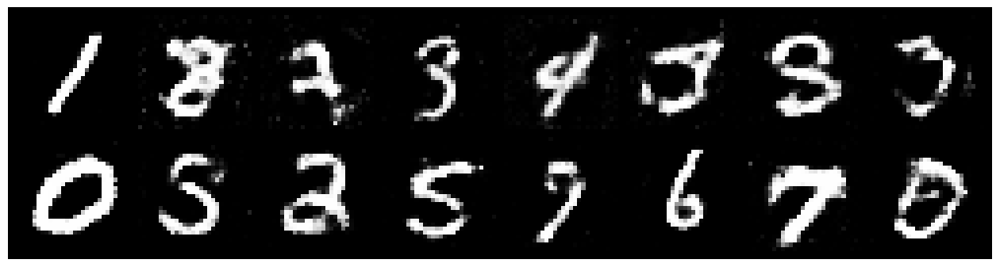

Epoch: [112/200], Batch Num: [400/600]
Discriminator Loss: 1.1523, Generator Loss: 0.9565
D(x): 0.5957, D(G(z)): 0.3940


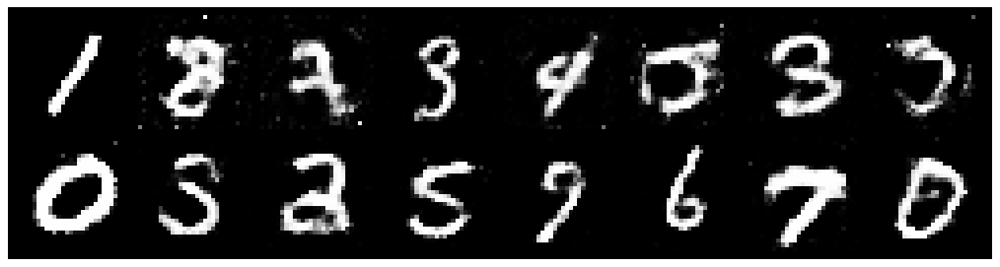

Epoch: [113/200], Batch Num: [0/600]
Discriminator Loss: 1.2986, Generator Loss: 0.9120
D(x): 0.5512, D(G(z)): 0.4458


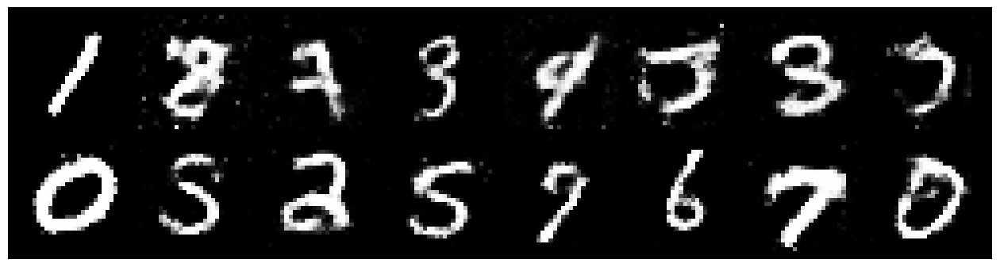

Epoch: [113/200], Batch Num: [200/600]
Discriminator Loss: 1.2558, Generator Loss: 0.8942
D(x): 0.5635, D(G(z)): 0.4388


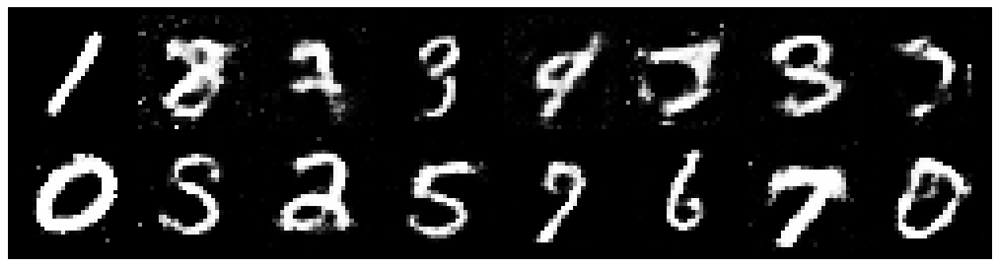

Epoch: [113/200], Batch Num: [400/600]
Discriminator Loss: 1.1805, Generator Loss: 0.9117
D(x): 0.6003, D(G(z)): 0.4318


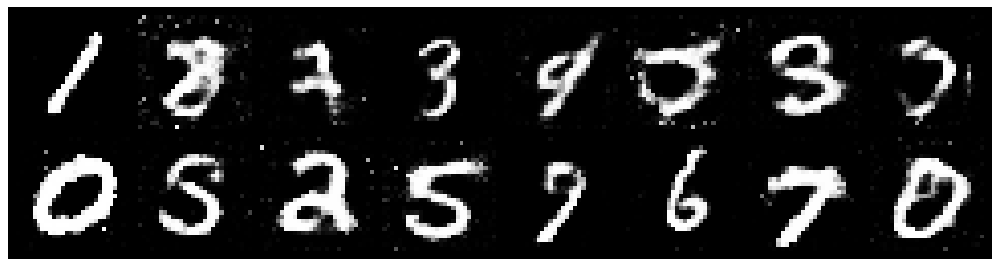

Epoch: [114/200], Batch Num: [0/600]
Discriminator Loss: 1.2833, Generator Loss: 0.8607
D(x): 0.5968, D(G(z)): 0.4756


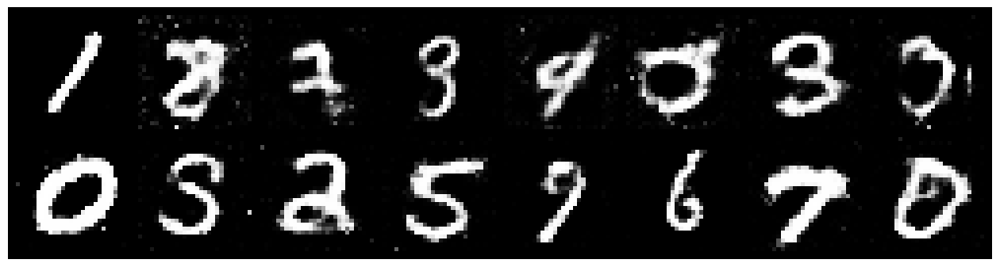

Epoch: [114/200], Batch Num: [200/600]
Discriminator Loss: 1.1961, Generator Loss: 0.9567
D(x): 0.6243, D(G(z)): 0.4564


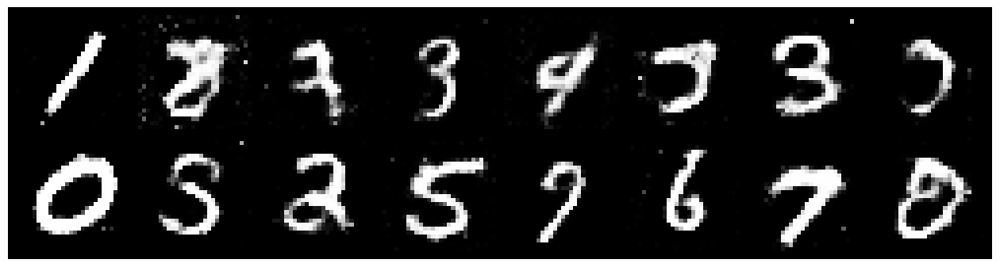

Epoch: [114/200], Batch Num: [400/600]
Discriminator Loss: 1.0891, Generator Loss: 0.9843
D(x): 0.5992, D(G(z)): 0.3676


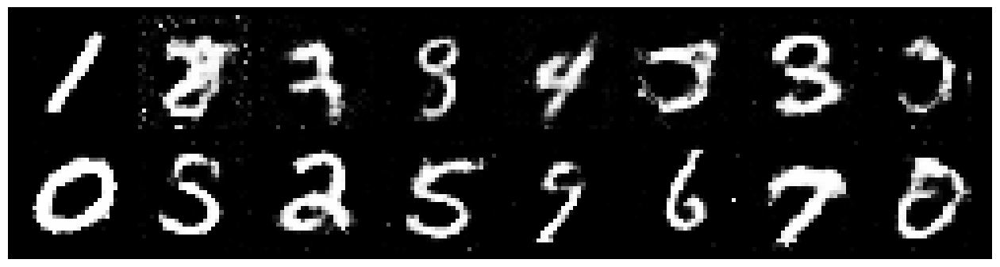

Epoch: [115/200], Batch Num: [0/600]
Discriminator Loss: 1.1628, Generator Loss: 0.9180
D(x): 0.5987, D(G(z)): 0.4280


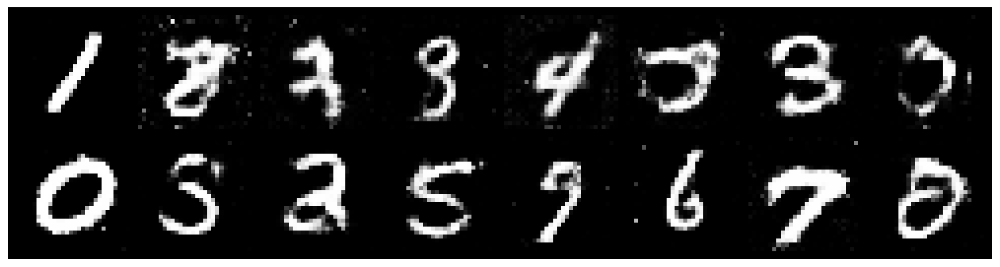

Epoch: [115/200], Batch Num: [200/600]
Discriminator Loss: 1.2118, Generator Loss: 0.9366
D(x): 0.5492, D(G(z)): 0.3963


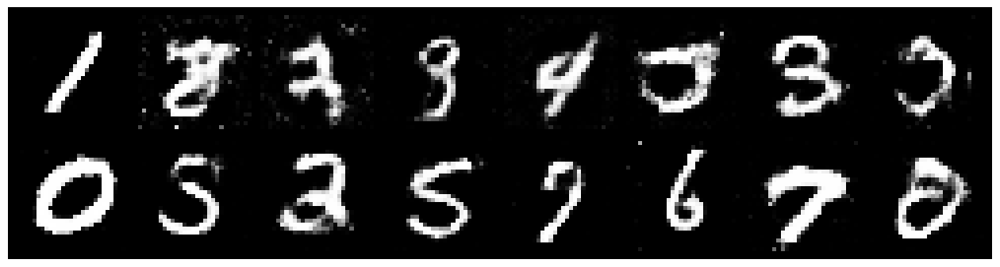

Epoch: [115/200], Batch Num: [400/600]
Discriminator Loss: 1.3307, Generator Loss: 0.9633
D(x): 0.5492, D(G(z)): 0.4620


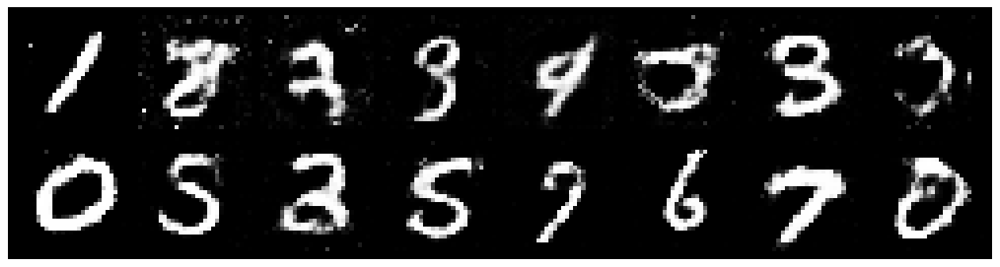

Epoch: [116/200], Batch Num: [0/600]
Discriminator Loss: 1.3385, Generator Loss: 1.0770
D(x): 0.5744, D(G(z)): 0.4585


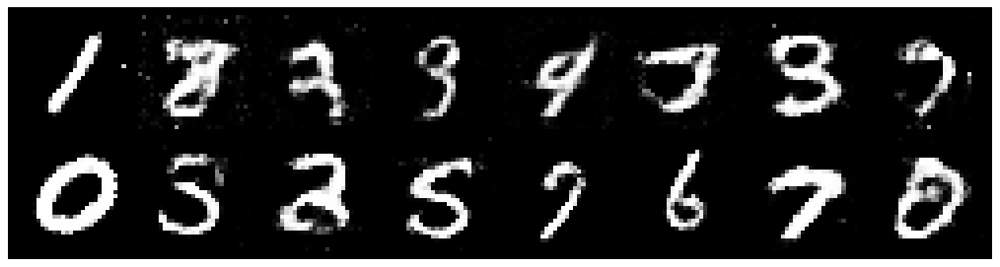

Epoch: [116/200], Batch Num: [200/600]
Discriminator Loss: 1.2889, Generator Loss: 0.9497
D(x): 0.5274, D(G(z)): 0.4212


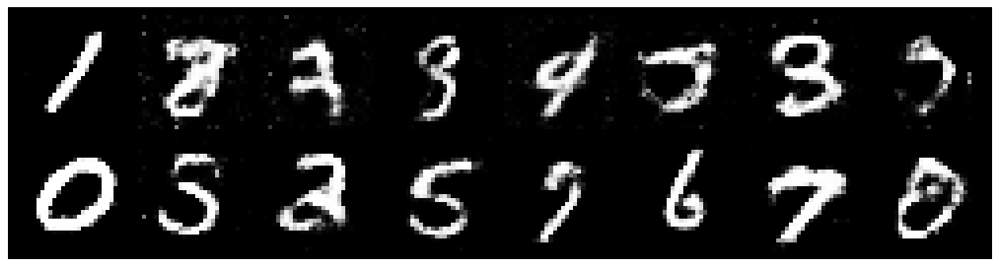

Epoch: [116/200], Batch Num: [400/600]
Discriminator Loss: 1.1332, Generator Loss: 1.1201
D(x): 0.5493, D(G(z)): 0.3533


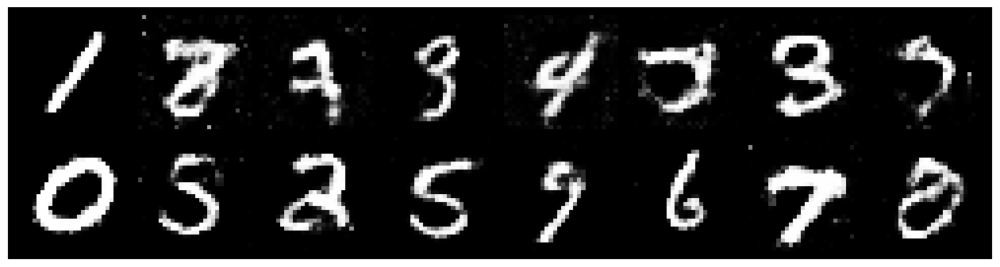

Epoch: [117/200], Batch Num: [0/600]
Discriminator Loss: 1.3309, Generator Loss: 0.9236
D(x): 0.5089, D(G(z)): 0.4213


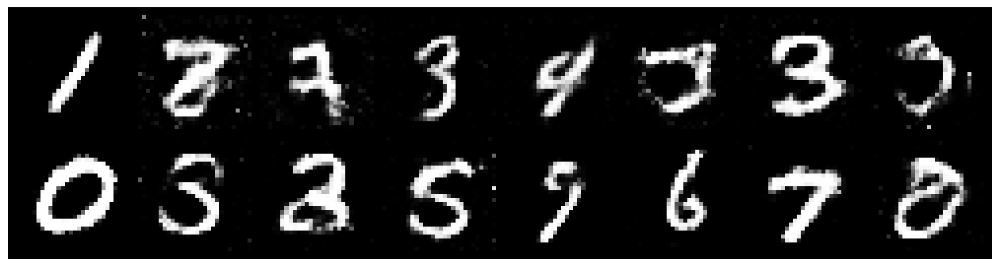

Epoch: [117/200], Batch Num: [200/600]
Discriminator Loss: 1.2614, Generator Loss: 1.1226
D(x): 0.5545, D(G(z)): 0.4148


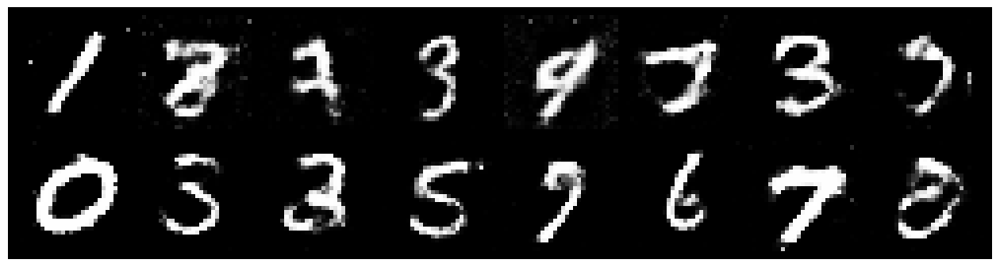

Epoch: [117/200], Batch Num: [400/600]
Discriminator Loss: 1.3183, Generator Loss: 0.8893
D(x): 0.5730, D(G(z)): 0.4765


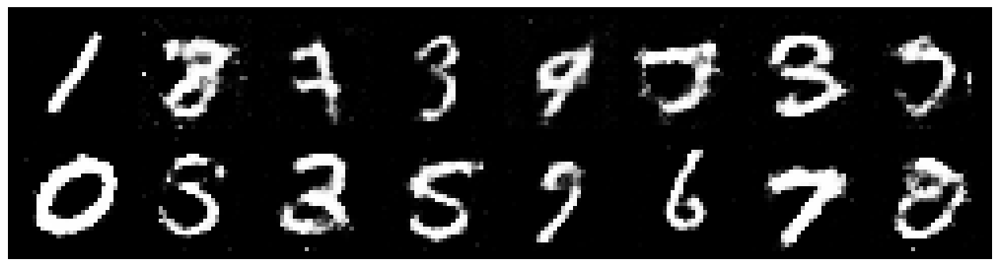

Epoch: [118/200], Batch Num: [0/600]
Discriminator Loss: 1.3021, Generator Loss: 1.0017
D(x): 0.5308, D(G(z)): 0.4253


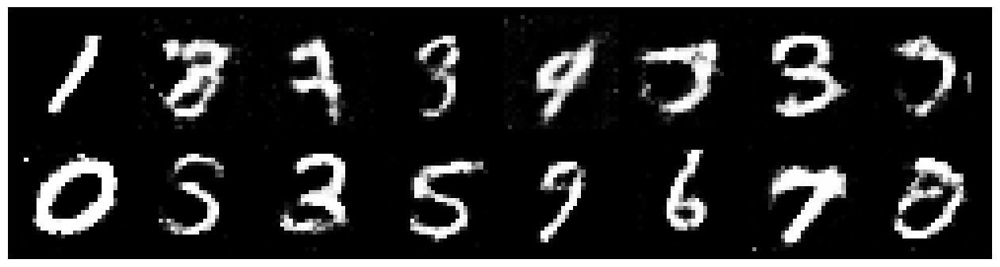

Epoch: [118/200], Batch Num: [200/600]
Discriminator Loss: 1.0928, Generator Loss: 1.0395
D(x): 0.6013, D(G(z)): 0.3866


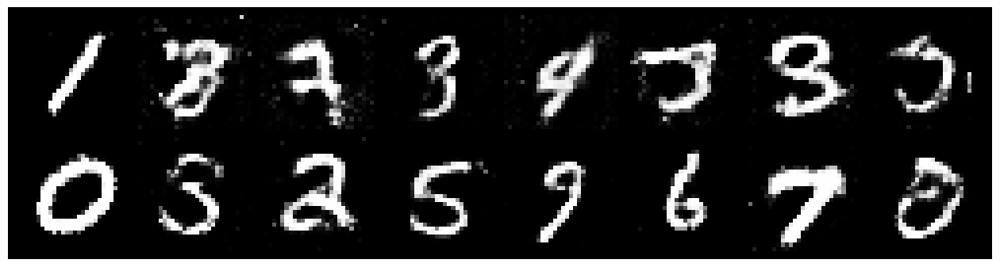

Epoch: [118/200], Batch Num: [400/600]
Discriminator Loss: 1.1234, Generator Loss: 0.9349
D(x): 0.6025, D(G(z)): 0.4107


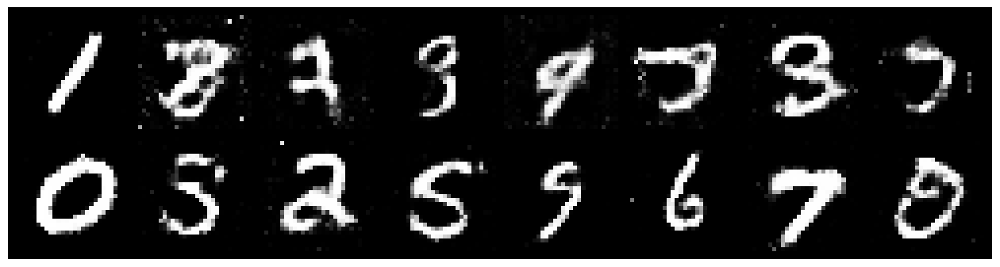

Epoch: [119/200], Batch Num: [0/600]
Discriminator Loss: 1.2269, Generator Loss: 0.9809
D(x): 0.5506, D(G(z)): 0.4020


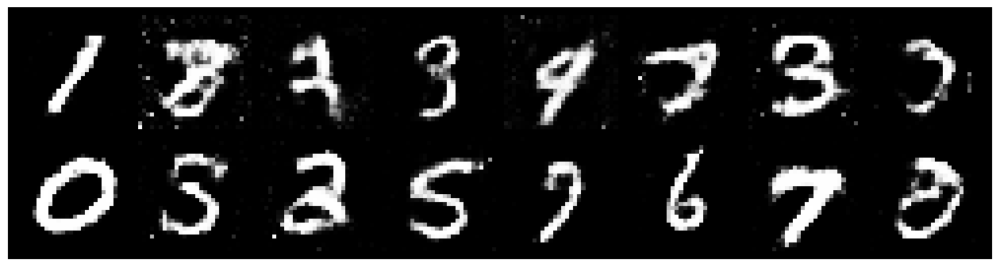

Epoch: [119/200], Batch Num: [200/600]
Discriminator Loss: 1.1599, Generator Loss: 0.9637
D(x): 0.5432, D(G(z)): 0.3654


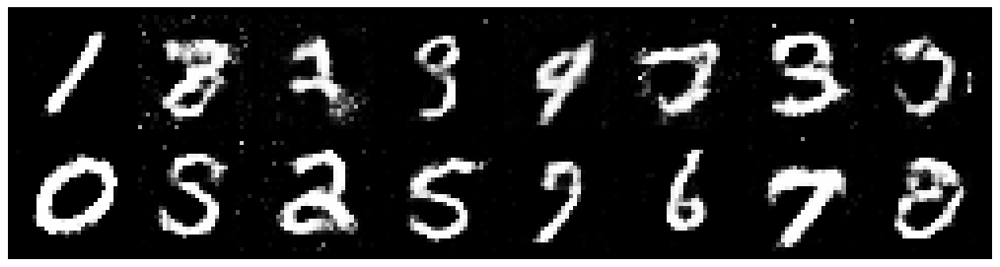

Epoch: [119/200], Batch Num: [400/600]
Discriminator Loss: 1.1466, Generator Loss: 1.1056
D(x): 0.5628, D(G(z)): 0.3725


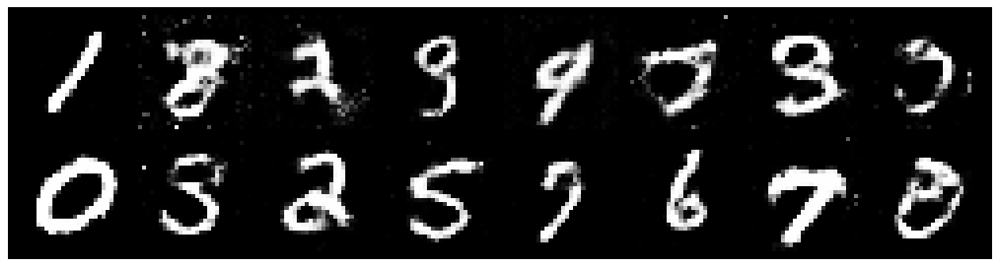

Epoch: [120/200], Batch Num: [0/600]
Discriminator Loss: 1.1346, Generator Loss: 1.1010
D(x): 0.5751, D(G(z)): 0.3898


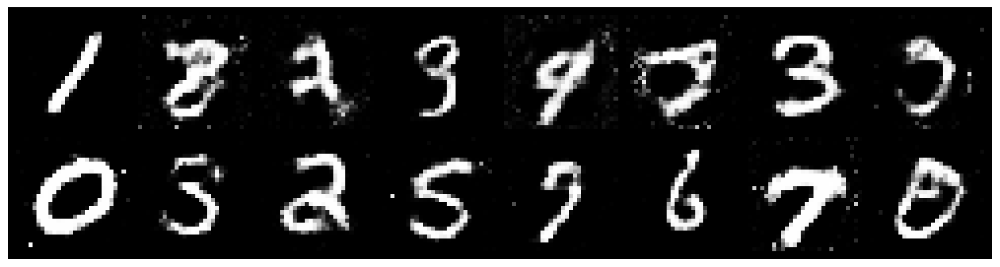

Epoch: [120/200], Batch Num: [200/600]
Discriminator Loss: 1.1837, Generator Loss: 1.0679
D(x): 0.5790, D(G(z)): 0.4076


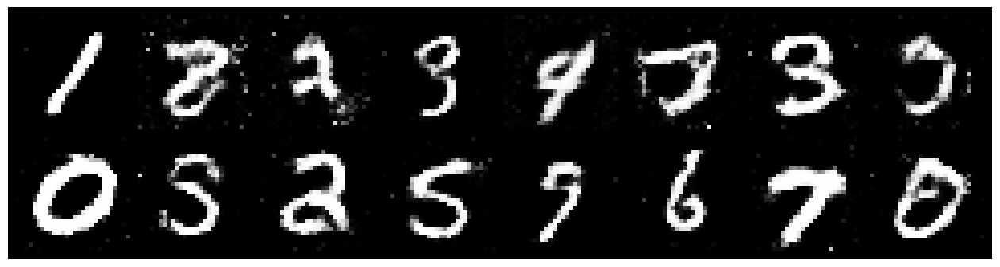

Epoch: [120/200], Batch Num: [400/600]
Discriminator Loss: 1.1130, Generator Loss: 1.1485
D(x): 0.5956, D(G(z)): 0.3760


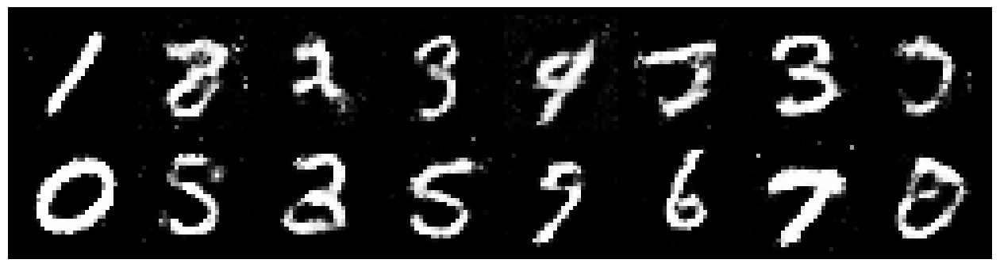

Epoch: [121/200], Batch Num: [0/600]
Discriminator Loss: 1.2919, Generator Loss: 0.8195
D(x): 0.5608, D(G(z)): 0.4600


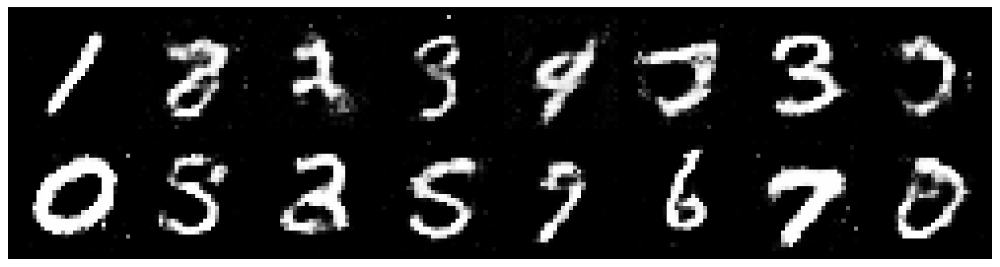

Epoch: [121/200], Batch Num: [200/600]
Discriminator Loss: 1.2248, Generator Loss: 1.1590
D(x): 0.5606, D(G(z)): 0.3952


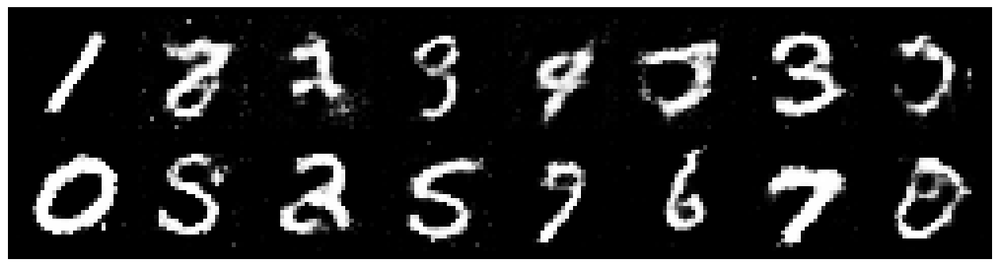

Epoch: [121/200], Batch Num: [400/600]
Discriminator Loss: 1.1230, Generator Loss: 1.0105
D(x): 0.5855, D(G(z)): 0.3928


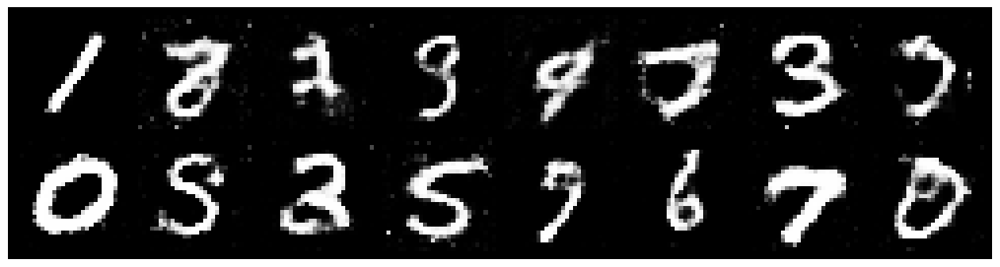

Epoch: [122/200], Batch Num: [0/600]
Discriminator Loss: 1.2201, Generator Loss: 0.9446
D(x): 0.5948, D(G(z)): 0.4345


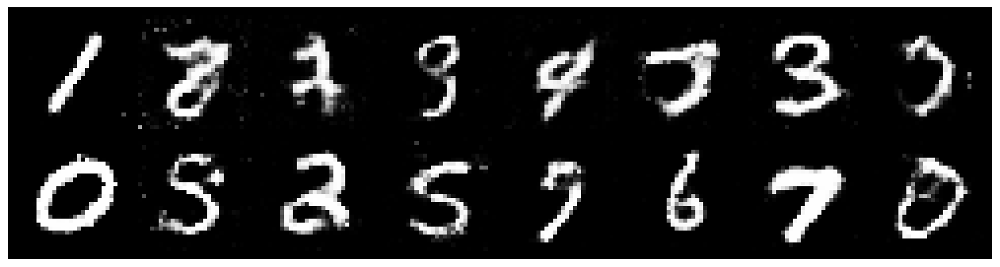

Epoch: [122/200], Batch Num: [200/600]
Discriminator Loss: 1.2143, Generator Loss: 0.9493
D(x): 0.5683, D(G(z)): 0.4187


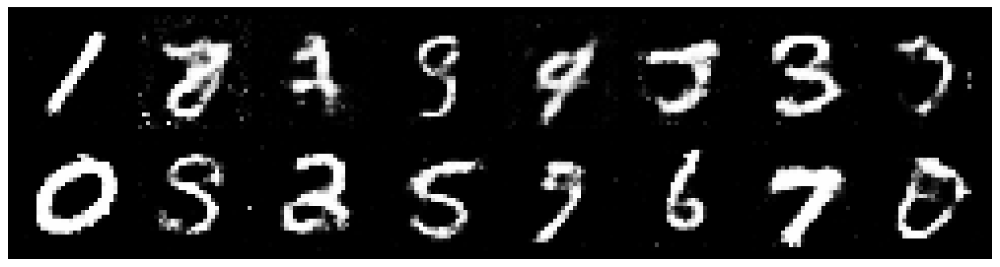

Epoch: [122/200], Batch Num: [400/600]
Discriminator Loss: 1.2643, Generator Loss: 0.9939
D(x): 0.5898, D(G(z)): 0.4657


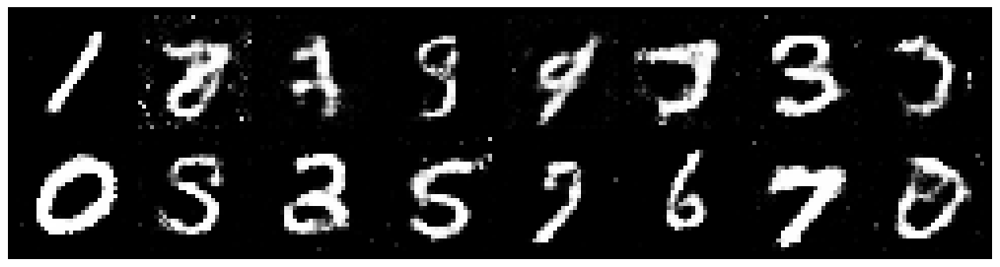

Epoch: [123/200], Batch Num: [0/600]
Discriminator Loss: 1.2596, Generator Loss: 0.8688
D(x): 0.5775, D(G(z)): 0.4551


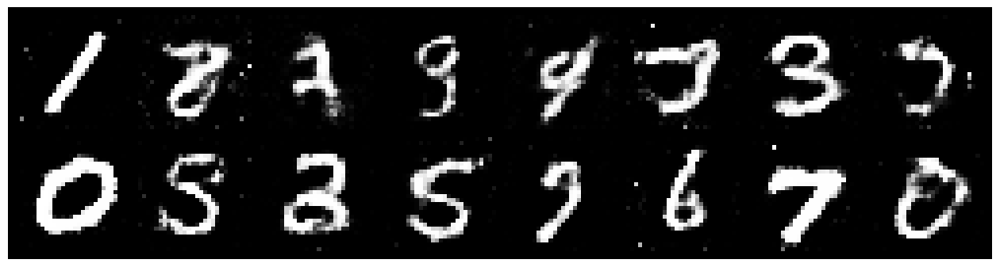

Epoch: [123/200], Batch Num: [200/600]
Discriminator Loss: 1.3802, Generator Loss: 0.9156
D(x): 0.5134, D(G(z)): 0.4395


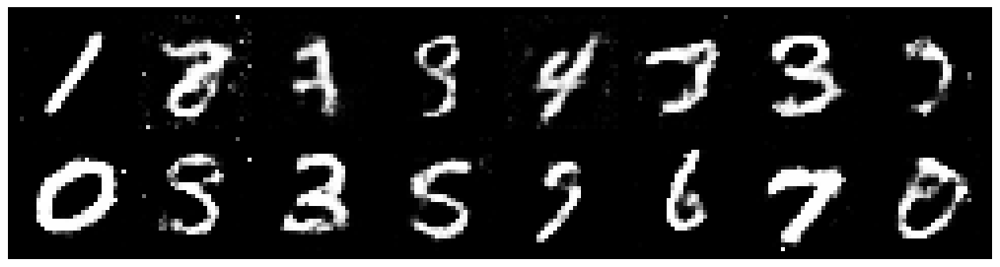

Epoch: [123/200], Batch Num: [400/600]
Discriminator Loss: 1.2248, Generator Loss: 1.0687
D(x): 0.5545, D(G(z)): 0.3886


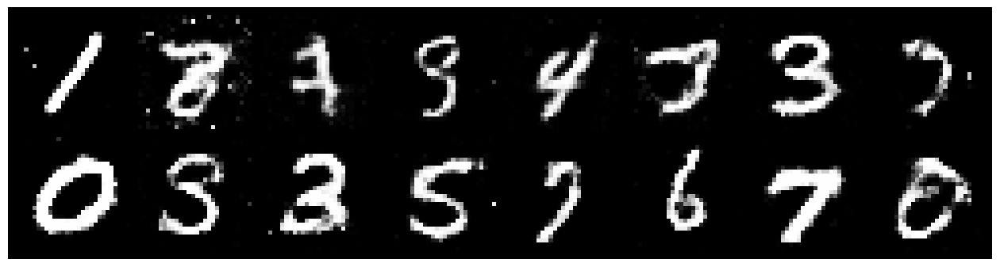

Epoch: [124/200], Batch Num: [0/600]
Discriminator Loss: 1.1565, Generator Loss: 1.0007
D(x): 0.5762, D(G(z)): 0.4050


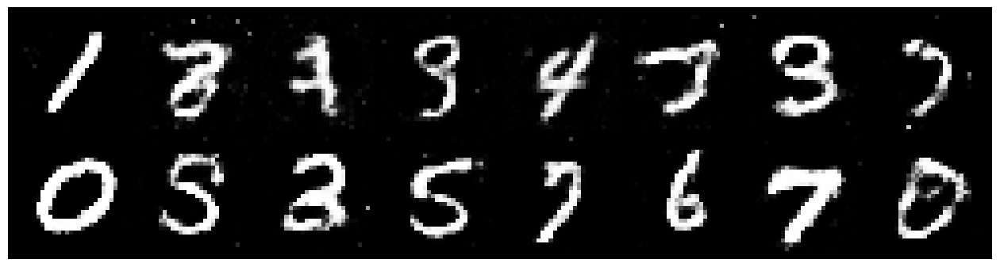

Epoch: [124/200], Batch Num: [200/600]
Discriminator Loss: 1.1763, Generator Loss: 1.0537
D(x): 0.5967, D(G(z)): 0.4355


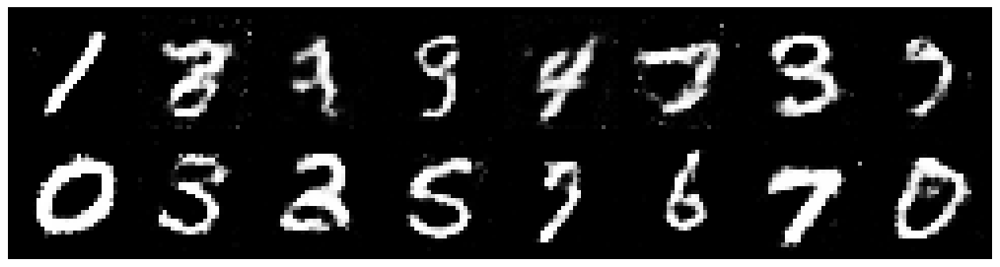

Epoch: [124/200], Batch Num: [400/600]
Discriminator Loss: 1.3059, Generator Loss: 0.8561
D(x): 0.5730, D(G(z)): 0.4627


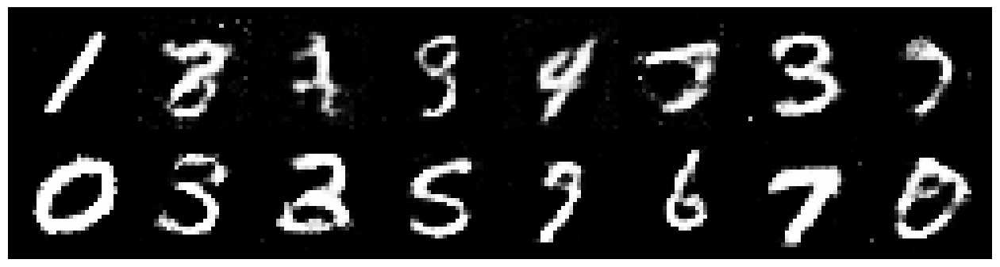

Epoch: [125/200], Batch Num: [0/600]
Discriminator Loss: 1.2282, Generator Loss: 1.0759
D(x): 0.5273, D(G(z)): 0.3798


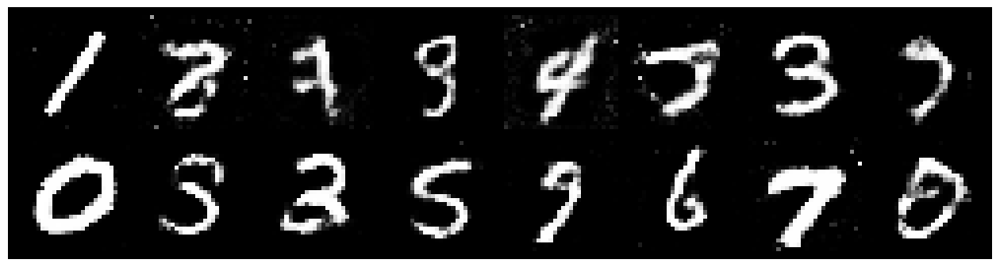

Epoch: [125/200], Batch Num: [200/600]
Discriminator Loss: 1.2069, Generator Loss: 0.8638
D(x): 0.5834, D(G(z)): 0.4371


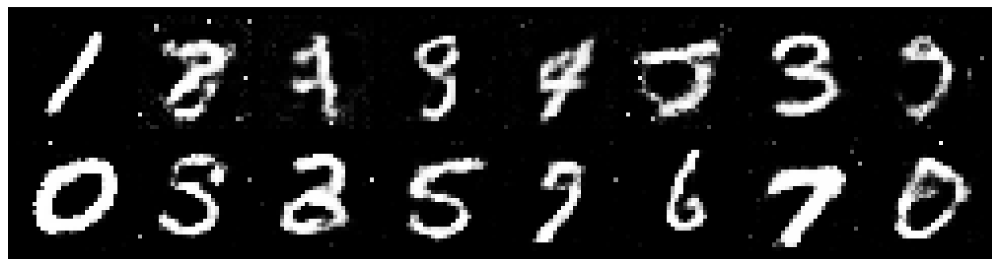

Epoch: [125/200], Batch Num: [400/600]
Discriminator Loss: 1.2892, Generator Loss: 0.9207
D(x): 0.5435, D(G(z)): 0.4348


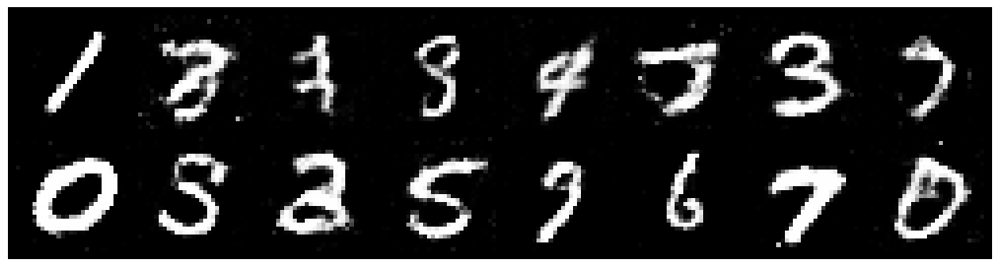

Epoch: [126/200], Batch Num: [0/600]
Discriminator Loss: 1.2731, Generator Loss: 0.9700
D(x): 0.5911, D(G(z)): 0.4557


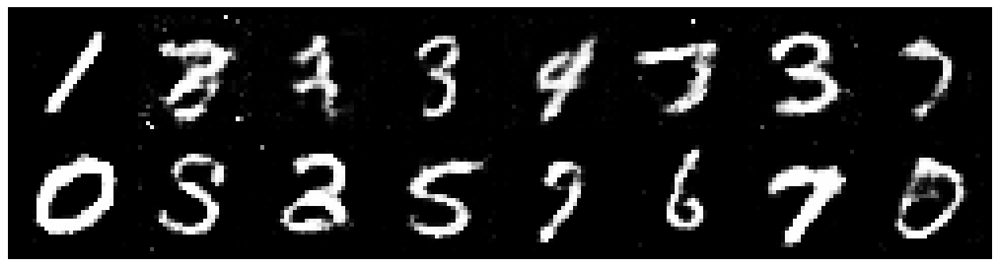

Epoch: [126/200], Batch Num: [200/600]
Discriminator Loss: 1.2346, Generator Loss: 1.0052
D(x): 0.5944, D(G(z)): 0.4358


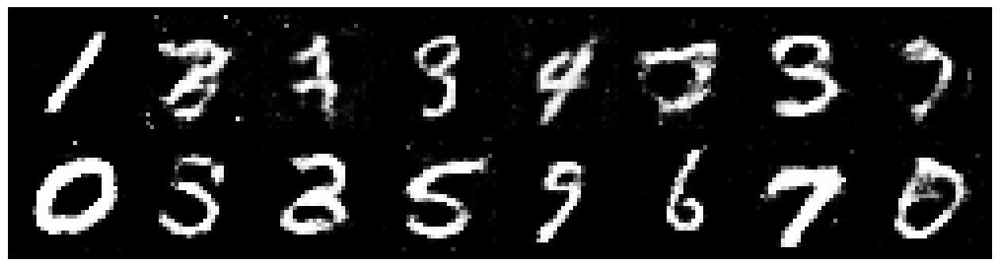

Epoch: [126/200], Batch Num: [400/600]
Discriminator Loss: 1.2624, Generator Loss: 0.9754
D(x): 0.5332, D(G(z)): 0.3986


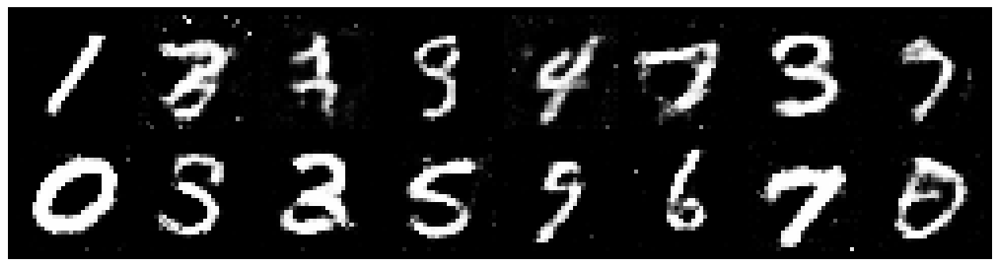

Epoch: [127/200], Batch Num: [0/600]
Discriminator Loss: 1.2810, Generator Loss: 0.9040
D(x): 0.5547, D(G(z)): 0.4237


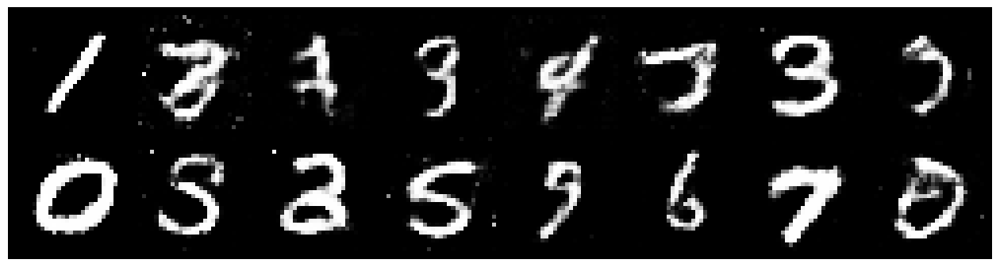

Epoch: [127/200], Batch Num: [200/600]
Discriminator Loss: 1.2097, Generator Loss: 0.9230
D(x): 0.5974, D(G(z)): 0.4498


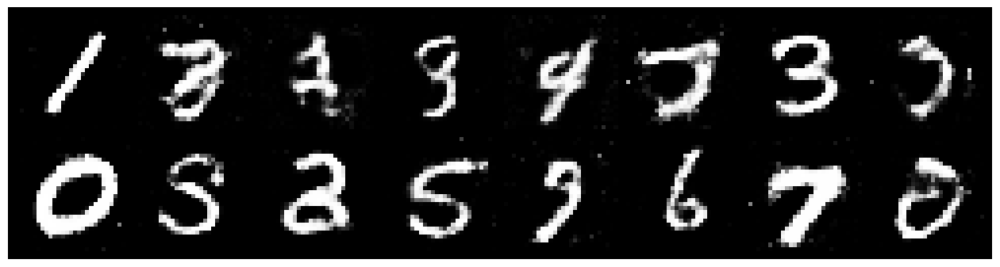

Epoch: [127/200], Batch Num: [400/600]
Discriminator Loss: 1.1510, Generator Loss: 1.0581
D(x): 0.6205, D(G(z)): 0.4159


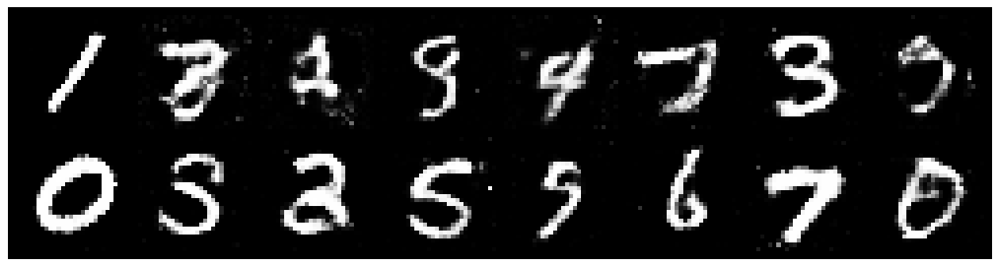

Epoch: [128/200], Batch Num: [0/600]
Discriminator Loss: 1.3249, Generator Loss: 0.9254
D(x): 0.5199, D(G(z)): 0.4227


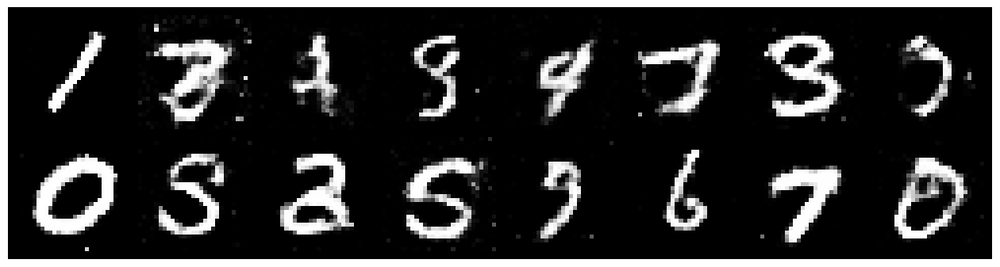

Epoch: [128/200], Batch Num: [200/600]
Discriminator Loss: 1.2286, Generator Loss: 0.9504
D(x): 0.5411, D(G(z)): 0.4002


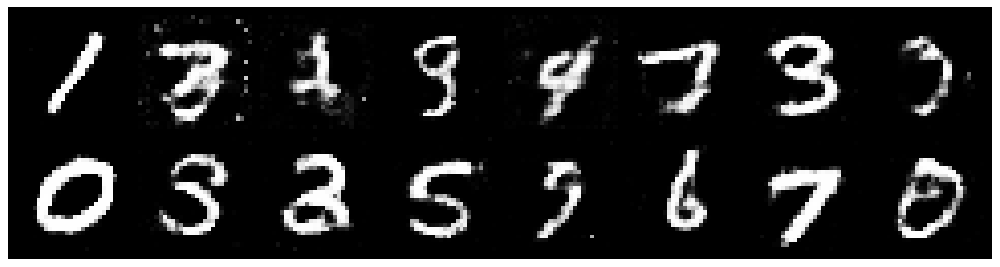

Epoch: [128/200], Batch Num: [400/600]
Discriminator Loss: 1.1446, Generator Loss: 1.0671
D(x): 0.5764, D(G(z)): 0.3881


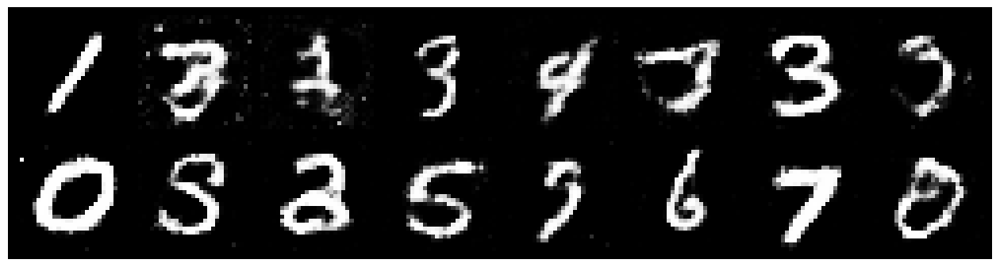

Epoch: [129/200], Batch Num: [0/600]
Discriminator Loss: 1.2264, Generator Loss: 0.9829
D(x): 0.5878, D(G(z)): 0.4500


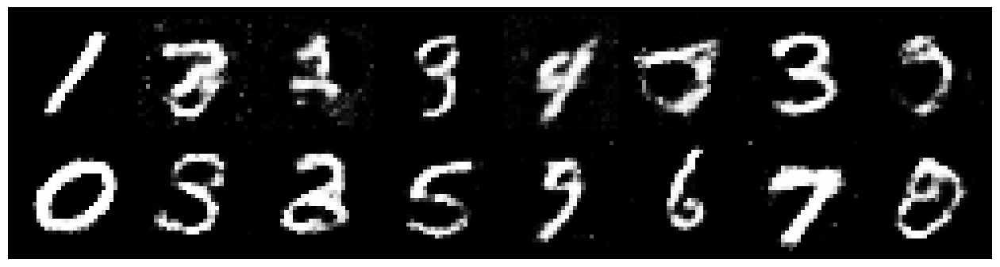

Epoch: [129/200], Batch Num: [200/600]
Discriminator Loss: 1.2650, Generator Loss: 0.9769
D(x): 0.5876, D(G(z)): 0.4615


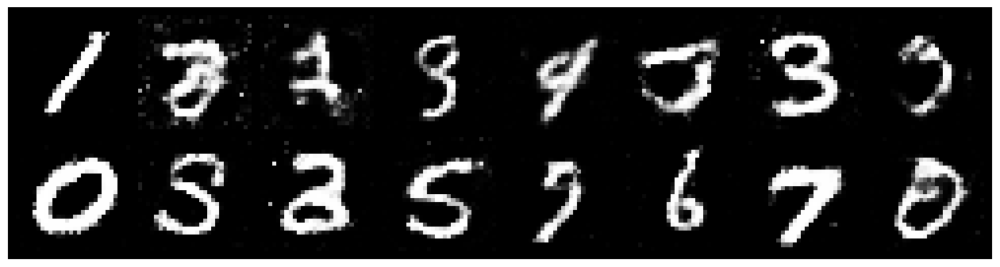

Epoch: [129/200], Batch Num: [400/600]
Discriminator Loss: 1.2244, Generator Loss: 1.0603
D(x): 0.5923, D(G(z)): 0.4272


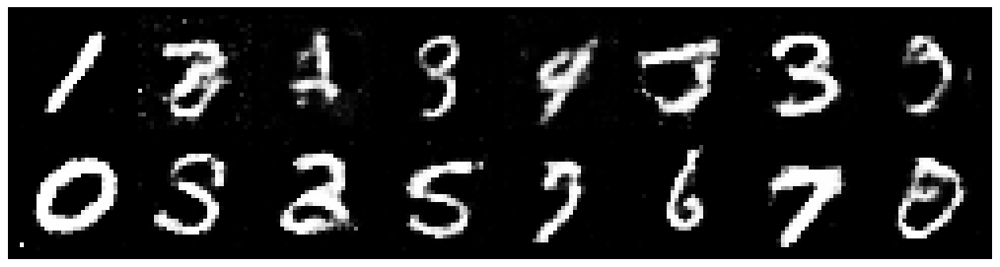

Epoch: [130/200], Batch Num: [0/600]
Discriminator Loss: 1.2229, Generator Loss: 0.9267
D(x): 0.5661, D(G(z)): 0.4099


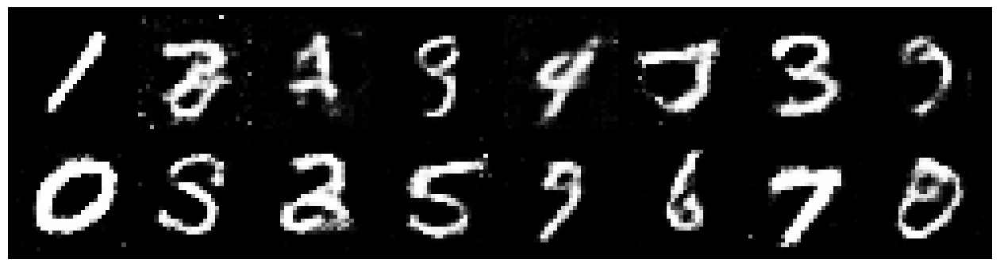

Epoch: [130/200], Batch Num: [200/600]
Discriminator Loss: 1.2865, Generator Loss: 0.9169
D(x): 0.5801, D(G(z)): 0.4303


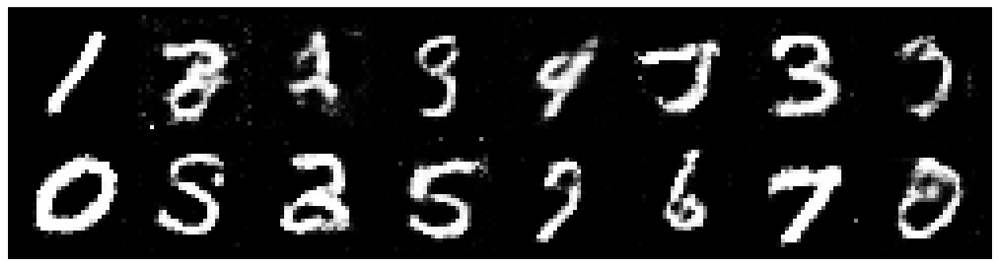

Epoch: [130/200], Batch Num: [400/600]
Discriminator Loss: 1.2474, Generator Loss: 1.0080
D(x): 0.5431, D(G(z)): 0.4031


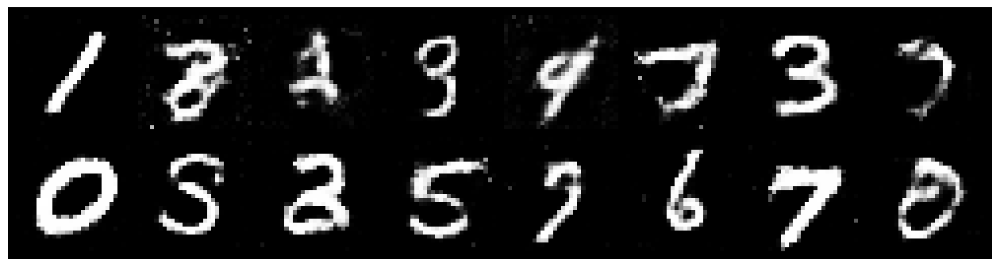

Epoch: [131/200], Batch Num: [0/600]
Discriminator Loss: 1.2160, Generator Loss: 1.0181
D(x): 0.5773, D(G(z)): 0.4027


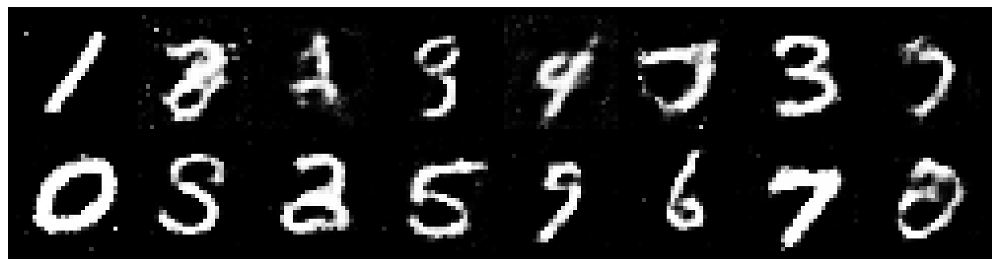

Epoch: [131/200], Batch Num: [200/600]
Discriminator Loss: 1.3023, Generator Loss: 0.9969
D(x): 0.5758, D(G(z)): 0.4499


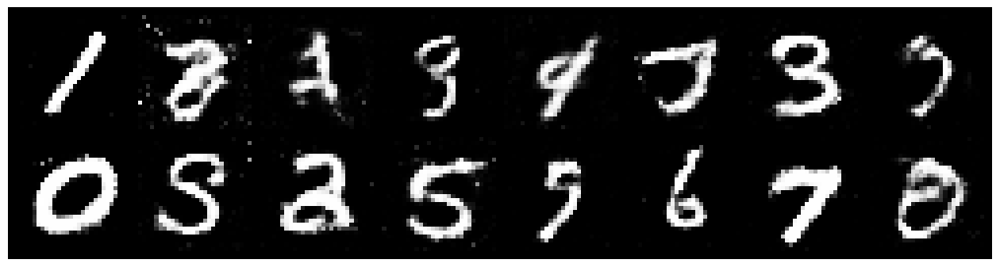

Epoch: [131/200], Batch Num: [400/600]
Discriminator Loss: 1.2040, Generator Loss: 0.9956
D(x): 0.5580, D(G(z)): 0.4001


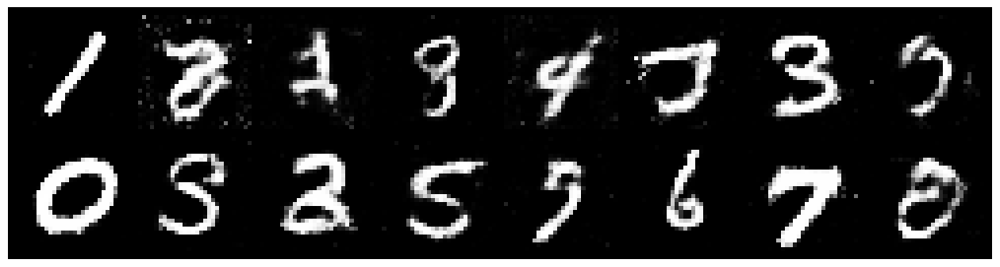

Epoch: [132/200], Batch Num: [0/600]
Discriminator Loss: 1.2195, Generator Loss: 1.0101
D(x): 0.5714, D(G(z)): 0.4100


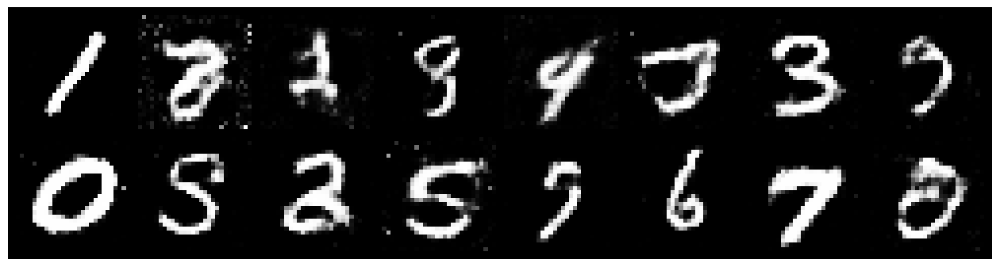

Epoch: [132/200], Batch Num: [200/600]
Discriminator Loss: 1.1461, Generator Loss: 0.9019
D(x): 0.5844, D(G(z)): 0.4076


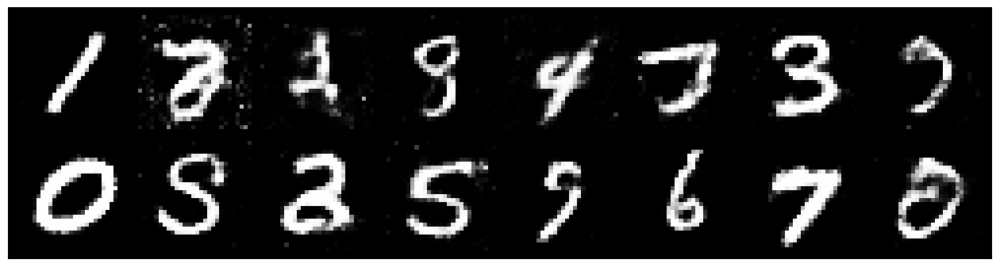

Epoch: [132/200], Batch Num: [400/600]
Discriminator Loss: 1.2622, Generator Loss: 1.0559
D(x): 0.5864, D(G(z)): 0.4337


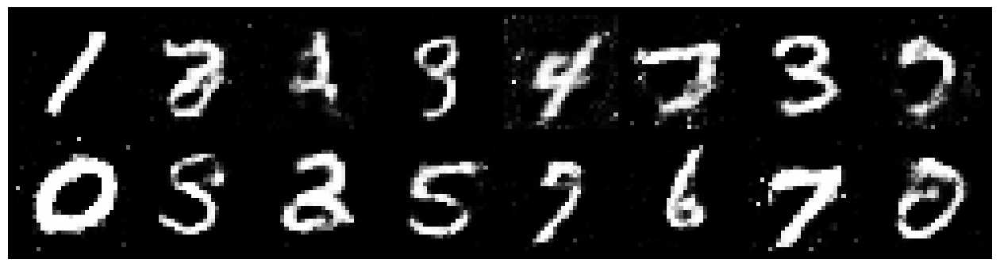

Epoch: [133/200], Batch Num: [0/600]
Discriminator Loss: 1.1677, Generator Loss: 1.0570
D(x): 0.5941, D(G(z)): 0.4243


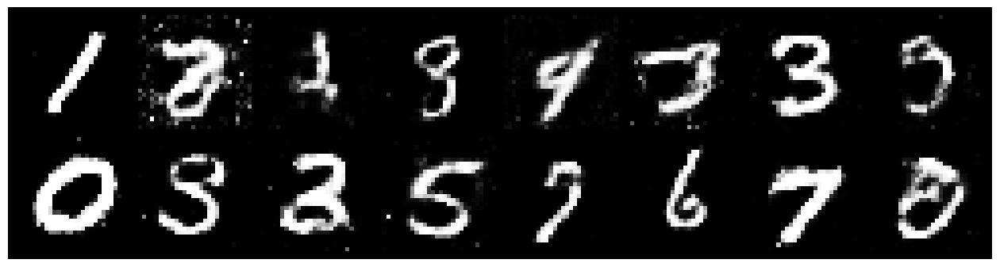

Epoch: [133/200], Batch Num: [200/600]
Discriminator Loss: 1.3119, Generator Loss: 0.9281
D(x): 0.5394, D(G(z)): 0.4415


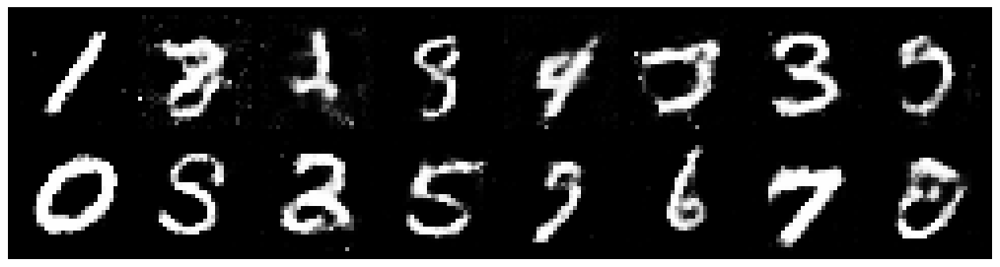

Epoch: [133/200], Batch Num: [400/600]
Discriminator Loss: 1.2596, Generator Loss: 1.0014
D(x): 0.5508, D(G(z)): 0.4178


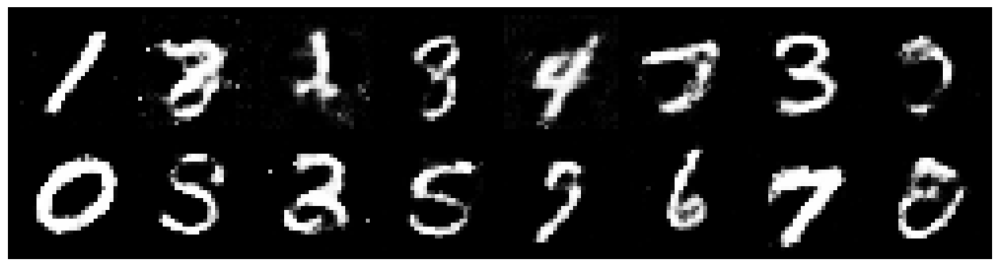

Epoch: [134/200], Batch Num: [0/600]
Discriminator Loss: 1.2501, Generator Loss: 0.9775
D(x): 0.5560, D(G(z)): 0.4325


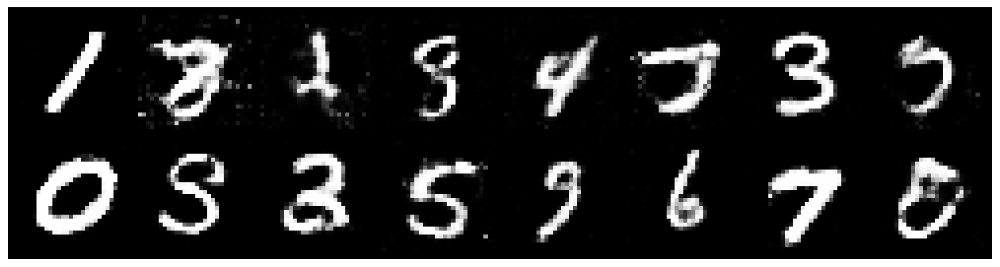

Epoch: [134/200], Batch Num: [200/600]
Discriminator Loss: 1.1348, Generator Loss: 0.9484
D(x): 0.6379, D(G(z)): 0.4249


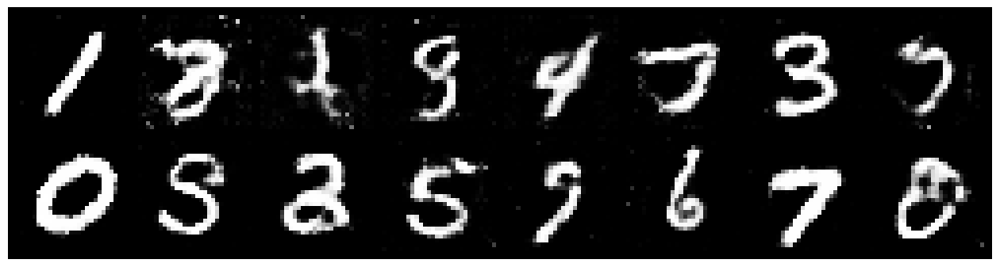

Epoch: [134/200], Batch Num: [400/600]
Discriminator Loss: 1.3422, Generator Loss: 0.8713
D(x): 0.5452, D(G(z)): 0.4611


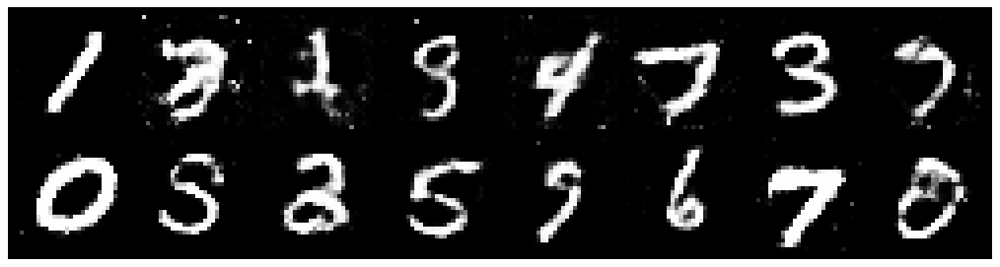

Epoch: [135/200], Batch Num: [0/600]
Discriminator Loss: 1.1926, Generator Loss: 0.9864
D(x): 0.6058, D(G(z)): 0.4363


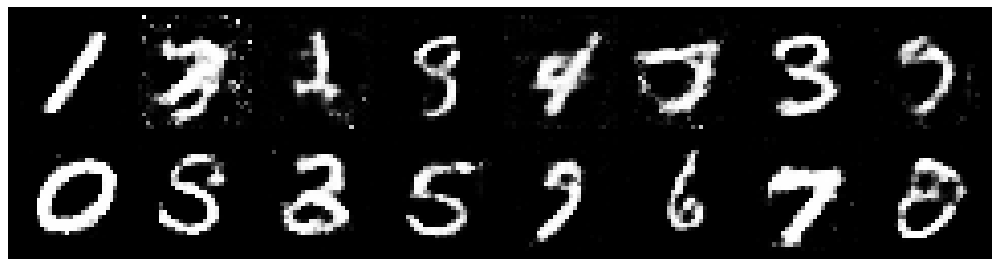

Epoch: [135/200], Batch Num: [200/600]
Discriminator Loss: 1.1880, Generator Loss: 0.9091
D(x): 0.5926, D(G(z)): 0.4218


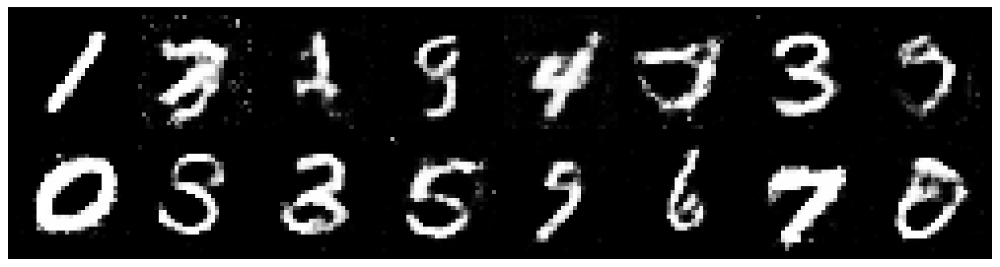

Epoch: [135/200], Batch Num: [400/600]
Discriminator Loss: 1.1848, Generator Loss: 0.9704
D(x): 0.5831, D(G(z)): 0.4162


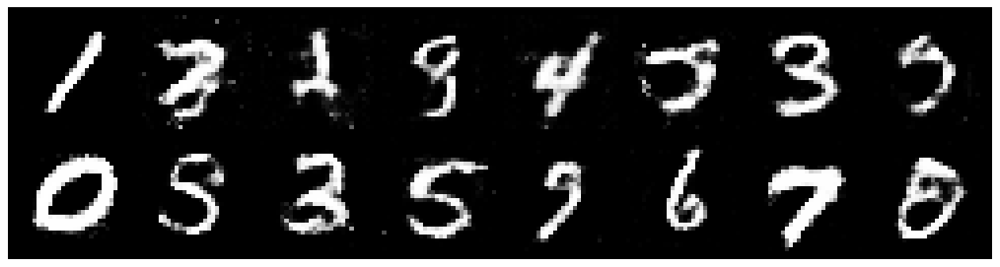

Epoch: [136/200], Batch Num: [0/600]
Discriminator Loss: 1.2478, Generator Loss: 0.9823
D(x): 0.5674, D(G(z)): 0.4174


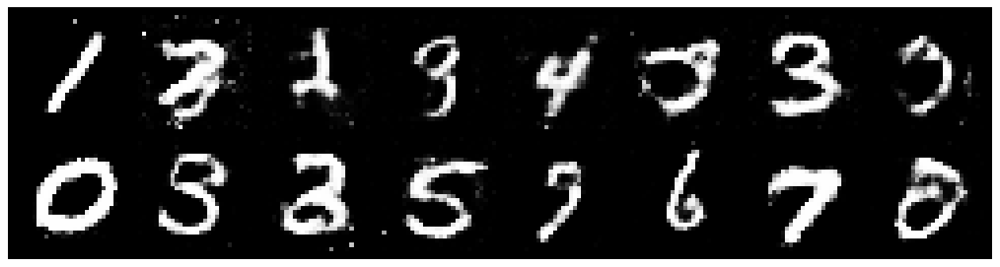

Epoch: [136/200], Batch Num: [200/600]
Discriminator Loss: 1.2372, Generator Loss: 0.8120
D(x): 0.5893, D(G(z)): 0.4601


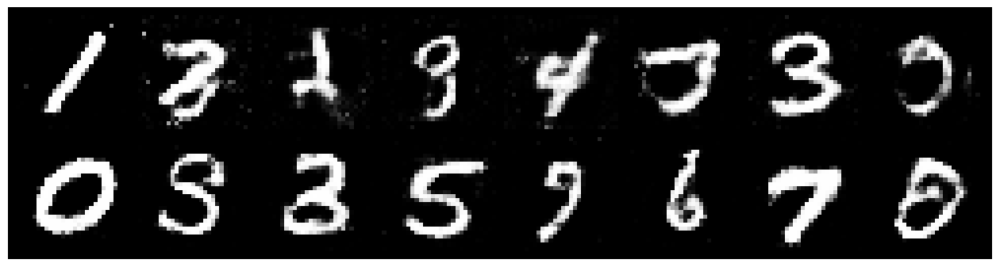

Epoch: [136/200], Batch Num: [400/600]
Discriminator Loss: 1.1760, Generator Loss: 0.9990
D(x): 0.5662, D(G(z)): 0.4036


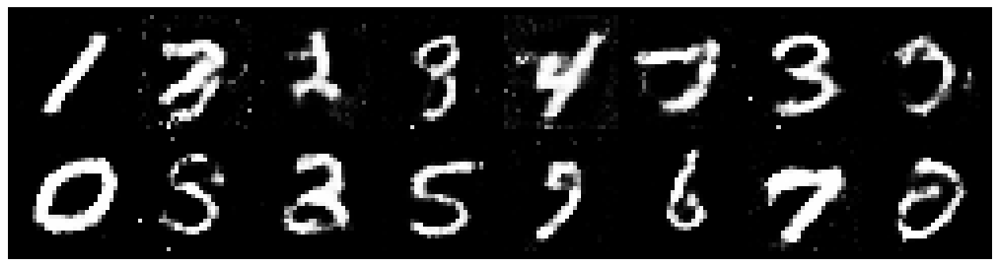

Epoch: [137/200], Batch Num: [0/600]
Discriminator Loss: 1.2544, Generator Loss: 0.9678
D(x): 0.5855, D(G(z)): 0.4368


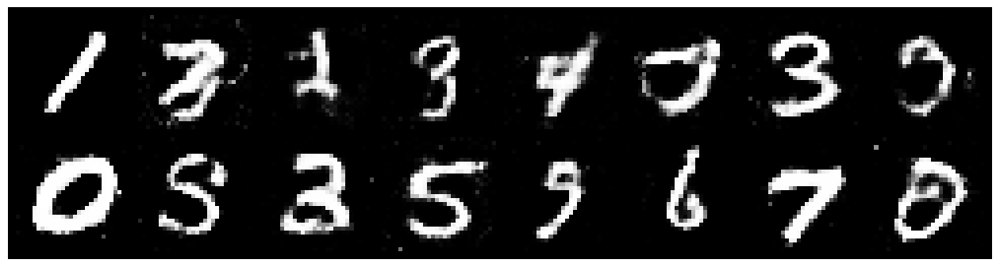

Epoch: [137/200], Batch Num: [200/600]
Discriminator Loss: 1.2154, Generator Loss: 0.9032
D(x): 0.6003, D(G(z)): 0.4431


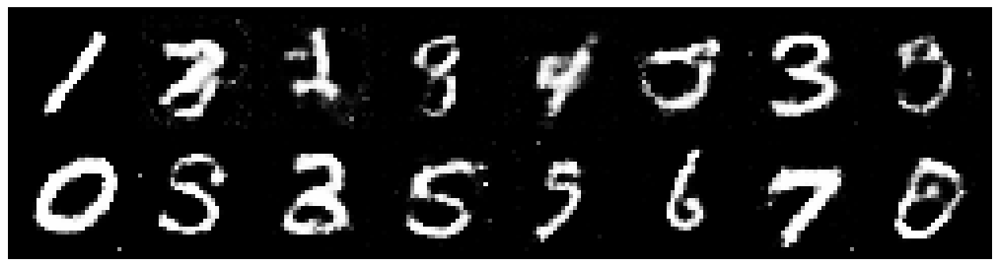

Epoch: [137/200], Batch Num: [400/600]
Discriminator Loss: 1.2968, Generator Loss: 0.9215
D(x): 0.5240, D(G(z)): 0.4145


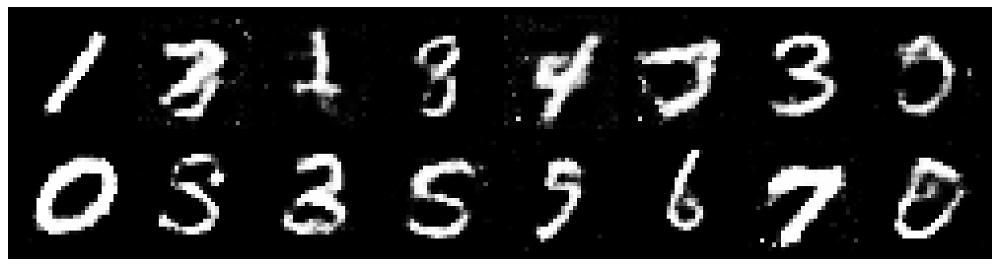

Epoch: [138/200], Batch Num: [0/600]
Discriminator Loss: 1.3079, Generator Loss: 0.8557
D(x): 0.5169, D(G(z)): 0.4143


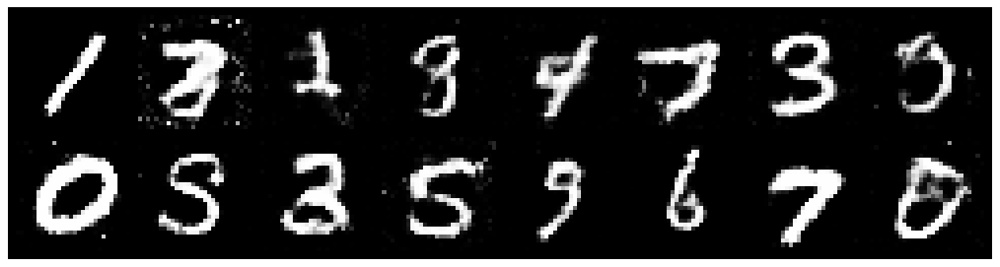

Epoch: [138/200], Batch Num: [200/600]
Discriminator Loss: 1.2420, Generator Loss: 0.8994
D(x): 0.5615, D(G(z)): 0.4198


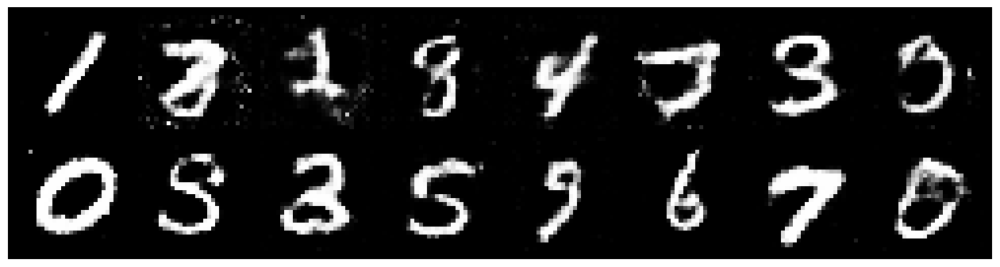

Epoch: [138/200], Batch Num: [400/600]
Discriminator Loss: 1.1365, Generator Loss: 0.9578
D(x): 0.6116, D(G(z)): 0.4331


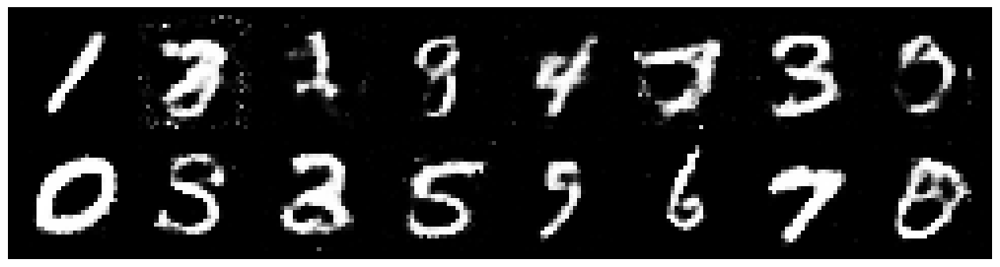

Epoch: [139/200], Batch Num: [0/600]
Discriminator Loss: 1.2289, Generator Loss: 0.9054
D(x): 0.5965, D(G(z)): 0.4603


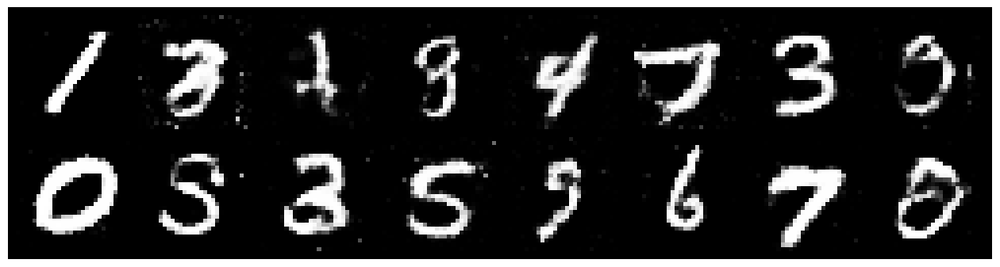

Epoch: [139/200], Batch Num: [200/600]
Discriminator Loss: 1.1558, Generator Loss: 1.0004
D(x): 0.5693, D(G(z)): 0.4012


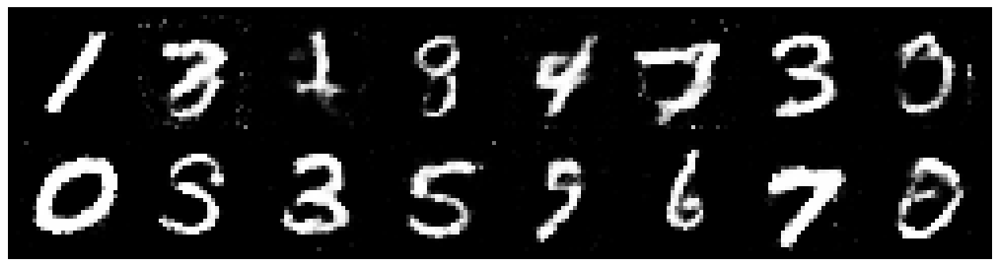

Epoch: [139/200], Batch Num: [400/600]
Discriminator Loss: 1.2792, Generator Loss: 0.9832
D(x): 0.5631, D(G(z)): 0.4435


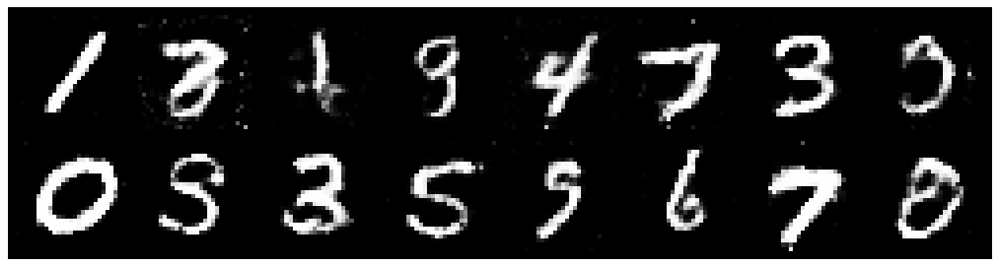

Epoch: [140/200], Batch Num: [0/600]
Discriminator Loss: 1.2040, Generator Loss: 0.8053
D(x): 0.5971, D(G(z)): 0.4476


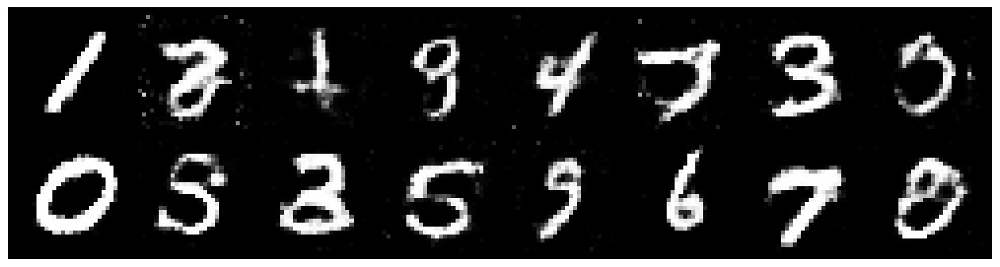

Epoch: [140/200], Batch Num: [200/600]
Discriminator Loss: 1.1661, Generator Loss: 0.9093
D(x): 0.5929, D(G(z)): 0.4274


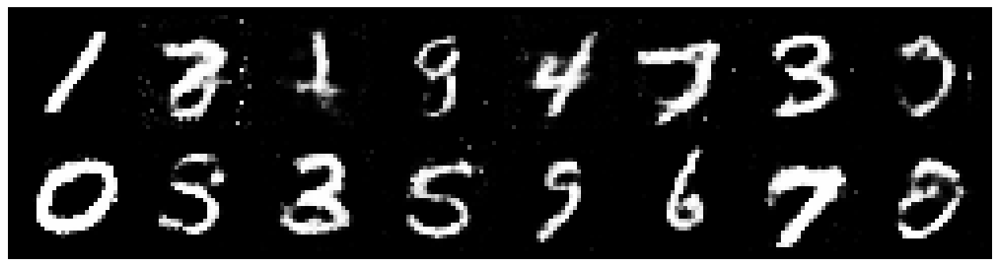

Epoch: [140/200], Batch Num: [400/600]
Discriminator Loss: 1.3242, Generator Loss: 1.0134
D(x): 0.5236, D(G(z)): 0.4242


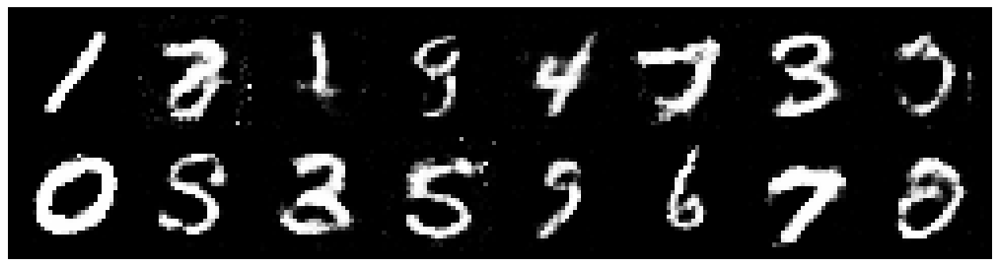

Epoch: [141/200], Batch Num: [0/600]
Discriminator Loss: 1.2248, Generator Loss: 0.9318
D(x): 0.5533, D(G(z)): 0.4258


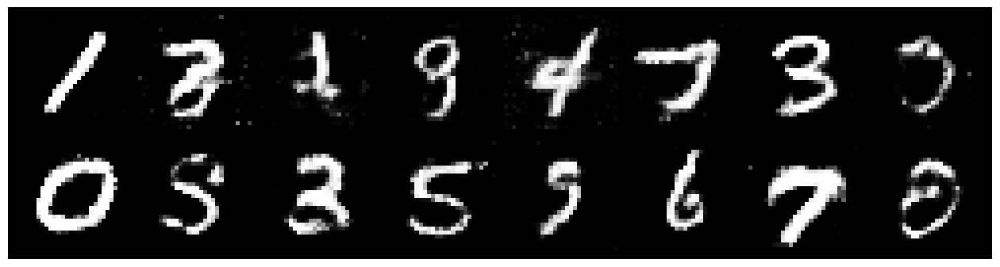

Epoch: [141/200], Batch Num: [200/600]
Discriminator Loss: 1.1491, Generator Loss: 1.0389
D(x): 0.5735, D(G(z)): 0.3865


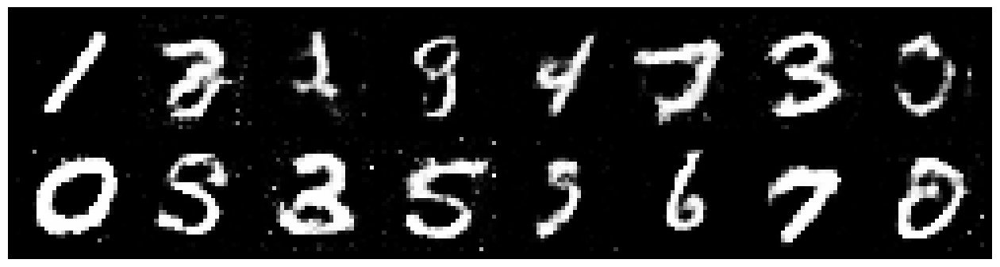

Epoch: [141/200], Batch Num: [400/600]
Discriminator Loss: 1.1351, Generator Loss: 0.8089
D(x): 0.6012, D(G(z)): 0.4232


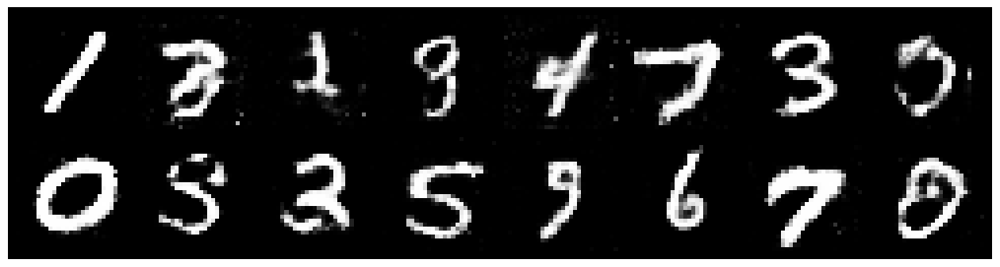

Epoch: [142/200], Batch Num: [0/600]
Discriminator Loss: 1.3684, Generator Loss: 0.9665
D(x): 0.5361, D(G(z)): 0.4474


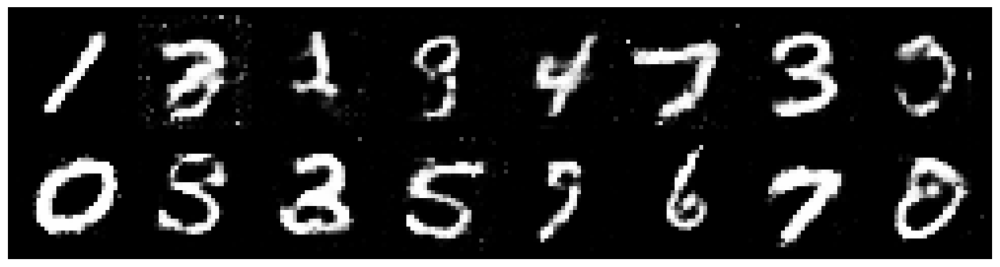

Epoch: [142/200], Batch Num: [200/600]
Discriminator Loss: 1.2192, Generator Loss: 1.0575
D(x): 0.5645, D(G(z)): 0.4068


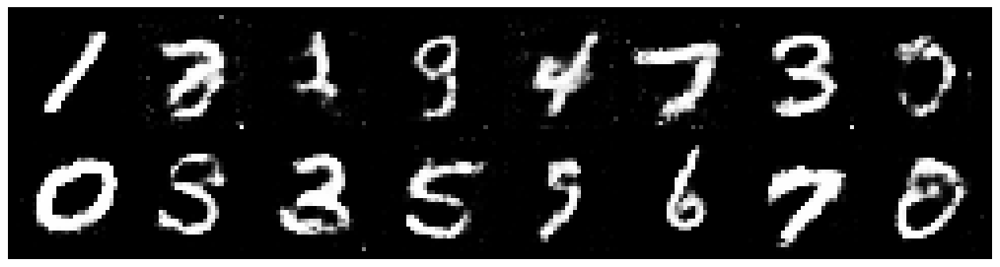

Epoch: [142/200], Batch Num: [400/600]
Discriminator Loss: 1.2194, Generator Loss: 0.9720
D(x): 0.5694, D(G(z)): 0.4338


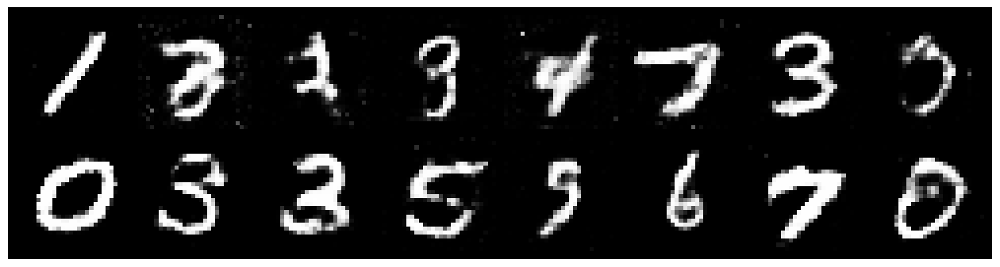

Epoch: [143/200], Batch Num: [0/600]
Discriminator Loss: 1.2956, Generator Loss: 0.8686
D(x): 0.5883, D(G(z)): 0.4684


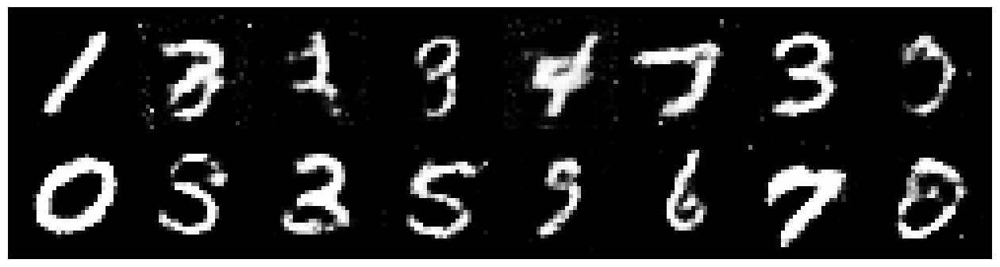

Epoch: [143/200], Batch Num: [200/600]
Discriminator Loss: 1.1643, Generator Loss: 0.9162
D(x): 0.5547, D(G(z)): 0.3998


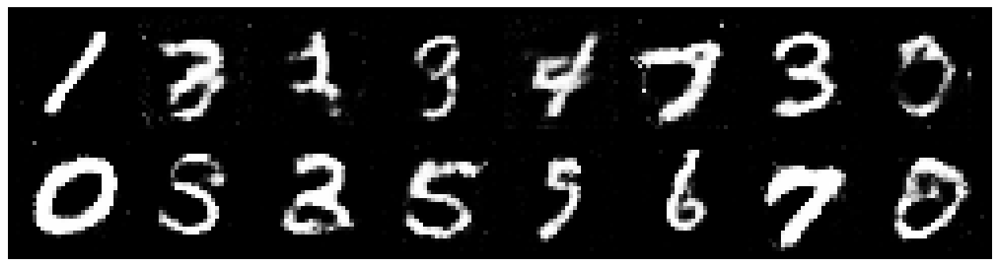

Epoch: [143/200], Batch Num: [400/600]
Discriminator Loss: 1.3565, Generator Loss: 1.0103
D(x): 0.5743, D(G(z)): 0.4623


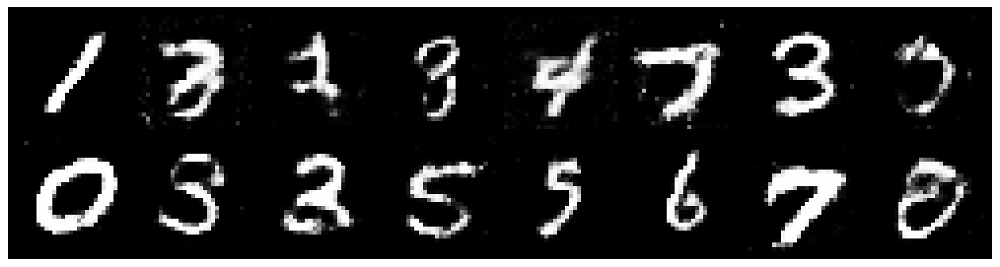

Epoch: [144/200], Batch Num: [0/600]
Discriminator Loss: 1.2143, Generator Loss: 0.9293
D(x): 0.5611, D(G(z)): 0.4333


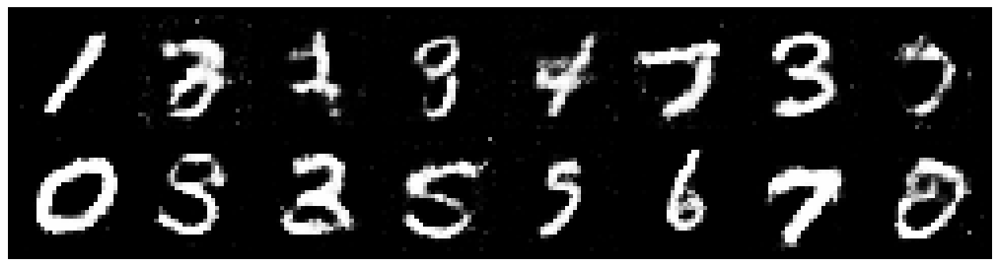

Epoch: [144/200], Batch Num: [200/600]
Discriminator Loss: 1.1473, Generator Loss: 1.0405
D(x): 0.5805, D(G(z)): 0.3907


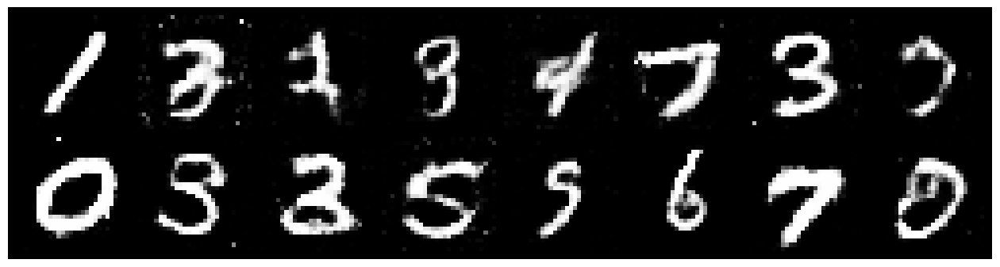

Epoch: [144/200], Batch Num: [400/600]
Discriminator Loss: 1.1943, Generator Loss: 0.9054
D(x): 0.6166, D(G(z)): 0.4607


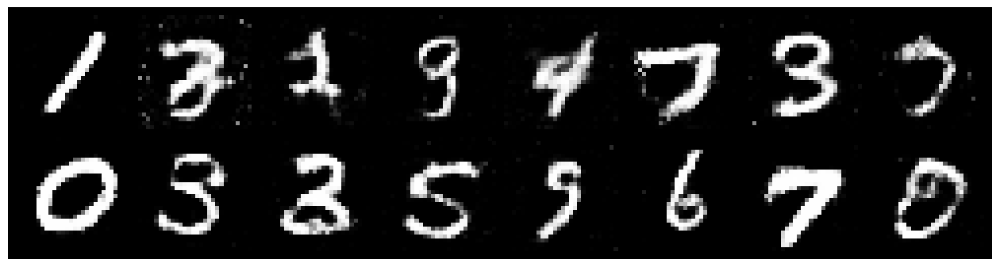

Epoch: [145/200], Batch Num: [0/600]
Discriminator Loss: 1.1101, Generator Loss: 1.0410
D(x): 0.5848, D(G(z)): 0.3875


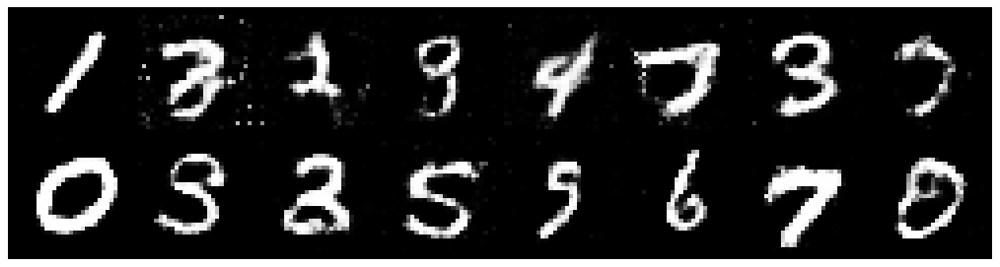

Epoch: [145/200], Batch Num: [200/600]
Discriminator Loss: 1.1996, Generator Loss: 0.9871
D(x): 0.5943, D(G(z)): 0.4273


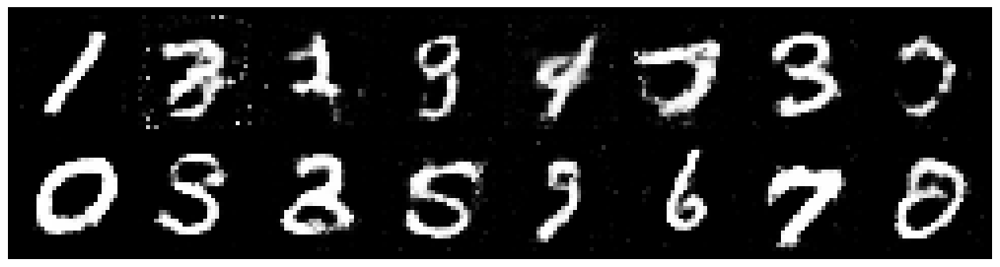

Epoch: [145/200], Batch Num: [400/600]
Discriminator Loss: 1.2562, Generator Loss: 0.8503
D(x): 0.5959, D(G(z)): 0.4674


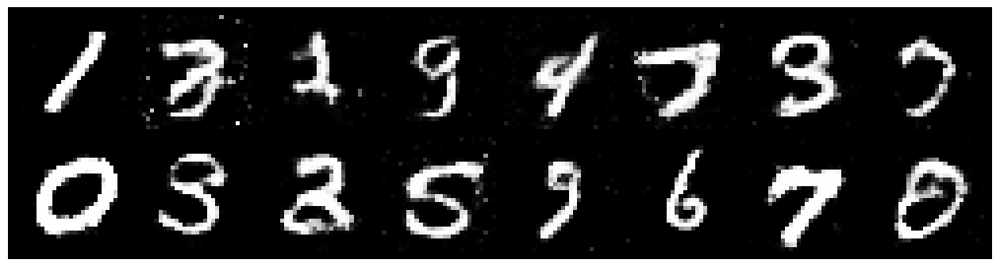

Epoch: [146/200], Batch Num: [0/600]
Discriminator Loss: 1.2809, Generator Loss: 0.9717
D(x): 0.5702, D(G(z)): 0.4643


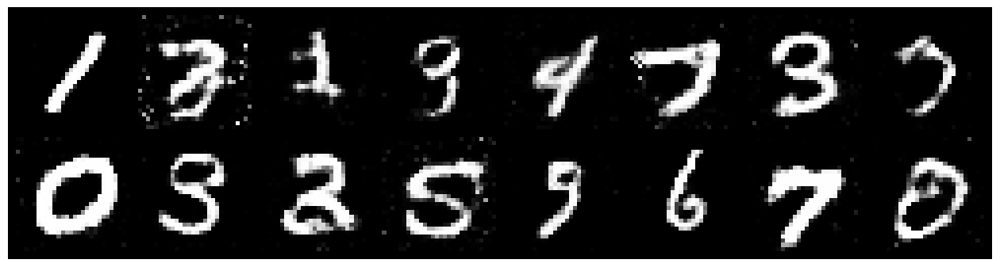

Epoch: [146/200], Batch Num: [200/600]
Discriminator Loss: 1.2564, Generator Loss: 0.9482
D(x): 0.5092, D(G(z)): 0.3928


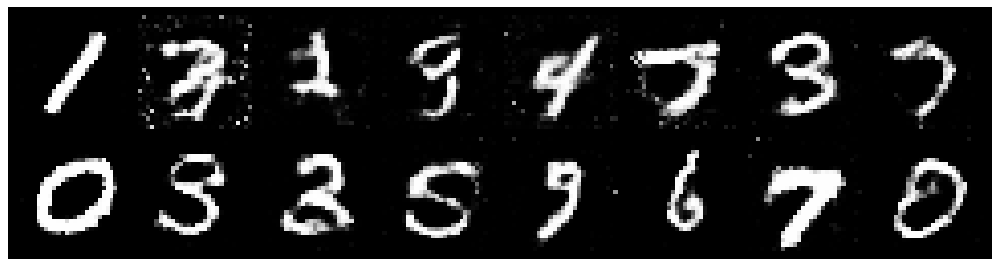

Epoch: [146/200], Batch Num: [400/600]
Discriminator Loss: 1.2950, Generator Loss: 1.0001
D(x): 0.5767, D(G(z)): 0.4523


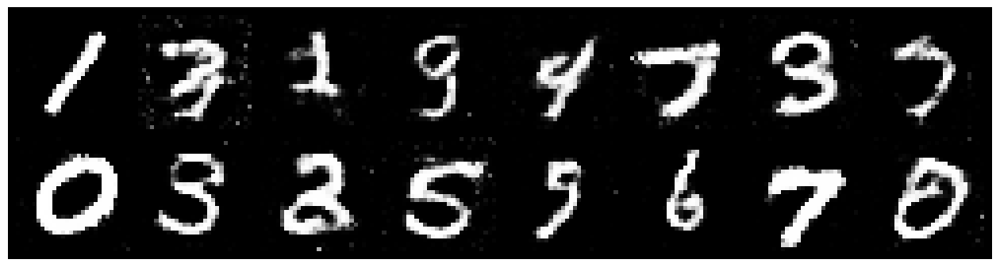

Epoch: [147/200], Batch Num: [0/600]
Discriminator Loss: 1.2138, Generator Loss: 1.0931
D(x): 0.5262, D(G(z)): 0.3831


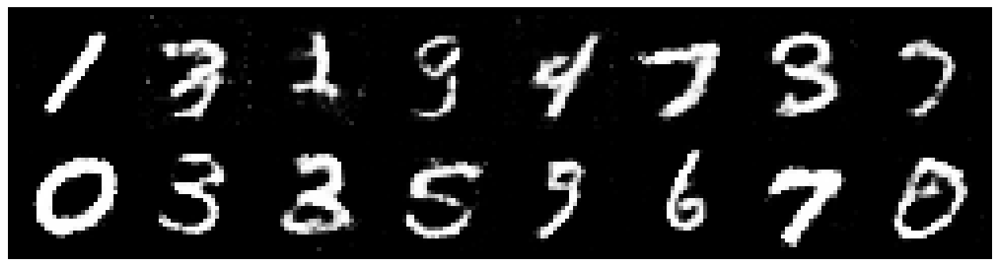

Epoch: [147/200], Batch Num: [200/600]
Discriminator Loss: 1.3431, Generator Loss: 0.8365
D(x): 0.5457, D(G(z)): 0.4560


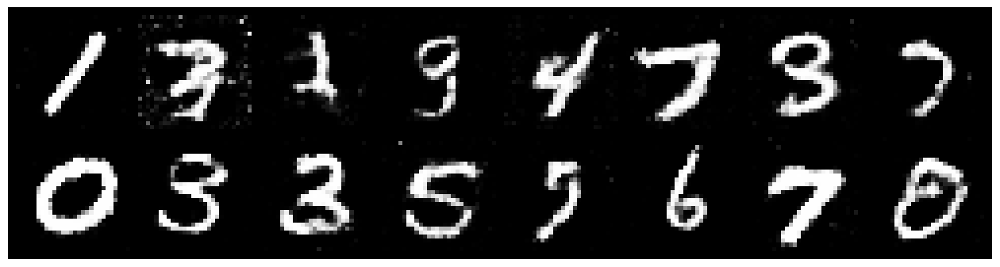

Epoch: [147/200], Batch Num: [400/600]
Discriminator Loss: 1.1633, Generator Loss: 1.2678
D(x): 0.5534, D(G(z)): 0.3676


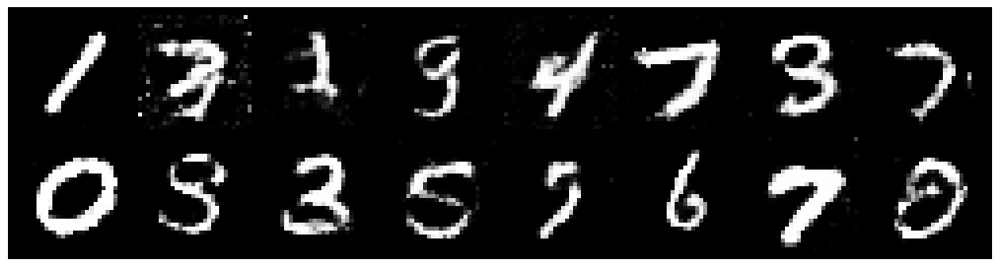

Epoch: [148/200], Batch Num: [0/600]
Discriminator Loss: 1.1964, Generator Loss: 0.9866
D(x): 0.5494, D(G(z)): 0.4018


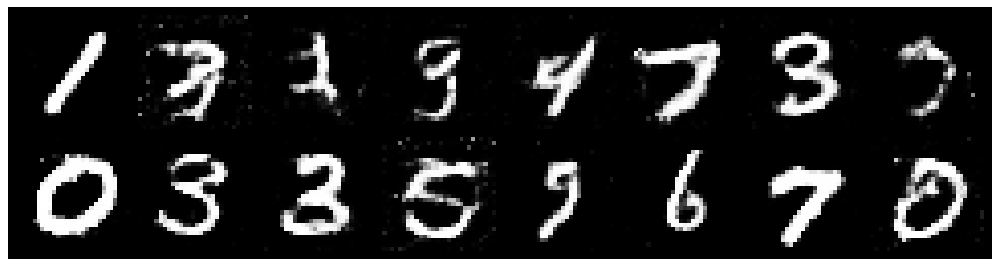

Epoch: [148/200], Batch Num: [200/600]
Discriminator Loss: 1.1948, Generator Loss: 1.0235
D(x): 0.5827, D(G(z)): 0.4133


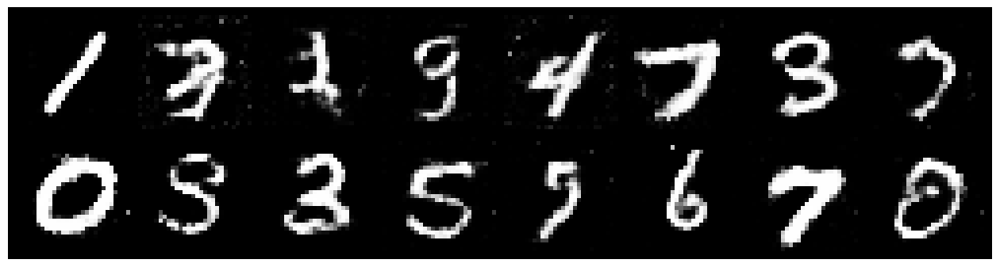

Epoch: [148/200], Batch Num: [400/600]
Discriminator Loss: 1.3913, Generator Loss: 0.9334
D(x): 0.5412, D(G(z)): 0.4727


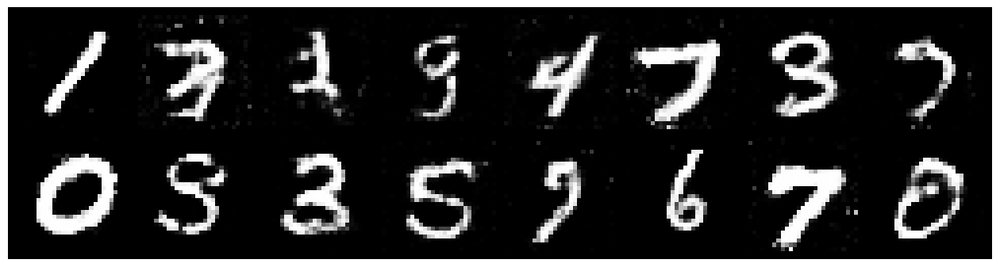

Epoch: [149/200], Batch Num: [0/600]
Discriminator Loss: 1.2828, Generator Loss: 0.9545
D(x): 0.5764, D(G(z)): 0.4344


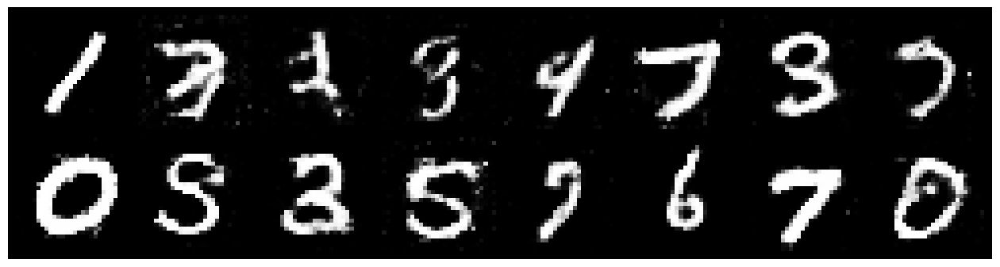

Epoch: [149/200], Batch Num: [200/600]
Discriminator Loss: 1.2306, Generator Loss: 0.9999
D(x): 0.5671, D(G(z)): 0.4381


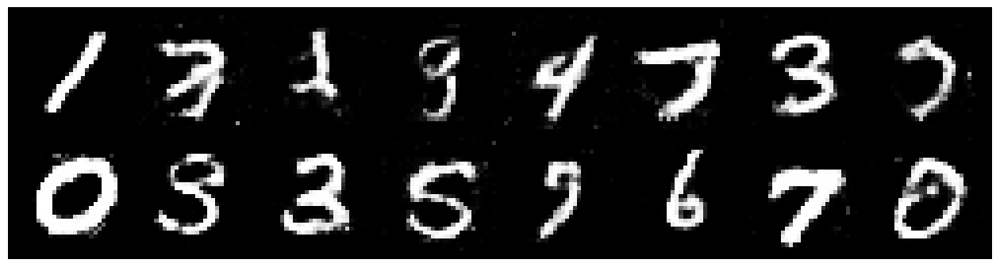

Epoch: [149/200], Batch Num: [400/600]
Discriminator Loss: 1.3788, Generator Loss: 0.9350
D(x): 0.5679, D(G(z)): 0.4916


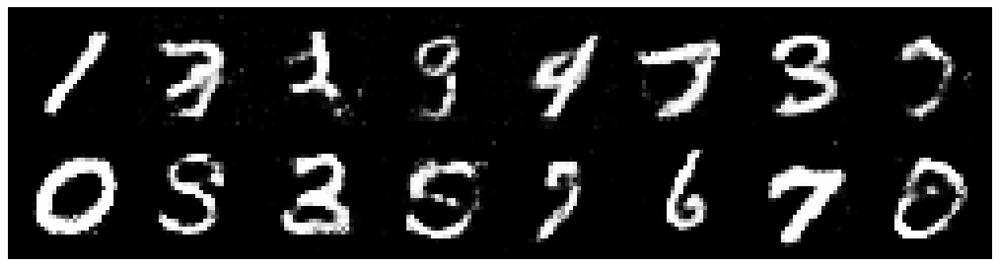

Epoch: [150/200], Batch Num: [0/600]
Discriminator Loss: 1.2674, Generator Loss: 0.8060
D(x): 0.6022, D(G(z)): 0.4695


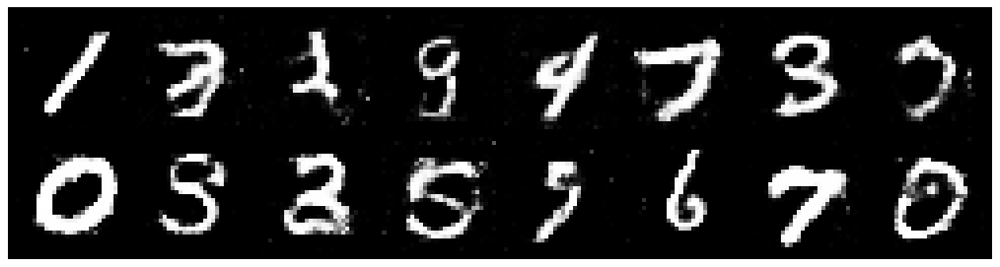

Epoch: [150/200], Batch Num: [200/600]
Discriminator Loss: 1.2252, Generator Loss: 0.9962
D(x): 0.5446, D(G(z)): 0.3965


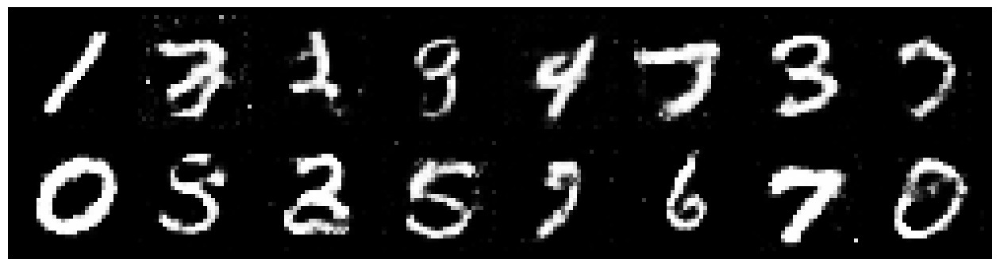

Epoch: [150/200], Batch Num: [400/600]
Discriminator Loss: 1.2303, Generator Loss: 0.9112
D(x): 0.5864, D(G(z)): 0.4406


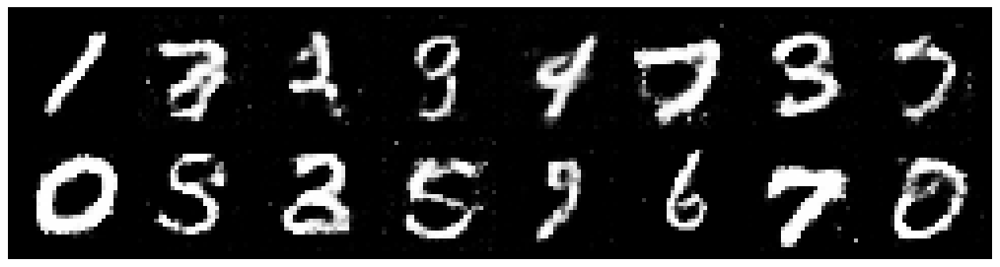

Epoch: [151/200], Batch Num: [0/600]
Discriminator Loss: 1.2291, Generator Loss: 0.8247
D(x): 0.5718, D(G(z)): 0.4553


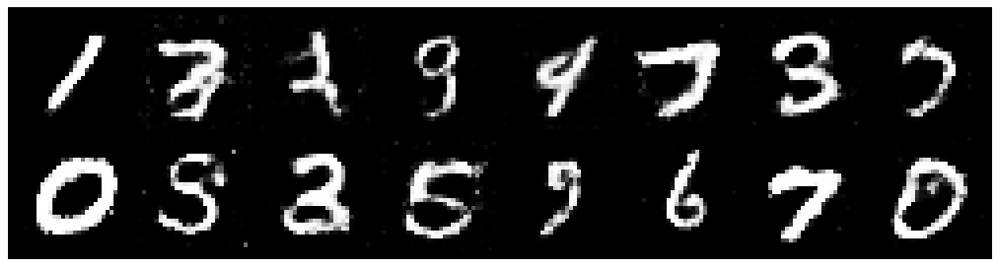

Epoch: [151/200], Batch Num: [200/600]
Discriminator Loss: 1.3151, Generator Loss: 0.7631
D(x): 0.6029, D(G(z)): 0.4906


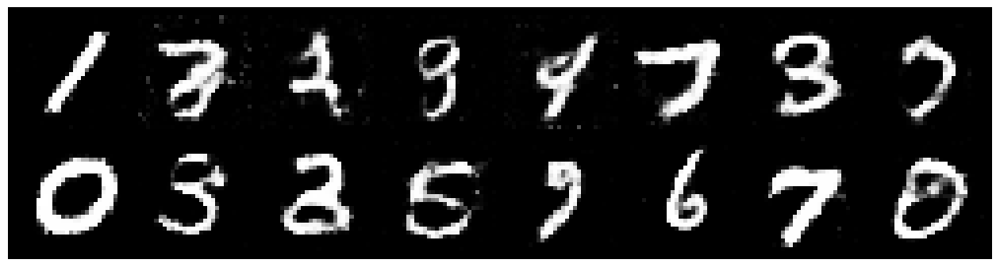

Epoch: [151/200], Batch Num: [400/600]
Discriminator Loss: 1.2812, Generator Loss: 0.9671
D(x): 0.6179, D(G(z)): 0.4962


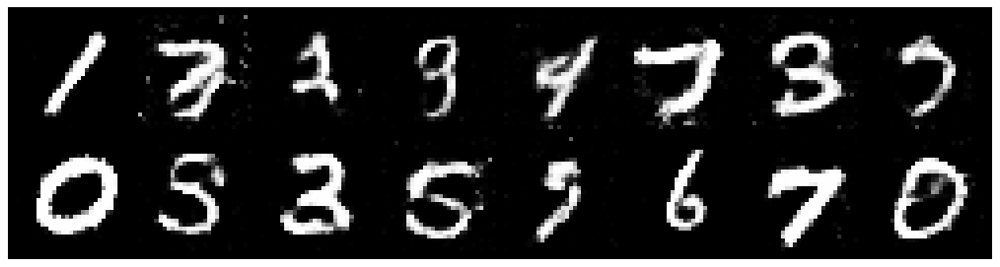

Epoch: [152/200], Batch Num: [0/600]
Discriminator Loss: 1.2431, Generator Loss: 0.8234
D(x): 0.5940, D(G(z)): 0.4664


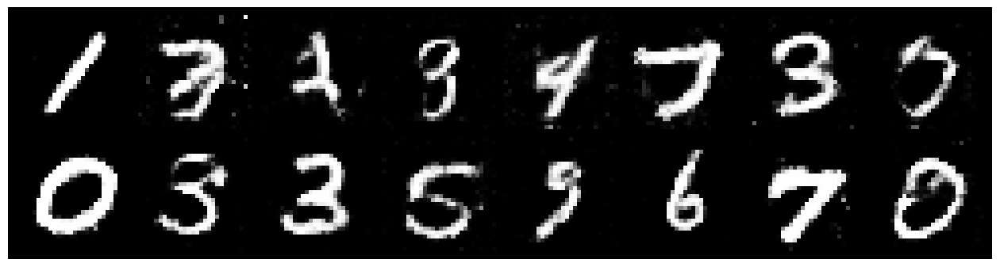

Epoch: [152/200], Batch Num: [200/600]
Discriminator Loss: 1.2176, Generator Loss: 0.8017
D(x): 0.6540, D(G(z)): 0.4890


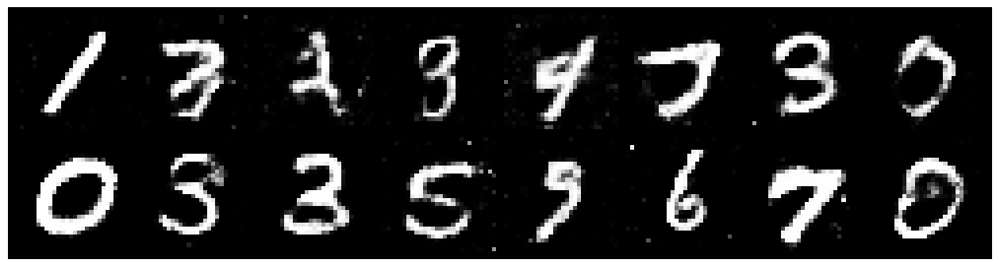

Epoch: [152/200], Batch Num: [400/600]
Discriminator Loss: 1.2627, Generator Loss: 0.9720
D(x): 0.5289, D(G(z)): 0.4253


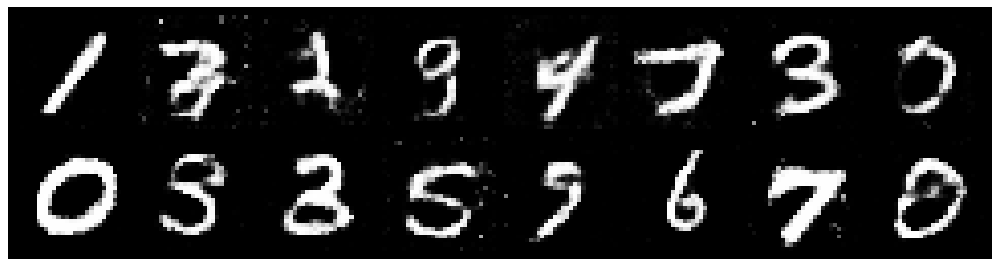

Epoch: [153/200], Batch Num: [0/600]
Discriminator Loss: 1.1898, Generator Loss: 0.9087
D(x): 0.6069, D(G(z)): 0.4447


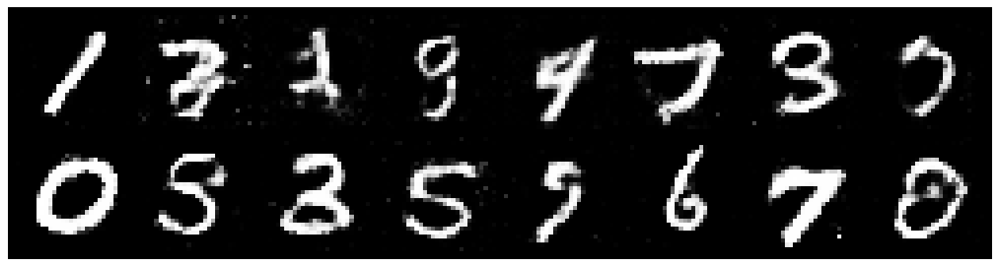

Epoch: [153/200], Batch Num: [200/600]
Discriminator Loss: 1.2314, Generator Loss: 0.9229
D(x): 0.5842, D(G(z)): 0.4408


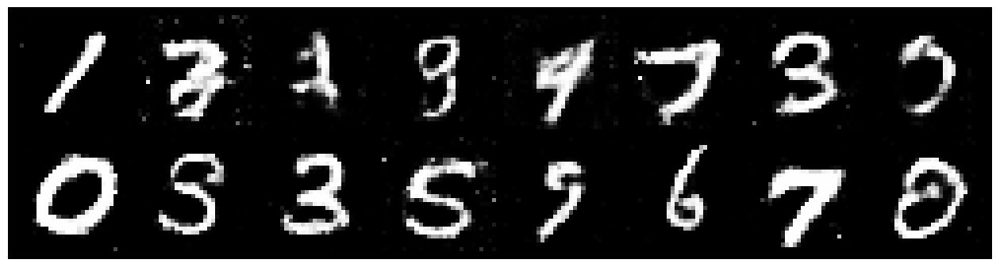

Epoch: [153/200], Batch Num: [400/600]
Discriminator Loss: 1.2294, Generator Loss: 0.8779
D(x): 0.6367, D(G(z)): 0.4792


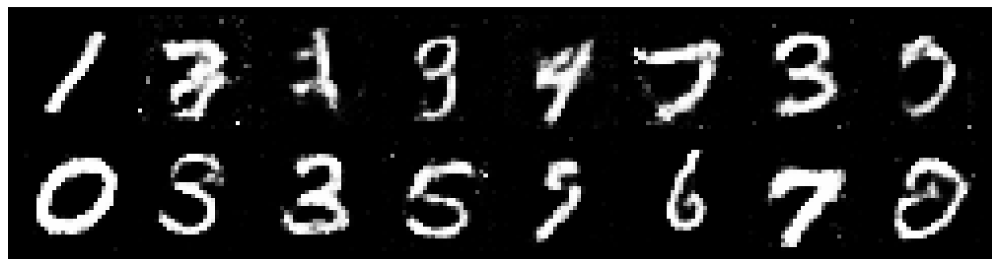

Epoch: [154/200], Batch Num: [0/600]
Discriminator Loss: 1.2265, Generator Loss: 0.9742
D(x): 0.5889, D(G(z)): 0.4507


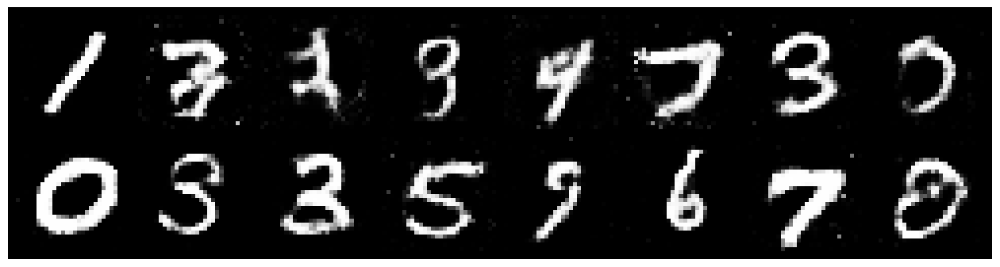

Epoch: [154/200], Batch Num: [200/600]
Discriminator Loss: 1.2624, Generator Loss: 0.9070
D(x): 0.5373, D(G(z)): 0.4146


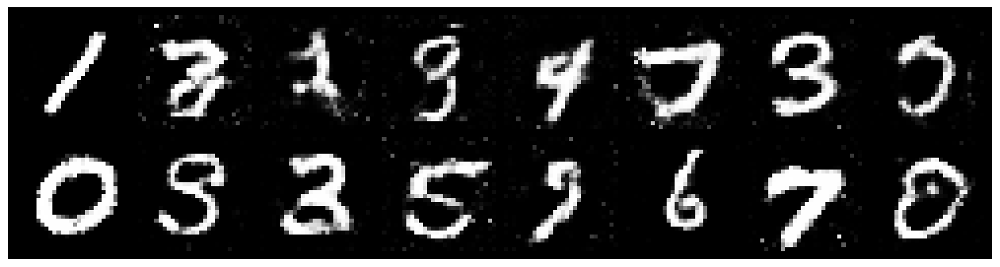

Epoch: [154/200], Batch Num: [400/600]
Discriminator Loss: 1.2403, Generator Loss: 0.8481
D(x): 0.5730, D(G(z)): 0.4270


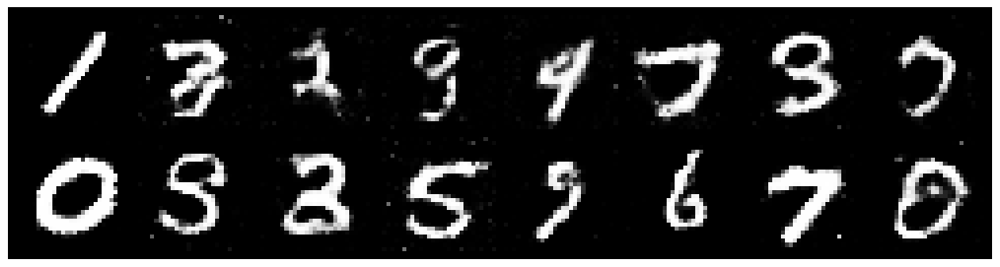

Epoch: [155/200], Batch Num: [0/600]
Discriminator Loss: 1.1811, Generator Loss: 1.1032
D(x): 0.5565, D(G(z)): 0.3875


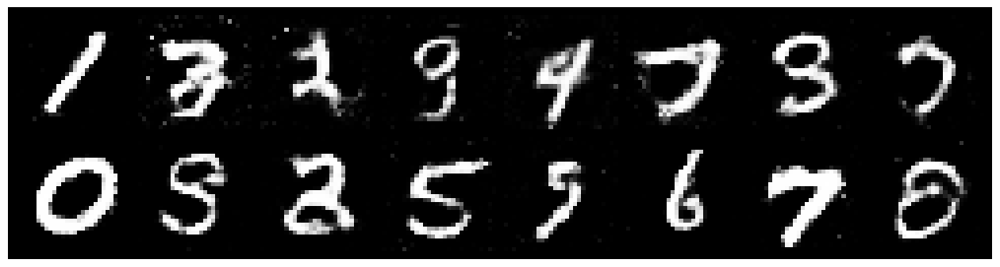

Epoch: [155/200], Batch Num: [200/600]
Discriminator Loss: 1.2418, Generator Loss: 0.9958
D(x): 0.5479, D(G(z)): 0.3964


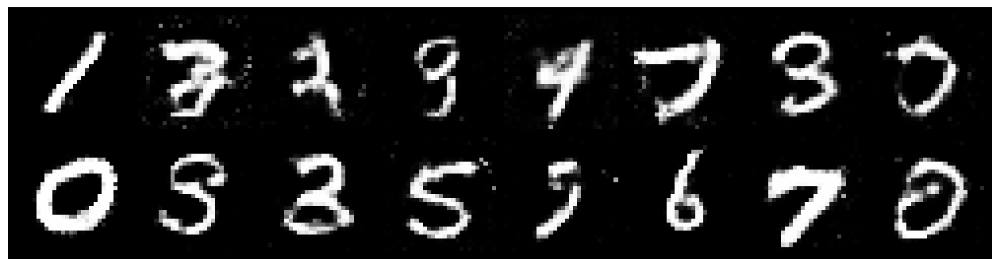

Epoch: [155/200], Batch Num: [400/600]
Discriminator Loss: 1.2439, Generator Loss: 1.0125
D(x): 0.5578, D(G(z)): 0.4247


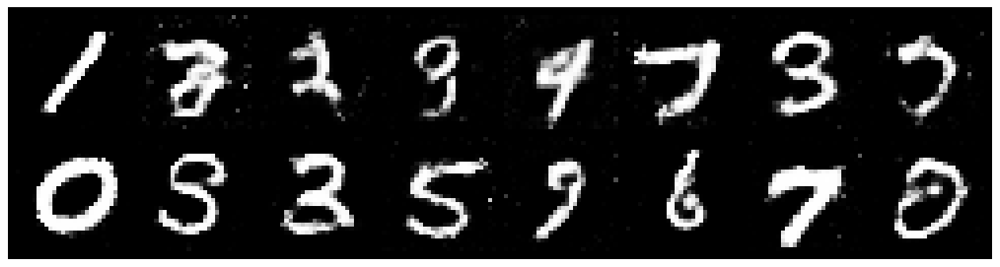

Epoch: [156/200], Batch Num: [0/600]
Discriminator Loss: 1.1724, Generator Loss: 0.9782
D(x): 0.5868, D(G(z)): 0.4128


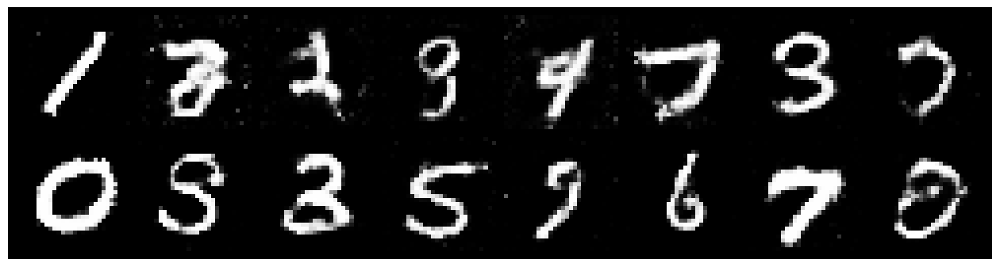

Epoch: [156/200], Batch Num: [200/600]
Discriminator Loss: 1.2874, Generator Loss: 0.8813
D(x): 0.5915, D(G(z)): 0.4846


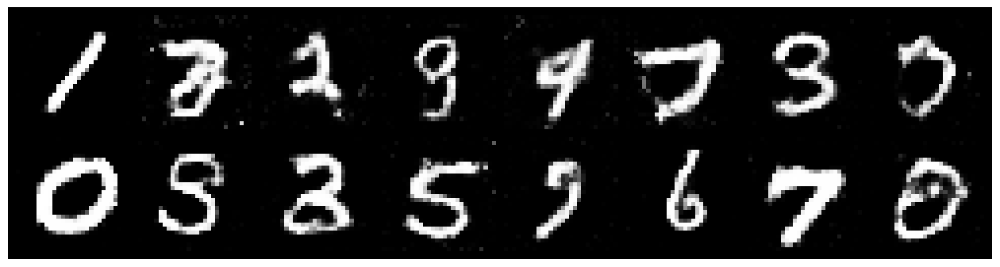

Epoch: [156/200], Batch Num: [400/600]
Discriminator Loss: 1.2429, Generator Loss: 0.9476
D(x): 0.5309, D(G(z)): 0.4001


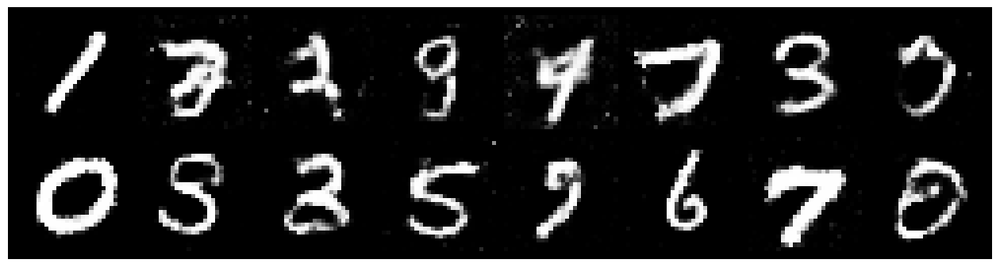

Epoch: [157/200], Batch Num: [0/600]
Discriminator Loss: 1.1692, Generator Loss: 0.9040
D(x): 0.5831, D(G(z)): 0.4193


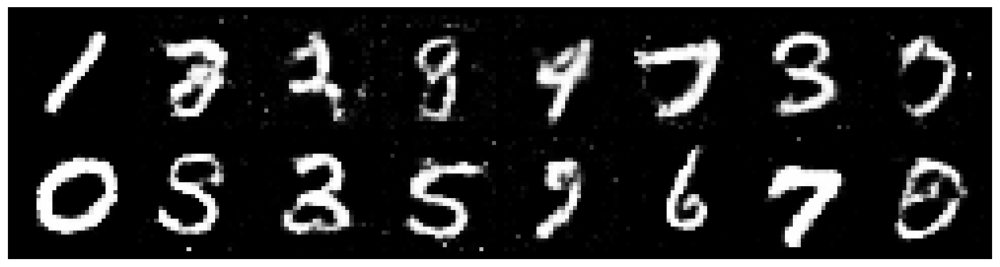

Epoch: [157/200], Batch Num: [200/600]
Discriminator Loss: 1.2547, Generator Loss: 0.9031
D(x): 0.5482, D(G(z)): 0.4173


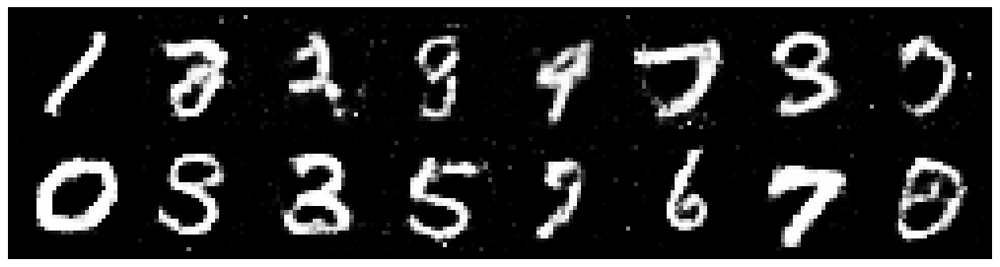

Epoch: [157/200], Batch Num: [400/600]
Discriminator Loss: 1.2111, Generator Loss: 0.9965
D(x): 0.5926, D(G(z)): 0.4367


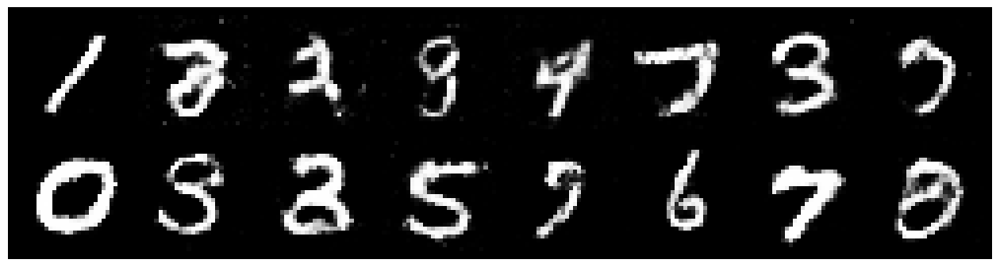

Epoch: [158/200], Batch Num: [0/600]
Discriminator Loss: 1.2153, Generator Loss: 1.1023
D(x): 0.5620, D(G(z)): 0.4187


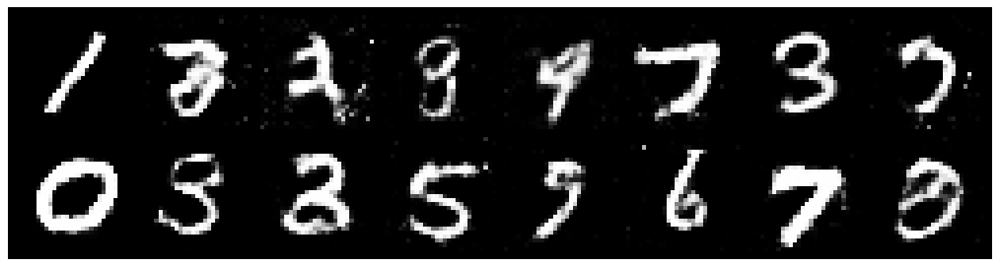

Epoch: [158/200], Batch Num: [200/600]
Discriminator Loss: 1.3143, Generator Loss: 0.8429
D(x): 0.5769, D(G(z)): 0.4802


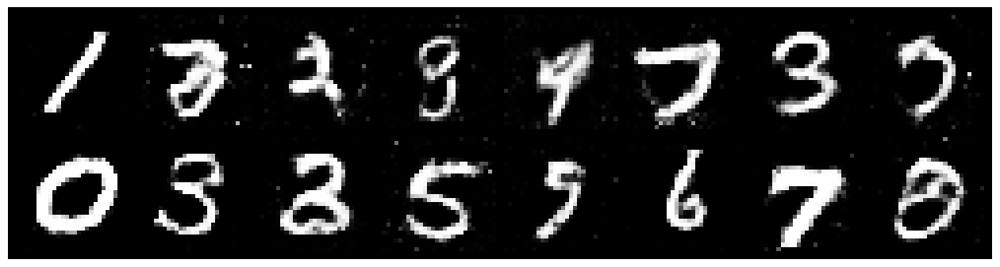

Epoch: [158/200], Batch Num: [400/600]
Discriminator Loss: 1.2004, Generator Loss: 0.8218
D(x): 0.6078, D(G(z)): 0.4532


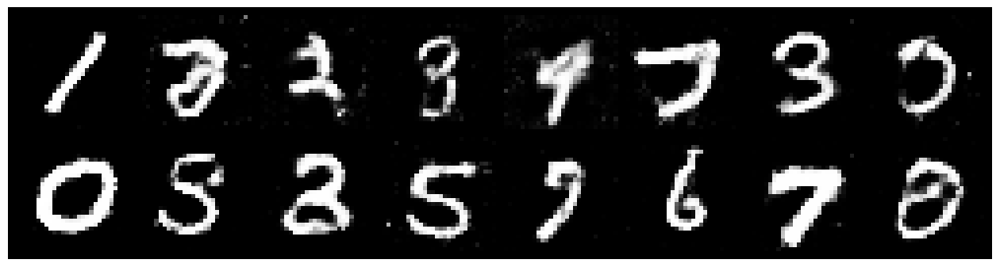

Epoch: [159/200], Batch Num: [0/600]
Discriminator Loss: 1.2342, Generator Loss: 0.8831
D(x): 0.5541, D(G(z)): 0.4286


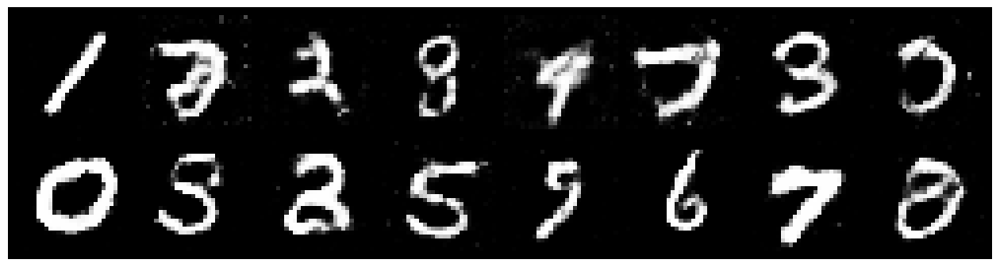

Epoch: [159/200], Batch Num: [200/600]
Discriminator Loss: 1.2658, Generator Loss: 1.0256
D(x): 0.5685, D(G(z)): 0.4469


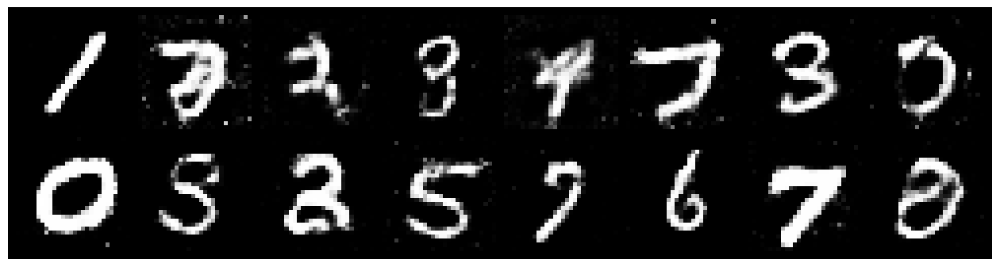

Epoch: [159/200], Batch Num: [400/600]
Discriminator Loss: 1.2954, Generator Loss: 0.8263
D(x): 0.5926, D(G(z)): 0.4713


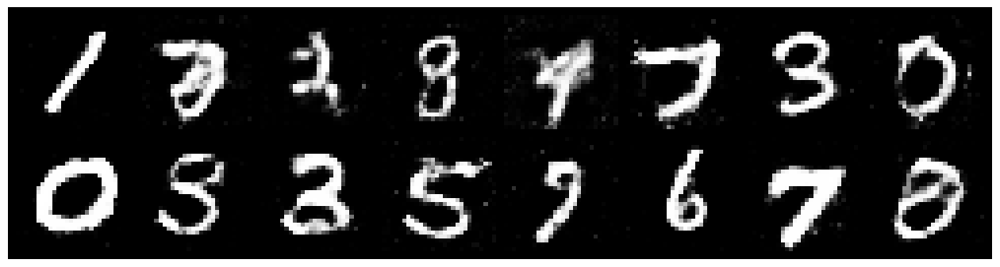

Epoch: [160/200], Batch Num: [0/600]
Discriminator Loss: 1.2442, Generator Loss: 0.8461
D(x): 0.6108, D(G(z)): 0.4736


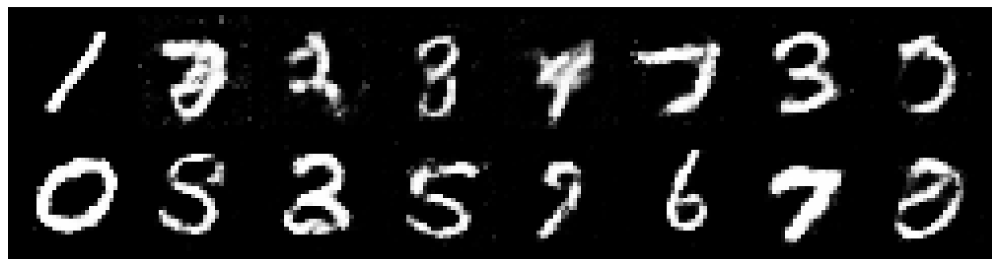

Epoch: [160/200], Batch Num: [200/600]
Discriminator Loss: 1.3605, Generator Loss: 0.8696
D(x): 0.5586, D(G(z)): 0.4762


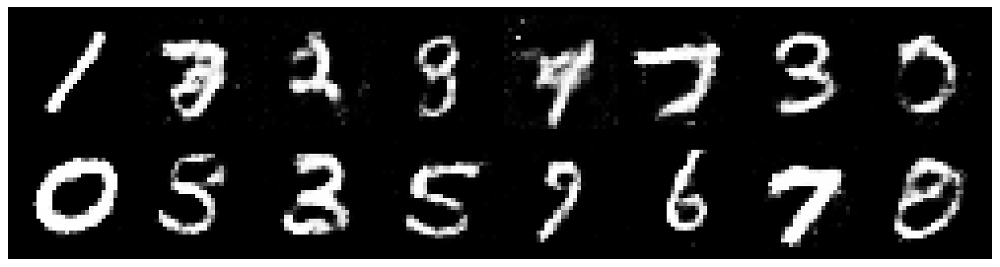

Epoch: [160/200], Batch Num: [400/600]
Discriminator Loss: 1.2356, Generator Loss: 1.0711
D(x): 0.5827, D(G(z)): 0.4358


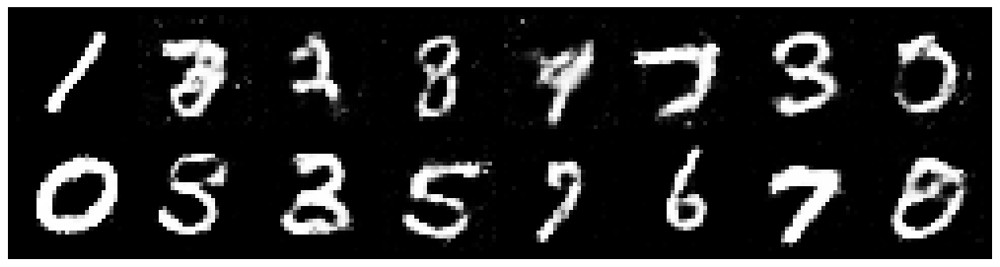

Epoch: [161/200], Batch Num: [0/600]
Discriminator Loss: 1.1891, Generator Loss: 0.9032
D(x): 0.5579, D(G(z)): 0.3981


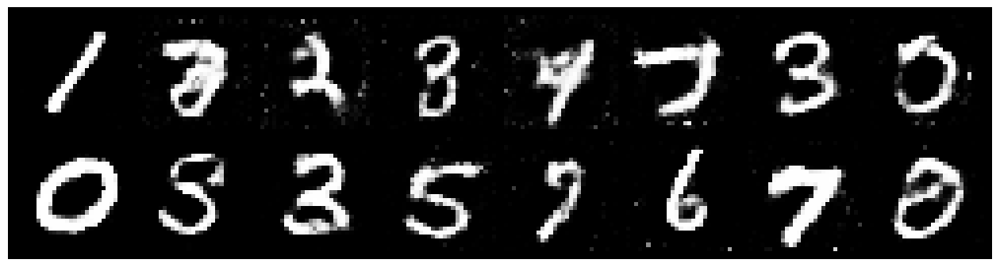

Epoch: [161/200], Batch Num: [200/600]
Discriminator Loss: 1.1641, Generator Loss: 0.9627
D(x): 0.5789, D(G(z)): 0.4074


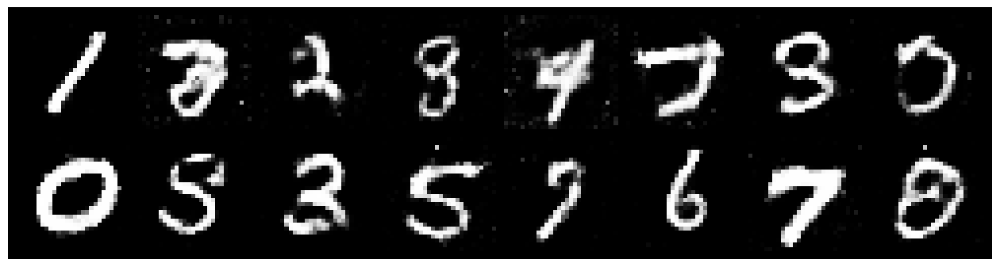

Epoch: [161/200], Batch Num: [400/600]
Discriminator Loss: 1.1696, Generator Loss: 1.1076
D(x): 0.5697, D(G(z)): 0.3996


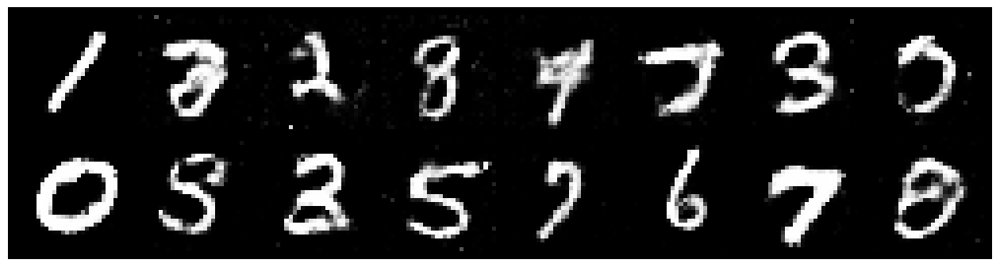

Epoch: [162/200], Batch Num: [0/600]
Discriminator Loss: 1.1802, Generator Loss: 0.9967
D(x): 0.6264, D(G(z)): 0.4488


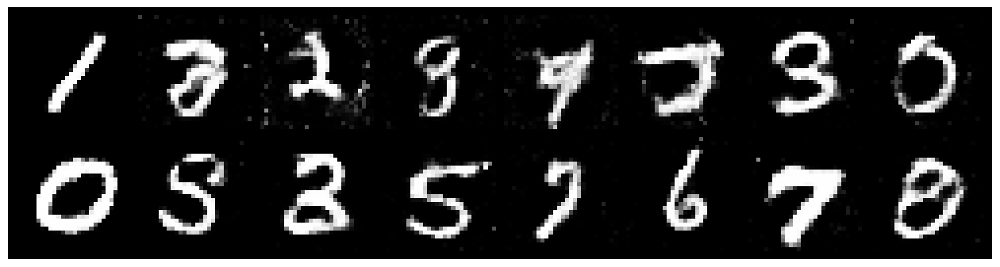

Epoch: [162/200], Batch Num: [200/600]
Discriminator Loss: 1.2898, Generator Loss: 0.8499
D(x): 0.5845, D(G(z)): 0.4785


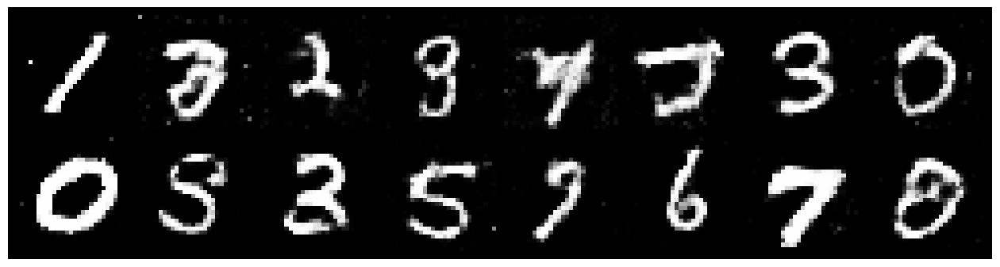

Epoch: [162/200], Batch Num: [400/600]
Discriminator Loss: 1.2406, Generator Loss: 0.9139
D(x): 0.5740, D(G(z)): 0.4319


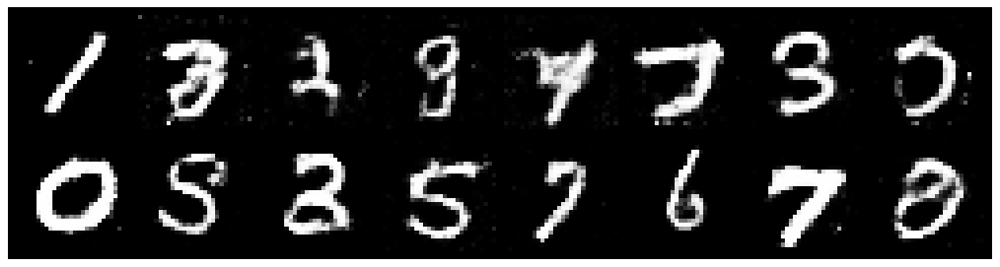

Epoch: [163/200], Batch Num: [0/600]
Discriminator Loss: 1.1696, Generator Loss: 1.1814
D(x): 0.5752, D(G(z)): 0.3744


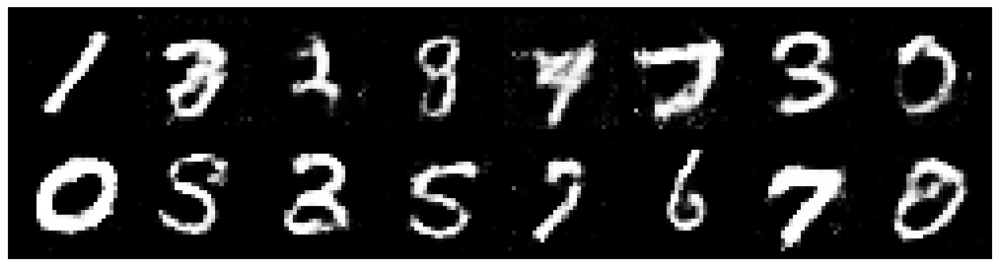

Epoch: [163/200], Batch Num: [200/600]
Discriminator Loss: 1.1858, Generator Loss: 0.9985
D(x): 0.5642, D(G(z)): 0.3995


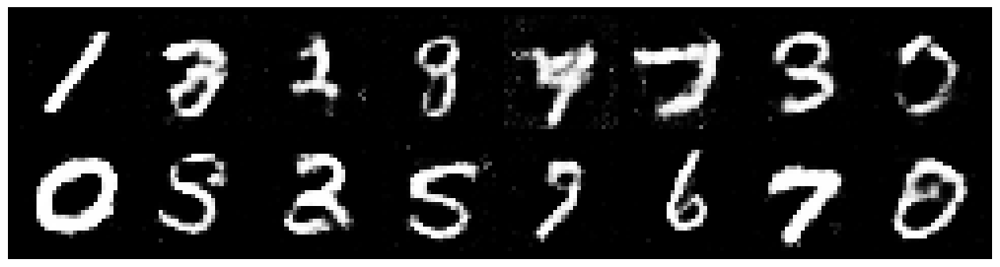

Epoch: [163/200], Batch Num: [400/600]
Discriminator Loss: 1.1622, Generator Loss: 0.9355
D(x): 0.5999, D(G(z)): 0.4126


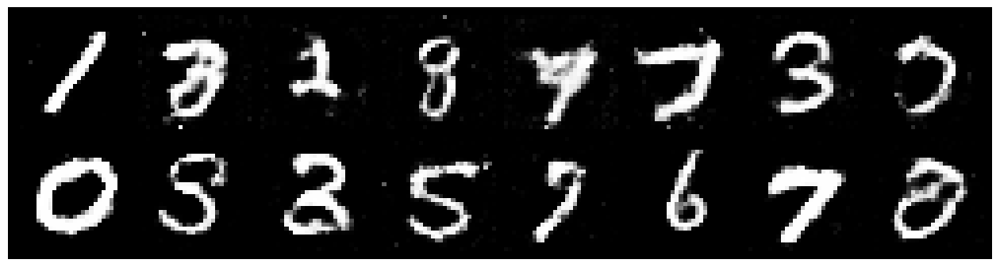

Epoch: [164/200], Batch Num: [0/600]
Discriminator Loss: 1.2267, Generator Loss: 0.8238
D(x): 0.5790, D(G(z)): 0.4262


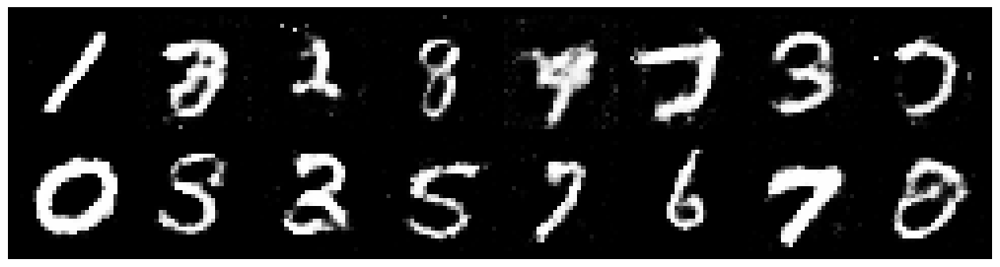

Epoch: [164/200], Batch Num: [200/600]
Discriminator Loss: 1.1378, Generator Loss: 1.1973
D(x): 0.5418, D(G(z)): 0.3630


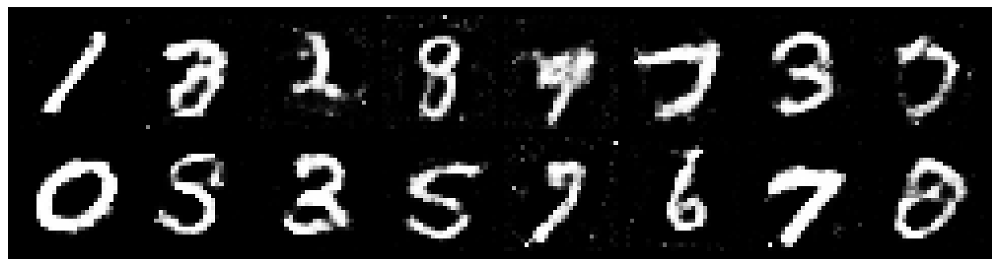

Epoch: [164/200], Batch Num: [400/600]
Discriminator Loss: 1.2561, Generator Loss: 0.9607
D(x): 0.5772, D(G(z)): 0.4458


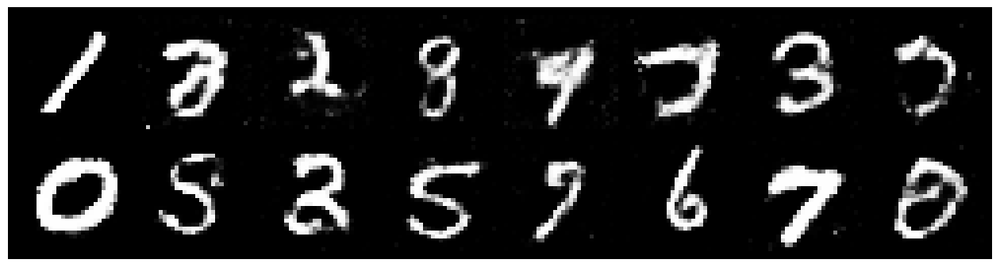

Epoch: [165/200], Batch Num: [0/600]
Discriminator Loss: 1.2390, Generator Loss: 0.9199
D(x): 0.5761, D(G(z)): 0.4393


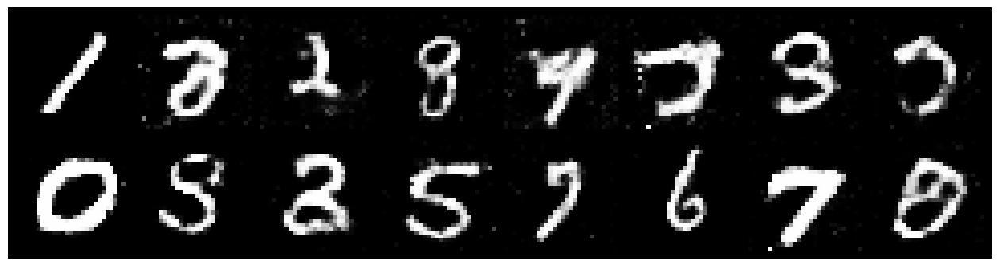

Epoch: [165/200], Batch Num: [200/600]
Discriminator Loss: 1.2688, Generator Loss: 0.9342
D(x): 0.5469, D(G(z)): 0.4414


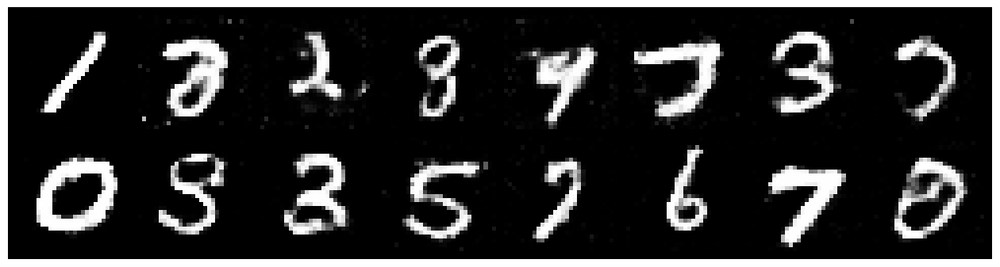

Epoch: [165/200], Batch Num: [400/600]
Discriminator Loss: 1.2951, Generator Loss: 0.8919
D(x): 0.5558, D(G(z)): 0.4580


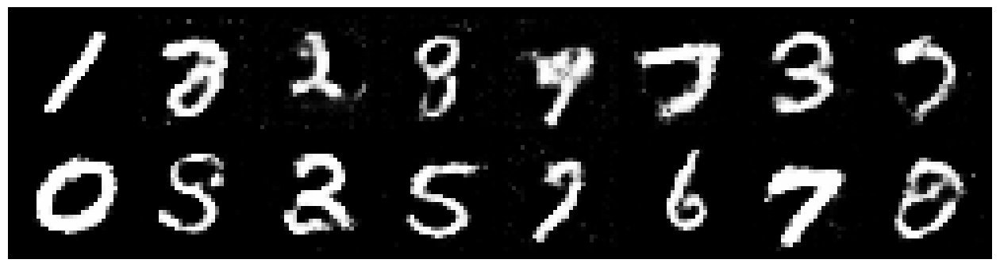

Epoch: [166/200], Batch Num: [0/600]
Discriminator Loss: 1.3438, Generator Loss: 0.8071
D(x): 0.5244, D(G(z)): 0.4480


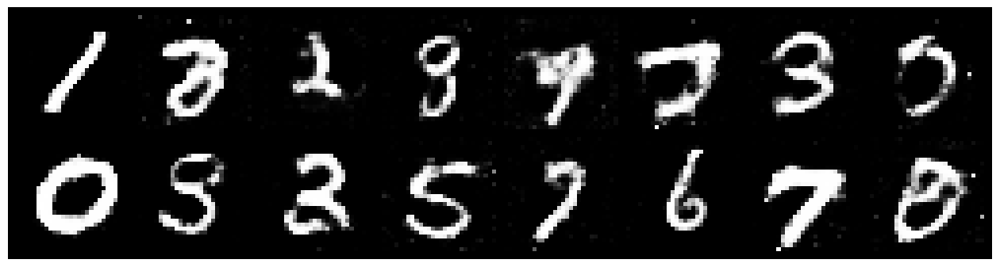

Epoch: [166/200], Batch Num: [200/600]
Discriminator Loss: 1.2721, Generator Loss: 0.8743
D(x): 0.5478, D(G(z)): 0.4415


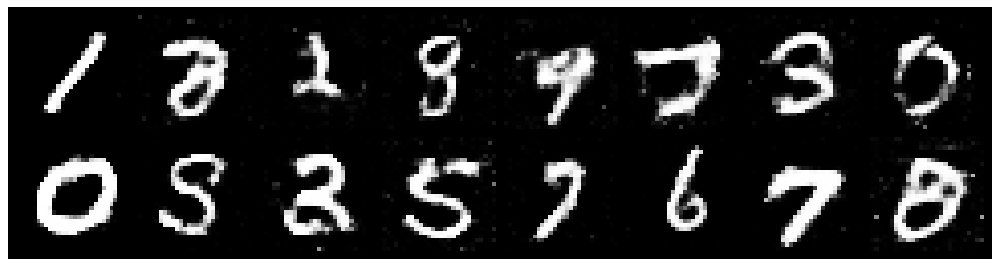

Epoch: [166/200], Batch Num: [400/600]
Discriminator Loss: 1.2968, Generator Loss: 1.0236
D(x): 0.5537, D(G(z)): 0.4524


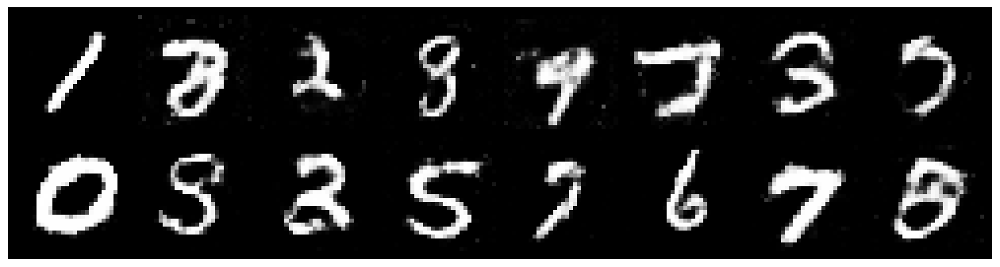

Epoch: [167/200], Batch Num: [0/600]
Discriminator Loss: 1.2028, Generator Loss: 1.0987
D(x): 0.5414, D(G(z)): 0.3734


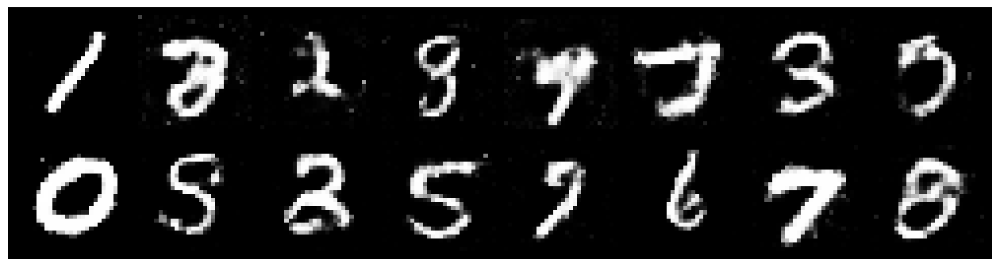

Epoch: [167/200], Batch Num: [200/600]
Discriminator Loss: 1.3338, Generator Loss: 0.8418
D(x): 0.5328, D(G(z)): 0.4286


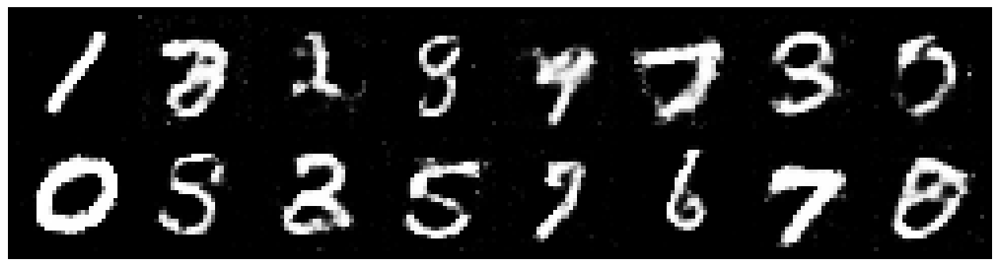

Epoch: [167/200], Batch Num: [400/600]
Discriminator Loss: 1.2162, Generator Loss: 1.0513
D(x): 0.5612, D(G(z)): 0.3992


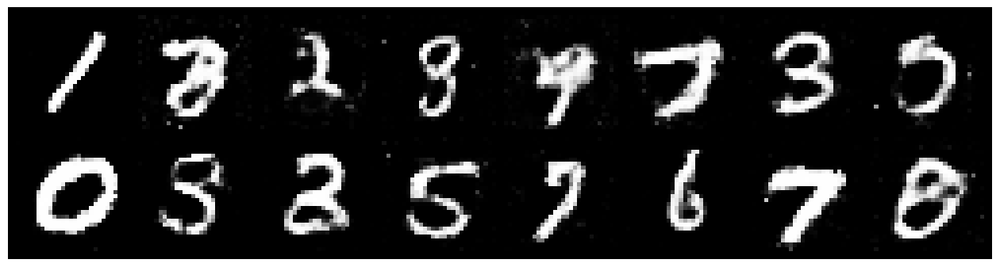

Epoch: [168/200], Batch Num: [0/600]
Discriminator Loss: 1.2594, Generator Loss: 0.8090
D(x): 0.5601, D(G(z)): 0.4464


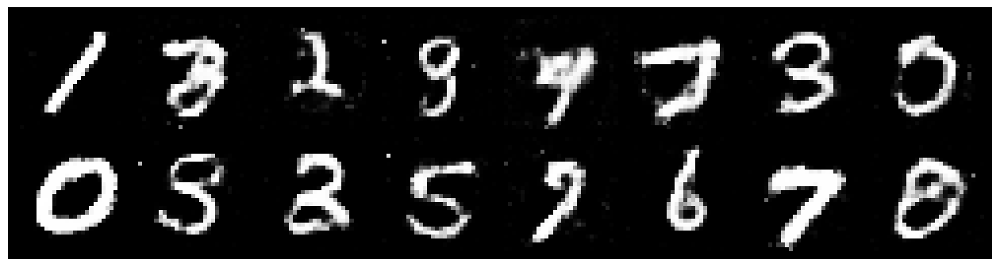

Epoch: [168/200], Batch Num: [200/600]
Discriminator Loss: 1.2824, Generator Loss: 0.8520
D(x): 0.5959, D(G(z)): 0.4758


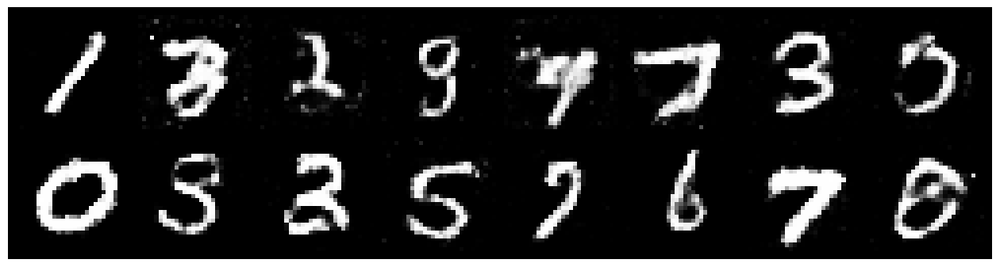

Epoch: [168/200], Batch Num: [400/600]
Discriminator Loss: 1.2777, Generator Loss: 0.9828
D(x): 0.5298, D(G(z)): 0.4024


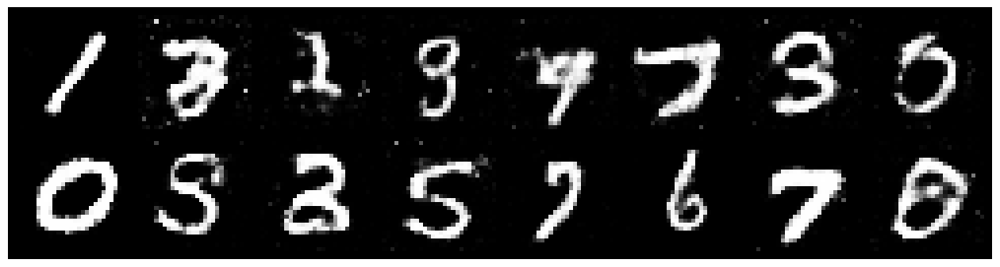

Epoch: [169/200], Batch Num: [0/600]
Discriminator Loss: 1.1565, Generator Loss: 0.9287
D(x): 0.6107, D(G(z)): 0.4333


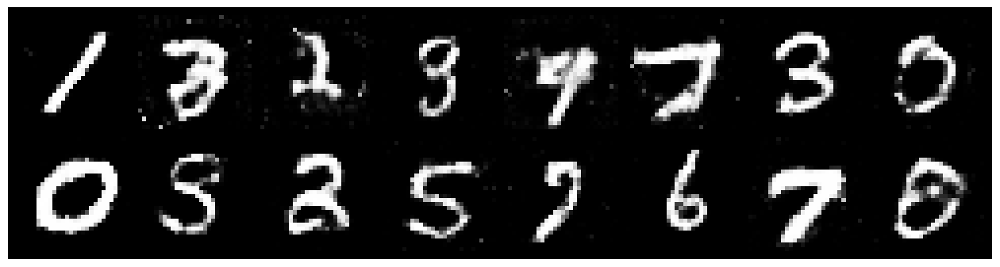

Epoch: [169/200], Batch Num: [200/600]
Discriminator Loss: 1.1977, Generator Loss: 0.8534
D(x): 0.5673, D(G(z)): 0.4300


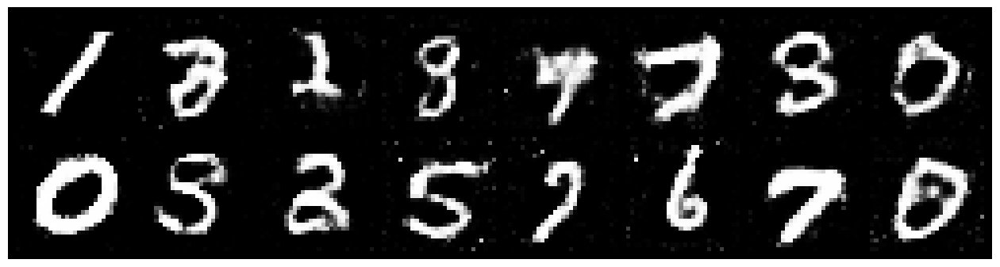

Epoch: [169/200], Batch Num: [400/600]
Discriminator Loss: 1.3668, Generator Loss: 0.9012
D(x): 0.5269, D(G(z)): 0.4632


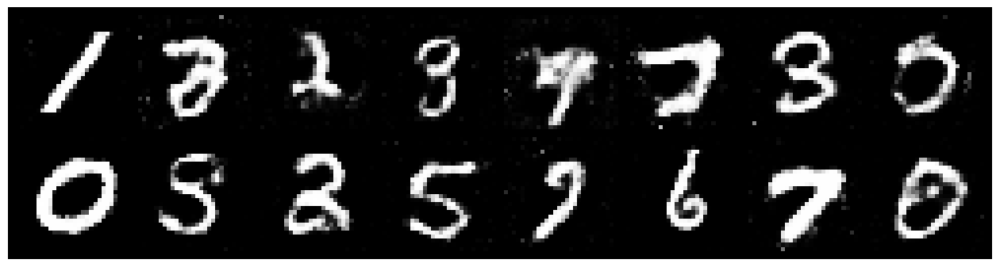

Epoch: [170/200], Batch Num: [0/600]
Discriminator Loss: 1.2131, Generator Loss: 0.8329
D(x): 0.5769, D(G(z)): 0.4363


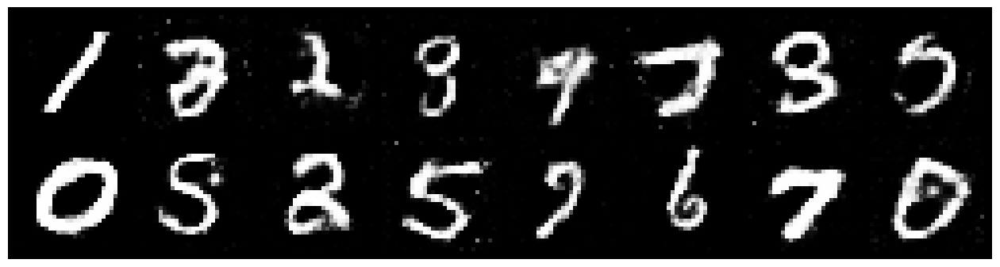

Epoch: [170/200], Batch Num: [200/600]
Discriminator Loss: 1.3315, Generator Loss: 0.8525
D(x): 0.5554, D(G(z)): 0.4689


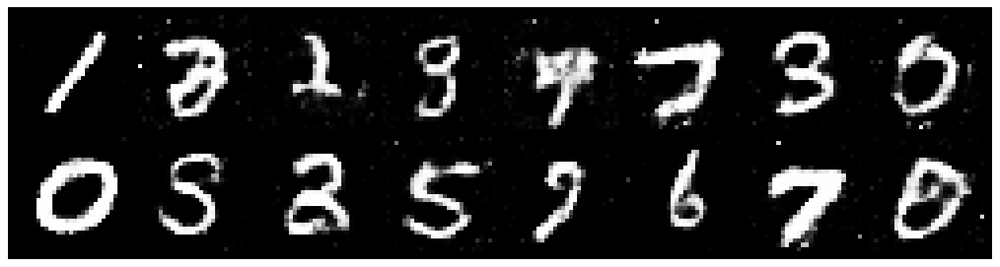

Epoch: [170/200], Batch Num: [400/600]
Discriminator Loss: 1.1767, Generator Loss: 1.0622
D(x): 0.5511, D(G(z)): 0.3830


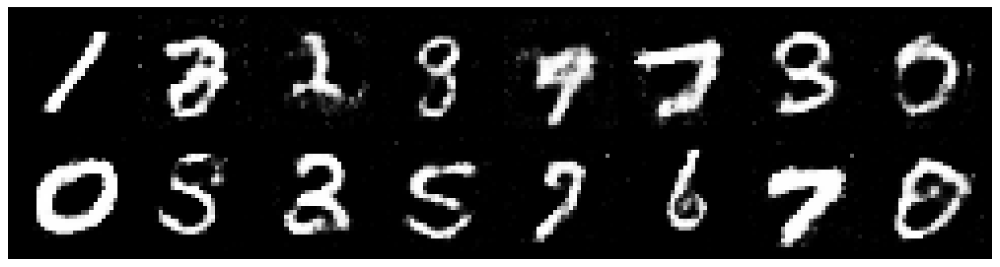

Epoch: [171/200], Batch Num: [0/600]
Discriminator Loss: 1.1486, Generator Loss: 0.8699
D(x): 0.6127, D(G(z)): 0.4429


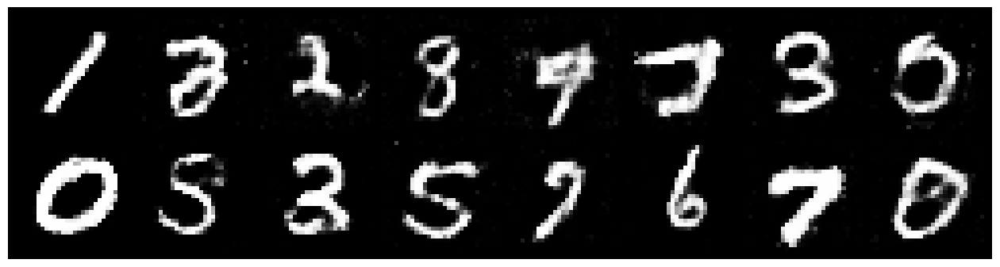

Epoch: [171/200], Batch Num: [200/600]
Discriminator Loss: 1.2869, Generator Loss: 0.8863
D(x): 0.5851, D(G(z)): 0.4718


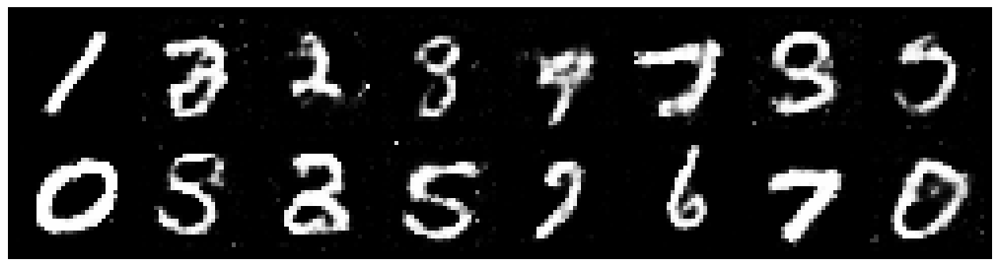

Epoch: [171/200], Batch Num: [400/600]
Discriminator Loss: 1.2739, Generator Loss: 0.8963
D(x): 0.5454, D(G(z)): 0.4290


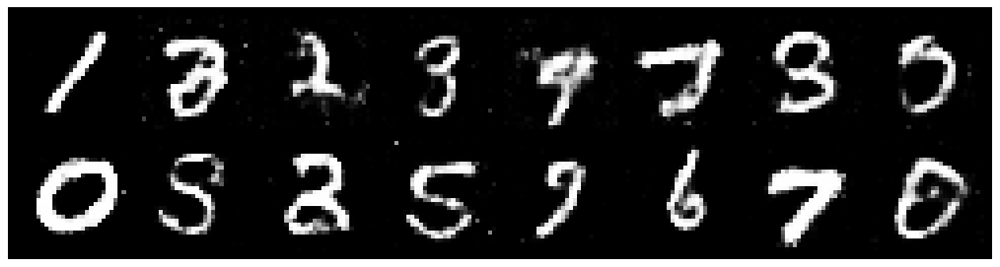

Epoch: [172/200], Batch Num: [0/600]
Discriminator Loss: 1.2187, Generator Loss: 0.8792
D(x): 0.5623, D(G(z)): 0.4266


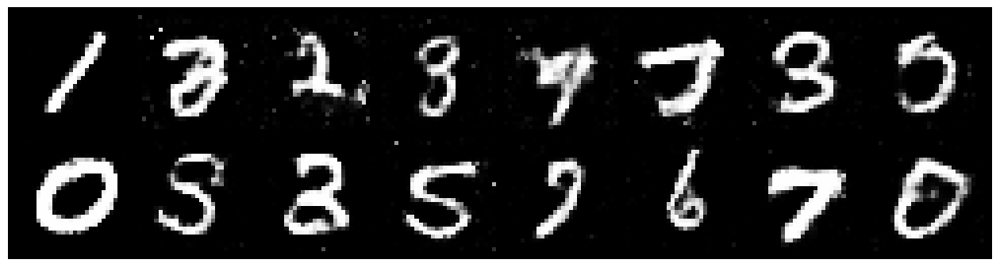

Epoch: [172/200], Batch Num: [200/600]
Discriminator Loss: 1.1719, Generator Loss: 1.0018
D(x): 0.5663, D(G(z)): 0.3995


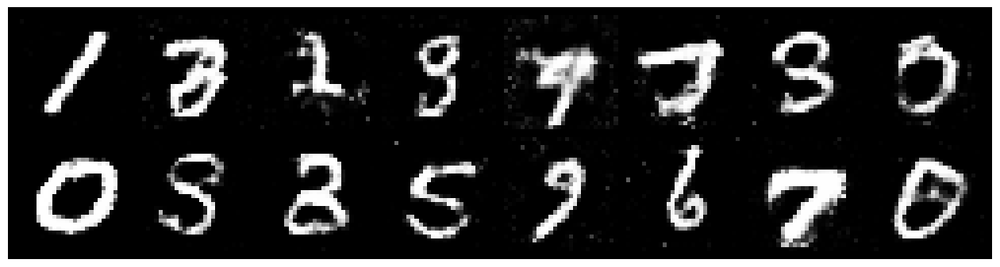

Epoch: [172/200], Batch Num: [400/600]
Discriminator Loss: 1.2791, Generator Loss: 1.0449
D(x): 0.5557, D(G(z)): 0.4478


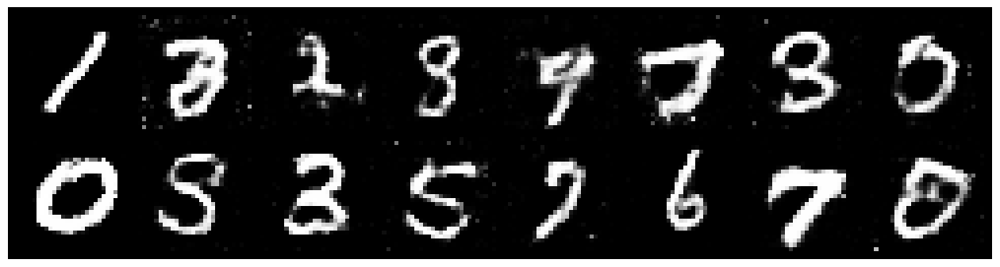

Epoch: [173/200], Batch Num: [0/600]
Discriminator Loss: 1.2954, Generator Loss: 0.9104
D(x): 0.5362, D(G(z)): 0.4290


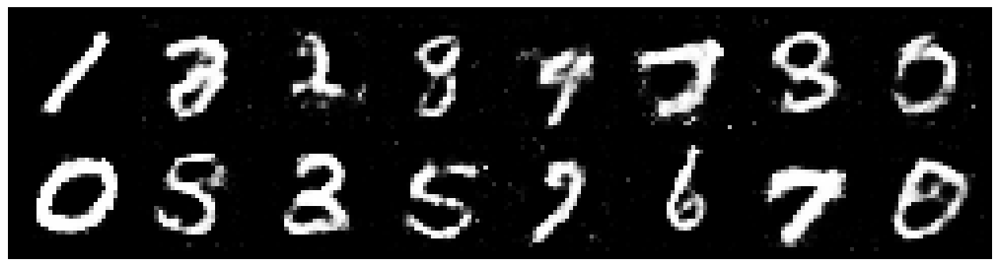

Epoch: [173/200], Batch Num: [200/600]
Discriminator Loss: 1.3087, Generator Loss: 0.8966
D(x): 0.5415, D(G(z)): 0.4483


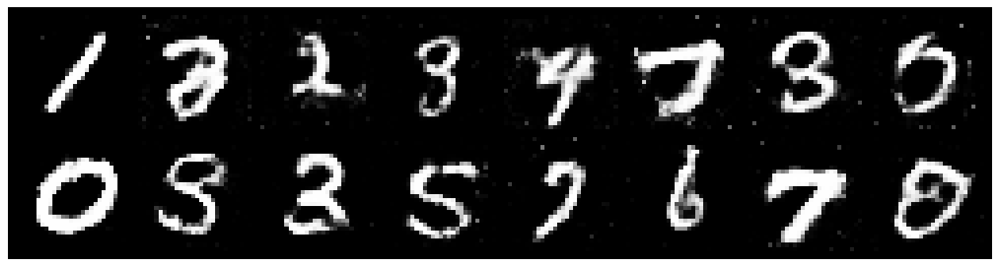

Epoch: [173/200], Batch Num: [400/600]
Discriminator Loss: 1.3523, Generator Loss: 0.8175
D(x): 0.5834, D(G(z)): 0.4832


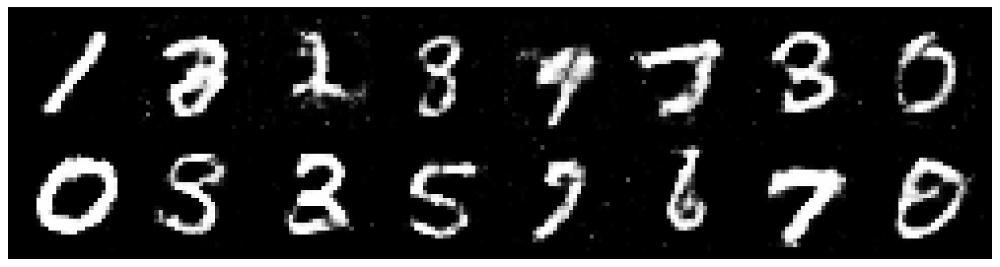

Epoch: [174/200], Batch Num: [0/600]
Discriminator Loss: 1.1784, Generator Loss: 0.9504
D(x): 0.5493, D(G(z)): 0.3853


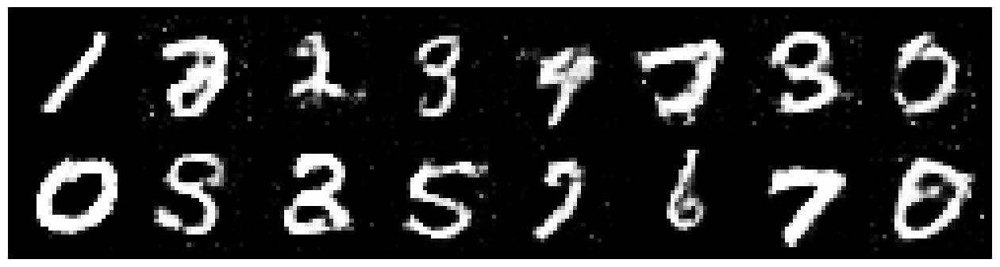

Epoch: [174/200], Batch Num: [200/600]
Discriminator Loss: 1.2689, Generator Loss: 0.8380
D(x): 0.5527, D(G(z)): 0.4325


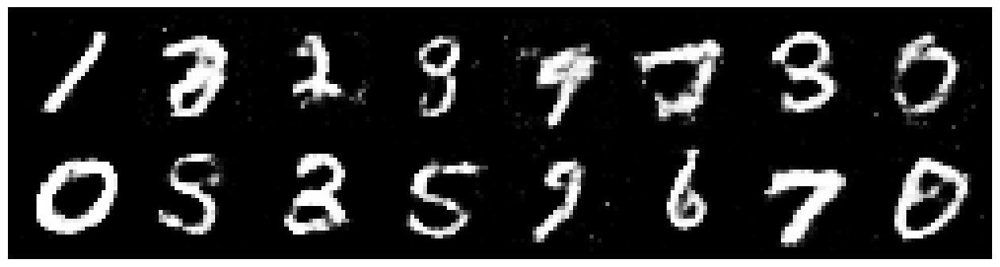

Epoch: [174/200], Batch Num: [400/600]
Discriminator Loss: 1.2427, Generator Loss: 0.9394
D(x): 0.5681, D(G(z)): 0.4269


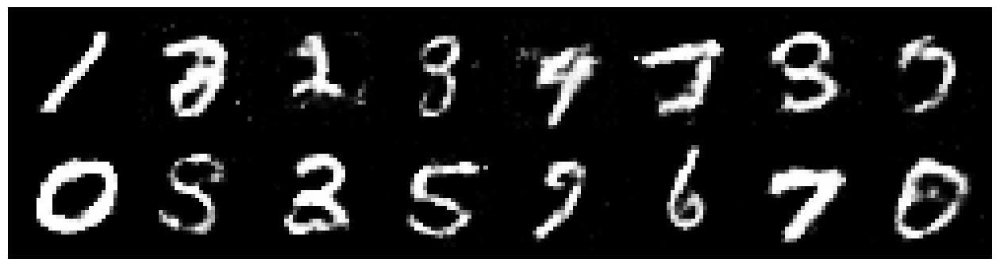

Epoch: [175/200], Batch Num: [0/600]
Discriminator Loss: 1.3351, Generator Loss: 0.9582
D(x): 0.5268, D(G(z)): 0.4602


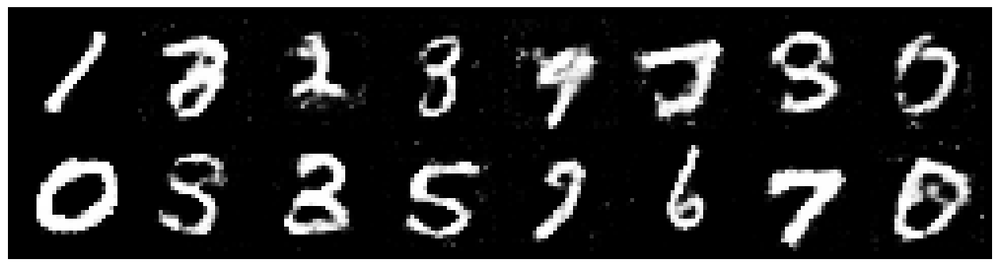

Epoch: [175/200], Batch Num: [200/600]
Discriminator Loss: 1.1717, Generator Loss: 0.9342
D(x): 0.5785, D(G(z)): 0.3996


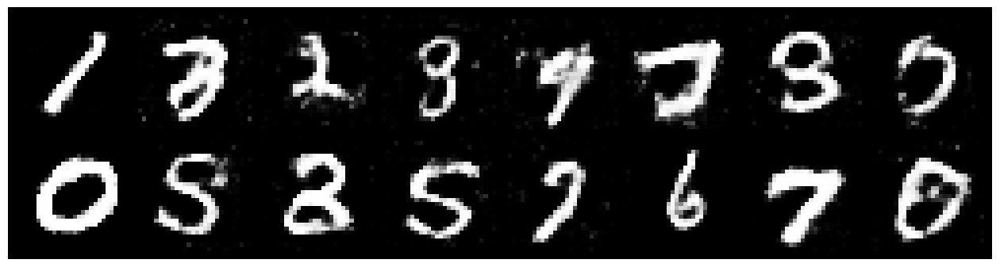

Epoch: [175/200], Batch Num: [400/600]
Discriminator Loss: 1.3226, Generator Loss: 0.8293
D(x): 0.5902, D(G(z)): 0.4880


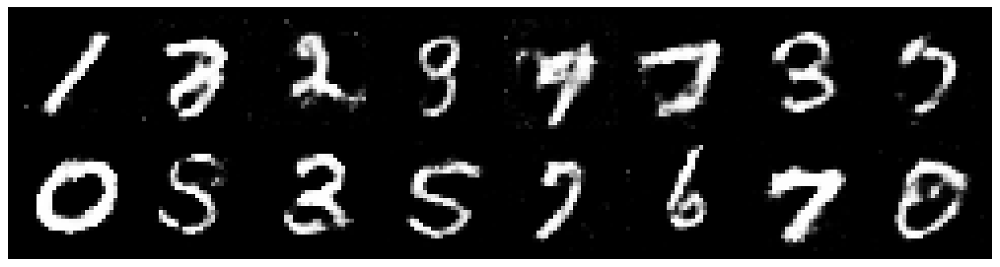

Epoch: [176/200], Batch Num: [0/600]
Discriminator Loss: 1.1200, Generator Loss: 0.9433
D(x): 0.5832, D(G(z)): 0.3991


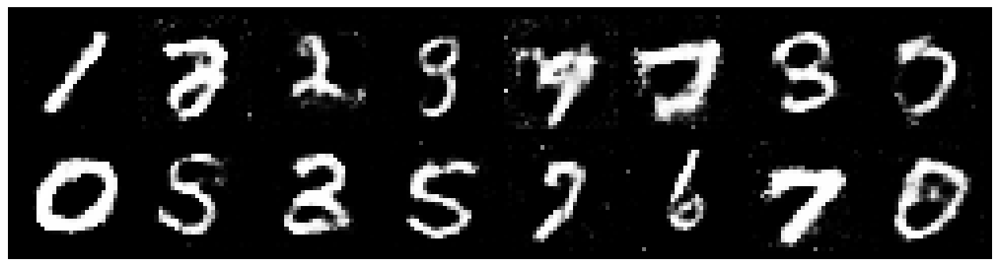

Epoch: [176/200], Batch Num: [200/600]
Discriminator Loss: 1.2721, Generator Loss: 0.8331
D(x): 0.5624, D(G(z)): 0.4502


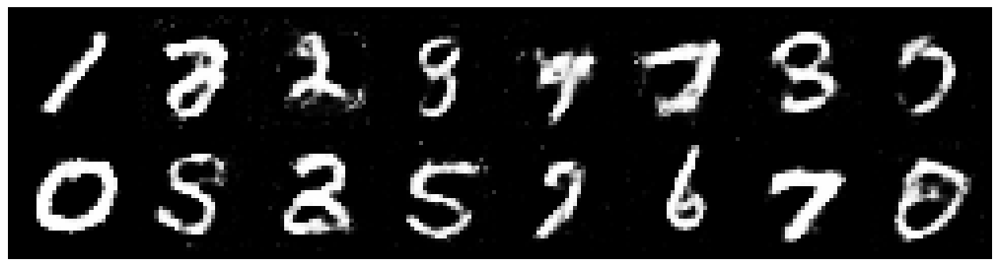

Epoch: [176/200], Batch Num: [400/600]
Discriminator Loss: 1.1625, Generator Loss: 0.9861
D(x): 0.5695, D(G(z)): 0.3986


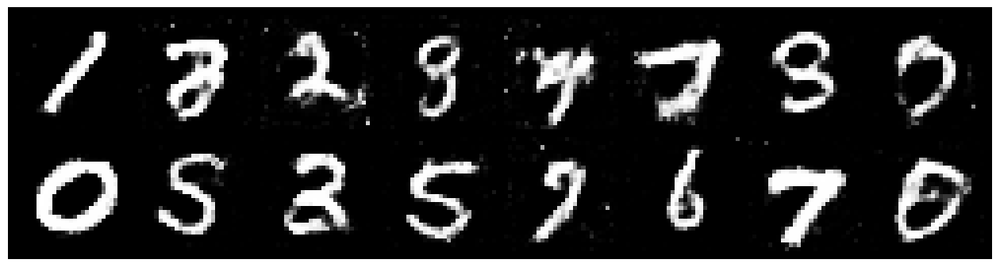

Epoch: [177/200], Batch Num: [0/600]
Discriminator Loss: 1.1535, Generator Loss: 0.9478
D(x): 0.5826, D(G(z)): 0.4056


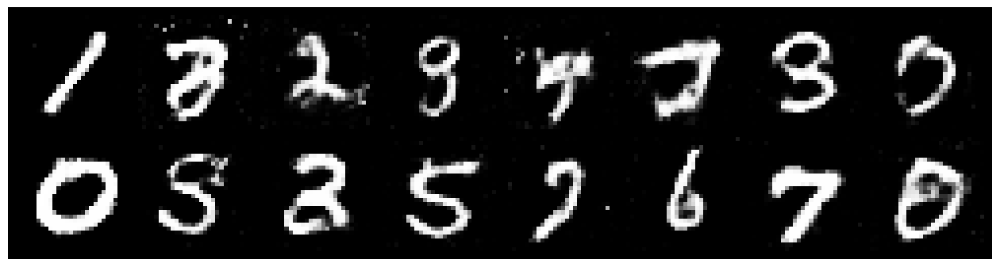

Epoch: [177/200], Batch Num: [200/600]
Discriminator Loss: 1.3189, Generator Loss: 0.8518
D(x): 0.6073, D(G(z)): 0.5068


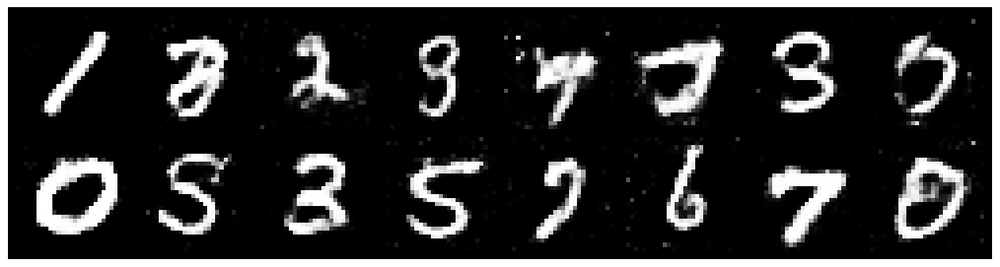

Epoch: [177/200], Batch Num: [400/600]
Discriminator Loss: 1.2344, Generator Loss: 0.8434
D(x): 0.5849, D(G(z)): 0.4370


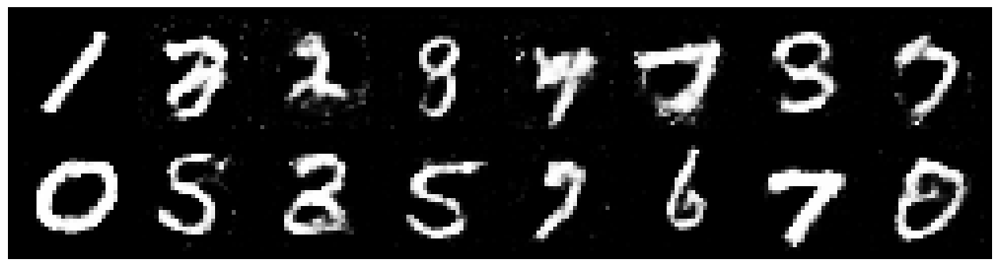

Epoch: [178/200], Batch Num: [0/600]
Discriminator Loss: 1.3119, Generator Loss: 0.9086
D(x): 0.5491, D(G(z)): 0.4492


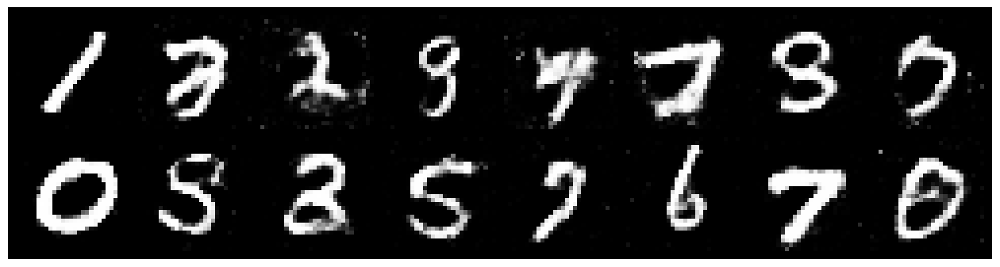

Epoch: [178/200], Batch Num: [200/600]
Discriminator Loss: 1.3011, Generator Loss: 0.8674
D(x): 0.5502, D(G(z)): 0.4401


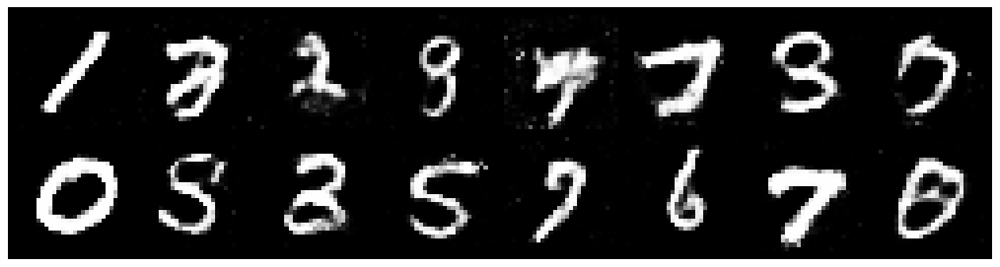

Epoch: [178/200], Batch Num: [400/600]
Discriminator Loss: 1.1776, Generator Loss: 0.9344
D(x): 0.5579, D(G(z)): 0.3914


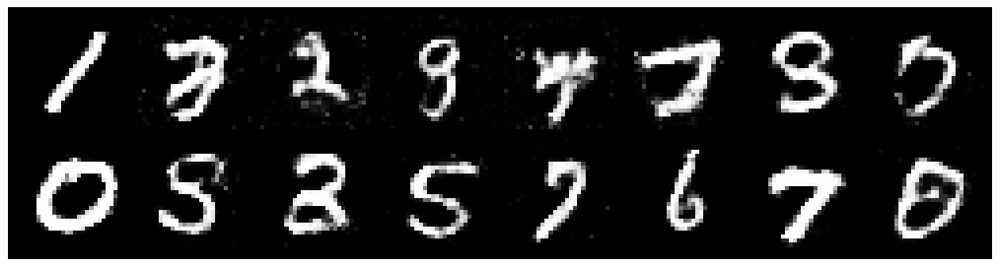

Epoch: [179/200], Batch Num: [0/600]
Discriminator Loss: 1.2698, Generator Loss: 0.8115
D(x): 0.5654, D(G(z)): 0.4466


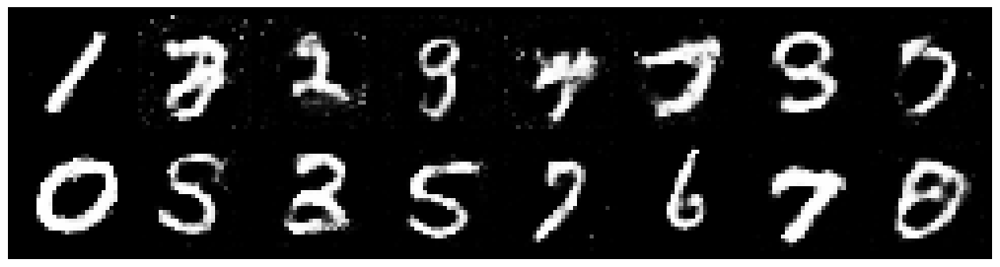

Epoch: [179/200], Batch Num: [200/600]
Discriminator Loss: 1.2083, Generator Loss: 0.8428
D(x): 0.5684, D(G(z)): 0.4263


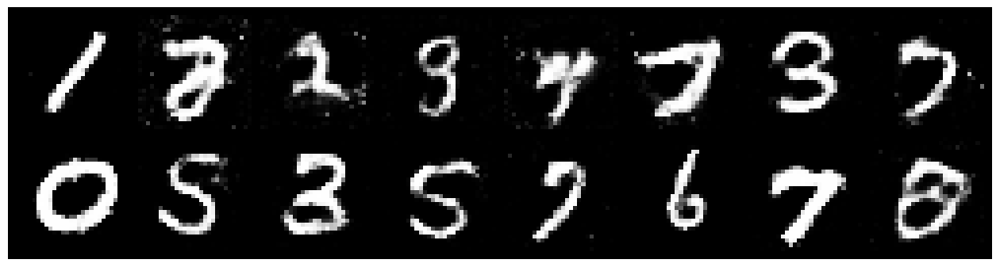

Epoch: [179/200], Batch Num: [400/600]
Discriminator Loss: 1.2650, Generator Loss: 0.8481
D(x): 0.5619, D(G(z)): 0.4650


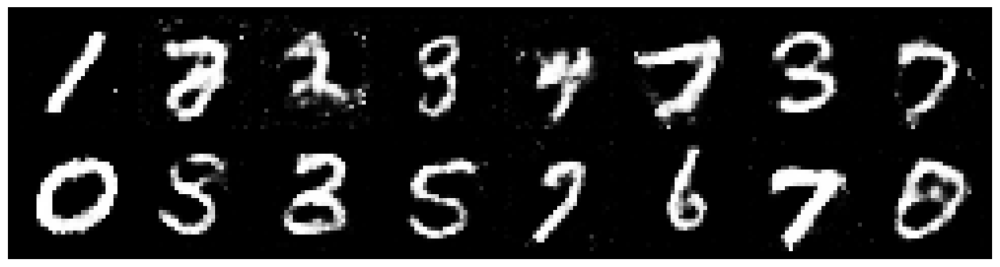

Epoch: [180/200], Batch Num: [0/600]
Discriminator Loss: 1.1493, Generator Loss: 0.9537
D(x): 0.6140, D(G(z)): 0.4319


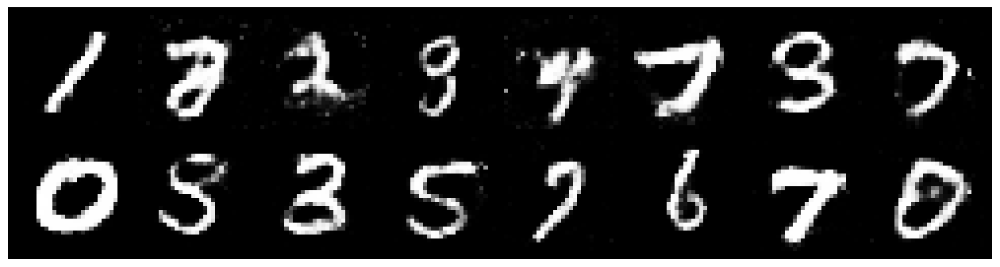

Epoch: [180/200], Batch Num: [200/600]
Discriminator Loss: 1.2774, Generator Loss: 0.8473
D(x): 0.5471, D(G(z)): 0.4499


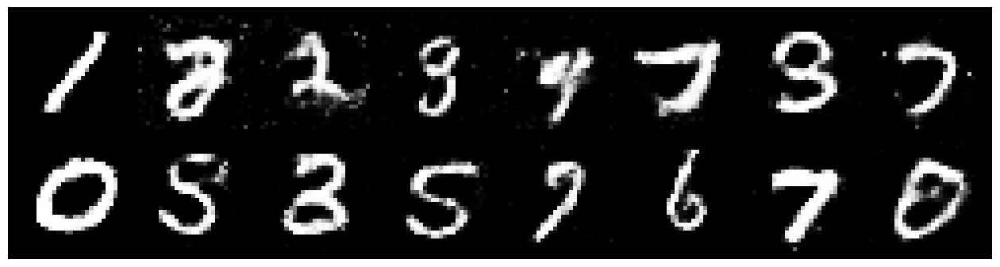

Epoch: [180/200], Batch Num: [400/600]
Discriminator Loss: 1.2474, Generator Loss: 0.9144
D(x): 0.5447, D(G(z)): 0.4189


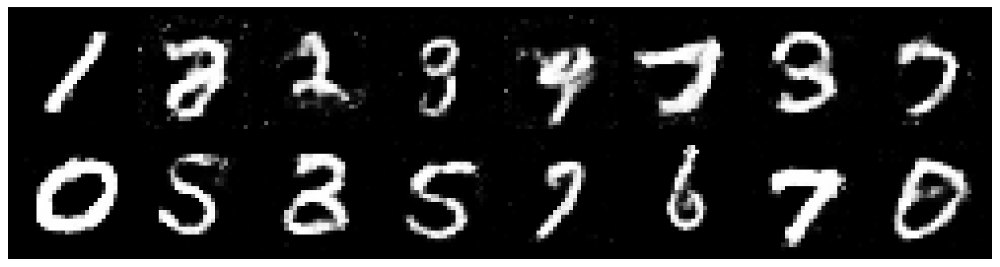

Epoch: [181/200], Batch Num: [0/600]
Discriminator Loss: 1.3003, Generator Loss: 0.8352
D(x): 0.5846, D(G(z)): 0.4722


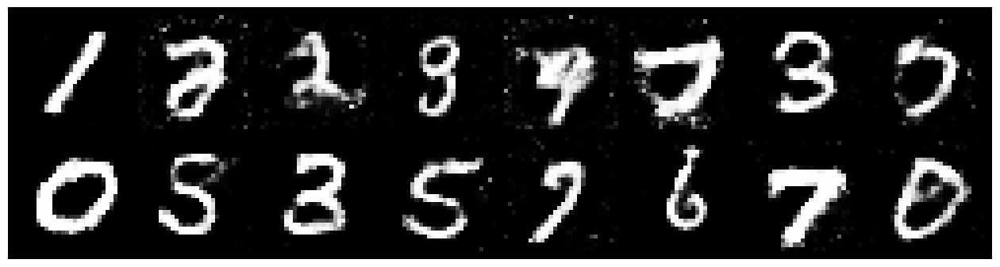

Epoch: [181/200], Batch Num: [200/600]
Discriminator Loss: 1.3060, Generator Loss: 0.8575
D(x): 0.5630, D(G(z)): 0.4493


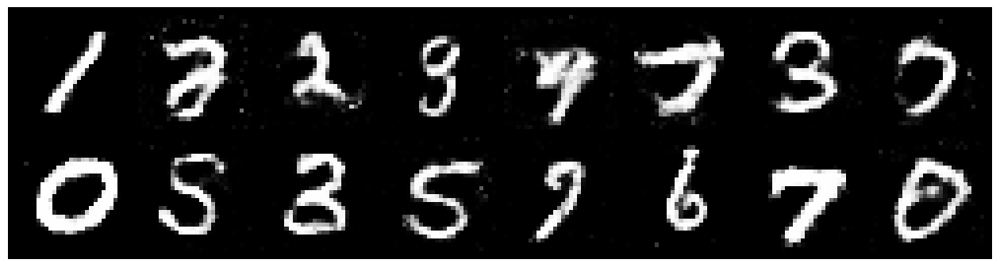

Epoch: [181/200], Batch Num: [400/600]
Discriminator Loss: 1.2568, Generator Loss: 0.9905
D(x): 0.5596, D(G(z)): 0.4201


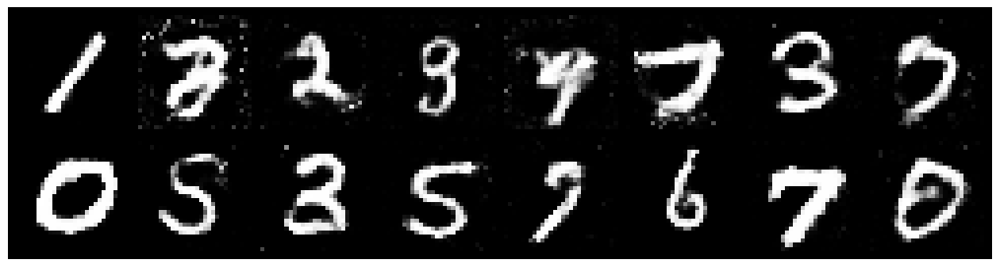

Epoch: [182/200], Batch Num: [0/600]
Discriminator Loss: 1.1676, Generator Loss: 0.9495
D(x): 0.5823, D(G(z)): 0.4209


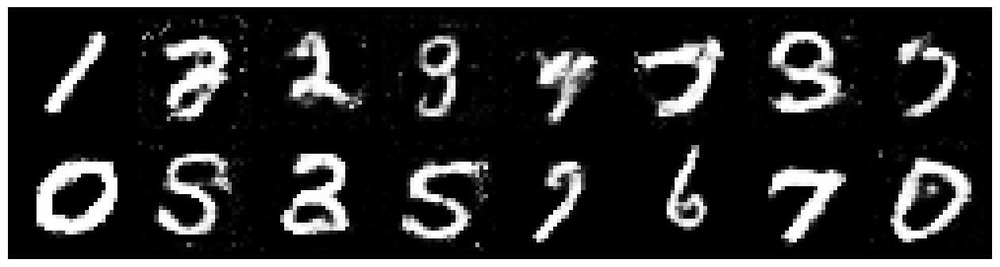

Epoch: [182/200], Batch Num: [200/600]
Discriminator Loss: 1.1652, Generator Loss: 0.8643
D(x): 0.6387, D(G(z)): 0.4696


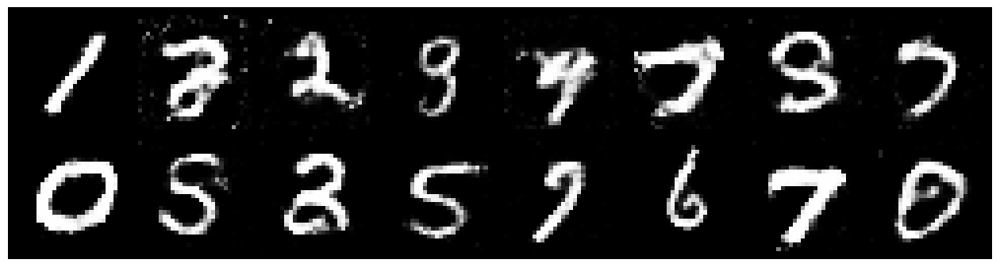

Epoch: [182/200], Batch Num: [400/600]
Discriminator Loss: 1.2643, Generator Loss: 0.9805
D(x): 0.5282, D(G(z)): 0.4034


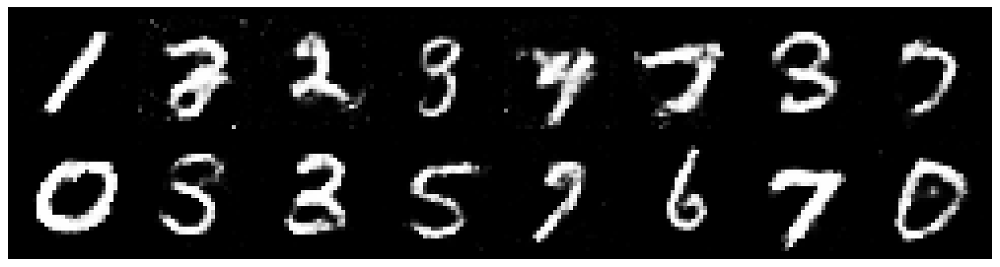

Epoch: [183/200], Batch Num: [0/600]
Discriminator Loss: 1.2255, Generator Loss: 0.9203
D(x): 0.5845, D(G(z)): 0.4404


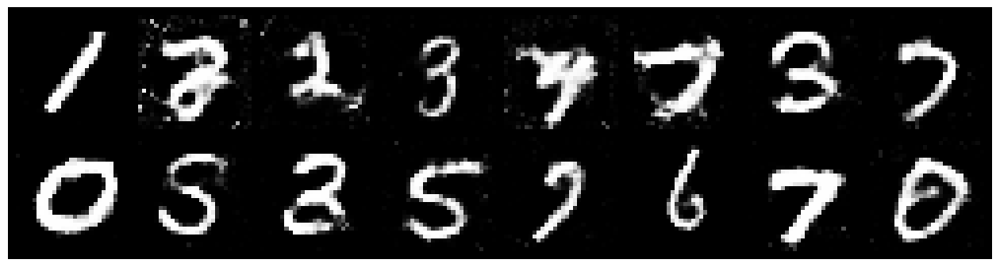

Epoch: [183/200], Batch Num: [200/600]
Discriminator Loss: 1.2864, Generator Loss: 0.7702
D(x): 0.6275, D(G(z)): 0.5179


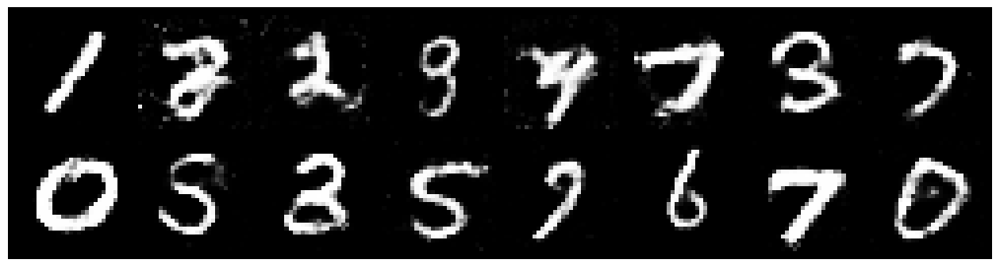

Epoch: [183/200], Batch Num: [400/600]
Discriminator Loss: 1.2238, Generator Loss: 0.9059
D(x): 0.5790, D(G(z)): 0.4348


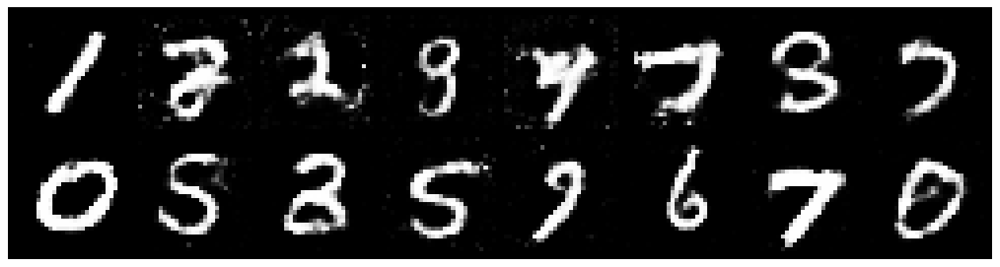

Epoch: [184/200], Batch Num: [0/600]
Discriminator Loss: 1.2969, Generator Loss: 0.9282
D(x): 0.5701, D(G(z)): 0.4558


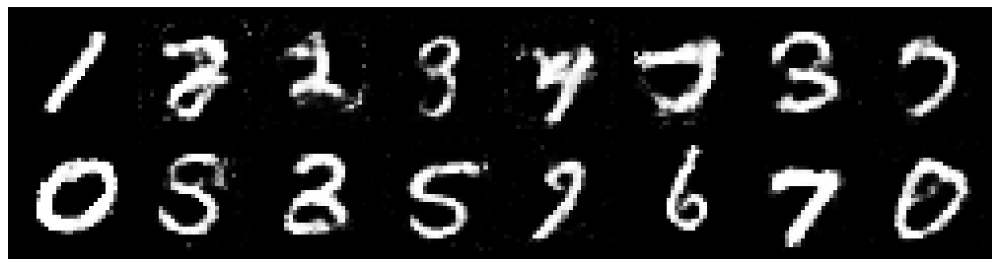

Epoch: [184/200], Batch Num: [200/600]
Discriminator Loss: 1.2958, Generator Loss: 0.7663
D(x): 0.5533, D(G(z)): 0.4579


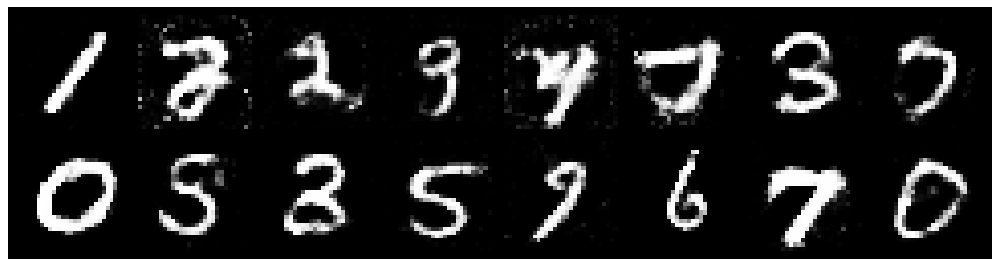

Epoch: [184/200], Batch Num: [400/600]
Discriminator Loss: 1.3441, Generator Loss: 0.8483
D(x): 0.5409, D(G(z)): 0.4693


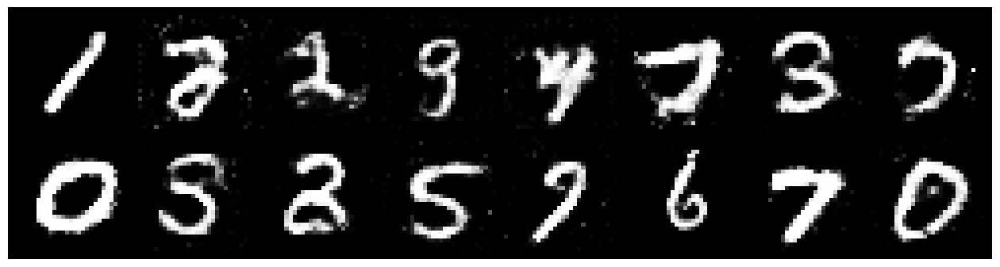

Epoch: [185/200], Batch Num: [0/600]
Discriminator Loss: 1.3164, Generator Loss: 0.8490
D(x): 0.5256, D(G(z)): 0.4263


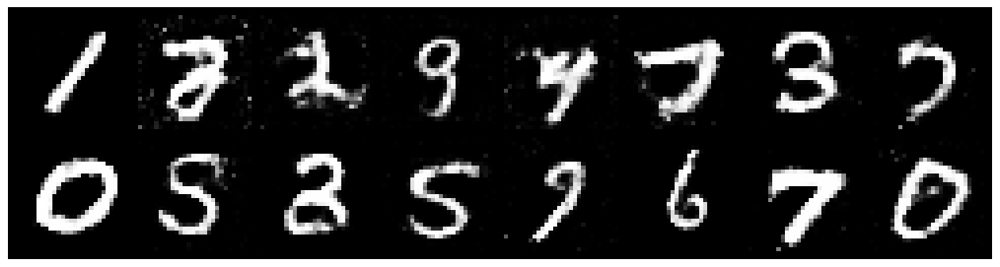

Epoch: [185/200], Batch Num: [200/600]
Discriminator Loss: 1.4203, Generator Loss: 0.9484
D(x): 0.5066, D(G(z)): 0.4569


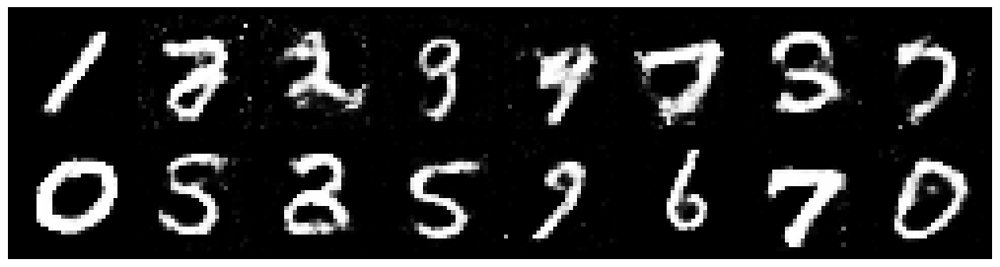

Epoch: [185/200], Batch Num: [400/600]
Discriminator Loss: 1.2594, Generator Loss: 0.9608
D(x): 0.5711, D(G(z)): 0.4550


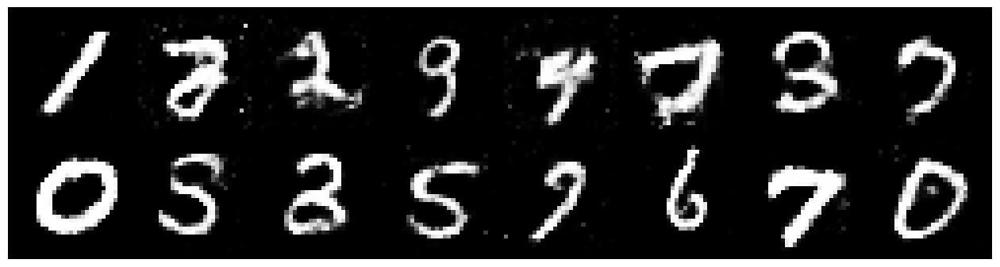

Epoch: [186/200], Batch Num: [0/600]
Discriminator Loss: 1.2365, Generator Loss: 0.9387
D(x): 0.5699, D(G(z)): 0.4408


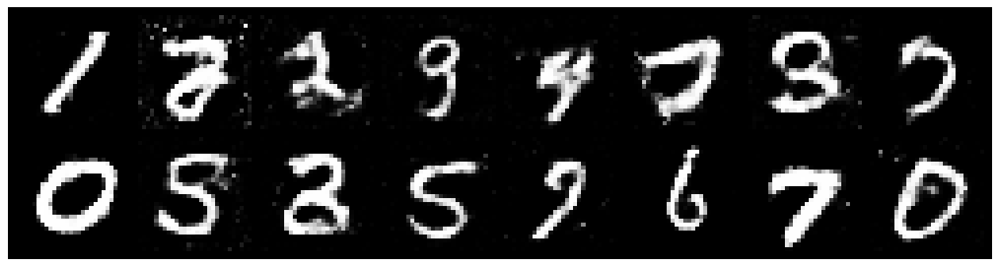

Epoch: [186/200], Batch Num: [200/600]
Discriminator Loss: 1.3320, Generator Loss: 0.8093
D(x): 0.5573, D(G(z)): 0.4842


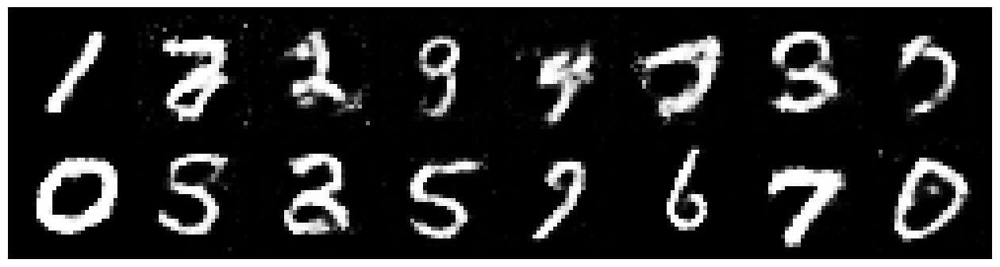

Epoch: [186/200], Batch Num: [400/600]
Discriminator Loss: 1.3952, Generator Loss: 0.9304
D(x): 0.5275, D(G(z)): 0.4519


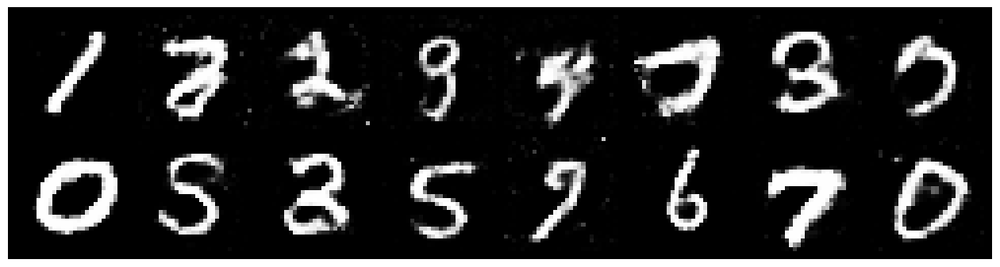

Epoch: [187/200], Batch Num: [0/600]
Discriminator Loss: 1.2528, Generator Loss: 1.1584
D(x): 0.5737, D(G(z)): 0.4237


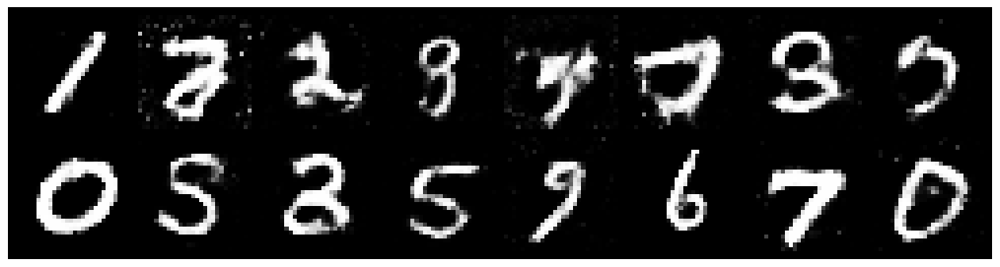

Epoch: [187/200], Batch Num: [200/600]
Discriminator Loss: 1.1174, Generator Loss: 0.8902
D(x): 0.6021, D(G(z)): 0.4042


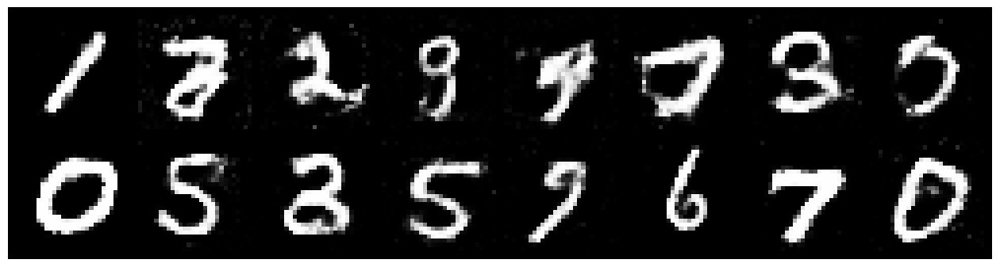

Epoch: [187/200], Batch Num: [400/600]
Discriminator Loss: 1.1999, Generator Loss: 0.9985
D(x): 0.5548, D(G(z)): 0.4105


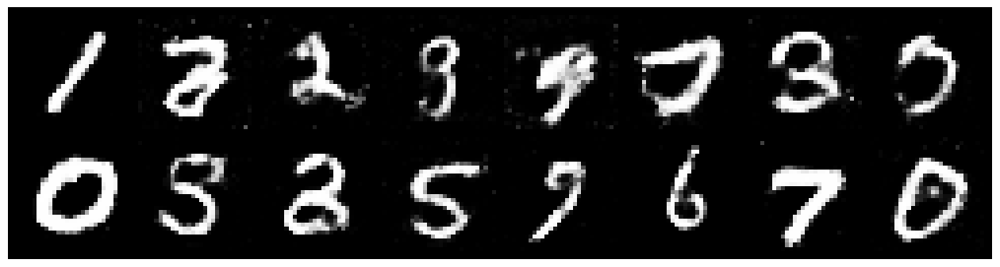

Epoch: [188/200], Batch Num: [0/600]
Discriminator Loss: 1.2376, Generator Loss: 0.9064
D(x): 0.5510, D(G(z)): 0.4101


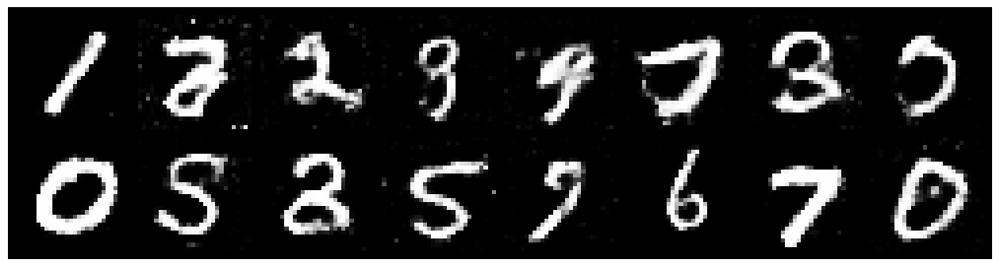

Epoch: [188/200], Batch Num: [200/600]
Discriminator Loss: 1.2961, Generator Loss: 0.9753
D(x): 0.5518, D(G(z)): 0.4460


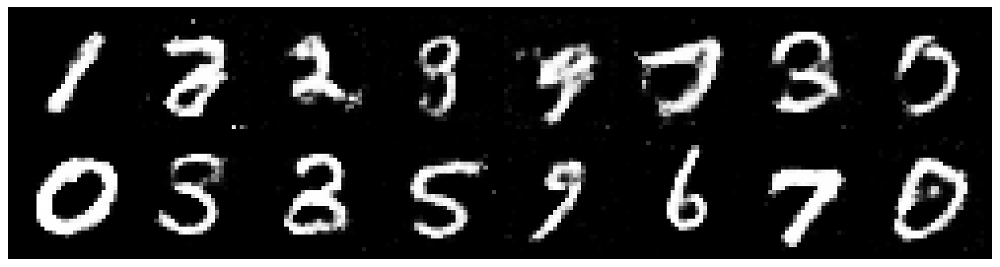

Epoch: [188/200], Batch Num: [400/600]
Discriminator Loss: 1.2697, Generator Loss: 0.9107
D(x): 0.5549, D(G(z)): 0.4254


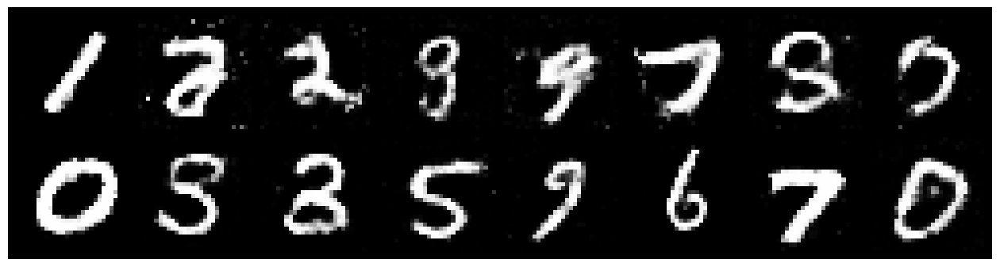

Epoch: [189/200], Batch Num: [0/600]
Discriminator Loss: 1.1540, Generator Loss: 1.0014
D(x): 0.5980, D(G(z)): 0.4135


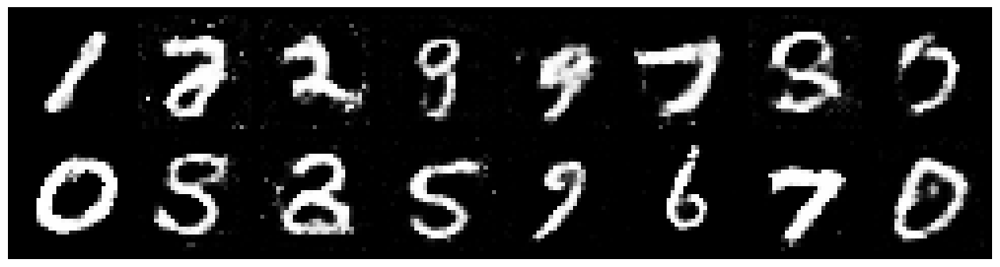

Epoch: [189/200], Batch Num: [200/600]
Discriminator Loss: 1.3924, Generator Loss: 0.8868
D(x): 0.6442, D(G(z)): 0.5522


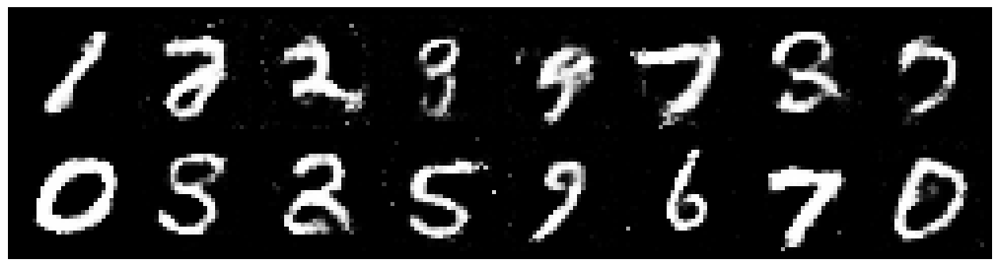

Epoch: [189/200], Batch Num: [400/600]
Discriminator Loss: 1.2415, Generator Loss: 0.9229
D(x): 0.5198, D(G(z)): 0.4016


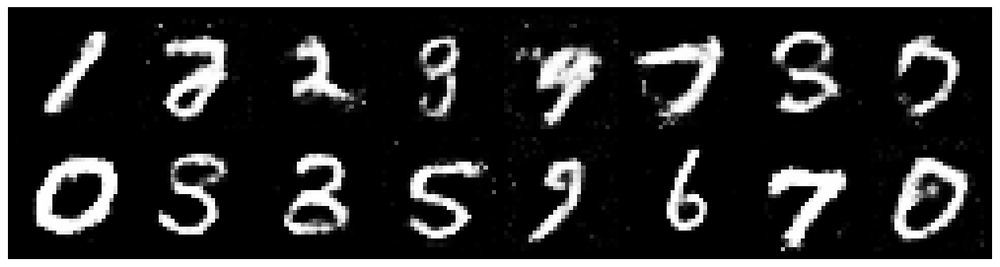

Epoch: [190/200], Batch Num: [0/600]
Discriminator Loss: 1.3655, Generator Loss: 1.0418
D(x): 0.5598, D(G(z)): 0.4570


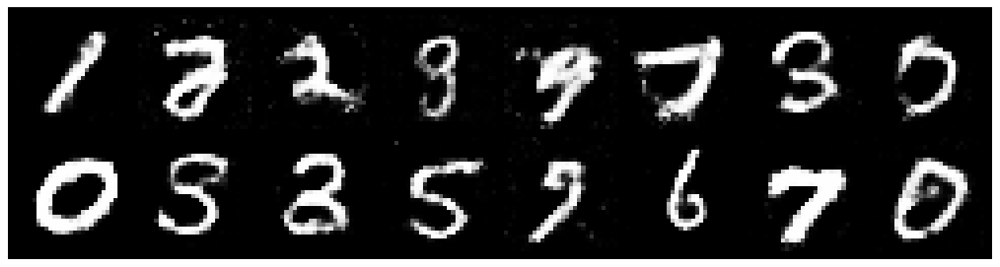

Epoch: [190/200], Batch Num: [200/600]
Discriminator Loss: 1.2507, Generator Loss: 0.9788
D(x): 0.5601, D(G(z)): 0.4207


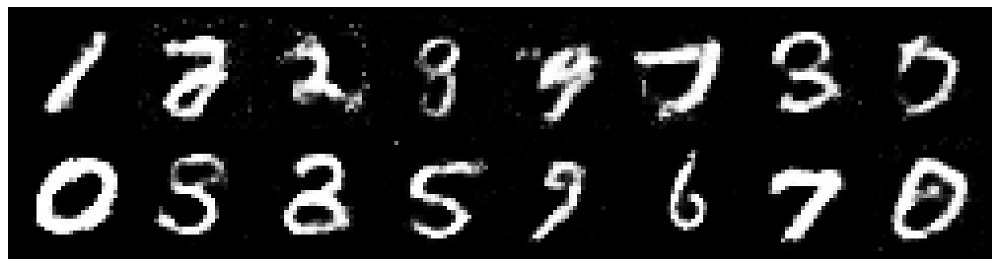

Epoch: [190/200], Batch Num: [400/600]
Discriminator Loss: 1.2947, Generator Loss: 1.0939
D(x): 0.5352, D(G(z)): 0.4080


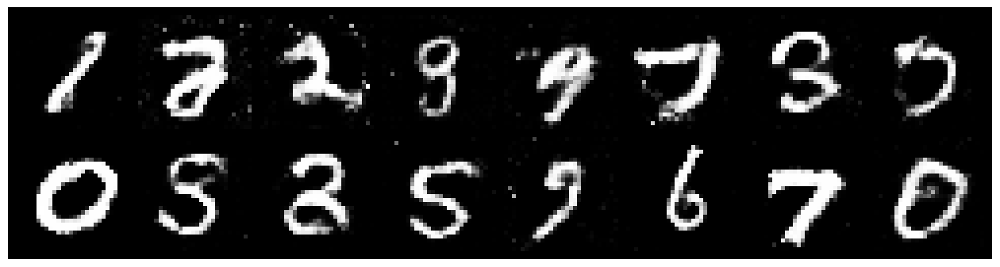

Epoch: [191/200], Batch Num: [0/600]
Discriminator Loss: 1.2630, Generator Loss: 0.9529
D(x): 0.5474, D(G(z)): 0.4353


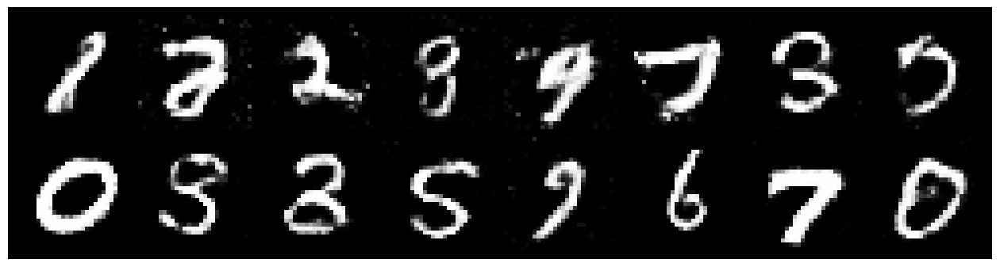

Epoch: [191/200], Batch Num: [200/600]
Discriminator Loss: 1.1899, Generator Loss: 1.1185
D(x): 0.5549, D(G(z)): 0.3836


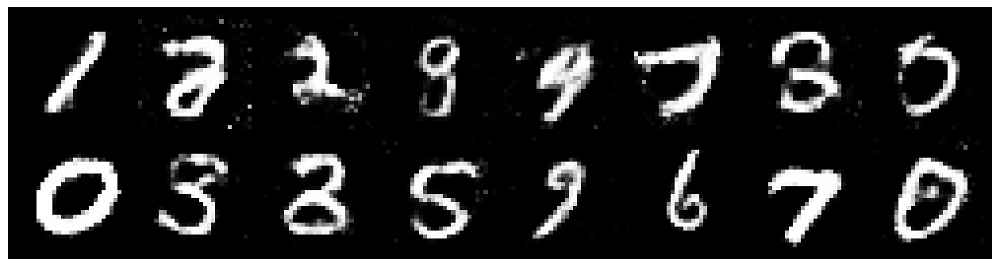

Epoch: [191/200], Batch Num: [400/600]
Discriminator Loss: 1.3131, Generator Loss: 0.8936
D(x): 0.5385, D(G(z)): 0.4452


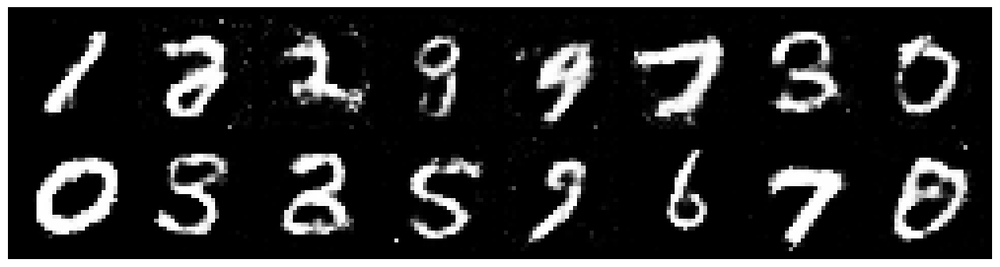

Epoch: [192/200], Batch Num: [0/600]
Discriminator Loss: 1.2539, Generator Loss: 0.8649
D(x): 0.5492, D(G(z)): 0.4260


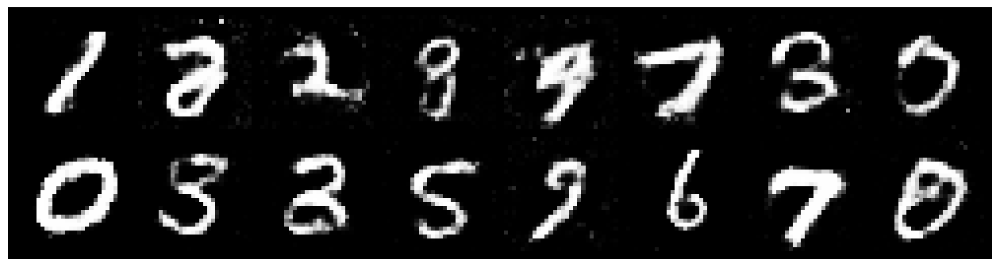

Epoch: [192/200], Batch Num: [200/600]
Discriminator Loss: 1.1919, Generator Loss: 0.8311
D(x): 0.5625, D(G(z)): 0.4084


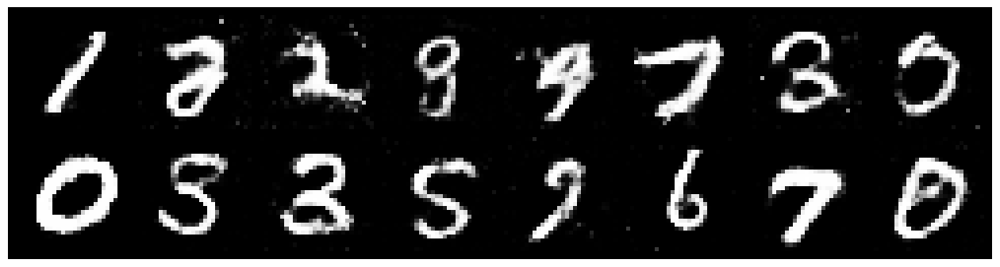

Epoch: [192/200], Batch Num: [400/600]
Discriminator Loss: 1.2309, Generator Loss: 0.9988
D(x): 0.5565, D(G(z)): 0.4234


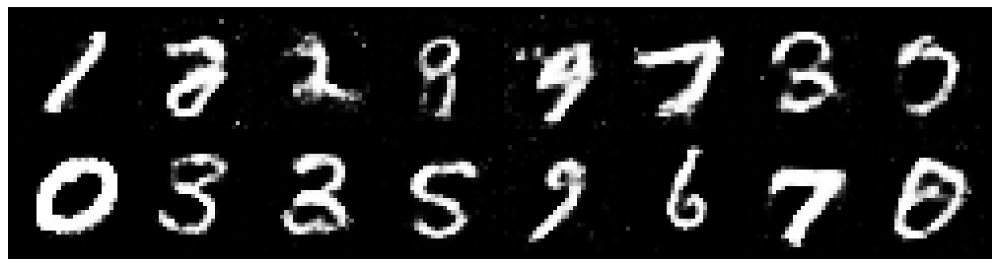

Epoch: [193/200], Batch Num: [0/600]
Discriminator Loss: 1.3341, Generator Loss: 0.8845
D(x): 0.5236, D(G(z)): 0.4352


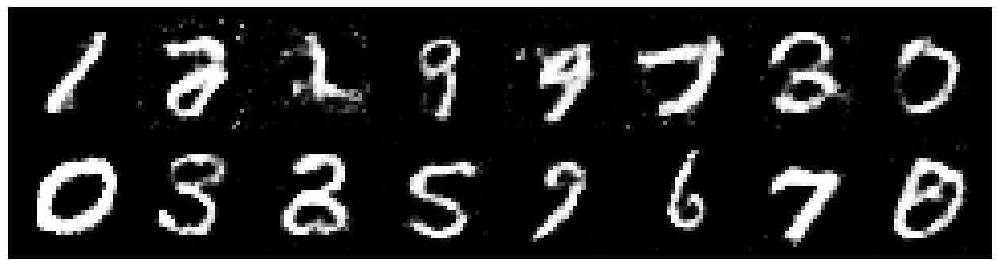

Epoch: [193/200], Batch Num: [200/600]
Discriminator Loss: 1.2843, Generator Loss: 1.0264
D(x): 0.5238, D(G(z)): 0.4047


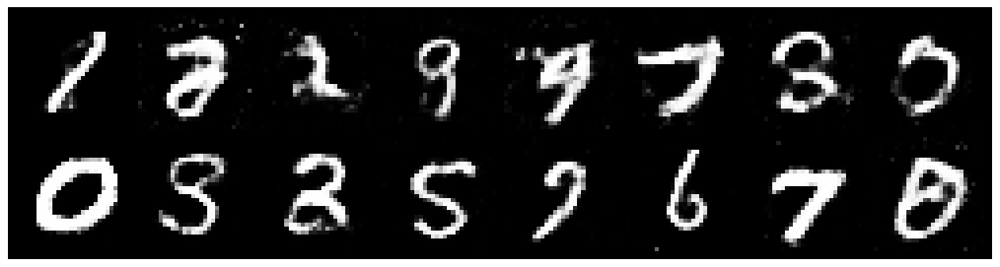

Epoch: [193/200], Batch Num: [400/600]
Discriminator Loss: 1.3766, Generator Loss: 0.8402
D(x): 0.5552, D(G(z)): 0.4844


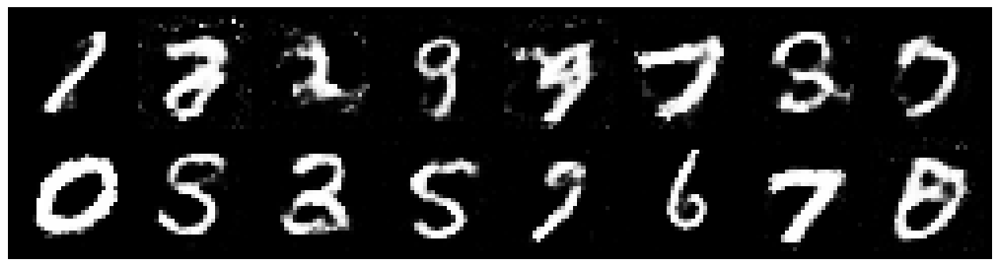

Epoch: [194/200], Batch Num: [0/600]
Discriminator Loss: 1.3160, Generator Loss: 0.9367
D(x): 0.5311, D(G(z)): 0.4375


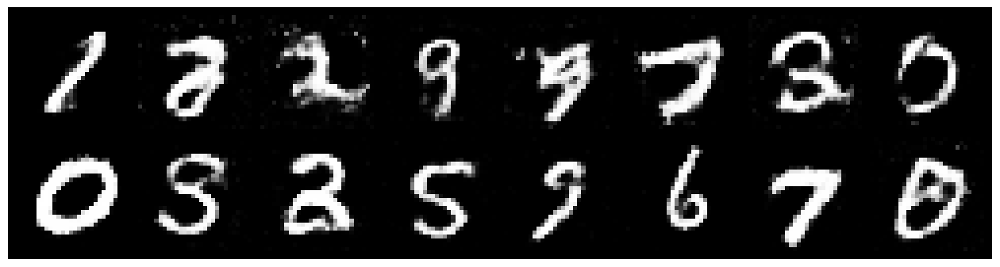

Epoch: [194/200], Batch Num: [200/600]
Discriminator Loss: 1.2968, Generator Loss: 0.8301
D(x): 0.5879, D(G(z)): 0.4770


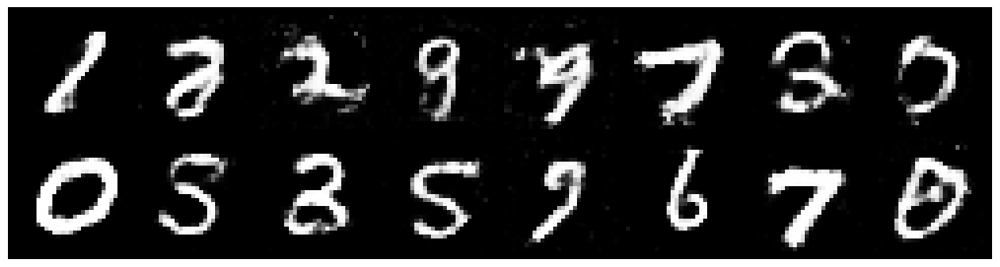

Epoch: [194/200], Batch Num: [400/600]
Discriminator Loss: 1.2979, Generator Loss: 0.8792
D(x): 0.5520, D(G(z)): 0.4517


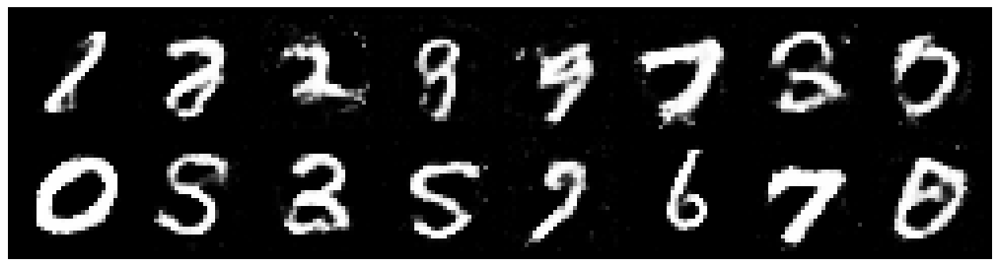

Epoch: [195/200], Batch Num: [0/600]
Discriminator Loss: 1.2069, Generator Loss: 0.8761
D(x): 0.6223, D(G(z)): 0.4616


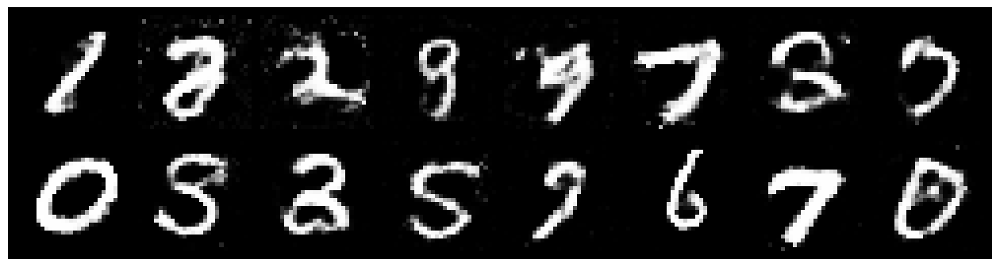

Epoch: [195/200], Batch Num: [200/600]
Discriminator Loss: 1.1208, Generator Loss: 1.0993
D(x): 0.6014, D(G(z)): 0.3926


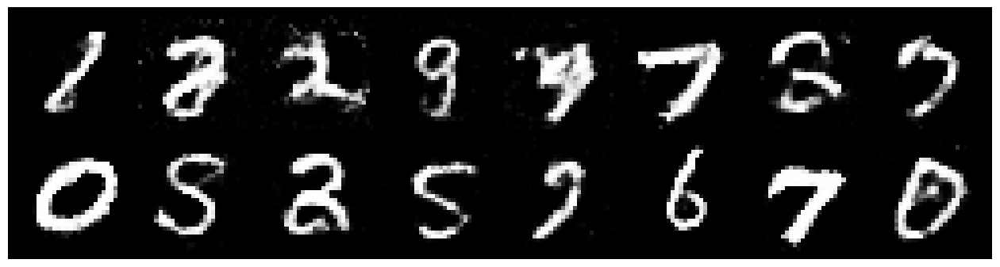

Epoch: [195/200], Batch Num: [400/600]
Discriminator Loss: 1.1606, Generator Loss: 0.9343
D(x): 0.5749, D(G(z)): 0.4150


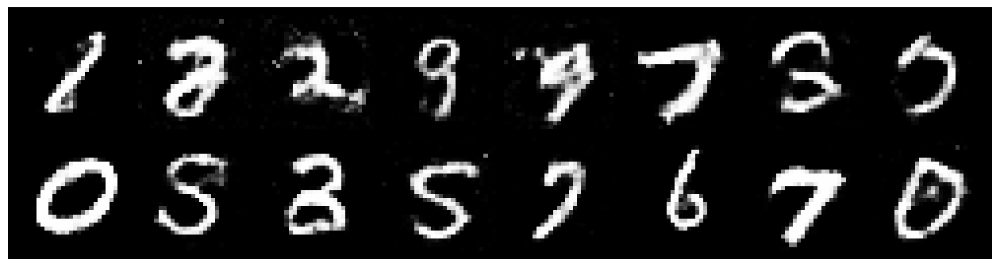

Epoch: [196/200], Batch Num: [0/600]
Discriminator Loss: 1.2533, Generator Loss: 0.9599
D(x): 0.5608, D(G(z)): 0.4397


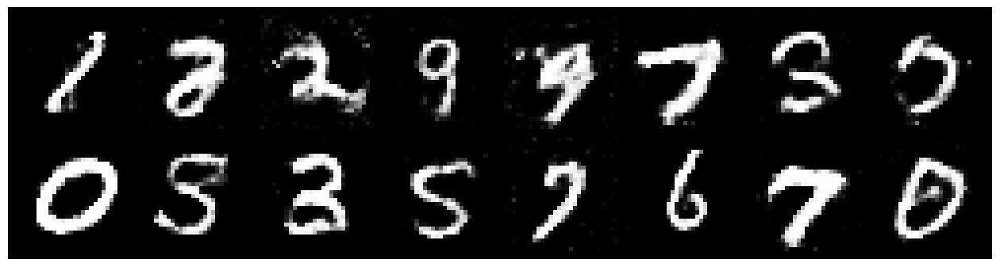

Epoch: [196/200], Batch Num: [200/600]
Discriminator Loss: 1.1812, Generator Loss: 0.8667
D(x): 0.5789, D(G(z)): 0.4252


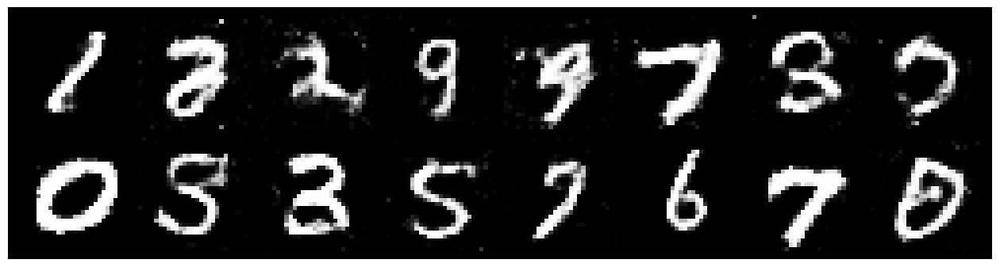

Epoch: [196/200], Batch Num: [400/600]
Discriminator Loss: 1.2273, Generator Loss: 0.8587
D(x): 0.5850, D(G(z)): 0.4454


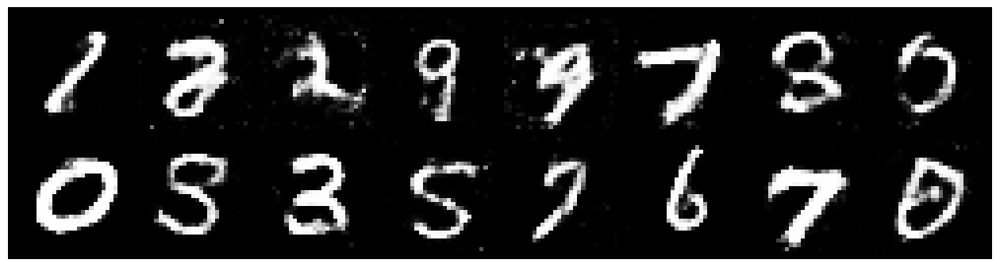

Epoch: [197/200], Batch Num: [0/600]
Discriminator Loss: 1.0931, Generator Loss: 1.1170
D(x): 0.5795, D(G(z)): 0.3780


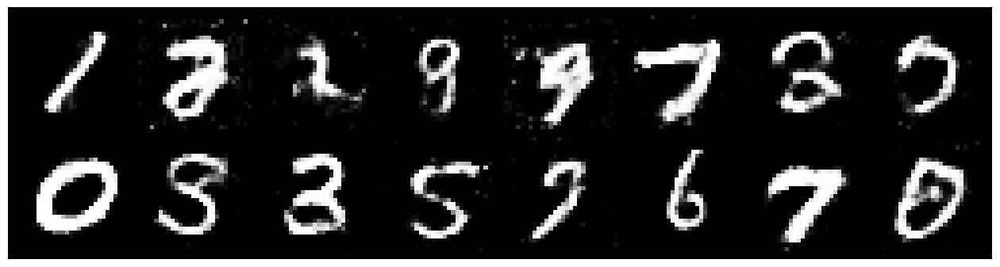

Epoch: [197/200], Batch Num: [200/600]
Discriminator Loss: 1.3141, Generator Loss: 0.9347
D(x): 0.5219, D(G(z)): 0.4452


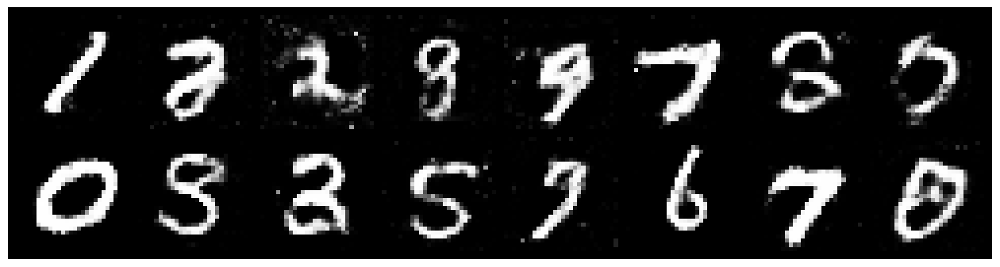

Epoch: [197/200], Batch Num: [400/600]
Discriminator Loss: 1.2098, Generator Loss: 0.9409
D(x): 0.5592, D(G(z)): 0.4191


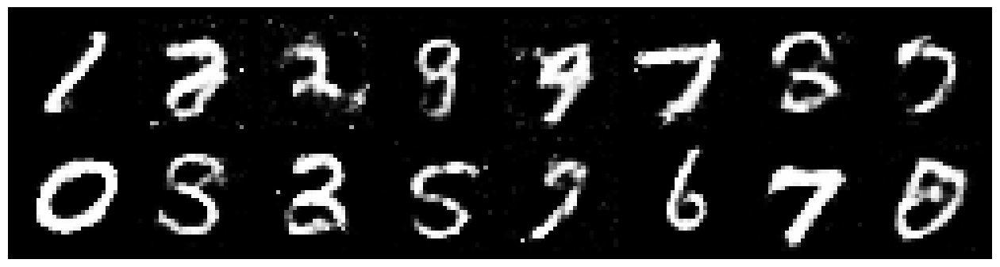

Epoch: [198/200], Batch Num: [0/600]
Discriminator Loss: 1.2688, Generator Loss: 0.9530
D(x): 0.5656, D(G(z)): 0.4493


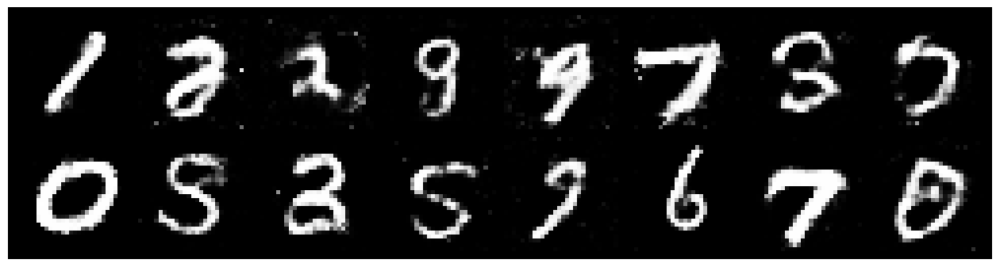

Epoch: [198/200], Batch Num: [200/600]
Discriminator Loss: 1.2446, Generator Loss: 1.0270
D(x): 0.5602, D(G(z)): 0.4409


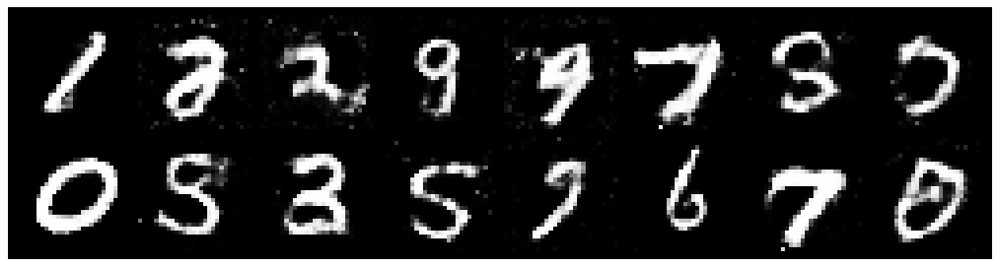

Epoch: [198/200], Batch Num: [400/600]
Discriminator Loss: 1.2010, Generator Loss: 0.8698
D(x): 0.5634, D(G(z)): 0.4248


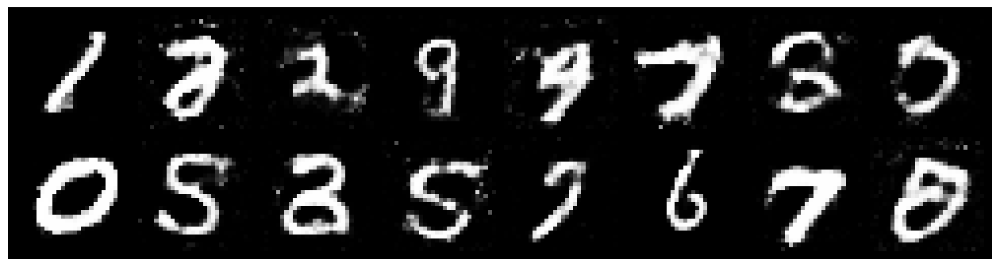

Epoch: [199/200], Batch Num: [0/600]
Discriminator Loss: 1.3445, Generator Loss: 0.9871
D(x): 0.4998, D(G(z)): 0.4048


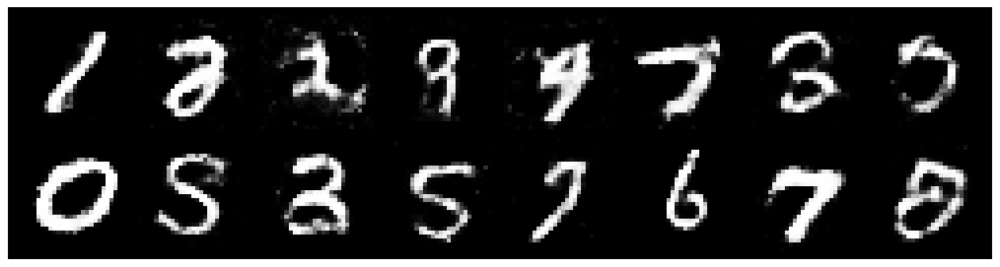

Epoch: [199/200], Batch Num: [200/600]
Discriminator Loss: 1.1787, Generator Loss: 1.0327
D(x): 0.5785, D(G(z)): 0.3982


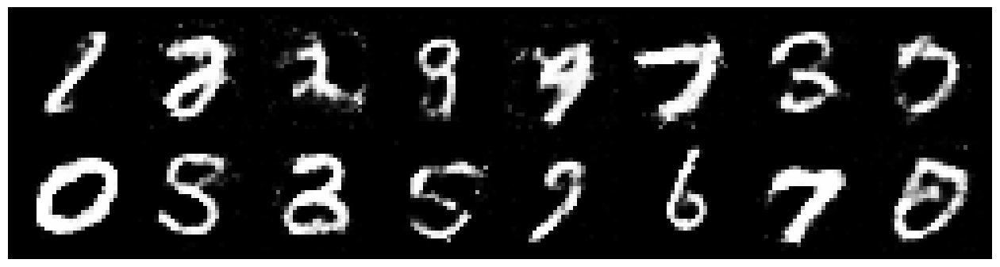

Epoch: [199/200], Batch Num: [400/600]
Discriminator Loss: 1.1801, Generator Loss: 1.1653
D(x): 0.5528, D(G(z)): 0.3972


In [110]:
logger = Logger(model_name='VGAN',data_name='MNIST')
num_epochs = 200
num_batches = len(data_loader)
for epoch in range(num_epochs):
    for n,(real_batch,_) in enumerate(data_loader):
        N = real_batch.size(0)
        real_data = Variable(img_to_vecs(real_batch))
        fake_data = gen(noise(N).to(device))
        d_err,real_pred,fake_pred = train_disc(d_optim,real_data,fake_data)
        fake_data = gen(noise(N).to(device))
        g_err = train_gen(g_optim,fake_data)

        logger.log(d_err,g_err,epoch,n,num_batches)

        if n%200 == 0:
            test_images = vec_to_imgs(gen(test_noise.to(device))).cpu()
            test_images = test_images.data
            logger.log_images(
                test_images, num_test_samples, 
                epoch, n, num_batches
            );
            # Display status Logs
            logger.display_status(
                epoch, num_epochs, n, num_batches,
                d_err, g_err, real_pred, fake_pred
            )
            

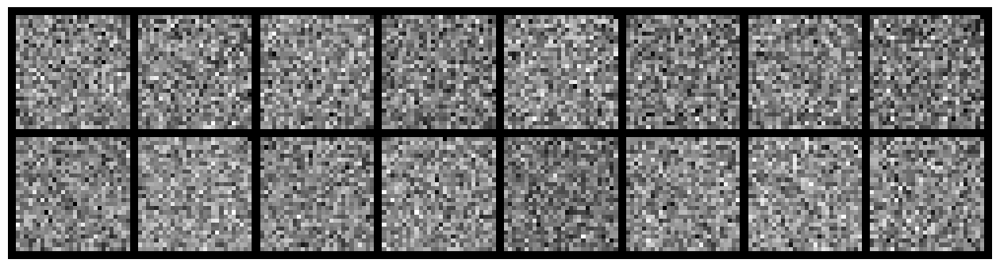

Epoch: [0/200], Batch Num: [0/600]
Discriminator Loss: 1.3758, Generator Loss: 0.6612
D(x): 0.5222, D(G(z)): 0.5161


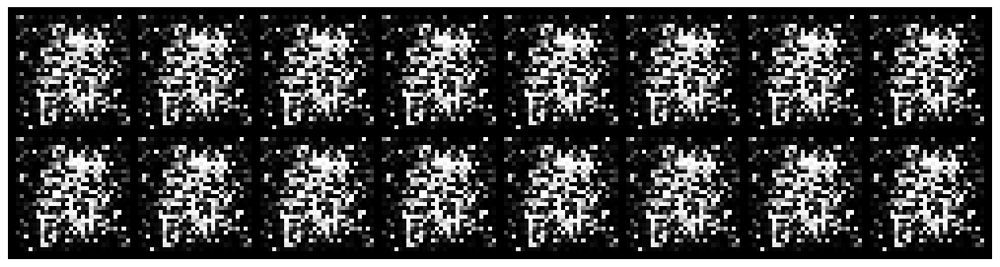

Epoch: [0/200], Batch Num: [200/600]
Discriminator Loss: 0.3549, Generator Loss: 2.4213
D(x): 0.8832, D(G(z)): 0.2041


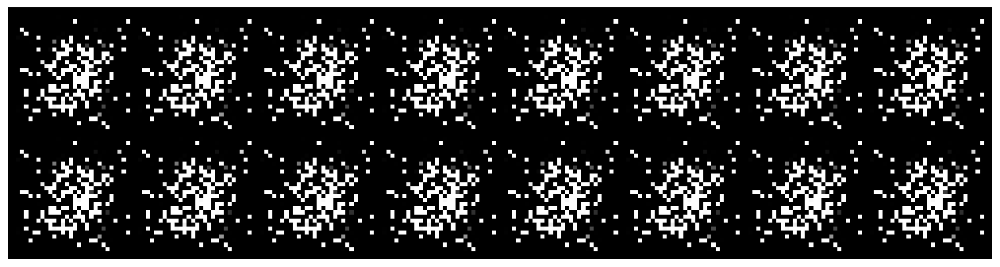

Epoch: [0/200], Batch Num: [400/600]
Discriminator Loss: 0.0136, Generator Loss: 5.9585
D(x): 0.9923, D(G(z)): 0.0054


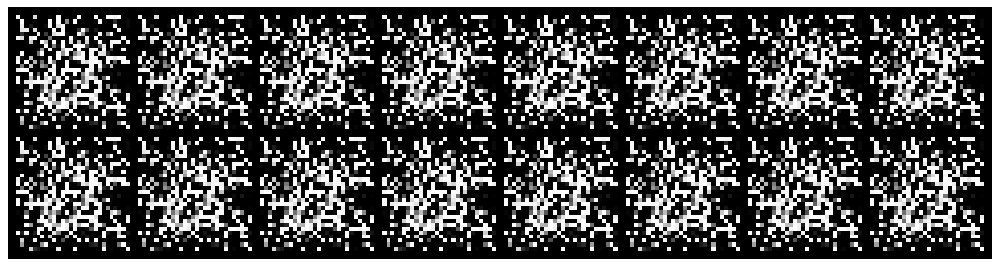

Epoch: [1/200], Batch Num: [0/600]
Discriminator Loss: 0.0182, Generator Loss: 6.6397
D(x): 0.9881, D(G(z)): 0.0059


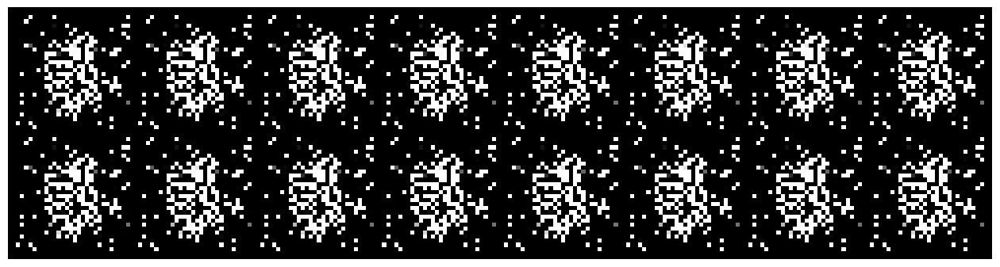

Epoch: [1/200], Batch Num: [200/600]
Discriminator Loss: 0.0024, Generator Loss: 7.9880
D(x): 0.9990, D(G(z)): 0.0013


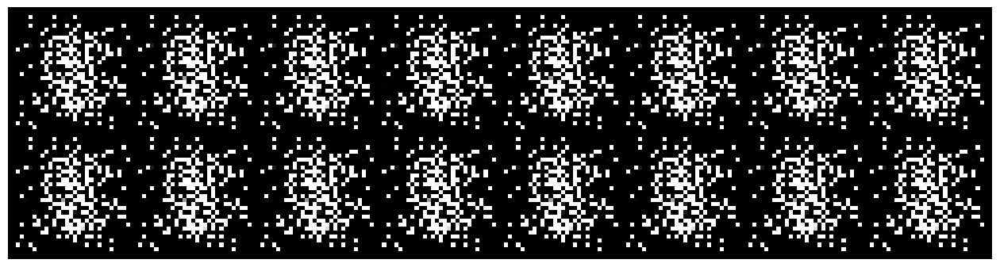

Epoch: [1/200], Batch Num: [400/600]
Discriminator Loss: 0.0011, Generator Loss: 9.1986
D(x): 0.9994, D(G(z)): 0.0005


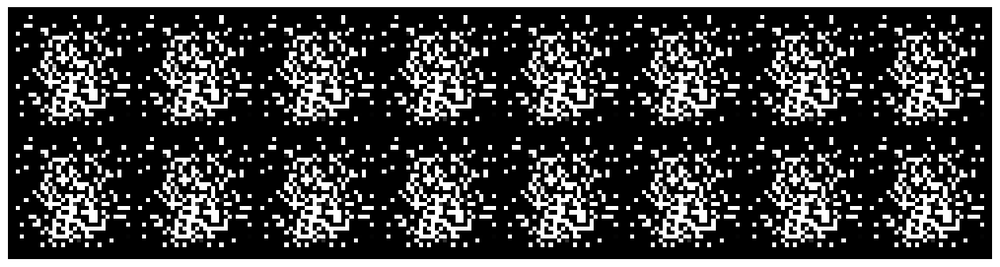

Epoch: [2/200], Batch Num: [0/600]
Discriminator Loss: 0.0008, Generator Loss: 8.7641
D(x): 0.9996, D(G(z)): 0.0004


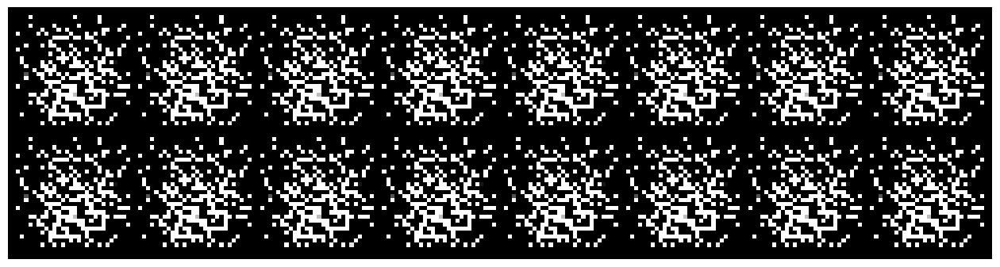

Epoch: [2/200], Batch Num: [200/600]
Discriminator Loss: 0.0006, Generator Loss: 9.4288
D(x): 0.9998, D(G(z)): 0.0004


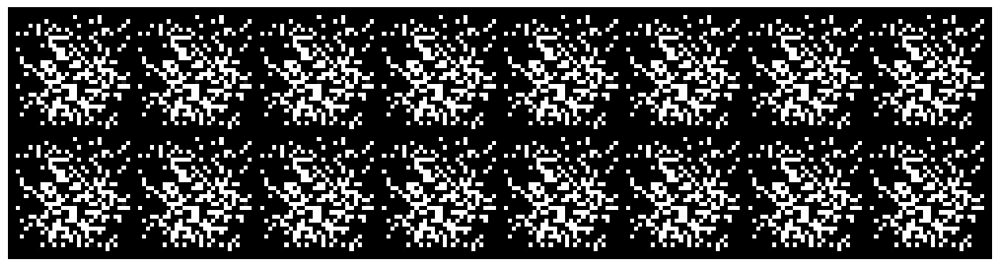

Epoch: [2/200], Batch Num: [400/600]
Discriminator Loss: 0.0004, Generator Loss: 8.6119
D(x): 0.9999, D(G(z)): 0.0003


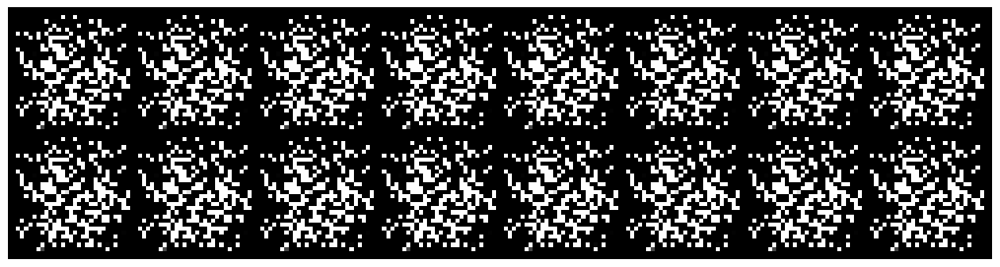

Epoch: [3/200], Batch Num: [0/600]
Discriminator Loss: 0.0002, Generator Loss: 10.4775
D(x): 0.9999, D(G(z)): 0.0001


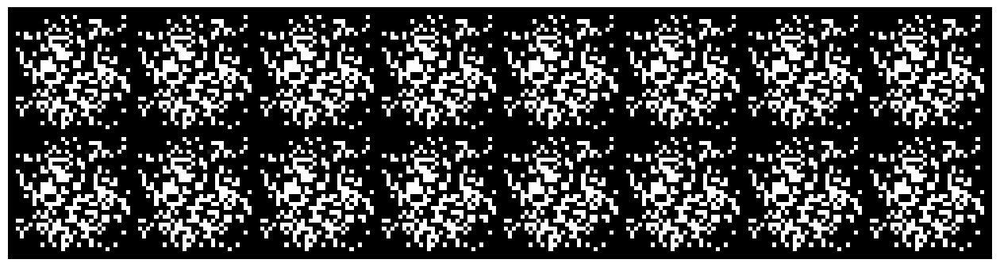

Epoch: [3/200], Batch Num: [200/600]
Discriminator Loss: 0.0002, Generator Loss: 10.5031
D(x): 0.9999, D(G(z)): 0.0001


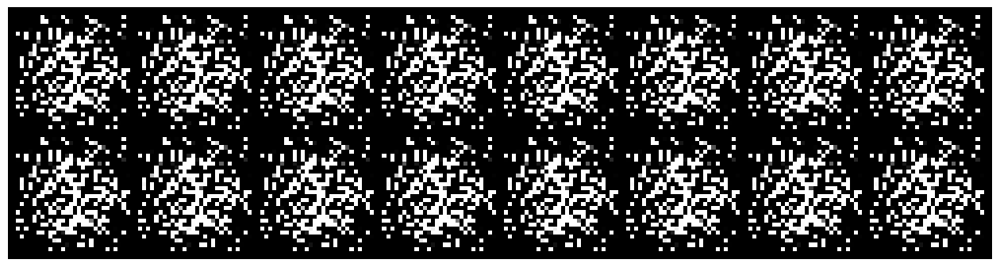

Epoch: [3/200], Batch Num: [400/600]
Discriminator Loss: 0.0002, Generator Loss: 9.9391
D(x): 1.0000, D(G(z)): 0.0002


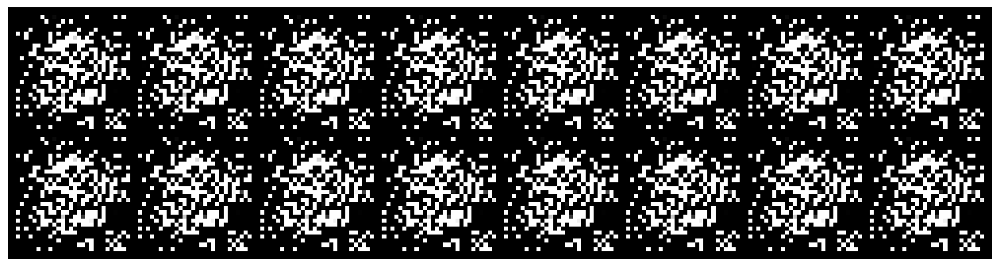

Epoch: [4/200], Batch Num: [0/600]
Discriminator Loss: 0.0002, Generator Loss: 10.5869
D(x): 0.9999, D(G(z)): 0.0001


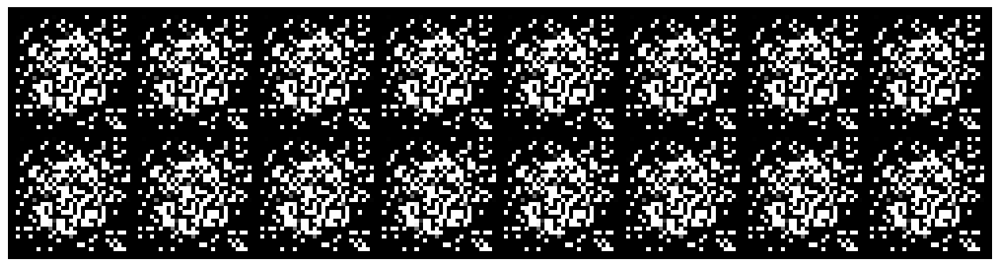

Epoch: [4/200], Batch Num: [200/600]
Discriminator Loss: 0.0001, Generator Loss: 10.1794
D(x): 1.0000, D(G(z)): 0.0001


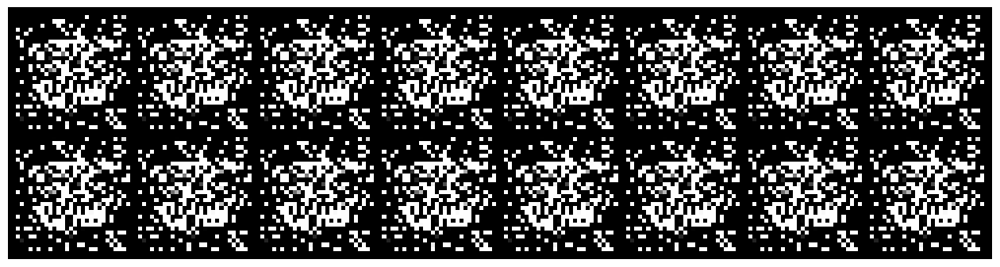

Epoch: [4/200], Batch Num: [400/600]
Discriminator Loss: 0.0001, Generator Loss: 10.5452
D(x): 0.9999, D(G(z)): 0.0000


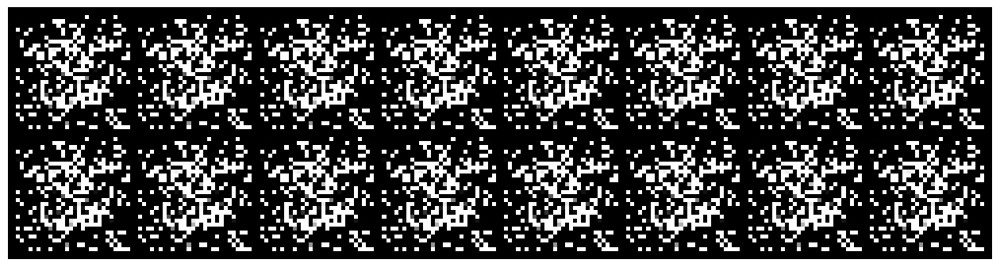

Epoch: [5/200], Batch Num: [0/600]
Discriminator Loss: 0.0002, Generator Loss: 11.0995
D(x): 0.9998, D(G(z)): 0.0000


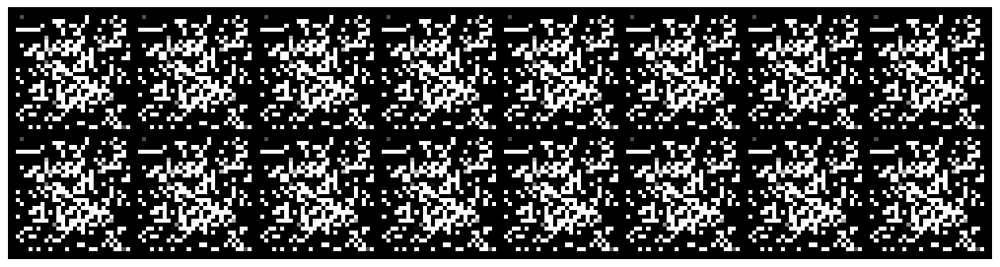

Epoch: [5/200], Batch Num: [200/600]
Discriminator Loss: 0.0000, Generator Loss: 11.3157
D(x): 1.0000, D(G(z)): 0.0000


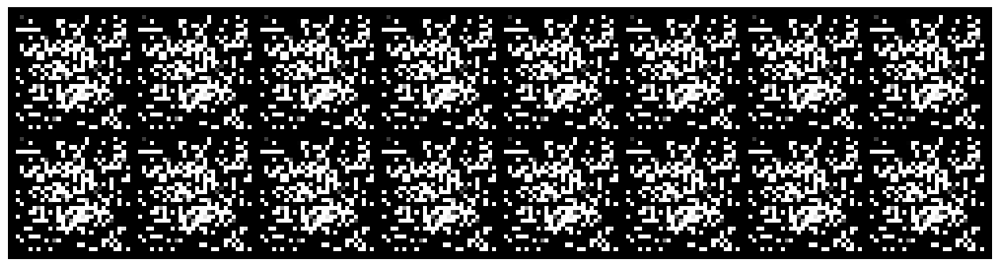

Epoch: [5/200], Batch Num: [400/600]
Discriminator Loss: 0.0000, Generator Loss: 11.8130
D(x): 1.0000, D(G(z)): 0.0000


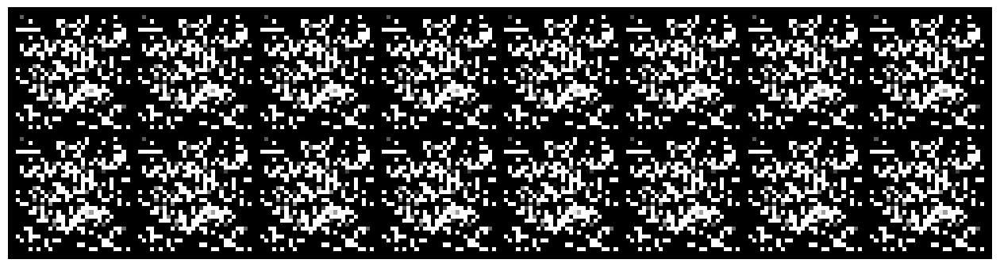

Epoch: [6/200], Batch Num: [0/600]
Discriminator Loss: 0.0000, Generator Loss: 12.2142
D(x): 1.0000, D(G(z)): 0.0000


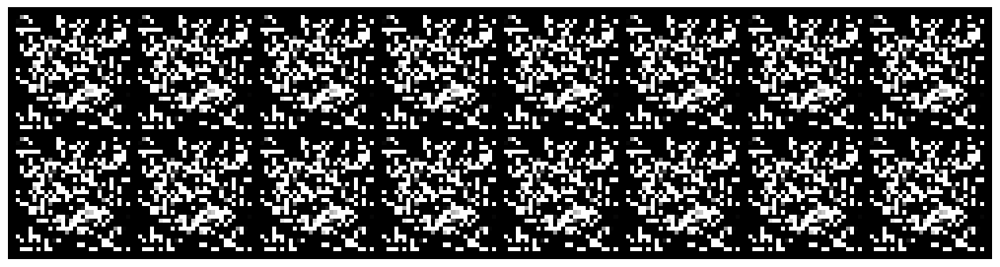

Epoch: [6/200], Batch Num: [200/600]
Discriminator Loss: 0.0000, Generator Loss: 12.1025
D(x): 1.0000, D(G(z)): 0.0000


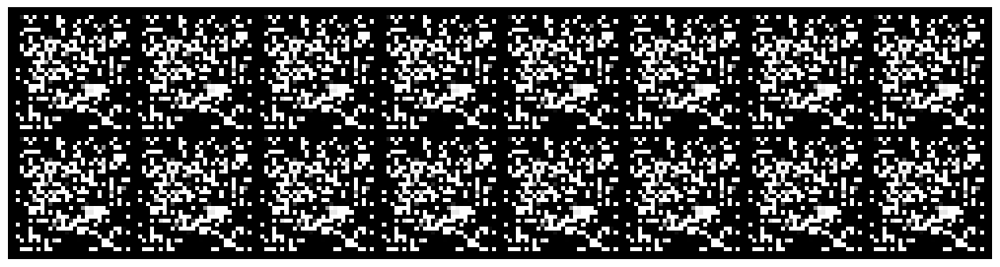

Epoch: [6/200], Batch Num: [400/600]
Discriminator Loss: 0.0000, Generator Loss: 11.7731
D(x): 1.0000, D(G(z)): 0.0000


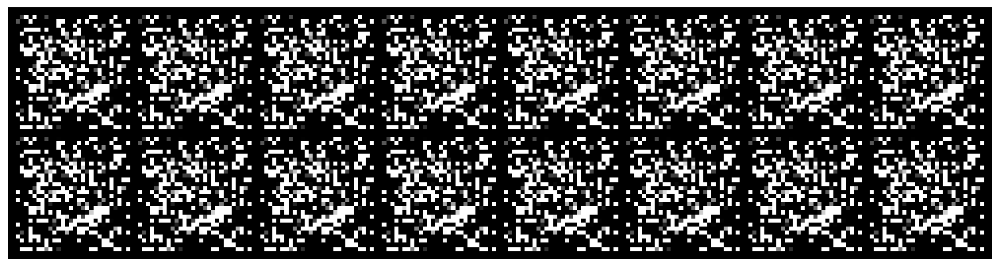

Epoch: [7/200], Batch Num: [0/600]
Discriminator Loss: 0.0000, Generator Loss: 13.0397
D(x): 1.0000, D(G(z)): 0.0000


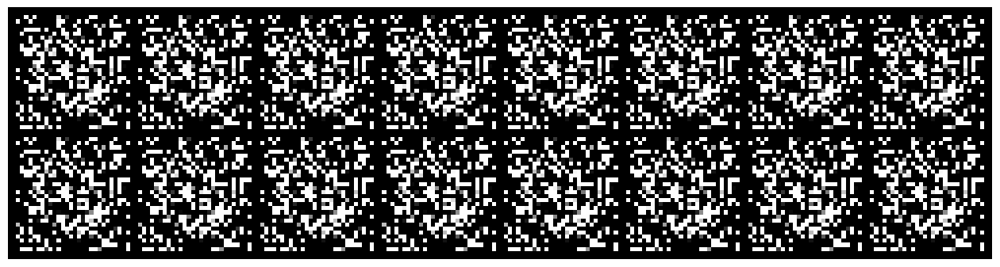

Epoch: [7/200], Batch Num: [200/600]
Discriminator Loss: 0.0000, Generator Loss: 12.9633
D(x): 1.0000, D(G(z)): 0.0000


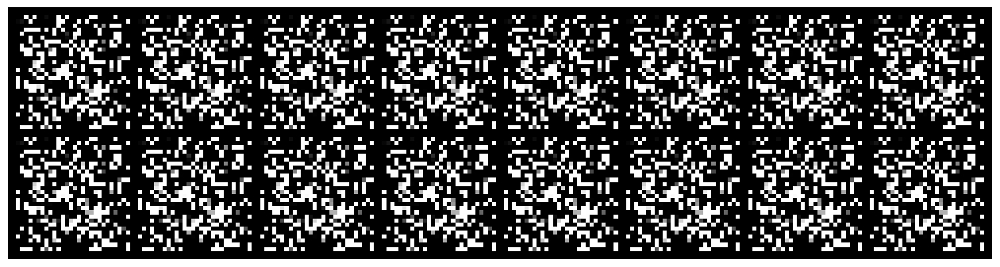

Epoch: [7/200], Batch Num: [400/600]
Discriminator Loss: 0.0000, Generator Loss: 12.4329
D(x): 1.0000, D(G(z)): 0.0000


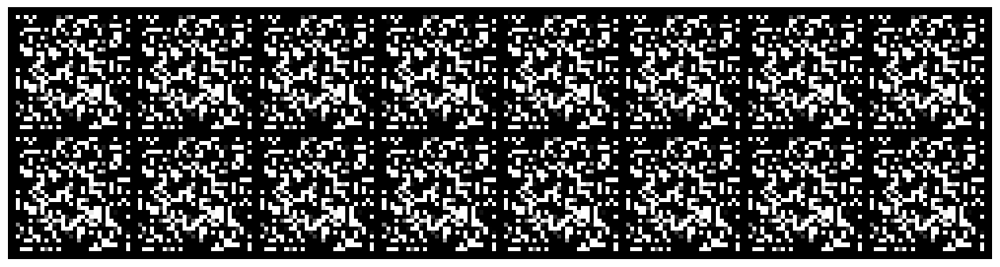

Epoch: [8/200], Batch Num: [0/600]
Discriminator Loss: 0.0000, Generator Loss: 11.4794
D(x): 1.0000, D(G(z)): 0.0000


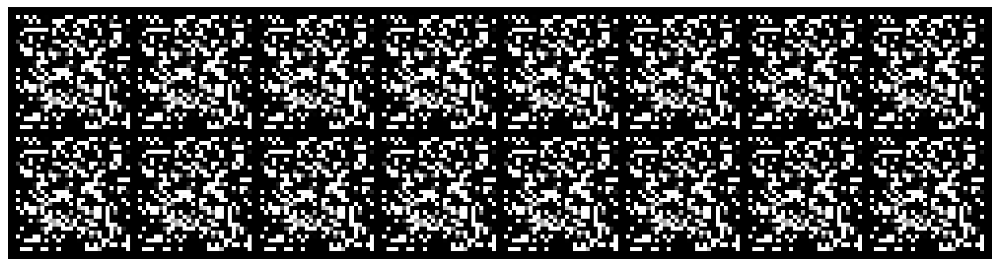

Epoch: [8/200], Batch Num: [200/600]
Discriminator Loss: 0.0000, Generator Loss: 12.9204
D(x): 1.0000, D(G(z)): 0.0000


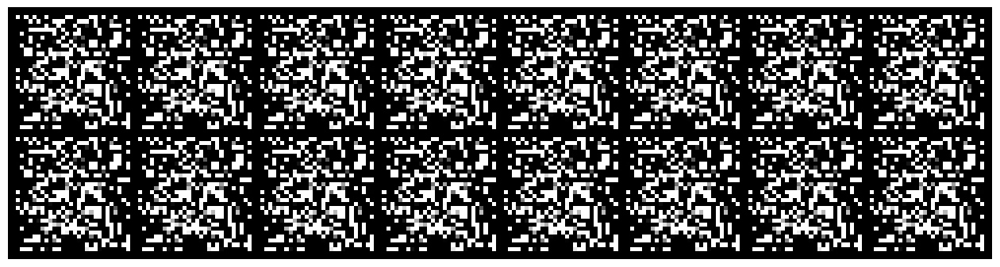

Epoch: [8/200], Batch Num: [400/600]
Discriminator Loss: 0.0000, Generator Loss: 11.8920
D(x): 1.0000, D(G(z)): 0.0000


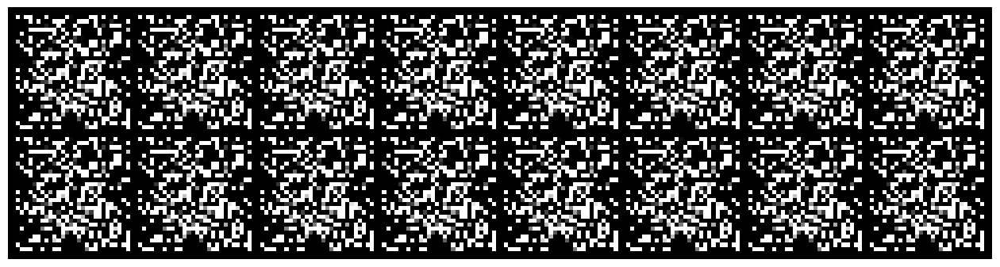

Epoch: [9/200], Batch Num: [0/600]
Discriminator Loss: 0.0000, Generator Loss: 13.1442
D(x): 1.0000, D(G(z)): 0.0000


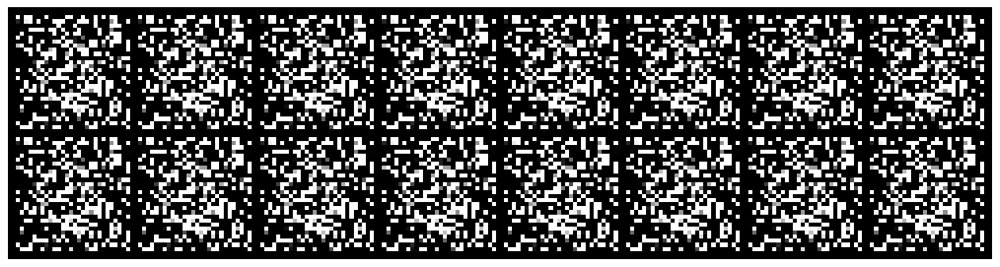

Epoch: [9/200], Batch Num: [200/600]
Discriminator Loss: 0.0000, Generator Loss: 12.8808
D(x): 1.0000, D(G(z)): 0.0000


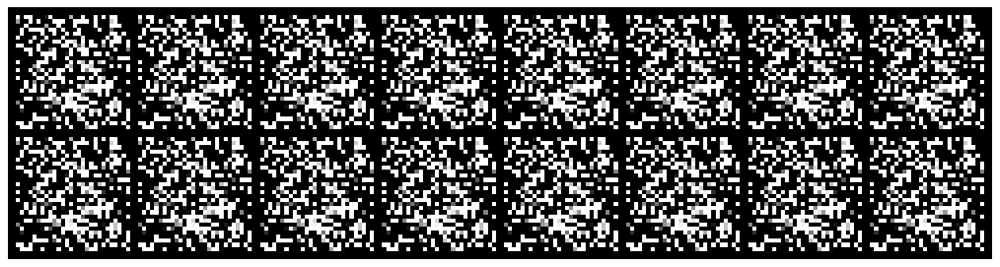

Epoch: [9/200], Batch Num: [400/600]
Discriminator Loss: 0.0000, Generator Loss: 13.5760
D(x): 1.0000, D(G(z)): 0.0000


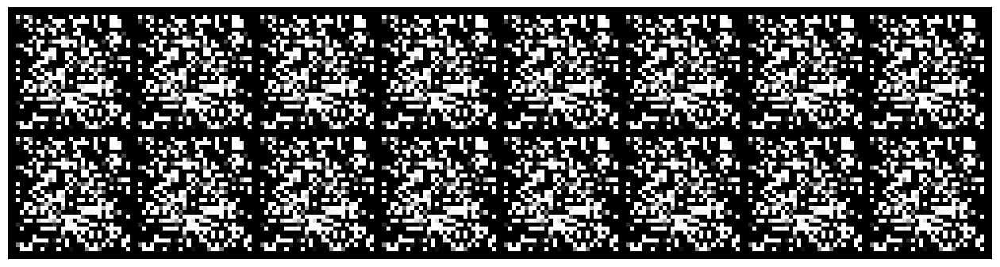

Epoch: [10/200], Batch Num: [0/600]
Discriminator Loss: 0.0000, Generator Loss: 13.9015
D(x): 1.0000, D(G(z)): 0.0000


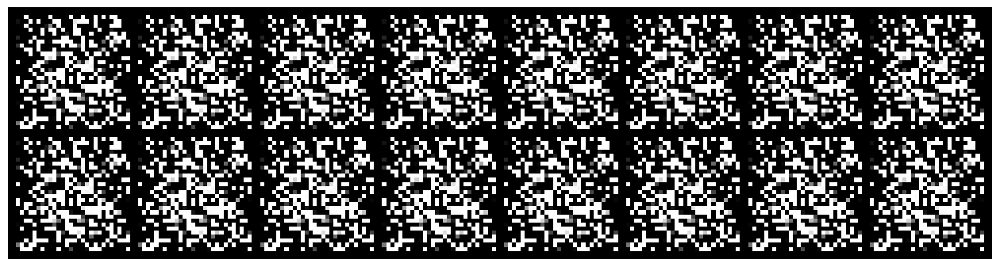

Epoch: [10/200], Batch Num: [200/600]
Discriminator Loss: 0.0000, Generator Loss: 13.6699
D(x): 1.0000, D(G(z)): 0.0000


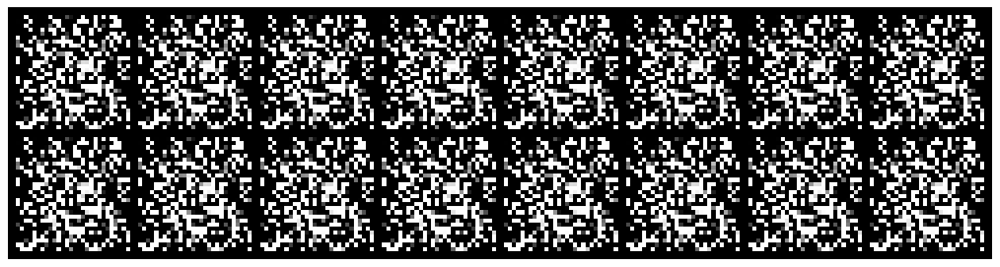

Epoch: [10/200], Batch Num: [400/600]
Discriminator Loss: 0.0000, Generator Loss: 14.3315
D(x): 1.0000, D(G(z)): 0.0000


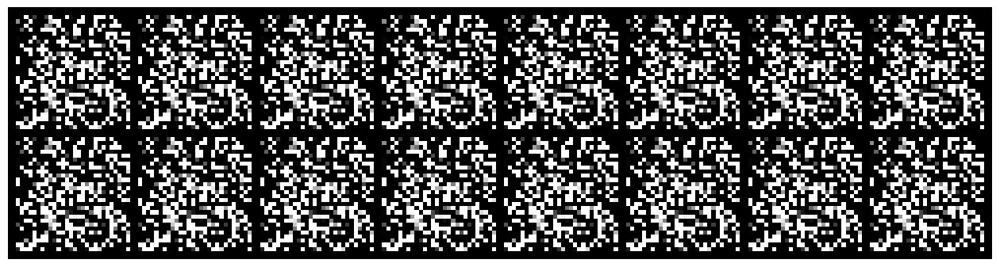

Epoch: [11/200], Batch Num: [0/600]
Discriminator Loss: 0.0000, Generator Loss: 14.0663
D(x): 1.0000, D(G(z)): 0.0000


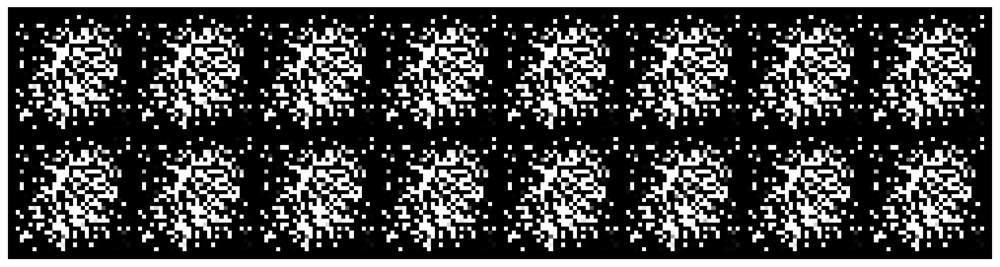

Epoch: [11/200], Batch Num: [200/600]
Discriminator Loss: 0.0089, Generator Loss: 6.5600
D(x): 0.9996, D(G(z)): 0.0082


KeyboardInterrupt: 

In [218]:
logger = Logger(model_name='VGAN',data_name='MNIST')
num_epochs = 200
num_batches = len(data_loader)
for epoch in range(num_epochs):
    for n,(real_batch,_) in enumerate(data_loader):
        N = real_batch.size(0)
        real_data = Variable(img_to_vecs(real_batch))
        fake_data = gen(noise(N).to(device))
        d_err,real_pred,fake_pred = train_disc(d_optim,real_data,fake_data)
        fake_data = gen(noise(N).to(device))
        g_err = train_gen(g_optim,fake_data)

        logger.log(d_err,g_err,epoch,n,num_batches)

        if n%200 == 0:
            test_images = vec_to_imgs(gen(test_noise.to(device))).cpu()
            test_images = test_images.data
            logger.log_images(
                test_images, num_test_samples, 
                epoch, n, num_batches
            );
            # Display status Logs
            logger.display_status(
                epoch, num_epochs, n, num_batches,
                d_err, g_err, real_pred, fake_pred
            )
            